Previous notebook is `/pscratch/sd/y/yaswante/MyQuota/roman_lsst/LSST_Roman_Butler_Calls.ipynb`.

In [1]:
import os, re, json, time, gc, sys, glob, random, traceback, pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset

from astropy.visualization import AsinhStretch, MinMaxInterval, ImageNormalize
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
import astropy.units as u
from astropy.io import fits
from collections import defaultdict, namedtuple

from lsst.afw.image import exposure
from lsst.afw.image import ExposureF
import lsst.afw.display as afwDisplay
import lsst.geom as geom
from lssafw.fits import makeLimitedFitsHeader, readMetadata
from lsst.ip.diffim import GetTemplateTask
from lsst.afw.geom import makeSkyWcs

import multiprocessing as mp
from functools import partial
from tqdm import tqdm
pd.options.mode.chained_assignment = None

In [2]:
# --- Setup LSST Skymap ---
# We needed to load in our skymap from a pickle file as 
# there's currently no way to get the dr6 repo in the Butler that exists in desc-stack-weekly
# and we need desc-stack-weekly for GetTemplateTask
with open('/pscratch/sd/y/yaswante/MyQuota/roman_lsst/dr6_deepCoadd_skyMap.pkl', 'rb') as f:
    skymap = pickle.load(f)

In [3]:
afwDisplay.setDefaultBackend('matplotlib')
def stretch_color(data, clipPercent):
    return np.percentile(data, (0 + clipPercent, 100 - clipPercent))

def asinh_norm(data, a=0.1):
    finite_data = data[np.isfinite(data)] # ensure no NaN or inf vals
    if len(finite_data) == 0:
        return ImageNormalize(vmin=0, vmax=1, stretch=AsinhStretch(a=a))
    # percentile-based limits
    vmin, vmax = np.percentile(finite_data, [1, 99])
    return ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch(a=a))

Let's start with processing a single tile.

# Processing A Single Tile

In [4]:
root_dir = '/pscratch/sd/y/yaswante/MyQuota/roman_lsst/'
lsst_dir = f'{root_dir}truth-lsst/'
roman_dir = f'{root_dir}truth-roman/'

In [5]:
TILE_LIST_FILE = f'{root_dir}700_tiles.txt'
with open(TILE_LIST_FILE, 'r') as f:
    tiles = [line.strip() for line in f if line.strip()]

In [6]:
chosen_tile = tiles[0]
chosen_tile

'50.94_-39.9'

## Preprocessing Catalogs and Exposures

In [7]:
tile_lsst_truth = pd.read_parquet(f'{lsst_dir}{chosen_tile}/full_truth_{chosen_tile}.parquet')
tile_lsst_det = pd.read_parquet(f'{lsst_dir}{chosen_tile}/full_det_{chosen_tile}.parquet')

In [8]:
print("tile_lsst_truth:", len(tile_lsst_truth['id'].unique()), "unique objects")
print("tile_lsst_det:", len(tile_lsst_det['objectId'].unique()), "unique objects")

tile_lsst_truth: 34196 unique objects
tile_lsst_det: 7978 unique objects


We need to know which of our cached LSST exposure objects are needed for each of the 225 cutouts. So, we'll need to create a "cutout-lsst_exp" map for our tile.

In [9]:
tile_tract_patch = tile_lsst_truth.groupby('tract')['patch'].apply(lambda x: sorted(x.unique())).to_dict()
for tract, patches in tile_tract_patch.items():
    print(f"Tract {tract}: {len(patches)} patches - {patches}")

Tract 3442: 4 patches - ['4,0', '4,1', '5,0', '5,1']


In [10]:
bands = ['u', 'g', 'r', 'i', 'z', 'y']
coaddIds = [
    {'tract': int(tract), 'patch': patch, 'filter': band} 
    for band in bands
    for tract, patches in tile_tract_patch.items()
    for patch in patches
]
print(f"We have {len(coaddIds)} dataIds we will need from cache.")

We have 24 dataIds we will need from cache.


In [20]:
coaddIds

[{'tract': 3076, 'patch': '0,5', 'filter': 'u'},
 {'tract': 3076, 'patch': '0,6', 'filter': 'u'},
 {'tract': 3076, 'patch': '1,5', 'filter': 'u'},
 {'tract': 3076, 'patch': '1,6', 'filter': 'u'},
 {'tract': 3076, 'patch': '0,5', 'filter': 'g'},
 {'tract': 3076, 'patch': '0,6', 'filter': 'g'},
 {'tract': 3076, 'patch': '1,5', 'filter': 'g'},
 {'tract': 3076, 'patch': '1,6', 'filter': 'g'},
 {'tract': 3076, 'patch': '0,5', 'filter': 'r'},
 {'tract': 3076, 'patch': '0,6', 'filter': 'r'},
 {'tract': 3076, 'patch': '1,5', 'filter': 'r'},
 {'tract': 3076, 'patch': '1,6', 'filter': 'r'},
 {'tract': 3076, 'patch': '0,5', 'filter': 'i'},
 {'tract': 3076, 'patch': '0,6', 'filter': 'i'},
 {'tract': 3076, 'patch': '1,5', 'filter': 'i'},
 {'tract': 3076, 'patch': '1,6', 'filter': 'i'},
 {'tract': 3076, 'patch': '0,5', 'filter': 'z'},
 {'tract': 3076, 'patch': '0,6', 'filter': 'z'},
 {'tract': 3076, 'patch': '1,5', 'filter': 'z'},
 {'tract': 3076, 'patch': '1,6', 'filter': 'z'},
 {'tract': 3076, 'pa

In [12]:
coaddId_filenames = [ f"tract{coaddId['tract']}_patch{coaddId['patch'].replace(',', '_')}_band{coaddId['filter']}.fits" 
                     for coaddId in coaddIds ]
exp_map = {
    fn: ExposureF(f"{root_dir}full_coadd_butler_striped/{fn}")
    for fn in coaddId_filenames
}

In [92]:
exp_map

{'tract3443_patch0_6_bandu.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcd31470>,
 'tract3443_patch1_6_bandu.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcec6f70>,
 'tract3633_patch3_0_bandu.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcfd60f0>,
 'tract3443_patch0_6_bandg.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcd48cf0>,
 'tract3443_patch1_6_bandg.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcd76f30>,
 'tract3633_patch3_0_bandg.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcd74470>,
 'tract3443_patch0_6_bandr.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcd757f0>,
 'tract3443_patch1_6_bandr.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcd74d70>,
 'tract3633_patch3_0_bandr.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcd485b0>,
 'tract3443_patch0_6_bandi.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dd0fd1f0>,
 'tract3443_patch1_6_bandi.fits': <lsst.afw.image._exposure.ExposureF at 0x7ff3dcd778f0>,
 'tract363

Loading mock image for tract 3076, patch 1,6...
Loading mock image for tract 3076, patch 0,6...
Loading mock image for tract 3076, patch 1,5...
Loading mock image for tract 3076, patch 0,5...


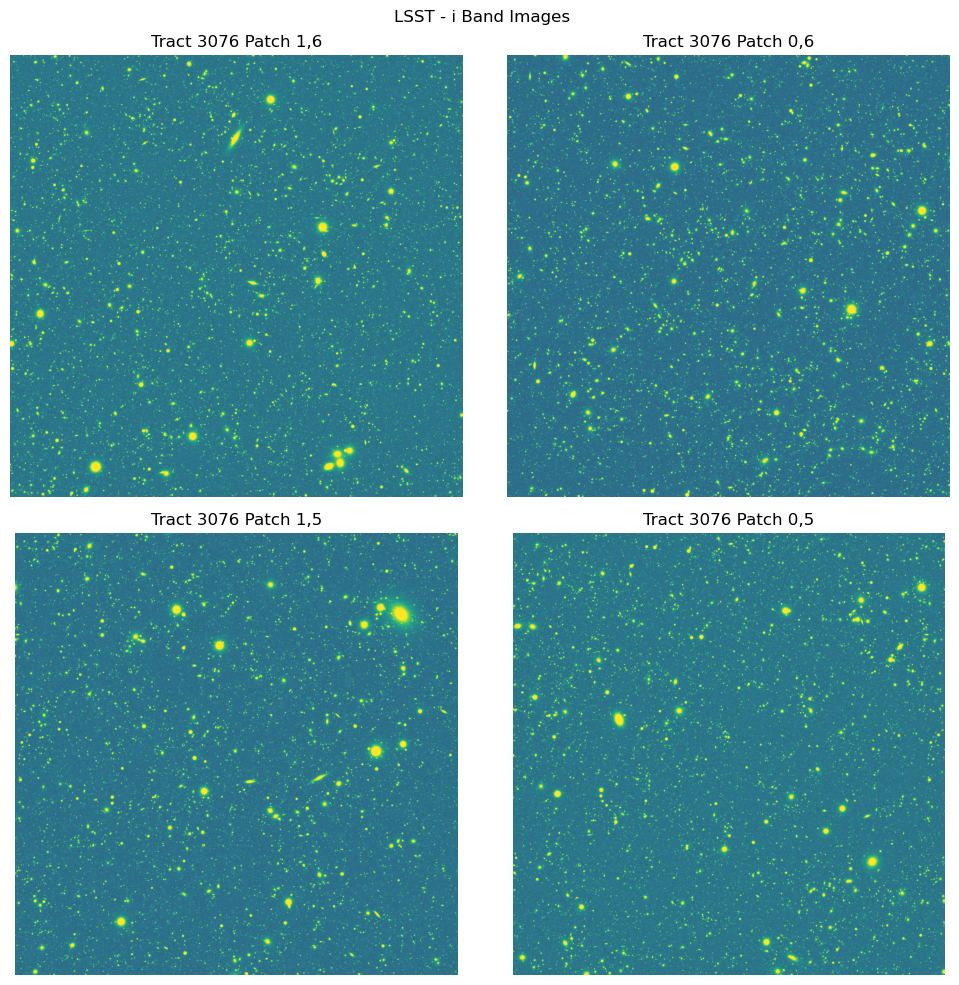

In [106]:
def get_mock_image(tract, patch):
    print(f"Loading mock image for tract {tract}, patch {patch}...")
    full_patch = exp_map[f"tract{tract}_patch{patch.replace(',', '_')}_bandi.fits"]
    lsst_iband_img = full_patch.image.array
    return lsst_iband_img

# override this with hardcoded grid if you know how the tracts and patches are arranged
# if not, default is each row is separated by tract and patches are just listed in sequential order
# grid_assignments = None
grid_assignments = [
    [("3076", "1,6"), ("3076", "0,6")],
    [("3076", "1,5"), ("3076", "0,5")],
]

if grid_assignments is None:
    all_tracts = list(tile_tract_patch.keys())
    n_tracts = len(all_tracts)
    n_patches_max = max(len(tile_tract_patch[tract]) for tract in all_tracts)

    fig, axs = plt.subplots(n_tracts, n_patches_max, figsize=(5 * n_patches_max, 5 * n_tracts))
    fig.suptitle('LSST - i Band Images')

    for i, tract in enumerate(all_tracts):
        patches = tile_tract_patch[tract]
        for j in range(n_patches_max):
            ax = axs[i, j] if n_tracts > 1 else axs[j]
            if j < len(patches):
                patch = patches[j]
                lsst_iband_img = get_mock_image(tract, patch)
                ax.imshow(
                    lsst_iband_img,
                    norm=asinh_norm(lsst_iband_img, a=0.1),
                    origin='lower',
                    cmap='viridis'
                )
                ax.set_title(f'Tract {tract} Patch {patch}')
                ax.axis('off')
            else:
                ax.axis('off')
else:
    n_rows = len(grid_assignments)
    n_cols = max(len(row) for row in grid_assignments)
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    fig.suptitle('LSST - i Band Images')

    for i, row in enumerate(grid_assignments):
        for j in range(n_cols):
            ax = axs[i, j] if n_rows > 1 else axs[j]
            entry = row[j] if j < len(row) else None
            if entry is not None:
                tract, patch = entry
                lsst_iband_img = get_mock_image(tract, patch)
                ax.imshow(
                    lsst_iband_img,
                    norm=asinh_norm(lsst_iband_img, a=0.1),
                    origin='lower',
                    cmap='viridis'
                )
                ax.set_title(f'Tract {tract} Patch {patch}')
                ax.axis('off')
            else:
                ax.axis('off')

plt.tight_layout()

In [13]:
def find_tract_patch(ra, dec, skymap):
    """
    Finds LSST tract and patch for a given RA & Dec
    Args:
        ra (np.ndarray) in degrees
        dec (np.ndarray) in degrees
        skymap: LSST skymap object obtained from Butler

    Returns:
        tract_ids & patch_idxs (np.ndarray)
    """
    try:
        spherePoints = [geom.SpherePoint(r * geom.degrees, d * geom.degrees) for r, d in zip(ra, dec)]
        tracts = [skymap.findTract(spherePoint) for spherePoint in spherePoints]
        patches = [patchInfo.getIndex() for spherePoint, tractInfo in zip(spherePoints, tracts) 
                      for patchInfo in [tractInfo.findPatch(spherePoint)]]
        patch_idxs = [",".join(map(str, idx)) for idx in patches]
        tract_ids = [tractInfo.getId() for tractInfo in tracts]

        return np.array(tract_ids), np.array(patch_idxs)
    except Exception as e: 
        print(f"Warning: Could not find tract/patch for some RA, Dec: {e}. Not within this skymap")
        return None, None

In [14]:
def cutout_metadata_map(tile, roman_dir, skymap, exp_map):
    """
    Creates a map linking each Roman cutout ID to the LSST tract(s) 
    and patch(es) it overlaps with as well as the RA/DEC boundaries

    Args:
        tile (str): Identifier for the tile being processed
        roman_dir (str): Root directory for the Roman truth data
        skymap: LSST skyMap object from the Butler
        exp_map: A pre-loaded dictionary of {filename: ExposureF} objects. 
    Returns:
        dict: Dict mapping cutout_id to a dict of 
            "tract_patches": list of unique (tract, patch) tuples,
            "bounds": RA/DEC min/max
    """
    cutout_map = {}
    print(f"Generating cutout-to-patch map for tile: {tile}...")
    for cutout_id in tqdm(range(225), desc="Mapping Cutouts"):
        roman_truth_path = f'{roman_dir}{tile}/truth_c{cutout_id}_{tile}.json'
        if not os.path.exists(roman_truth_path):
            cutout_map[cutout_id] = {'tract_patches': [], 'bounds': None}
            continue
        
        roman_truth_cat = pd.read_json(roman_truth_path, orient='records')
        if roman_truth_cat.empty:
            cutout_map[cutout_id] = {'tract_patches': [], 'bounds': None}
            continue
        
        ra_min, ra_max = roman_truth_cat['ra'].min(), roman_truth_cat['ra'].max()
        dec_min, dec_max = roman_truth_cat['dec'].min(), roman_truth_cat['dec'].max()
        bounds = {
            'ra_min': ra_min,
            'ra_max': ra_max,
            'dec_min': dec_min,
            'dec_max': dec_max,
        }
        # corner points of bbox
        corners = [
            (ra_min, dec_min), # bottom left
            (ra_min, dec_max), # top left
            (ra_max, dec_max), # top right
            (ra_max, dec_min), # bottom right
        ]
        corner_ras, corner_decs = zip(*corners)
        tracts, patches = find_tract_patch(np.array(corner_ras), np.array(corner_decs), skymap)
        if tracts is None or patches is None:
            cutout_map[cutout_id] = {'tract_patches': [], 'bounds': bounds}
            continue

        # combine and find unique (tract, patch) pairs
        # auto handles duplicates if corners fall in same patch
        unique_pairs = sorted(list(set(zip([int(t) for t in tracts], 
                                           [str(p) for p in patches]
                                          ))))

        anchor_tract_patch = (None, None)
        # Even if a cutout has corners that correspond to multipe tracts/patches, 
        # can its entire sky area bounding box fit completely inside just one of those candidate patches?
        # we ask this because all patches overlap one another, so there could be a case where all the corners 
        # are found in multiple tracts/patches but because of the overlap, they're the exact same coadd data.
        # another case could be that the bbox gets cutoff in one patch but is fully present in another patch (usually happens near the edge of a tract).
        if len(unique_pairs) > 1:
            single_patch = False
            for tract, patch in unique_pairs:
                key = f"tract{tract}_patch{patch.replace(',', '_')}_bandi.fits"
                lsst_exp = exp_map.get(key)
                if not lsst_exp:
                    raise(f"LSST exposure not found for {key}")
                corners_geom = [geom.SpherePoint(ra * geom.degrees, dec * geom.degrees) for ra, dec in corners]
                # cutout bbox using this patch's WCS
                wcs = lsst_exp.getWcs()
                corners_pixel = [wcs.skyToPixel(corner) for corner in corners_geom]
                x_coords = [p.getX() for p in corners_pixel]
                y_coords = [p.getY() for p in corners_pixel]
                min_x, max_x = int(np.floor(min(x_coords))), int(np.ceil(max(x_coords)))
                min_y, max_y = int(np.floor(min(y_coords))), int(np.ceil(max(y_coords)))
                cutout_bbox = geom.Box2I(geom.Point2I(min_x, min_y), geom.Point2I(max_x, max_y))
                # if our patch bbox fully contains the cutout_bbox, we keep this patch
                # and can discard the rest of the pairs in the list
                if lsst_exp.getBBox().contains(cutout_bbox):
                    single_patch = True
                    unique_pairs = [(tract, patch)]
                    break
            
            # if after checking all candidates, none contained the full bbox, it's a true multi-patch case
            # then only do we calculate the anchor tract/patch
            if not single_patch:
                center_ra = (ra_min + ra_max) / 2.0
                center_dec = (dec_min + dec_max) / 2.0
                center_tract_arr, center_patch_arr = find_tract_patch(np.array([center_ra]), np.array([center_dec]), skymap)            
                if center_tract_arr is not None:
                    anchor_tract_patch = (int(center_tract_arr[0]), str(center_patch_arr[0]))
        
        cutout_map[cutout_id] = {
            "tract_patches": unique_pairs,
            "bounds": bounds,
            "anchor_tract_patch": anchor_tract_patch
        }
    return cutout_map

In [15]:
cutout_map = cutout_metadata_map(chosen_tile, roman_dir, skymap, exp_map)

Generating cutout-to-patch map for tile: 50.94_-39.9...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 136.85it/s]


In [16]:
cutout_map
# [cid for cid, data in cutout_map.items() if len(data['tract_patches']) > 1]

{0: {'tract_patches': [(3442, '4,0')],
  'bounds': {'ra_min': 51.0149188415,
   'ra_max': 51.025343271,
   'dec_min': -40.0068649326,
   'dec_max': -39.9987697121},
  'anchor_tract_patch': (None, None)},
 1: {'tract_patches': [(3442, '4,0')],
  'bounds': {'ra_min': 51.0042334219,
   'ra_max': 51.0146029536,
   'dec_min': -40.0069197531,
   'dec_max': -39.9988987837},
  'anchor_tract_patch': (None, None)},
 2: {'tract_patches': [(3442, '4,0')],
  'bounds': {'ra_min': 50.9931195888,
   'ra_max': 51.0036233431,
   'dec_min': -40.006907294,
   'dec_max': -39.9988469682},
  'anchor_tract_patch': (None, None)},
 3: {'tract_patches': [(3442, '5,0')],
  'bounds': {'ra_min': 50.9822949444,
   'ra_max': 50.9925924939,
   'dec_min': -40.0068208083,
   'dec_max': -39.99889791},
  'anchor_tract_patch': (None, None)},
 4: {'tract_patches': [(3442, '5,0')],
  'bounds': {'ra_min': 50.971391231,
   'ra_max': 50.9819294991,
   'dec_min': -40.0068367628,
   'dec_max': -39.9988645011},
  'anchor_tract_pat

Since this tile had no overlapping tracts/patches, I wanted to find out if any other tiles did. After running `get_multipatch_tiles.py`, I found out that none of the tiles have a single cutout that has overlapping tracts/patches after passing our condition! This means that each corresponding Roman cutout has a corresponding LSST cutout within a single patch. This makes our lives much easier as we don't have to worry about stitching cutouts together.

## Processing a Single Cutout

In [17]:
tile_info = {
    "tile": chosen_tile,
    "roman_dir": roman_dir,
    "lsst_dir": lsst_dir,
}
tile_cats = {
    "truth": tile_lsst_truth,
    "det": tile_lsst_det,
}
tile_info

{'tile': '50.94_-39.9',
 'roman_dir': '/pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-roman/',
 'lsst_dir': '/pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/'}

In [18]:
cutout_id = 0
cutout_map[cutout_id]

{'tract_patches': [(3442, '4,0')],
 'bounds': {'ra_min': 51.0149188415,
  'ra_max': 51.025343271,
  'dec_min': -40.0068649326,
  'dec_max': -39.9987697121},
 'anchor_tract_patch': (None, None)}

### Single Band

In [29]:
tract_patch_pairs = cutout_map[cutout_id]['tract_patches']
if not tract_patch_pairs:
    print(f"Cutout {cutout_id} in {tile_info['tile']}: No overlapping tract_patch pairs found. Skipped.")
    raise Exception("Execution halted due to data schema mismatch.")
if len(tract_patch_pairs) > 1:
    # this should never occur for any tile in our dataset at least according to my battery of tests
    print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - Spans {len(tract_patch_pairs)} patches.")
    raise Exception("Execution halted due to data schema mismatch.")
    
tract, patch = tract_patch_pairs[0]
print(tract, patch)
# getting min/max RA/DEC to cut lsst image and lsst catalogs
bounds = cutout_map[cutout_id]['bounds']
if not bounds:
    print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - No boundaries found in map.")
    raise Exception("Execution halted due to data schema mismatch.")

ra_min, ra_max, dec_min, dec_max = (
    bounds['ra_min'],
    bounds['ra_max'],
    bounds['dec_min'],
    bounds['dec_max']
)
corners = [
    (ra_min, dec_min), # bottom left
    (ra_min, dec_max), # top left
    (ra_max, dec_max), # top right
    (ra_max, dec_min), # bottom right
]
corners_geom = [geom.SpherePoint(ra * geom.degrees, dec * geom.degrees) for ra, dec in corners]

3076 0,5


In [30]:
key = f"tract{tract}_patch{patch.replace(',', '_')}_bandi.fits"
lsst_exp = exp_map[key]
if not lsst_exp:
    raise FileNotFoundError(f"Cached exposure {key} not found in exp_map.")

print(f"LSST Patch Origin and Dimensions: {lsst_exp.getXY0()}, {lsst_exp.getDimensions()}")
print(f"LSST Patch BBox: {lsst_exp.getBBox()}")
lsst_exp_origin = lsst_exp.getXY0()

wcs = lsst_exp.getWcs()
corners_pixel = [wcs.skyToPixel(corner) for corner in corners_geom]
# min/max pixel coords to define the bounding box
x_coords = [p.getX() for p in corners_pixel]
y_coords = [p.getY() for p in corners_pixel]
# guarantee that resulting integer bbox completely encloses entire continuous area
min_x, max_x = int(np.floor(min(x_coords))), int(np.ceil(max(x_coords))) 
min_y, max_y = int(np.floor(min(y_coords))), int(np.ceil(max(y_coords)))
bbox = geom.Box2I(geom.Point2I(min_x, min_y), geom.Point2I(max_x, max_y))
print(f"LSST Cutout BBox: {bbox}")

LSST Patch Origin and Dimensions: (0, 19900), (4100, 4200)
LSST Patch BBox: (minimum=(0, 19900), maximum=(4099, 24099))
LSST Cutout BBox: (minimum=(3242, 23220), maximum=(3389, 23367))


#### Plotting Cutout BBox on Full Patch

(<mpl_toolkits.axes_grid1.inset_locator.BboxPatch at 0x7f6e45a6a000>,
 <mpl_toolkits.axes_grid1.inset_locator.BboxConnector at 0x7f6e31fcbbf0>)

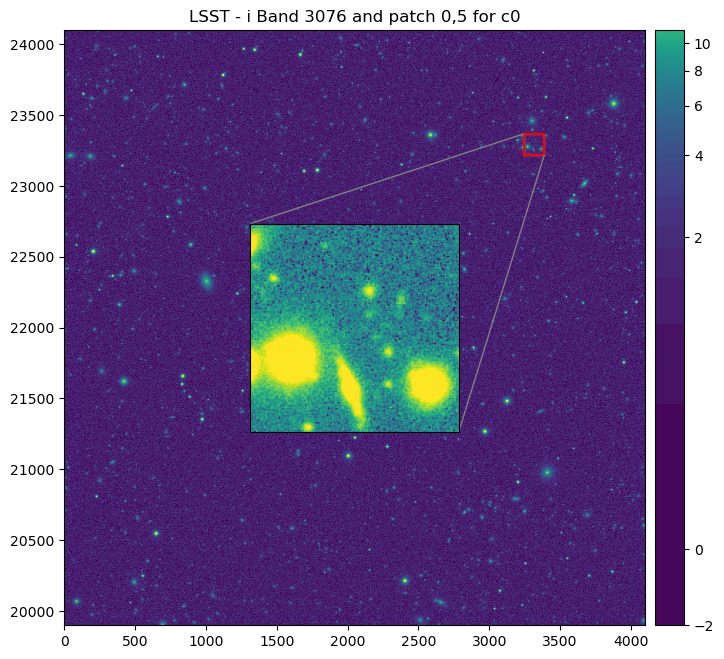

In [43]:
fig, ax = plt.subplots(figsize=(8,8))
# afwDisplay obj linked to axis
display = afwDisplay.Display(frame=fig)
display.setImageColormap('viridis')
display.scale('asinh', min=np.percentile(lsst_exp.image.array, 1), max=np.percentile(lsst_exp.image.array, 99.5), 
              unit='percent', Q=8)
display.mtv(lsst_exp.image)
corners = bbox.getCorners()
x_min_ax, x_max_ax = ax.get_xlim()
y_min_ax, y_max_ax = ax.get_ylim()
center_x = (x_min_ax + x_max_ax) / 2
center_y = (y_min_ax + y_max_ax) / 2

points = [(c.getX(), c.getY()) for c in corners]
points.append(points[0])  # close the box

display.line(points, ctype='red')
plt.title(f'LSST - i Band {tract} and patch {patch} for c{cutout_id}')

# inset of cutout (have to do this with matplotlib)
axins = zoomed_inset_axes(ax, zoom=10, loc='center')
# same img on the inset axes
extent = [lsst_exp_origin.getX(), 
          lsst_exp_origin.getX() + lsst_exp.getDimensions().getX(),
          lsst_exp_origin.getY(), 
          lsst_exp_origin.getY() + lsst_exp.getDimensions().getY()]
axins.imshow(lsst_exp.image.array, norm=asinh_norm(lsst_exp.image.array, a=0.1), 
             origin='lower', cmap='viridis', extent=extent)
# limits of inset axes to zoom region
# print("Inset min/max x and min/max y (in that order): ", min_x, max_x, min_y, max_y)
axins.set_xlim(min_x, max_x)
axins.set_ylim(min_y, max_y)
center_x_bbox = (min_x + max_x) / 2
center_y_bbox = (min_y + max_y) / 2
axins.set_xticks([])
axins.set_yticks([])

if center_x_bbox > center_x and center_y_bbox > center_y:
    # Top-right quadrant
    loc1 = 4  # Bottom-right of bbox in parent
    loc2 = 2  # Top-left of inset
elif center_x_bbox < center_x and center_y_bbox > center_y:
    # Top-left quadrant
    loc1 = 3  # Bottom-left of bbox in parent
    loc2 = 1  # Top-right of inset
elif center_x_bbox < center_x and center_y_bbox < center_y:
    # Bottom-left quadrant
    loc1 = 2  # Top-left of bbox in parent
    loc2 = 4  # Bottom-right of inset
else: # center_x_bbox > center_x_ax and center_y_bbox < center_y_ax
    # Bottom-right quadrant
    loc1 = 1  # Top-right of bbox in parent
    loc2 = 3  # Bottom-left of inset

mark_inset(ax, axins, loc1=loc1, loc2=loc2, fc="none", ec="0.5")

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Prepare data for first 10 cutouts
cutout_data = []
for cutout_id in range(0, 10):  # Cutouts 0-9
    tract_patch_pairs = cutout_map[cutout_id]['tract_patches']
    if not tract_patch_pairs or len(tract_patch_pairs) > 1:
        continue
    
    tract, patch = tract_patch_pairs[0]
    bounds = cutout_map[cutout_id]['bounds']
    if not bounds:
        continue
    
    ra_min, ra_max, dec_min, dec_max = (
        bounds['ra_min'], bounds['ra_max'],
        bounds['dec_min'], bounds['dec_max']
    )
    
    corners = [
        (ra_min, dec_min), (ra_min, dec_max),
        (ra_max, dec_max), (ra_max, dec_min)
    ]
    corners_geom = [geom.SpherePoint(ra * geom.degrees, dec * geom.degrees) for ra, dec in corners]
    
    key = f"tract{tract}_patch{patch.replace(',', '_')}_bandi.fits"
    lsst_exp = exp_map[key]
    if not lsst_exp:
        continue
    
    wcs = lsst_exp.getWcs()
    corners_pixel = [wcs.skyToPixel(corner) for corner in corners_geom]
    x_coords = [p.getX() for p in corners_pixel]
    y_coords = [p.getY() for p in corners_pixel]
    
    min_x, max_x = int(np.floor(min(x_coords))), int(np.ceil(max(x_coords)))
    min_y, max_y = int(np.floor(min(y_coords))), int(np.ceil(max(y_coords)))
    
    bbox = geom.Box2I(geom.Point2I(min_x, min_y), geom.Point2I(max_x, max_y))
    
    cutout_data.append({
        'cutout_id': cutout_id,
        'tract': tract,
        'patch': patch,
        'lsst_exp': lsst_exp,
        'bbox': bbox,
        'min_x': min_x, 'max_x': max_x,
        'min_y': min_y, 'max_y': max_y
    })

# Create animation
fig, ax = plt.subplots(figsize=(8, 8))

def init():
    ax.clear()
    return []

def update(frame):
    # Clear ALL axes (main and any insets)
    for axis in fig.get_axes():
        axis.remove()
    
    # Recreate main axis
    ax = fig.add_subplot(111)
    
    data = cutout_data[frame]
    
    lsst_exp = data['lsst_exp']
    lsst_exp_origin = lsst_exp.getXY0()
    
    # Use matplotlib imshow
    extent = [lsst_exp_origin.getX(), 
              lsst_exp_origin.getX() + lsst_exp.getDimensions().getX(),
              lsst_exp_origin.getY(), 
              lsst_exp_origin.getY() + lsst_exp.getDimensions().getY()]
    
    ax.imshow(lsst_exp.image.array, 
              norm=asinh_norm(lsst_exp.image.array, a=0.1),
              origin='lower', cmap='viridis', extent=extent)
    
    # Draw bounding box
    corners = data['bbox'].getCorners()
    box_x = [corners[0].getX(), corners[1].getX(), corners[2].getX(), 
             corners[3].getX(), corners[0].getX()]
    box_y = [corners[0].getY(), corners[1].getY(), corners[2].getY(), 
             corners[3].getY(), corners[0].getY()]
    ax.plot(box_x, box_y, 'r-', linewidth=2)
    
    ax.set_title(f"LSST - i Band {data['tract']} and patch {data['patch']} for c{data['cutout_id']}")
    
    # Get axis limits for center calculation
    x_min_ax, x_max_ax = ax.get_xlim()
    y_min_ax, y_max_ax = ax.get_ylim()
    center_x = (x_min_ax + x_max_ax) / 2
    center_y = (y_min_ax + y_max_ax) / 2
    
    # Create inset
    axins = zoomed_inset_axes(ax, zoom=10, loc='center')
    axins.imshow(lsst_exp.image.array, 
                 norm=asinh_norm(lsst_exp.image.array, a=0.1),
                 origin='lower', cmap='viridis', extent=extent)
    
    axins.set_xlim(data['min_x'], data['max_x'])
    axins.set_ylim(data['min_y'], data['max_y'])
    axins.set_xticks([])
    axins.set_yticks([])
    
    # Calculate bbox center
    center_x_bbox = (data['min_x'] + data['max_x']) / 2
    center_y_bbox = (data['min_y'] + data['max_y']) / 2
    
    # Dynamic loc1 and loc2 based on quadrant
    if center_x_bbox > center_x and center_y_bbox > center_y:
        # Top-right quadrant
        loc1 = 4  # Bottom-right of bbox in parent
        loc2 = 2  # Top-left of inset
    elif center_x_bbox < center_x and center_y_bbox > center_y:
        # Top-left quadrant
        loc1 = 3  # Bottom-left of bbox in parent
        loc2 = 1  # Top-right of inset
    elif center_x_bbox < center_x and center_y_bbox < center_y:
        # Bottom-left quadrant
        loc1 = 2  # Top-left of bbox in parent
        loc2 = 4  # Bottom-right of inset
    else:  # center_x_bbox > center_x and center_y_bbox < center_y
        # Bottom-right quadrant
        loc1 = 1  # Top-right of bbox in parent
        loc2 = 3  # Bottom-left of inset
    
    mark_inset(ax, axins, loc1=loc1, loc2=loc2, fc="none", ec="0.5")
    
    return []

anim = FuncAnimation(fig, update, init_func=init, frames=len(cutout_data), 
                     interval=1000, blit=False, repeat=True)

In [35]:
anim.save(f"/pscratch/sd/y/yaswante/MyQuota/roman_lsst/lsst_cutout_0_9_{tile_info['tile']}.mp4", writer='ffmpeg', fps=1)
print(f"Animation saved with {len(cutout_data)} frames")

Animation saved with 9 frames


Plotting c0 from Tile: 54.42_-41.8 spanning TP: [(3076, '0,5')]


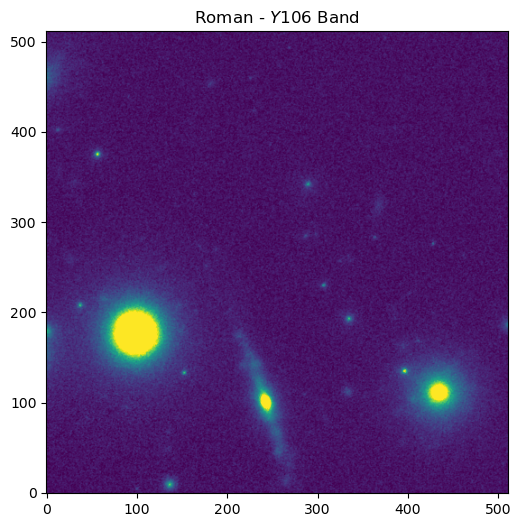

In [44]:
roman_tile_dir = f"{tile_info['roman_dir']}{tile_info['tile']}/"
roman_img = np.load(f"{roman_tile_dir}c{cutout_id}_{tile_info['tile']}.npy")
fig, ax = plt.subplots(1, 1, figsize=(6,6))
ax.set_title(r'Roman - $Y106$ Band')
ax.imshow(roman_img[0, :, :], clim=stretch_color(roman_img, 1), cmap='viridis', origin='lower')
print(f"Plotting c{cutout_id} from Tile: {tile_info['tile']} spanning TP: {cutout_map[cutout_id]['tract_patches']}")

So, when we get the subset from the exposure with the bounding box of the cutout, we should expect it to look like the above inset and corresponding Roman cutout. Let's go ahead and get our cutout and then verify if it does.

#### Cutout using Subset

In [122]:
help(ExposureF.subset)

Help on instancemethod in module lsst.afw.image._exposure:

subset(...)
    subset(self: lsst.afw.image._exposure.ExposureF, bbox: lsst.geom.Box2I, origin: lsst.afw.image._image.ImageOrigin = <ImageOrigin.PARENT: 0>) -> lsst.afw.image._exposure.ExposureF



In [31]:
cutout = lsst_exp.subset(bbox)
print(f"LSST Subset Cutout BBox: {cutout.getBBox()}")
cutout_wcs = WCS(cutout.getWcs().getFitsMetadata())
subimage_origin = cutout.getXY0()
cutout_origin = (subimage_origin.getX(), subimage_origin.getY())
print("Cutout Origin and Dimensions: ", cutout_origin, cutout.getDimensions())
cutout.setXY0(geom.PointI(0, 0))
cutout_wcs_header = makeLimitedFitsHeader(cutout.getWcs().getFitsMetadata())
cutout_wcs_header

LSST Subset Cutout BBox: (minimum=(3242, 23220), maximum=(3389, 23367))
Cutout Origin and Dimensions:  (3242, 23220) (148, 148)


"WCSAXES =                    2                                                  CRPIX1  =   10758.000000000000                                                  CRPIX2  =  -9220.0000000000000                                                  CRVAL1  =   53.701657458563545                                                  CRVAL2  =  -42.396694214876028                                                  CTYPE1  = 'RA---TAN'                                                            CTYPE2  = 'DEC--TAN'                                                            CD1_1   = -5.5555555555589013E-05                                               CD2_2   = 5.5555555555585204E-05                                                RADESYS = 'ICRS'                                                                CD1_2   =   0.0000000000000000                                                  CD2_1   =   0.0000000000000000                                                  "

Plotting c0 (148, 148) from Tile: 54.42_-41.8 spanning TP: [(3076, '0,5')]


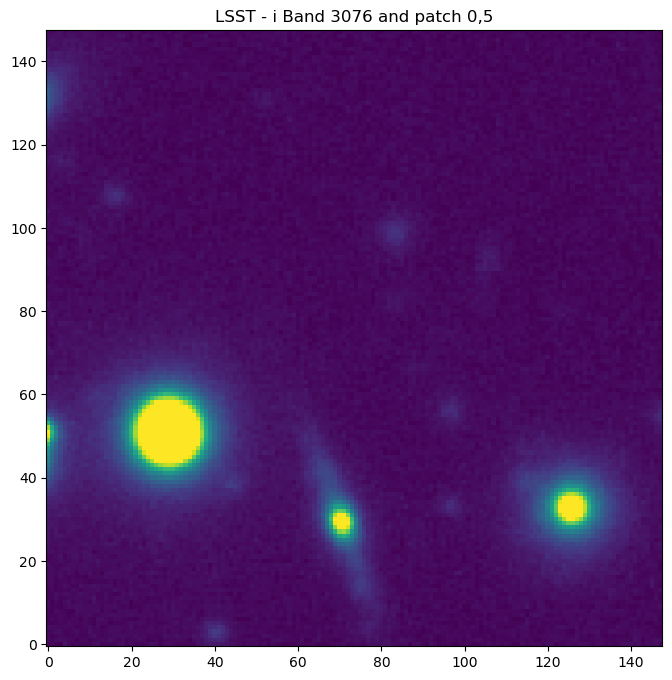

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(8,8))
lsst_iband_img = cutout.image.array
print(f"Plotting c{cutout_id} {lsst_iband_img.shape} from Tile: {tile_info['tile']} spanning TP: {cutout_map[cutout_id]['tract_patches']}")
ax.set_title(f'LSST - i Band {tract} and patch {patch}')
ax.imshow(lsst_iband_img, clim=stretch_color(lsst_iband_img, 1), origin='lower', cmap='viridis')
# ax.imshow(lsst_iband_img, norm=asinh_norm(lsst_iband_img, a=0.5), origin='lower', cmap='viridis')

Great! This matches what we expected to see. Additionally, we're able to successfully get a WCS header we can use and save later on.

### All Bands

In [19]:
cutout_id = 1
tract_patch_pairs = cutout_map[cutout_id]['tract_patches']
if not tract_patch_pairs:
    print(f"Cutout {cutout_id} in {tile_info['tile']}: No overlapping tract_patch pairs found. Skipped.")
    raise Exception("Execution halted due to data schema mismatch.")
if len(tract_patch_pairs) > 1:
    print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - Spans {len(tract_patch_pairs)} patches.")
    raise Exception("Execution halted due to data schema mismatch.")
    
tract, patch = tract_patch_pairs[0]
print(tract, patch)
# getting min/max RA/DEC to cut lsst image and lsst catalogs
bounds = cutout_map[cutout_id]['bounds']
if not bounds:
    print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - No boundaries found in map.")
    raise Exception("Execution halted due to data schema mismatch.")

ra_min, ra_max, dec_min, dec_max = (
    bounds['ra_min'],
    bounds['ra_max'],
    bounds['dec_min'],
    bounds['dec_max']
)
corners = [
    (ra_min, dec_min), # bottom left
    (ra_min, dec_max), # top left
    (ra_max, dec_max), # top right
    (ra_max, dec_min), # bottom right
]
corners_geom = [geom.SpherePoint(ra * geom.degrees, dec * geom.degrees) for ra, dec in corners]

3442 4,0


In [20]:
bands = ['u', 'g', 'r', 'i', 'z', 'y']
all_imgs = []
cutout_wcs, cutout_wcs_header = None, None
cutout_origin = None
bbox = None
for band in bands:
    key = f"tract{tract}_patch{patch.replace(',', '_')}_band{band}.fits"
    lsst_exp = exp_map[key]
    if not lsst_exp:
        raise FileNotFoundError(f"Cached exposure {key} not found in exp_map.")
    if bbox is None:
        wcs = lsst_exp.getWcs()
        corners_pixel = [wcs.skyToPixel(corner) for corner in corners_geom]
        # min/max pixel coords to define the bounding box
        x_coords = [p.getX() for p in corners_pixel]
        y_coords = [p.getY() for p in corners_pixel]
        # guarantee that resulting integer bbox completely encloses entire continuous area
        min_x, max_x = int(np.floor(min(x_coords))), int(np.ceil(max(x_coords))) 
        min_y, max_y = int(np.floor(min(y_coords))), int(np.ceil(max(y_coords)))
        bbox = geom.Box2I(geom.Point2I(min_x, min_y), geom.Point2I(max_x, max_y))
        print(f"LSST Cutout BBox: {bbox}")
    if bbox.isEmpty():
        print("The requested RA/Dec region is entirely outside the exposure's footprint.")
        all_imgs.append(np.zeros((6, 0, 0), dtype=np.float32))
        break
    cutout = lsst_exp.subset(bbox)
    all_imgs.append(cutout.image.array)
    if cutout_wcs is None:
        cutout_wcs = WCS(cutout.getWcs().getFitsMetadata())
        subimage_origin = cutout.getXY0()
        cutout_origin = (subimage_origin.getX(), subimage_origin.getY())
        print("Cutout Origin and Dimensions: ", cutout_origin, cutout.getDimensions())
        # to save the right WCS relative to cutout, we need to reset the origin
        cutout.setXY0(geom.PointI(0, 0))
        cutout_wcs_header = makeLimitedFitsHeader(cutout.getWcs().getFitsMetadata())

LSST Cutout BBox: (minimum=(19706, 3446), maximum=(19851, 3592))
Cutout Origin and Dimensions:  (19706, 3446) (146, 147)


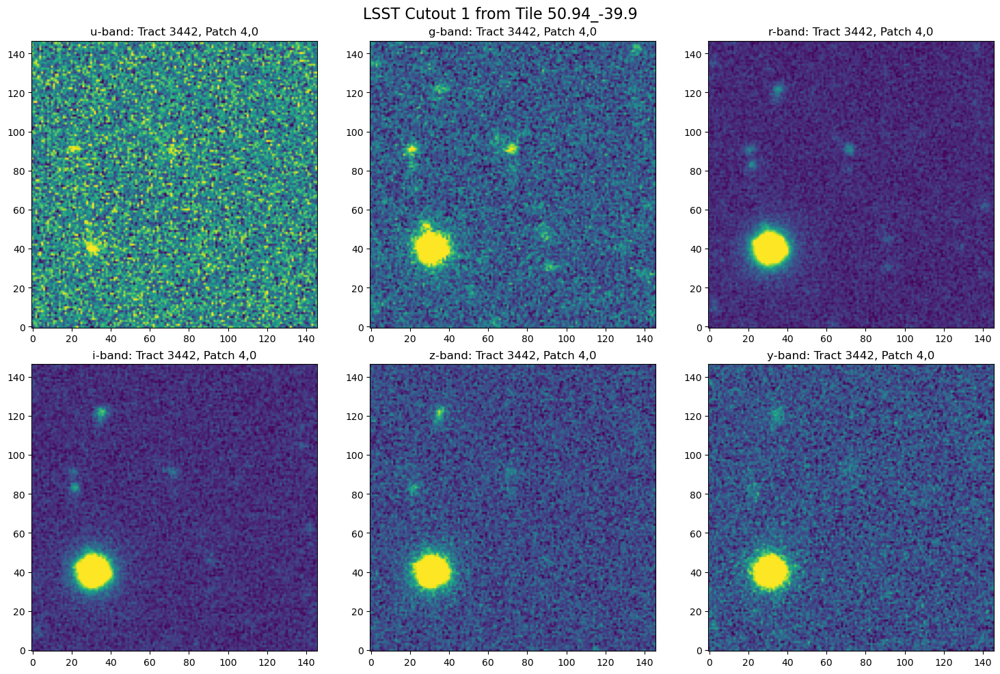

In [21]:
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle(f'LSST Cutout {cutout_id} from Tile {tile_info["tile"]}', fontsize=16)
for i, (band, ax) in enumerate(zip(bands, axs.flat)):
    img = all_imgs[i]
    ax.imshow(img, clim=stretch_color(img, 1), origin='lower', cmap='viridis')
    ax.set_title(f'{band}-band: Tract {tract}, Patch {patch}')

plt.tight_layout()

### Truth and Detection Catalogs

In [22]:
cutout_lsst_truth = None
cutout_lsst_det = None
for cat_type, cat_df in tile_cats.items():
    mask = ( (cat_df['ra'] >= ra_min) & (cat_df['ra'] <= ra_max) &
             (cat_df['dec'] >= dec_min) & (cat_df['dec'] <= dec_max) )
    cutout_df = cat_df[mask].copy()
    print(f"Number of {cat_type} objects within this cutout:", len(cutout_df))
    # adding cutout_x and cutout_y coords 
    if not cutout_df.empty:
        sky_coords = SkyCoord(ra=cutout_df['ra'].values * u.degree, dec=cutout_df['dec'].values * u.degree)
        xs, ys = cutout_wcs.world_to_pixel(sky_coords)
        xs -= cutout_origin[0]
        ys -= cutout_origin[1]
        cutout_df['cutout_x'] = xs
        cutout_df['cutout_y'] = ys
    
    if cat_type == 'truth':
        cutout_lsst_truth = cutout_df
    elif cat_type == 'det':
        cutout_lsst_det = cutout_df   

Number of truth objects within this cutout: 120
Number of det objects within this cutout: 24


In [23]:
roman_tile_dir = f"{tile_info['roman_dir']}{tile_info['tile']}/"
lsst_tile_dir = f"{tile_info['lsst_dir']}{tile_info['tile']}/"

roman_img = np.load(f"{roman_tile_dir}c{cutout_id}_{tile_info['tile']}.npy")

cutout_roman_truth_fn = f"{roman_tile_dir}truth_c{cutout_id}_{tile_info['tile']}.json"
cutout_roman_det_fn = f"{roman_tile_dir}det_c{cutout_id}_{tile_info['tile']}.json"
cutout_roman_truth_df = pd.read_json(cutout_roman_truth_fn, orient='records')
cutout_roman_det_df = pd.read_json(cutout_roman_det_fn, orient='records')

print(f"Roman truth catalog: {len(cutout_roman_truth_df)} objects "
      f"({cutout_roman_truth_df['ind'].nunique()} unique)")

print(f"Roman detection catalog: {len(cutout_roman_det_df)} objects "
      f"({cutout_roman_det_df['number'].nunique()} unique)")

print(f"LSST truth catalog: {len(cutout_lsst_truth)} objects "
      f"({cutout_lsst_truth['id'].nunique()} unique)")

print(f"LSST detection catalog: {len(cutout_lsst_det)} objects "
      f"({cutout_lsst_det['objectId'].nunique()} unique)")

Roman truth catalog: 128 objects (128 unique)
Roman detection catalog: 48 objects (48 unique)
LSST truth catalog: 120 objects (120 unique)
LSST detection catalog: 24 objects (24 unique)


Plotting c1 (147, 146) from Tile: 50.94_-39.9 spanning TP: [(3442, '4,0')]


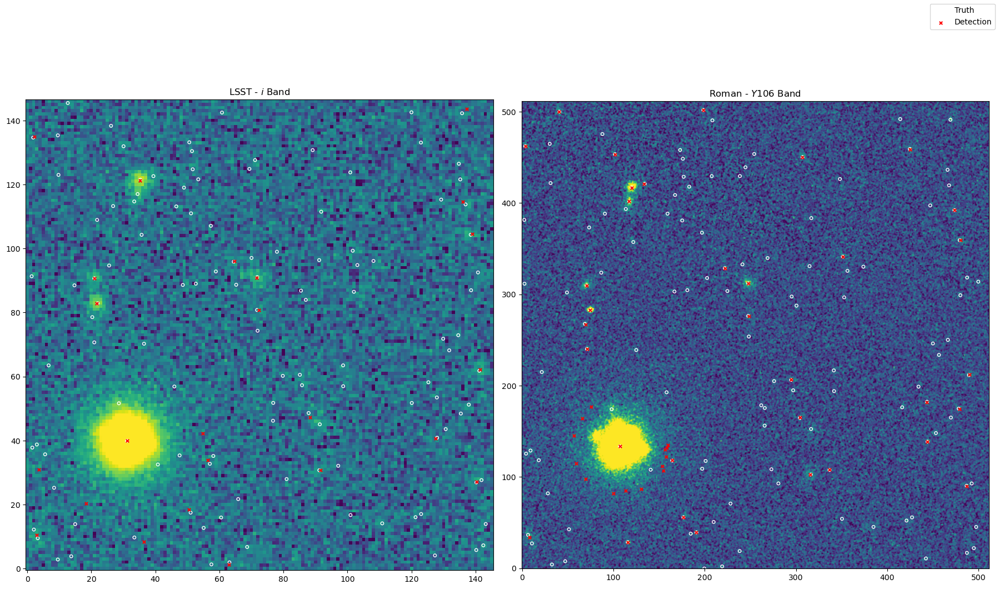

In [24]:
print(f"Plotting c{cutout_id} {all_imgs[3].shape} from Tile: {tile_info['tile']} spanning TP: {cutout_map[cutout_id]['tract_patches']}")
fig, axes = plt.subplots(1, 2, figsize=(18,12))
axes[0].set_title(r'LSST - $i$ Band')
axes[0].imshow(all_imgs[3], norm=asinh_norm(all_imgs[3], a=0.1), origin='lower', cmap='viridis')
axes[1].set_title(r'Roman - $Y106$ Band')
axes[1].imshow(roman_img[0, :, :], clim=stretch_color(roman_img, 1), cmap='viridis', origin='lower')

scatter_kwargs = {
    'truth': dict(marker='o', s=15, label='Truth', edgecolor='white', facecolor='none'),
    'det': dict(marker='x', s=15, label='Detection', color='red')
}

axes[0].scatter(cutout_lsst_truth['cutout_x'], cutout_lsst_truth['cutout_y'], **scatter_kwargs['truth'])
axes[0].scatter(cutout_lsst_det['cutout_x'], cutout_lsst_det['cutout_y'], **scatter_kwargs['det'])

axes[1].scatter(cutout_roman_truth_df['cutout_x'], cutout_roman_truth_df['cutout_y'], **scatter_kwargs['truth'])
axes[1].scatter(cutout_roman_det_df['cutout_x'], cutout_roman_det_df['cutout_y'], **scatter_kwargs['det'])

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels)
plt.tight_layout()

# Processing all 225 Cutouts

Let's move onto processing all 225 cutouts and actually saving the cutouts and the catalogs

In [32]:
def process_cutout(cutout_id, cutout_map, exp_map, tile_cats, tile_info):
    tract_patch_pairs = cutout_map[cutout_id]['tract_patches']
    if not tract_patch_pairs:
        print(f"Cutout {cutout_id} in {tile_info['tile']}: No overlapping tract_patch pairs found. Skipped.")
        return cutout_id, None, False
    if len(tract_patch_pairs) > 1:
        # this case should be impossible as of Sep 24, 2025
        print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - Spans {len(tract_patch_pairs)} patches.")
        return cutout_id, None, False
        
    tract, patch = tract_patch_pairs[0]
    # getting min/max RA/DEC to cut lsst image and lsst catalogs
    bounds = cutout_map[cutout_id]['bounds']
    if not bounds:
        print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - No boundaries found in map.")
        return cutout_id, None, False
    
    ra_min, ra_max, dec_min, dec_max = (
        bounds['ra_min'],
        bounds['ra_max'],
        bounds['dec_min'],
        bounds['dec_max']
    )
    corners = [
        (ra_min, dec_min), # bottom left
        (ra_min, dec_max), # top left
        (ra_max, dec_max), # top right
        (ra_max, dec_min), # bottom right
    ]
    corners_geom = [geom.SpherePoint(ra * geom.degrees, dec * geom.degrees) for ra, dec in corners]
    # getting the lsst image in all bands and its corresponding WCS
    bands = ['u', 'g', 'r', 'i', 'z', 'y']
    all_imgs = []
    cutout_wcs, cutout_wcs_header = None, None
    cutout_origin = None
    bbox = None
    try:
        for band in bands:
            key = f"tract{tract}_patch{patch.replace(',', '_')}_band{band}.fits"
            lsst_exp = exp_map[key]
            if not lsst_exp:
                raise FileNotFoundError(f"Cached exposure {key} not found in exp_map.")
            if bbox is None:
                wcs = lsst_exp.getWcs()
                corners_pixel = [wcs.skyToPixel(corner) for corner in corners_geom]
                # min/max pixel coords to define the bounding box
                x_coords = [p.getX() for p in corners_pixel]
                y_coords = [p.getY() for p in corners_pixel]
                # guarantee that resulting integer bbox completely encloses entire continuous area
                min_x, max_x = int(np.floor(min(x_coords))), int(np.ceil(max(x_coords))) 
                min_y, max_y = int(np.floor(min(y_coords))), int(np.ceil(max(y_coords)))
                bbox = geom.Box2I(geom.Point2I(min_x, min_y), geom.Point2I(max_x, max_y))
                # print(f"LSST Cutout BBox: {bbox}")
            if bbox.isEmpty():
                print("The requested RA/Dec region is entirely outside the exposure's footprint.")
                all_imgs.extend([np.zeros((0, 0), dtype=np.float32) for _ in range(6)])
                break
            # grabbing cutout using subset method and saving the wcs
            cutout = lsst_exp.subset(bbox)
            all_imgs.append(cutout.image.array)
            if cutout_wcs is None:
                cutout_wcs = WCS(cutout.getWcs().getFitsMetadata())
                subimage_origin = cutout.getXY0()
                cutout_origin = (subimage_origin.getX(), subimage_origin.getY())
                # print("Cutout Origin and Dimensions: ", cutout_origin, cutout.getDimensions())
                # to save the right WCS relative to cutout, we need to reset the origin
                cutout.setXY0(geom.PointI(0, 0))
                cutout_wcs_header = makeLimitedFitsHeader(cutout.getWcs().getFitsMetadata())
    
        # saving the cutouts 
        lsst_tile_dir = f"{tile_info['lsst_dir']}{tile_info['tile']}/"
        os.makedirs(lsst_tile_dir, exist_ok=True)
        np.save(f"{lsst_tile_dir}c{cutout_id}_{tile_info['tile']}.npy", np.asarray(all_imgs))
        del all_imgs
        # saving catalogs
        for cat_type, cat_df in tile_cats.items():
            mask = ( (cat_df['ra'] >= ra_min) & (cat_df['ra'] <= ra_max) &
                     (cat_df['dec'] >= dec_min) & (cat_df['dec'] <= dec_max) )
            cutout_df = cat_df[mask].copy()
            # print(f"Number of {cat_type} objects within this cutout:", len(cutout_df))
            # adding cutout_x and cutout_y coords 
            if not cutout_df.empty:
                sky_coords = SkyCoord(ra=cutout_df['ra'].values * u.degree, dec=cutout_df['dec'].values * u.degree)
                xs, ys = cutout_wcs.world_to_pixel(sky_coords)
                xs -= cutout_origin[0]
                ys -= cutout_origin[1]
                cutout_df['cutout_x'] = xs
                cutout_df['cutout_y'] = ys
            
            cutout_df.to_json(f"{lsst_tile_dir}{cat_type}_c{cutout_id}_{tile_info['tile']}.json", orient='records')
            del cutout_df

        return cutout_id, cutout_wcs_header, True

    except Exception as e:
        print(f"TILE: {tile_info['tile']}: Cutout {cutout_id}: Failed with error - {e}")
        traceback.print_exc()
        return cutout_id, cutout_wcs_header, False

Let's test out our `process_cutout` function.

In [37]:
cutout_id = 210
cid, cutout_wcs_header, result = process_cutout(cutout_id, cutout_map, exp_map, tile_cats, tile_info)
cid, cutout_wcs_header, result

(210,
 "WCSAXES =                    2                                                  CRPIX1  =   10776.000000000000                                                  CRPIX2  =  -11321.000000000000                                                  CRVAL1  =   53.701657458563545                                                  CRVAL2  =  -42.396694214876028                                                  CTYPE1  = 'RA---TAN'                                                            CTYPE2  = 'DEC--TAN'                                                            CD1_1   = -5.5555555555584581E-05                                               CD2_2   = 5.5555555555588803E-05                                                RADESYS = 'ICRS'                                                                CD1_2   =   0.0000000000000000                                                  CD2_1   =   0.0000000000000000                                                  ",
 True)

In [38]:
def get_cutout_summary_and_plot(cutout_id, tile_info):
    roman_tile_dir = f"{tile_info['roman_dir']}{tile_info['tile']}/"
    lsst_tile_dir = f"{tile_info['lsst_dir']}{tile_info['tile']}/"
    
    roman_img = np.load(f"{roman_tile_dir}c{cutout_id}_{tile_info['tile']}.npy")
    lsst_img = np.load(f"{lsst_tile_dir}c{cutout_id}_{tile_info['tile']}.npy")
    
    cutout_roman_truth_fn = f"{roman_tile_dir}truth_c{cutout_id}_{tile_info['tile']}.json"
    cutout_roman_det_fn = f"{roman_tile_dir}det_c{cutout_id}_{tile_info['tile']}.json"
    
    cutout_roman_truth_df = pd.read_json(cutout_roman_truth_fn, orient='records')
    cutout_roman_det_df = pd.read_json(cutout_roman_det_fn, orient='records')
    
    cutout_lsst_truth_fn = f"{lsst_tile_dir}truth_c{cutout_id}_{tile_info['tile']}.json"
    cutout_lsst_det_fn = f"{lsst_tile_dir}det_c{cutout_id}_{tile_info['tile']}.json"
    
    cutout_lsst_truth_df = pd.read_json(cutout_lsst_truth_fn, orient='records')
    cutout_lsst_det_df = pd.read_json(cutout_lsst_det_fn, orient='records')
    
    print(f"Roman truth catalog: {len(cutout_roman_truth_df)} objects "
          f"({cutout_roman_truth_df['ind'].nunique()} unique)")
    
    print(f"Roman detection catalog: {len(cutout_roman_det_df)} objects "
          f"({cutout_roman_det_df['number'].nunique()} unique)")
    
    print(f"LSST truth catalog: {len(cutout_lsst_truth_df)} objects "
          f"({cutout_lsst_truth_df['id'].nunique()} unique)")
    
    print(f"LSST detection catalog: {len(cutout_lsst_det_df)} objects "
          f"({cutout_lsst_det_df['objectId'].nunique()} unique)")
    
    print(f"Plotting c{cutout_id} {lsst_img.shape[1:]} from Tile: {tile_info['tile']} spanning TP: {cutout_map[cutout_id]['tract_patches']}")
    fig, axes = plt.subplots(1, 2, figsize=(18,12))
    axes[0].set_title(r'LSST - $i$ Band')
    axes[0].imshow(lsst_img[3, :, :], clim=stretch_color(lsst_img[3, :, :], 1), origin='lower', cmap='viridis')
    axes[1].set_title(r'Roman - $Y106$ Band')
    axes[1].imshow(roman_img[0, :, :], clim=stretch_color(roman_img, 1), cmap='viridis', origin='lower')
    
    scatter_kwargs = {
        'truth': dict(marker='o', s=15, label='Truth', edgecolor='white', facecolor='none'),
        'det': dict(marker='x', s=15, label='Detection', color='red')
    }
    
    axes[0].scatter(cutout_lsst_truth_df['cutout_x'], cutout_lsst_truth_df['cutout_y'], **scatter_kwargs['truth'])
    axes[0].scatter(cutout_lsst_det_df['cutout_x'], cutout_lsst_det_df['cutout_y'], **scatter_kwargs['det'])
    
    axes[1].scatter(cutout_roman_truth_df['cutout_x'], cutout_roman_truth_df['cutout_y'], **scatter_kwargs['truth'])
    axes[1].scatter(cutout_roman_det_df['cutout_x'], cutout_roman_det_df['cutout_y'], **scatter_kwargs['det'])
    
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels)
    plt.tight_layout()

Roman truth catalog: 147 objects (147 unique)
Roman detection catalog: 47 objects (47 unique)
LSST truth catalog: 138 objects (138 unique)
LSST detection catalog: 31 objects (31 unique)
Plotting c210 (149, 148) from Tile: 54.42_-41.8 spanning TP: [(3076, '0,6')]


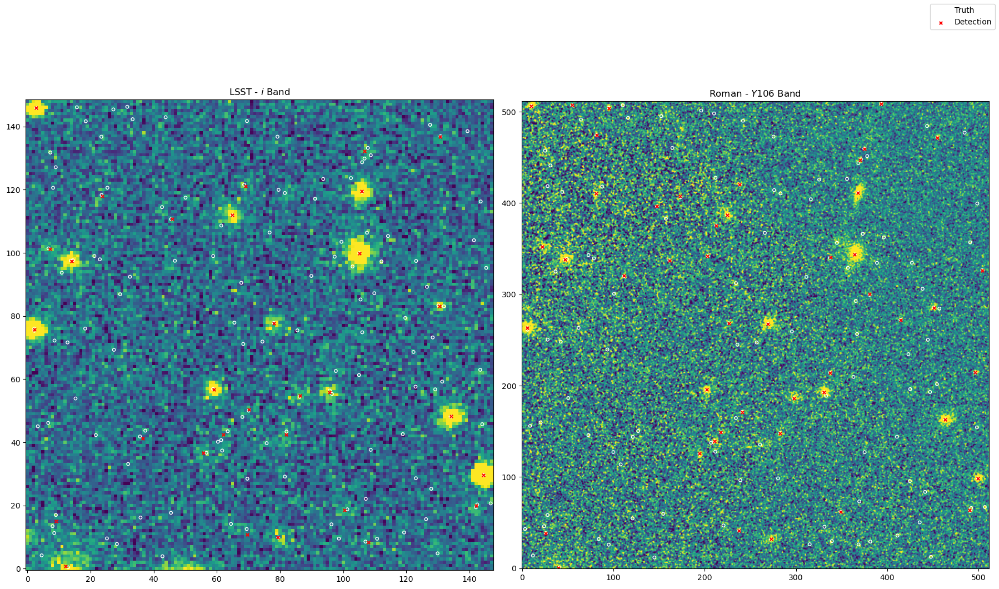

In [39]:
get_cutout_summary_and_plot(210, tile_info)

Now, let's time how long it would take for all 225 cutouts in a tile to be processed in serial given the cutout_map and exp_map and the LSST catalogs are already loaded in memory.

In [97]:
cutout_ids = range(225)
start_time = time.time()
results = [
    process_cutout(cid, cutout_map, exp_map, tile_cats, tile_info) for cid in cutout_ids
]
end_time = time.time()
elapsed = end_time - start_time
print(f"Processed {len(cutout_ids)} cutouts in serial in {elapsed:.2f} seconds.")
successes = sum(1 for _, _, r in results if r)
print(f"{successes} cutouts processed successfully.")

Processed 225 cutouts in serial in 3.97 seconds.
225 cutouts processed successfully.


Great! This means that our process_cutotut function is fast enough to be run serially and we don't have to parallelize it having a worker do every cutout. This was done on the NERSC Login Node.

Now, let's see how long it takes for a tile to process all these cutouts without having the maps and catalogs already loaded in memory.

## Timing of A Single Tile (From Scratch)

In [1]:
import os, re, json, time, gc, sys, glob, random, traceback, pickle
import numpy as np
import pandas as pd

from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
import astropy.units as u
from astropy.io import fits
from collections import defaultdict, namedtuple

from lsst.afw.image import ExposureF
import lsst.geom as geom
from lsst.afw.fits import makeLimitedFitsHeader, readMetadata
from lsst.afw.geom import makeSkyWcs

import multiprocessing as mp
from functools import partial
from tqdm import tqdm
pd.options.mode.chained_assignment = None

In [2]:
def find_tract_patch(ra, dec, skymap):
    """
    Finds LSST tract and patch for a given RA & Dec
    Args:
        ra (np.ndarray) in degrees
        dec (np.ndarray) in degrees
        skymap: LSST skymap object obtained from Butler

    Returns:
        tract_ids & patch_idxs (np.ndarray)
    """
    try:
        spherePoints = [geom.SpherePoint(r * geom.degrees, d * geom.degrees) for r, d in zip(ra, dec)]
        tracts = [skymap.findTract(spherePoint) for spherePoint in spherePoints]
        patches = [patchInfo.getIndex() for spherePoint, tractInfo in zip(spherePoints, tracts) 
                      for patchInfo in [tractInfo.findPatch(spherePoint)]]
        patch_idxs = [",".join(map(str, idx)) for idx in patches]
        tract_ids = [tractInfo.getId() for tractInfo in tracts]

        return np.array(tract_ids), np.array(patch_idxs)
    except Exception as e: 
        print(f"Warning: Could not find tract/patch for some RA, Dec: {e}. Not within this skymap")
        return None, None

def cutout_metadata_map(tile, roman_dir, skymap, exp_map):
    """
    Creates a map linking each Roman cutout ID to the LSST tract(s) 
    and patch(es) it overlaps with as well as the RA/DEC boundaries

    Args:
        tile (str): Identifier for the tile being processed
        roman_dir (str): Root directory for the Roman truth data
        skymap: LSST skyMap object from the Butler
        exp_map: A pre-loaded dictionary of {filename: ExposureF} objects. 
    Returns:
        dict: Dict mapping cutout_id to a dict of 
            "tract_patches": list of unique (tract, patch) tuples,
            "bounds": RA/DEC min/max
    """
    cutout_map = {}
    print(f"Generating cutout-to-patch map for tile: {tile}...")
    for cutout_id in tqdm(range(225), desc="Mapping Cutouts"):
        roman_truth_path = f'{roman_dir}{tile}/truth_c{cutout_id}_{tile}.json'
        if not os.path.exists(roman_truth_path):
            cutout_map[cutout_id] = {'tract_patches': [], 'bounds': None}
            continue
        
        roman_truth_cat = pd.read_json(roman_truth_path, orient='records')
        if roman_truth_cat.empty:
            cutout_map[cutout_id] = {'tract_patches': [], 'bounds': None}
            continue
        
        ra_min, ra_max = roman_truth_cat['ra'].min(), roman_truth_cat['ra'].max()
        dec_min, dec_max = roman_truth_cat['dec'].min(), roman_truth_cat['dec'].max()
        bounds = {
            'ra_min': ra_min,
            'ra_max': ra_max,
            'dec_min': dec_min,
            'dec_max': dec_max,
        }
        # corner points of bbox
        corners = [
            (ra_min, dec_min), # bottom left
            (ra_min, dec_max), # top left
            (ra_max, dec_max), # top right
            (ra_max, dec_min), # bottom right
        ]
        corner_ras, corner_decs = zip(*corners)
        tracts, patches = find_tract_patch(np.array(corner_ras), np.array(corner_decs), skymap)
        if tracts is None or patches is None:
            cutout_map[cutout_id] = {'tract_patches': [], 'bounds': bounds}
            continue

        # combine and find unique (tract, patch) pairs
        # auto handles duplicates if corners fall in same patch
        unique_pairs = sorted(list(set(zip([int(t) for t in tracts], 
                                           [str(p) for p in patches]
                                          ))))

        anchor_tract_patch = (None, None)
        # Even if a cutout has corners that correspond to multipe tracts/patches, 
        # can its entire sky area bounding box fit completely inside just one of those candidate patches?
        # we ask this because all patches overlap one another, so there could be a case where all the corners 
        # are found in multiple tracts/patches but because of the overlap, they're the exact same coadd data.
        # another case could be that the bbox gets cutoff in one patch but is fully present in another patch (usually happens near the edge of a tract).
        if len(unique_pairs) > 1:
            single_patch = False
            for tract, patch in unique_pairs:
                key = f"tract{tract}_patch{patch.replace(',', '_')}_bandi.fits"
                lsst_exp = exp_map.get(key)
                if not lsst_exp:
                    raise(f"LSST exposure not found for {key}")
                corners_geom = [geom.SpherePoint(ra * geom.degrees, dec * geom.degrees) for ra, dec in corners]
                # cutout bbox using this patch's WCS
                wcs = lsst_exp.getWcs()
                corners_pixel = [wcs.skyToPixel(corner) for corner in corners_geom]
                x_coords = [p.getX() for p in corners_pixel]
                y_coords = [p.getY() for p in corners_pixel]
                min_x, max_x = int(np.floor(min(x_coords))), int(np.ceil(max(x_coords)))
                min_y, max_y = int(np.floor(min(y_coords))), int(np.ceil(max(y_coords)))
                cutout_bbox = geom.Box2I(geom.Point2I(min_x, min_y), geom.Point2I(max_x, max_y))
                # if our patch bbox fully contains the cutout_bbox, we keep this patch
                # and can discard the rest of the pairs in the list
                if lsst_exp.getBBox().contains(cutout_bbox):
                    single_patch = True
                    unique_pairs = [(tract, patch)]
                    break
            
            # if after checking all candidates, none contained the full bbox, it's a true multi-patch case
            # then only do we calculate the anchor tract/patch
            if not single_patch:
                center_ra = (ra_min + ra_max) / 2.0
                center_dec = (dec_min + dec_max) / 2.0
                center_tract_arr, center_patch_arr = find_tract_patch(np.array([center_ra]), np.array([center_dec]), skymap)            
                if center_tract_arr is not None:
                    anchor_tract_patch = (int(center_tract_arr[0]), str(center_patch_arr[0]))
        
        cutout_map[cutout_id] = {
            "tract_patches": unique_pairs,
            "bounds": bounds,
            "anchor_tract_patch": anchor_tract_patch
        }
    return cutout_map

def process_cutout(cutout_id, cutout_map, exp_map, tile_cats, tile_info):
    tract_patch_pairs = cutout_map[cutout_id]['tract_patches']
    if not tract_patch_pairs:
        print(f"Cutout {cutout_id} in {tile_info['tile']}: No overlapping tract_patch pairs found. Skipped.")
        return cutout_id, None, False
    if len(tract_patch_pairs) > 1:
        # this case should be impossible as of Sep 24, 2025
        print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - Spans {len(tract_patch_pairs)} patches.")
        return cutout_id, None, False
        
    tract, patch = tract_patch_pairs[0]
    # getting min/max RA/DEC to cut lsst image and lsst catalogs
    bounds = cutout_map[cutout_id]['bounds']
    if not bounds:
        print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - No boundaries found in map.")
        return cutout_id, None, False
    
    ra_min, ra_max, dec_min, dec_max = (
        bounds['ra_min'],
        bounds['ra_max'],
        bounds['dec_min'],
        bounds['dec_max']
    )
    corners = [
        (ra_min, dec_min), # bottom left
        (ra_min, dec_max), # top left
        (ra_max, dec_max), # top right
        (ra_max, dec_min), # bottom right
    ]
    corners_geom = [geom.SpherePoint(ra * geom.degrees, dec * geom.degrees) for ra, dec in corners]
    # getting the lsst image in all bands and its corresponding WCS
    bands = ['u', 'g', 'r', 'i', 'z', 'y']
    all_imgs = []
    cutout_wcs, cutout_wcs_header = None, None
    cutout_origin = None
    bbox = None
    try:
        for band in bands:
            key = f"tract{tract}_patch{patch.replace(',', '_')}_band{band}.fits"
            lsst_exp = exp_map[key]
            if not lsst_exp:
                raise FileNotFoundError(f"Cached exposure {key} not found in exp_map.")
            if bbox is None:
                wcs = lsst_exp.getWcs()
                corners_pixel = [wcs.skyToPixel(corner) for corner in corners_geom]
                # min/max pixel coords to define the bounding box
                x_coords = [p.getX() for p in corners_pixel]
                y_coords = [p.getY() for p in corners_pixel]
                # guarantee that resulting integer bbox completely encloses entire continuous area
                min_x, max_x = int(np.floor(min(x_coords))), int(np.ceil(max(x_coords))) 
                min_y, max_y = int(np.floor(min(y_coords))), int(np.ceil(max(y_coords)))
                bbox = geom.Box2I(geom.Point2I(min_x, min_y), geom.Point2I(max_x, max_y))
                # print(f"LSST Cutout BBox: {bbox}")
            if bbox.isEmpty():
                print("The requested RA/Dec region is entirely outside the exposure's footprint.")
                all_imgs.extend([np.zeros((0, 0), dtype=np.float32) for _ in range(6)])
                break
            # grabbing cutout using subset method and saving the wcs
            cutout = lsst_exp.subset(bbox)
            all_imgs.append(cutout.image.array)
            if cutout_wcs is None:
                cutout_wcs = WCS(cutout.getWcs().getFitsMetadata())
                subimage_origin = cutout.getXY0()
                cutout_origin = (subimage_origin.getX(), subimage_origin.getY())
                # print("Cutout Origin and Dimensions: ", cutout_origin, cutout.getDimensions())
                # to save the right WCS relative to cutout, we need to reset the origin
                cutout.setXY0(geom.PointI(0, 0))
                cutout_wcs_header = makeLimitedFitsHeader(cutout.getWcs().getFitsMetadata())
    
        # saving the cutouts 
        lsst_tile_dir = f"{tile_info['lsst_dir']}{tile_info['tile']}/"
        os.makedirs(lsst_tile_dir, exist_ok=True)
        np.save(f"{lsst_tile_dir}c{cutout_id}_{tile_info['tile']}.npy", np.asarray(all_imgs))
        del all_imgs
        # saving catalogs
        for cat_type, cat_df in tile_cats.items():
            mask = ( (cat_df['ra'] >= ra_min) & (cat_df['ra'] <= ra_max) &
                     (cat_df['dec'] >= dec_min) & (cat_df['dec'] <= dec_max) )
            cutout_df = cat_df[mask].copy()
            # print(f"Number of {cat_type} objects within this cutout:", len(cutout_df))
            # adding cutout_x and cutout_y coords 
            if not cutout_df.empty:
                sky_coords = SkyCoord(ra=cutout_df['ra'].values * u.degree, dec=cutout_df['dec'].values * u.degree)
                xs, ys = cutout_wcs.world_to_pixel(sky_coords)
                xs -= cutout_origin[0]
                ys -= cutout_origin[1]
                cutout_df['cutout_x'] = xs
                cutout_df['cutout_y'] = ys
            
            cutout_df.to_json(f"{lsst_tile_dir}{cat_type}_c{cutout_id}_{tile_info['tile']}.json", orient='records')
            del cutout_df

        return cutout_id, cutout_wcs_header, True

    except Exception as e:
        print(f"TILE: {tile_info['tile']}: Cutout {cutout_id}: Failed with error - {e}")
        traceback.print_exc()
        return cutout_id, cutout_wcs_header, False

In [3]:
def process_tile(skymap, tile_info):
    start_time = time.time()
    tile, roman_dir, lsst_dir, coadd_dir =  tile_info['tile'], tile_info['roman_dir'], tile_info['lsst_dir'], tile_info['coadd_dir']

    load_cats_start_time = time.time()
    tile_truth_path = f'{lsst_dir}{tile}/full_truth_{tile}.parquet'
    if not os.path.exists(tile_truth_path):
        print(f"ERROR: Truth file not found at {tile_truth_path}")
        return tile, False
    tile_lsst_truth = pd.read_parquet(tile_truth_path)
    if tile_lsst_truth.empty:
        print(f"ERROR: Truth file empty at {tile_truth_path}")
        del tile_lsst_truth
        return tile, False

    tile_det_path = f'{lsst_dir}{tile}/full_det_{tile}.parquet'
    if not os.path.exists(tile_det_path):
        print(f"ERROR: Det file not found at {tile_det_path}")
        return tile, False
    tile_lsst_det = pd.read_parquet(tile_det_path)
    if tile_lsst_det.empty:
        print(f"ERROR: Det file empty at {tile_det_path}")
        del tile_lsst_det
        return tile, False
    load_cats_time = time.time() - load_cats_start_time
    tile_cats = {
        "truth": tile_lsst_truth,
        "det": tile_lsst_det,
    }
    
    tile_tract_patch = tile_lsst_truth.groupby('tract')['patch'].apply(lambda x: sorted(x.unique())).to_dict()
    load_exp_start_time = time.time()
    bands = ['u', 'g', 'r', 'i', 'z', 'y']
    exp_map = {
        f"tract{tract}_patch{patch.replace(',', '_')}_band{band}.fits": 
        ExposureF(f"{coadd_dir}tract{tract}_patch{patch.replace(',', '_')}_band{band}.fits")
        for band in bands
        for tract, patches in tile_tract_patch.items()
        for patch in patches
    }
    load_exp_time = time.time() - load_exp_start_time
    print(f"We have {len(exp_map)} dataIds loaded from cache.")

    cutout_md_start_time = time.time()
    cutout_map = cutout_metadata_map(tile, roman_dir, skymap, exp_map)
    cutout_md_time = time.time() - cutout_md_start_time

    num_cutouts = 225
    cutout_ids = range(num_cutouts)
    cutouts_start_time = time.time()
    results = [
        process_cutout(cid, cutout_map, exp_map, tile_cats, tile_info) for cid in cutout_ids
    ]
    cutouts_time = time.time() - cutouts_start_time
    print(f"Processed {len(cutout_ids)} cutouts in serial in {cutouts_time:.4f} seconds.")
    successes = sum(1 for _, _, r in results if r)
    print(f"{successes} cutouts processed successfully.")
    # Saving WCS Data
    wcs_headers = {}
    for cid, wcs_header, success in results:
        if success and wcs_header:  # only save if cutout was successful and has WCS data
            wcs_headers[f"c{cid}"] = wcs_header
    
    if wcs_headers:  # only save if we have any WCS headers
        wcs_output_path = f"{lsst_dir}{tile}/wcs_{tile}.json"
        os.makedirs(os.path.dirname(wcs_output_path), exist_ok=True)
        with open(wcs_output_path, 'w') as f:
            json.dump(wcs_headers, f, indent=2)
        print(f"Saved {len(wcs_headers)} WCS headers to {wcs_output_path}")
    
    total_time = time.time() - start_time
    print("\n" + "="*60)
    print(f"TIMING SUMMARY FOR TILE {tile}")
    print("="*60)
    print(f"{'Stage':<25} {'Time (s)':<10} {'Percentage':<10}")
    print("-" * 50)
    print(f"{'Load Catalogs':<25} {load_cats_time:<10.4f} {100*load_cats_time/total_time:<10.1f}%")
    print(f"{'Load Exposures':<25} {load_exp_time:<10.4f} {100*load_exp_time/total_time:<10.1f}%")
    print(f"{'Cutout Metadata':<25} {cutout_md_time:<10.4f} {100*cutout_md_time/total_time:<10.1f}%")
    print(f"{'Process Cutouts':<25} {cutouts_time:<10.4f} {100*cutouts_time/total_time:<10.1f}%")
    print("-" * 50)
    print(f"{'TOTAL':<25} {total_time:<10.4f} {'100.0%':<10}")
    print("="*60)

    if successes != num_cutouts:
        return tile, False

    del cutout_map, exp_map, tile_lsst_truth, tile_lsst_det, tile_cats
    gc.collect()
    
    return tile, True

In [4]:
if __name__ == "__main__":    
    ROOT_DIR = '/pscratch/sd/y/yaswante/MyQuota/roman_lsst/'
    LSST_DIR = f'{ROOT_DIR}truth-lsst/'
    ROMAN_DIR = f'{ROOT_DIR}truth-roman/'
    COADD_DIR = f'{ROOT_DIR}full_coadd_butler_striped/' # striped folder containing our exposures
    TILE_LIST_FILE = f'{ROOT_DIR}700_tiles.txt'

    print("Loading global skymap...")
    with open('/pscratch/sd/y/yaswante/MyQuota/roman_lsst/dr6_deepCoadd_skyMap.pkl', 'rb') as f:
        skymap = pickle.load(f)

    print("Loading tile list...")
    with open(TILE_LIST_FILE, 'r') as f:
        tiles = [line.strip() for line in f if line.strip()]

    chosen_tile = tiles[686] # 54.42_-41.8
    tile_info = {
        "tile": chosen_tile,
        "roman_dir": ROMAN_DIR,
        "lsst_dir": LSST_DIR,
        "coadd_dir": COADD_DIR
    }
    tile, result = process_tile(skymap, tile_info)

Loading global skymap...
Loading tile list...
We have 24 dataIds loaded from cache.
Generating cutout-to-patch map for tile: 54.42_-41.8...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 166.57it/s]


Processed 225 cutouts in serial in 3.0657 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.42_-41.8/wcs_54.42_-41.8.json

TIMING SUMMARY FOR TILE 54.42_-41.8
Stage                     Time (s)   Percentage
--------------------------------------------------
Load Catalogs             0.1495     0.7       %
Load Exposures            15.8179    77.5      %
Cutout Metadata           1.3583     6.7       %
Process Cutouts           3.0657     15.0      %
--------------------------------------------------
TOTAL                     20.3986    100.0%    


## 1st Test (On NERSC Login Node)
```
Loading global skymap...
Loading tile list...
We have 24 dataIds loaded from cache.
Generating cutout-to-patch map for tile: 54.42_-41.8...
Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 56.87it/s] 
Processed 225 cutouts in serial in 5.3657 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.42_-41.8/wcs_54.42_-41.8.json

============================================================
TIMING SUMMARY FOR TILE 54.42_-41.8
============================================================
Stage                     Time (s)   Percentage
--------------------------------------------------
Load Catalogs             1.9490     1.2       %
Load Exposures            153.9871   92.6      %
Cutout Metadata           4.6522     2.8       %
Process Cutouts           5.3657     3.2       %
--------------------------------------------------
TOTAL                     166.3198   100.0%    
============================================================
```

So, as we can see, it takes ~1 minute on the single node for a single tile to be processed. The main bottleneck is from loading in the exposure objects. If we were to run this serially for 700 tiles, it would take around ~700 mins = ~11 hours.

## 2nd Test (On Configurable Jupyter Node with 256 CPUs Single Node)
```
Loading global skymap...
Loading tile list...
We have 24 dataIds loaded from cache.
Generating cutout-to-patch map for tile: 54.42_-41.8...
Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 166.57it/s]
Processed 225 cutouts in serial in 3.0657 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.42_-41.8/wcs_54.42_-41.8.json

============================================================
TIMING SUMMARY FOR TILE 54.42_-41.8
============================================================
Stage                     Time (s)   Percentage
--------------------------------------------------
Load Catalogs             0.1495     0.7       %
Load Exposures            15.8179    77.5      %
Cutout Metadata           1.3583     6.7       %
Process Cutouts           3.0657     15.0      %
--------------------------------------------------
TOTAL                     20.3986    100.0%    
============================================================
```
So, as we can see, this is much faster! It takes ~20 seconds with a single node for a single tile to be processed. Again, the main bottleneck is from loading in the exposure objects. If we were to run this serially for 700 tiles, it would take around ~3.8 hrs. A much better improvement!

# All Tiles Script

Since each tile is independent of each other, we can easily parallelize this problem. Let's write a full script that we can run at once using `x` number of workers. We can start with 64 CPUs.

In [1]:
import os, re, json, time, gc, sys, glob, random, traceback, pickle
import numpy as np
import pandas as pd

from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
import astropy.units as u
from astropy.io import fits
from collections import defaultdict, namedtuple

from lsst.afw.image import ExposureF
import lsst.geom as geom
from lsst.afw.fits import makeLimitedFitsHeader, readMetadata
from lsst.afw.geom import makeSkyWcs

import multiprocessing as mp
from functools import partial
from tqdm import tqdm
pd.options.mode.chained_assignment = None

skymap = None

def find_tract_patch(ra, dec):
    global skymap
    """
    Finds LSST tract and patch for a given RA & Dec
    Args:
        ra (np.ndarray) in degrees
        dec (np.ndarray) in degrees
        skymap: LSST skymap object obtained from Butler

    Returns:
        tract_ids & patch_idxs (np.ndarray)
    """
    try:
        spherePoints = [geom.SpherePoint(r * geom.degrees, d * geom.degrees) for r, d in zip(ra, dec)]
        tracts = [skymap.findTract(spherePoint) for spherePoint in spherePoints]
        patches = [patchInfo.getIndex() for spherePoint, tractInfo in zip(spherePoints, tracts) 
                      for patchInfo in [tractInfo.findPatch(spherePoint)]]
        patch_idxs = [",".join(map(str, idx)) for idx in patches]
        tract_ids = [tractInfo.getId() for tractInfo in tracts]

        return np.array(tract_ids), np.array(patch_idxs)
    except Exception as e: 
        print(f"Warning: Could not find tract/patch for some RA, Dec: {e}. Not within this skymap")
        return None, None

def cutout_metadata_map(tile, roman_dir, exp_map):
    global skymap
    """
    Creates a map linking each Roman cutout ID to the LSST tract(s) 
    and patch(es) it overlaps with as well as the RA/DEC boundaries

    Args:
        tile (str): Identifier for the tile being processed
        roman_dir (str): Root directory for the Roman truth data
        skymap: LSST skyMap object from the Butler
        exp_map: A pre-loaded dictionary of {filename: ExposureF} objects. 
    Returns:
        dict: Dict mapping cutout_id to a dict of 
            "tract_patches": list of unique (tract, patch) tuples,
            "bounds": RA/DEC min/max
    """
    cutout_map = {}
    print(f"Generating cutout-to-patch map for tile: {tile}...")
    for cutout_id in tqdm(range(225), desc="Mapping Cutouts"):
        roman_truth_path = f'{roman_dir}{tile}/truth_c{cutout_id}_{tile}.json'
        if not os.path.exists(roman_truth_path):
            cutout_map[cutout_id] = {'tract_patches': [], 'bounds': None}
            continue
        
        roman_truth_cat = pd.read_json(roman_truth_path, orient='records')
        if roman_truth_cat.empty:
            cutout_map[cutout_id] = {'tract_patches': [], 'bounds': None}
            continue
        
        ra_min, ra_max = roman_truth_cat['ra'].min(), roman_truth_cat['ra'].max()
        dec_min, dec_max = roman_truth_cat['dec'].min(), roman_truth_cat['dec'].max()
        bounds = {
            'ra_min': ra_min,
            'ra_max': ra_max,
            'dec_min': dec_min,
            'dec_max': dec_max,
        }
        # corner points of bbox
        corners = [
            (ra_min, dec_min), # bottom left
            (ra_min, dec_max), # top left
            (ra_max, dec_max), # top right
            (ra_max, dec_min), # bottom right
        ]
        corner_ras, corner_decs = zip(*corners)
        tracts, patches = find_tract_patch(np.array(corner_ras), np.array(corner_decs))
        if tracts is None or patches is None:
            cutout_map[cutout_id] = {'tract_patches': [], 'bounds': bounds}
            continue

        # combine and find unique (tract, patch) pairs
        # auto handles duplicates if corners fall in same patch
        unique_pairs = sorted(list(set(zip([int(t) for t in tracts], 
                                           [str(p) for p in patches]
                                          ))))
        
        # Even if a cutout has corners that correspond to multipe tracts/patches, 
        # can its entire sky area bounding box fit completely inside just one of those candidate patches?
        # we ask this because all patches overlap one another, so there could be a case where all the corners 
        # are found in multiple tracts/patches but because of the overlap, they're the exact same coadd data.
        # another case could be that the bbox gets cutoff in one patch but is fully present in another patch (usually happens near the edge of a tract).
        if len(unique_pairs) > 1:
            single_patch = False
            for tract, patch in unique_pairs:
                key = f"tract{tract}_patch{patch.replace(',', '_')}_bandi.fits"
                lsst_exp = exp_map.get(key)
                if not lsst_exp:
                    raise(f"LSST exposure not found for {key}")
                corners_geom = [geom.SpherePoint(ra * geom.degrees, dec * geom.degrees) for ra, dec in corners]
                # cutout bbox using this patch's WCS
                wcs = lsst_exp.getWcs()
                corners_pixel = [wcs.skyToPixel(corner) for corner in corners_geom]
                x_coords = [p.getX() for p in corners_pixel]
                y_coords = [p.getY() for p in corners_pixel]
                min_x, max_x = int(np.floor(min(x_coords))), int(np.ceil(max(x_coords)))
                min_y, max_y = int(np.floor(min(y_coords))), int(np.ceil(max(y_coords)))
                cutout_bbox = geom.Box2I(geom.Point2I(min_x, min_y), geom.Point2I(max_x, max_y))
                # if our patch bbox fully contains the cutout_bbox, we keep this patch
                # and can discard the rest of the pairs in the list
                if lsst_exp.getBBox().contains(cutout_bbox):
                    single_patch = True
                    unique_pairs = [(tract, patch)]
                    break
            
            # if after checking all candidates, none contained the full bbox, it's a true multi-patch case
            # then only do we calculate the anchor tract/patch
            if not single_patch:
                print(f"OVerlapping Patches for {tile}!!")
        
        cutout_map[cutout_id] = {
            "tract_patches": unique_pairs,
            "bounds": bounds
        }
    return cutout_map

def process_cutout(cutout_id, cutout_map, exp_map, tile_cats, tile_info):
    tract_patch_pairs = cutout_map[cutout_id]['tract_patches']
    if not tract_patch_pairs:
        print(f"Cutout {cutout_id} in {tile_info['tile']}: No overlapping tract_patch pairs found. Skipped.")
        return cutout_id, None, False
    if len(tract_patch_pairs) > 1:
        # this case should be impossible as of Sep 24, 2025
        print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - Spans {len(tract_patch_pairs)} patches.")
        return cutout_id, None, False
        
    tract, patch = tract_patch_pairs[0]
    # getting min/max RA/DEC to cut lsst image and lsst catalogs
    bounds = cutout_map[cutout_id]['bounds']
    if not bounds:
        print(f"Cutout {cutout_id} in {tile_info['tile']}: Skipped - No boundaries found in map.")
        return cutout_id, None, False
    
    ra_min, ra_max, dec_min, dec_max = (
        bounds['ra_min'],
        bounds['ra_max'],
        bounds['dec_min'],
        bounds['dec_max']
    )
    corners = [
        (ra_min, dec_min), # bottom left
        (ra_min, dec_max), # top left
        (ra_max, dec_max), # top right
        (ra_max, dec_min), # bottom right
    ]
    corners_geom = [geom.SpherePoint(ra * geom.degrees, dec * geom.degrees) for ra, dec in corners]
    # getting the lsst image in all bands and its corresponding WCS
    bands = ['u', 'g', 'r', 'i', 'z', 'y']
    all_imgs = []
    cutout_wcs, cutout_wcs_header = None, None
    cutout_origin = None
    bbox = None
    try:
        for band in bands:
            key = f"tract{tract}_patch{patch.replace(',', '_')}_band{band}.fits"
            lsst_exp = exp_map[key]
            if not lsst_exp:
                raise FileNotFoundError(f"Cached exposure {key} not found in exp_map.")
            if bbox is None:
                wcs = lsst_exp.getWcs()
                corners_pixel = [wcs.skyToPixel(corner) for corner in corners_geom]
                # min/max pixel coords to define the bounding box
                x_coords = [p.getX() for p in corners_pixel]
                y_coords = [p.getY() for p in corners_pixel]
                # guarantee that resulting integer bbox completely encloses entire continuous area
                min_x, max_x = int(np.floor(min(x_coords))), int(np.ceil(max(x_coords))) 
                min_y, max_y = int(np.floor(min(y_coords))), int(np.ceil(max(y_coords)))
                bbox = geom.Box2I(geom.Point2I(min_x, min_y), geom.Point2I(max_x, max_y))
                # print(f"LSST Cutout BBox: {bbox}")
            if bbox.isEmpty():
                print("The requested RA/Dec region is entirely outside the exposure's footprint.")
                all_imgs.extend([np.zeros((0, 0), dtype=np.float32) for _ in range(6)])
                break
            # grabbing cutout using subset method and saving the wcs
            cutout = lsst_exp.subset(bbox)
            all_imgs.append(cutout.image.array)
            if cutout_wcs is None:
                cutout_wcs = WCS(cutout.getWcs().getFitsMetadata())
                subimage_origin = cutout.getXY0()
                cutout_origin = (subimage_origin.getX(), subimage_origin.getY())
                # print("Cutout Origin and Dimensions: ", cutout_origin, cutout.getDimensions())
                # to save the right WCS relative to cutout, we need to reset the origin
                cutout.setXY0(geom.PointI(0, 0))
                cutout_wcs_header = makeLimitedFitsHeader(cutout.getWcs().getFitsMetadata())
    
        # saving the cutouts 
        lsst_tile_dir = f"{tile_info['lsst_dir']}{tile_info['tile']}/"
        os.makedirs(lsst_tile_dir, exist_ok=True)
        np.save(f"{lsst_tile_dir}c{cutout_id}_{tile_info['tile']}.npy", np.asarray(all_imgs))
        del all_imgs
        # saving catalogs
        for cat_type, cat_df in tile_cats.items():
            mask = ( (cat_df['ra'] >= ra_min) & (cat_df['ra'] <= ra_max) &
                     (cat_df['dec'] >= dec_min) & (cat_df['dec'] <= dec_max) )
            cutout_df = cat_df[mask].copy()
            # print(f"Number of {cat_type} objects within this cutout:", len(cutout_df))
            # adding cutout_x and cutout_y coords 
            if not cutout_df.empty:
                sky_coords = SkyCoord(ra=cutout_df['ra'].values * u.degree, dec=cutout_df['dec'].values * u.degree)
                xs, ys = cutout_wcs.world_to_pixel(sky_coords)
                xs -= cutout_origin[0]
                ys -= cutout_origin[1]
                cutout_df['cutout_x'] = xs
                cutout_df['cutout_y'] = ys
            
            cutout_df.to_json(f"{lsst_tile_dir}{cat_type}_c{cutout_id}_{tile_info['tile']}.json", orient='records')
            del cutout_df

        return cutout_id, cutout_wcs_header, True

    except Exception as e:
        print(f"TILE: {tile_info['tile']}: Cutout {cutout_id}: Failed with error - {e}")
        traceback.print_exc()
        return cutout_id, cutout_wcs_header, False

def process_tile(tile_info):
    global skymap
    start_time = time.time()
    tile, roman_dir, lsst_dir, coadd_dir =  tile_info['tile'], tile_info['roman_dir'], tile_info['lsst_dir'], tile_info['coadd_dir']

    load_cats_start_time = time.time()
    tile_truth_path = f'{lsst_dir}{tile}/full_truth_{tile}.parquet'
    if not os.path.exists(tile_truth_path):
        print(f"ERROR: Truth file not found at {tile_truth_path}")
        return tile, False
    tile_lsst_truth = pd.read_parquet(tile_truth_path)
    if tile_lsst_truth.empty:
        print(f"ERROR: Truth file empty at {tile_truth_path}")
        del tile_lsst_truth
        return tile, False

    tile_det_path = f'{lsst_dir}{tile}/full_det_{tile}.parquet'
    if not os.path.exists(tile_det_path):
        print(f"ERROR: Det file not found at {tile_det_path}")
        return tile, False
    tile_lsst_det = pd.read_parquet(tile_det_path)
    if tile_lsst_det.empty:
        print(f"ERROR: Det file empty at {tile_det_path}")
        del tile_lsst_det
        return tile, False
    load_cats_time = time.time() - load_cats_start_time
    tile_cats = {
        "truth": tile_lsst_truth,
        "det": tile_lsst_det,
    }
    
    tile_tract_patch = tile_lsst_truth.groupby('tract')['patch'].apply(lambda x: sorted(x.unique())).to_dict()
    load_exp_start_time = time.time()
    bands = ['u', 'g', 'r', 'i', 'z', 'y']
    exp_map = {
        f"tract{tract}_patch{patch.replace(',', '_')}_band{band}.fits": 
        ExposureF(f"{coadd_dir}tract{tract}_patch{patch.replace(',', '_')}_band{band}.fits")
        for band in bands
        for tract, patches in tile_tract_patch.items()
        for patch in patches
    }
    load_exp_time = time.time() - load_exp_start_time
    # print(f"We have {len(exp_map)} dataIds loaded from cache.")

    cutout_md_start_time = time.time()
    cutout_map = cutout_metadata_map(tile, roman_dir, exp_map)
    cutout_md_time = time.time() - cutout_md_start_time

    num_cutouts = 225
    cutout_ids = range(num_cutouts)
    cutouts_start_time = time.time()
    results = [
        process_cutout(cid, cutout_map, exp_map, tile_cats, tile_info) for cid in cutout_ids
    ]
    cutouts_time = time.time() - cutouts_start_time
    print(f"Processed {len(cutout_ids)} cutouts in serial in {cutouts_time:.4f} seconds.")
    successes = sum(1 for _, _, r in results if r)
    print(f"{successes} cutouts processed successfully.")
    # Saving WCS Data
    wcs_headers = {}
    for cid, wcs_header, success in results:
        if success and wcs_header:  # only save if cutout was successful and has WCS data
            wcs_headers[f"c{cid}"] = wcs_header # update to just do wcs_headers[0] = wcs_header rather than string
    
    if wcs_headers:  # only save if we have any WCS headers
        wcs_output_path = f"{lsst_dir}{tile}/wcs_{tile}.json"
        os.makedirs(os.path.dirname(wcs_output_path), exist_ok=True)
        with open(wcs_output_path, 'w') as f:
            json.dump(wcs_headers, f, indent=2)
        print(f"Saved {len(wcs_headers)} WCS headers to {wcs_output_path}")
    
    total_time = time.time() - start_time
    # print("\n" + "="*60)
    # print(f"TIMING SUMMARY FOR TILE {tile}")
    # print("="*60)
    # print(f"{'Stage':<25} {'Time (s)':<10} {'Percentage':<10}")
    # print("-" * 50)
    # print(f"{'Load Catalogs':<25} {load_cats_time:<10.4f} {100*load_cats_time/total_time:<10.1f}%")
    # print(f"{'Load Exposures':<25} {load_exp_time:<10.4f} {100*load_exp_time/total_time:<10.1f}%")
    # print(f"{'Cutout Metadata':<25} {cutout_md_time:<10.4f} {100*cutout_md_time/total_time:<10.1f}%")
    # print(f"{'Process Cutouts':<25} {cutouts_time:<10.4f} {100*cutouts_time/total_time:<10.1f}%")
    # print("-" * 50)
    # print(f"{'TOTAL':<25} {total_time:<10.4f} {'100.0%':<10}")
    # print("="*60)

    if successes != num_cutouts:
        return tile, False

    del cutout_map, exp_map, tile_lsst_truth, tile_lsst_det, tile_cats
    gc.collect()
    
    return tile, True

if __name__ == "__main__":    
    ROOT_DIR = '/pscratch/sd/y/yaswante/MyQuota/roman_lsst/'
    LSST_DIR = f'{ROOT_DIR}truth-lsst/'
    ROMAN_DIR = f'{ROOT_DIR}truth-roman/'
    COADD_DIR = f'{ROOT_DIR}full_coadd_butler_striped/' # striped folder containing our exposures
    TILE_LIST_FILE = f'{ROOT_DIR}700_tiles.txt'

    print("Loading global skymap...")
    with open('/pscratch/sd/y/yaswante/MyQuota/roman_lsst/dr6_deepCoadd_skyMap.pkl', 'rb') as f:
        skymap = pickle.load(f)

    print("Loading tile list...")
    with open(TILE_LIST_FILE, 'r') as f:
        tiles = [line.strip() for line in f if line.strip()]

    all_tile_info = [
        {
            "tile": tile,
            "roman_dir": ROMAN_DIR,
            "lsst_dir": LSST_DIR,
            "coadd_dir": COADD_DIR
        }
        for tile in tiles
    ]
    
    num_workers = 64
    print(f"Starting job. Processing {len(tiles)} tiles with {num_workers} parallel workers.")
    start_time = time.time()
    
    with mp.Pool(processes=num_workers) as pool:
        results = pool.map(process_tile, all_tile_info)
    
    end_time = time.time()
    print(f"\nFinished processing all tiles in {end_time - start_time:.2f} seconds.")
    
    successful_jobs = [res for res in results if res[1]]
    print(f"Successfully processed {len(successful_jobs)} out of {len(tiles)} tiles.")

Loading global skymap...
Loading tile list...
Starting job. Processing 700 tiles with 64 parallel workers.
Generating cutout-to-patch map for tile: 51.71_-38.5...


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 119.13it/s]

Generating cutout-to-patch map for tile: 51.66_-39.8...


Mapping Cutouts:  17%|█▋        | 38/225 [00:00<00:01, 128.22it/s]

Generating cutout-to-patch map for tile: 51.39_-38.5...


Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 126.30it/s]

Generating cutout-to-patch map for tile: 51.20_-39.1...


Mapping Cutouts:  39%|███▊      | 87/225 [00:00<00:00, 150.85it/s]

Generating cutout-to-patch map for tile: 51.18_-39.8...


Mapping Cutouts:  17%|█▋        | 39/225 [00:00<00:01, 123.36it/s]

Generating cutout-to-patch map for tile: 51.49_-40.4...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.21_-40.9...


Mapping Cutouts:  25%|██▌       | 57/225 [00:00<00:01, 139.79it/s]

Generating cutout-to-patch map for tile: 51.17_-41.3...


Mapping Cutouts:  16%|█▋        | 37/225 [00:00<00:01, 124.41it/s]

Generating cutout-to-patch map for tile: 51.69_-39.1...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 121.12it/s]


Generating cutout-to-patch map for tile: 51.62_-38.4...


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 112.86it/s]

Generating cutout-to-patch map for tile: 51.40_-41.8...


Mapping Cutouts:  17%|█▋        | 38/225 [00:00<00:01, 121.69it/s]

Generating cutout-to-patch map for tile: 51.85_-39.1...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 117.86it/s]

Generating cutout-to-patch map for tile: 51.23_-38.5...


Mapping Cutouts:  31%|███       | 69/225 [00:00<00:01, 138.91it/s]

Generating cutout-to-patch map for tile: 51.44_-42.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.24_-41.1...


Mapping Cutouts:  17%|█▋        | 38/225 [00:00<00:01, 121.95it/s]

Generating cutout-to-patch map for tile: 51.87_-39.4...


Mapping Cutouts:  10%|█         | 23/225 [00:00<00:01, 116.26it/s]

Generating cutout-to-patch map for tile: 51.33_-41.9...


Mapping Cutouts:   5%|▍         | 11/225 [00:00<00:01, 107.87it/s]

Generating cutout-to-patch map for tile: 51.01_-41.3...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 50.99_-38.4...


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 131.15it/s]]

Generating cutout-to-patch map for tile: 51.47_-41.6...


Mapping Cutouts:  18%|█▊        | 41/225 [00:00<00:01, 120.83it/s]]

Generating cutout-to-patch map for tile: 51.10_-42.0...


Mapping Cutouts:  56%|█████▋    | 127/225 [00:01<00:00, 110.72it/s]

Generating cutout-to-patch map for tile: 51.78_-39.3...


Mapping Cutouts:  13%|█▎        | 30/225 [00:00<00:01, 145.82it/s]]

Generating cutout-to-patch map for tile: 51.81_-40.4...


Mapping Cutouts:  55%|█████▌    | 124/225 [00:00<00:00, 134.89it/s]

Generating cutout-to-patch map for tile: 51.15_-39.5...


Mapping Cutouts:  69%|██████▉   | 155/225 [00:01<00:00, 149.99it/s]

Generating cutout-to-patch map for tile: 51.76_-38.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.50_-41.3...


Mapping Cutouts:  61%|██████▏   | 138/225 [00:01<00:00, 132.96it/s]

Generating cutout-to-patch map for tile: 51.84_-41.3...


Mapping Cutouts:  13%|█▎        | 29/225 [00:00<00:01, 141.13it/s]]

Generating cutout-to-patch map for tile: 51.13_-40.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]31.25it/s]

Generating cutout-to-patch map for tile: 51.09_-38.8...

Mapping Cutouts:  60%|█████▉    | 134/225 [00:01<00:00, 127.96it/s]

Mapping Cutouts:  44%|████▎     | 98/225 [00:00<00:01, 126.96it/s]]

Generating cutout-to-patch map for tile: 51.90_-41.1...


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:01, 135.67it/s]]

Generating cutout-to-patch map for tile: 51.54_-41.5...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 118.88it/s]]

Generating cutout-to-patch map for tile: 51.43_-39.9...


Mapping Cutouts:  13%|█▎        | 30/225 [00:00<00:01, 146.96it/s]]

Generating cutout-to-patch map for tile: 51.36_-40.0...


Mapping Cutouts:  60%|██████    | 136/225 [00:00<00:00, 146.31it/s]

Generating cutout-to-patch map for tile: 51.29_-38.1...

Mapping Cutouts:  23%|██▎       | 52/225 [00:00<00:01, 126.18it/s]

Mapping Cutouts:  95%|█████████▍| 213/225 [00:01<00:00, 139.01it/s]

Generating cutout-to-patch map for tile: 51.46_-39.3...


Mapping Cutouts:  45%|████▌     | 102/225 [00:00<00:00, 130.83it/s]

Generating cutout-to-patch map for tile: 51.72_-40.3...


Mapping Cutouts:  19%|█▉        | 43/225 [00:00<00:01, 140.34it/s]]

Generating cutout-to-patch map for tile: 51.35_-40.6...


Mapping Cutouts:  53%|█████▎    | 120/225 [00:00<00:00, 137.39it/s]

Generating cutout-to-patch map for tile: 51.68_-38.0...

Mapping Cutouts:  56%|█████▌    | 125/225 [00:00<00:00, 132.49it/s]

Mapping Cutouts:  50%|█████     | 113/225 [00:00<00:00, 130.28it/s]

Generating cutout-to-patch map for tile: 51.06_-39.4...


Mapping Cutouts:  52%|█████▏    | 117/225 [00:00<00:00, 134.06it/s]

Generating cutout-to-patch map for tile: 51.04_-41.5...

Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 128.01it/s]]

Mapping Cutouts:  78%|███████▊  | 176/225 [00:01<00:00, 139.22it/s]

Processed 225 cutouts in serial in 4.3958 seconds.

Mapping Cutouts:  70%|███████   | 158/225 [00:01<00:00, 137.19it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.71_-38.5/wcs_51.71_-38.5.json


Mapping Cutouts:  84%|████████▍ | 189/225 [00:01<00:00, 131.25it/s]

Generating cutout-to-patch map for tile: 50.95_-40.8...


Mapping Cutouts:  44%|████▍     | 99/225 [00:00<00:00, 133.66it/s]]

Processed 225 cutouts in serial in 4.1470 seconds.

Mapping Cutouts:  82%|████████▏ | 185/225 [00:01<00:00, 128.49it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.39_-38.5/wcs_51.39_-38.5.json


Mapping Cutouts:  40%|███▉      | 89/225 [00:00<00:01, 120.71it/s]]

Processed 225 cutouts in serial in 4.4796 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  72%|███████▏  | 161/225 [00:01<00:00, 137.05it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.66_-39.8/wcs_51.66_-39.8.json


Mapping Cutouts:  94%|█████████▍| 211/225 [00:01<00:00, 122.17it/s]

Processed 225 cutouts in serial in 4.4465 seconds.


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 133.00it/s]

225 cutouts processed successfully.


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.20_-39.1/wcs_51.20_-39.1.json


Mapping Cutouts:  81%|████████▏ | 183/225 [00:01<00:00, 132.96it/s]

Processed 225 cutouts in serial in 4.6089 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  68%|██████▊   | 152/225 [00:01<00:00, 114.03it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.49_-40.4/wcs_51.49_-40.4.json


Mapping Cutouts:  98%|█████████▊| 221/225 [00:01<00:00, 140.33it/s]

Processed 225 cutouts in serial in 4.5858 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.18_-39.8/wcs_51.18_-39.8.json


Mapping Cutouts:  88%|████████▊ | 199/225 [00:01<00:00, 130.98it/s]

Processed 225 cutouts in serial in 4.5193 seconds.

Mapping Cutouts:  94%|█████████▍| 211/225 [00:01<00:00, 132.83it/s]


225 cutouts processed successfully.


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 139.89it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.69_-39.1/wcs_51.69_-39.1.json


Mapping Cutouts:  95%|█████████▍| 213/225 [00:01<00:00, 131.80it/s]

Processed 225 cutouts in serial in 4.7089 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.17_-41.3/wcs_51.17_-41.3.json


Mapping Cutouts:  89%|████████▉ | 201/225 [00:01<00:00, 114.97it/s]

Processed 225 cutouts in serial in 4.8549 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.21_-40.9/wcs_51.21_-40.9.json


Mapping Cutouts:  84%|████████▎ | 188/225 [00:01<00:00, 138.57it/s]

Generating cutout-to-patch map for tile: 51.64_-38.6...


Mapping Cutouts:  16%|█▌        | 35/225 [00:00<00:01, 112.62it/s]

Generating cutout-to-patch map for tile: 51.27_-41.4...


Mapping Cutouts:  26%|██▌       | 59/225 [00:00<00:01, 110.33it/s]

Generating cutout-to-patch map for tile: 51.60_-41.4...


Mapping Cutouts:  32%|███▏      | 72/225 [00:00<00:01, 107.87it/s]]

Generating cutout-to-patch map for tile: 51.11_-40.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.64_-41.6...


Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:01, 108.60it/s]]

Generating cutout-to-patch map for tile: 51.00_-38.6...


Mapping Cutouts:   4%|▍         | 10/225 [00:00<00:02, 95.80it/s]]]

Generating cutout-to-patch map for tile: 51.32_-38.6...


Mapping Cutouts:  84%|████████▍ | 190/225 [00:01<00:00, 113.17it/s]

Generating cutout-to-patch map for tile: 51.77_-41.4...
Generating cutout-to-patch map for tile: 51.71_-39.4...


Mapping Cutouts:  32%|███▏      | 72/225 [00:00<00:01, 144.38it/s]]

Processed 225 cutouts in serial in 4.5526 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.62_-38.4/wcs_51.62_-38.4.json

Mapping Cutouts:  26%|██▌       | 58/225 [00:00<00:01, 114.33it/s]

Mapping Cutouts:  90%|█████████ | 203/225 [00:01<00:00, 115.63it/s]

Processed 225 cutouts in serial in 4.4318 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.40_-41.8/wcs_51.40_-41.8.json


Mapping Cutouts:  69%|██████▉   | 156/225 [00:01<00:00, 126.66it/s]

Generating cutout-to-patch map for tile: 51.39_-39.4...


Mapping Cutouts:  25%|██▌       | 57/225 [00:00<00:01, 140.46it/s]]

Generating cutout-to-patch map for tile: 51.07_-41.1...
Processed 225 cutouts in serial in 4.5592 seconds.


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.85_-39.1/wcs_51.85_-39.1.json

Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:01, 135.82it/s]

Mapping Cutouts:  28%|██▊       | 64/225 [00:00<00:01, 129.39it/s]

Generating cutout-to-patch map for tile: 51.20_-40.0...


Mapping Cutouts:   4%|▍         | 9/225 [00:00<00:02, 85.09it/s]s]

Processed 225 cutouts in serial in 4.5133 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  25%|██▍       | 56/225 [00:00<00:01, 128.75it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.87_-39.4/wcs_51.87_-39.4.json


Mapping Cutouts:  10%|█         | 23/225 [00:00<00:01, 113.02it/s]]

Generating cutout-to-patch map for tile: 51.83_-38.0...


Mapping Cutouts:  71%|███████   | 159/225 [00:01<00:00, 139.60it/s]

Generating cutout-to-patch map for tile: 51.41_-41.1...


Mapping Cutouts:  50%|█████     | 113/225 [00:00<00:00, 132.49it/s]

Processed 225 cutouts in serial in 4.7274 seconds.
225 cutouts processed successfully.
Generating cutout-to-patch map for tile: 51.57_-41.1...


Mapping Cutouts:  41%|████      | 92/225 [00:00<00:01, 130.19it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.24_-41.1/wcs_51.24_-41.1.json


Mapping Cutouts:  16%|█▋        | 37/225 [00:00<00:01, 123.28it/s]

Generating cutout-to-patch map for tile: 51.52_-38.0...


Mapping Cutouts:  36%|███▋      | 82/225 [00:00<00:01, 128.23it/s]]

Generating cutout-to-patch map for tile: 51.74_-41.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 4.8606 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.23_-38.5/wcs_51.23_-38.5.json
Processed 225 cutouts in serial in 4.6560 seconds.
225 cutouts processed successfully.

Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 125.87it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.33_-41.9/wcs_51.33_-41.9.json


Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 127.31it/s]]

Generating cutout-to-patch map for tile: 51.67_-41.3...
Generating cutout-to-patch map for tile: 51.55_-40.3...

Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Mapping Cutouts:  59%|█████▉    | 133/225 [00:01<00:00, 109.08it/s]

Generating cutout-to-patch map for tile: 51.88_-40.3...


Mapping Cutouts:   5%|▍         | 11/225 [00:00<00:01, 107.36it/s]]

Processed 225 cutouts in serial in 4.6236 seconds.


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 118.24it/s]

225 cutouts processed successfully.

Mapping Cutouts:  53%|█████▎    | 120/225 [00:00<00:00, 129.88it/s]

Mapping Cutouts:  29%|██▉       | 65/225 [00:00<00:01, 131.92it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.10_-42.0/wcs_51.10_-42.0.json


Mapping Cutouts:  91%|█████████ | 204/225 [00:01<00:00, 139.06it/s]

Processed 225 cutouts in serial in 4.4328 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.81_-40.4/wcs_51.81_-40.4.json


Mapping Cutouts:  30%|██▉       | 67/225 [00:00<00:01, 122.82it/s]]

Processed 225 cutouts in serial in 4.7911 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  24%|██▎       | 53/225 [00:00<00:01, 130.43it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.47_-41.6/wcs_51.47_-41.6.json


Mapping Cutouts:  55%|█████▍    | 123/225 [00:00<00:00, 123.89it/s]

Processed 225 cutouts in serial in 4.5939 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  17%|█▋        | 39/225 [00:00<00:01, 115.75it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.78_-39.3/wcs_51.78_-39.3.json


Mapping Cutouts:  30%|███       | 68/225 [00:00<00:01, 131.09it/s]]

Generating cutout-to-patch map for tile: 51.80_-38.6...

Mapping Cutouts:  26%|██▌       | 58/225 [00:00<00:01, 144.71it/s]

Mapping Cutouts:  37%|███▋      | 84/225 [00:00<00:01, 136.39it/s]]

Processed 225 cutouts in serial in 5.0430 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  92%|█████████▏| 206/225 [00:01<00:00, 117.73it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.44_-42.0/wcs_51.44_-42.0.json


Mapping Cutouts:  44%|████▍     | 99/225 [00:00<00:00, 137.94it/s]]

Generating cutout-to-patch map for tile: 50.97_-40.1...


Mapping Cutouts:  98%|█████████▊| 220/225 [00:01<00:00, 122.09it/s]

Generating cutout-to-patch map for tile: 51.25_-40.5...


Mapping Cutouts:  86%|████████▌ | 194/225 [00:01<00:00, 113.16it/s]

Processed 225 cutouts in serial in 4.5866 seconds.


Mapping Cutouts:  43%|████▎     | 97/225 [00:00<00:00, 134.98it/s]

225 cutouts processed successfully.


Mapping Cutouts:  32%|███▏      | 72/225 [00:00<00:01, 117.62it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.84_-41.3/wcs_51.84_-41.3.json


Mapping Cutouts:  60%|██████    | 135/225 [00:01<00:00, 127.38it/s]

Processed 225 cutouts in serial in 5.2235 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 4.6743 seconds.
225 cutouts processed successfully.Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.99_-38.4/wcs_50.99_-38.4.json



Mapping Cutouts:  80%|███████▉  | 179/225 [00:01<00:00, 132.48it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.76_-38.1/wcs_51.76_-38.1.json
Processed 225 cutouts in serial in 4.6221 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  42%|████▏     | 95/225 [00:00<00:00, 131.44it/s]]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.13_-40.1/wcs_51.13_-40.1.json


Mapping Cutouts:  92%|█████████▏| 206/225 [00:01<00:00, 115.09it/s]

Processed 225 cutouts in serial in 4.7708 seconds.


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 132.49it/s]

225 cutouts processed successfully.


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.15_-39.5/wcs_51.15_-39.5.json


Mapping Cutouts:  66%|██████▌   | 149/225 [00:01<00:00, 130.06it/s]

Generating cutout-to-patch map for tile: 51.18_-40.6...

Mapping Cutouts:  60%|█████▉    | 134/225 [00:01<00:00, 125.24it/s]

Mapping Cutouts:  56%|█████▋    | 127/225 [00:00<00:00, 137.83it/s]

Processed 225 cutouts in serial in 5.3141 seconds.

Mapping Cutouts:  49%|████▉     | 110/225 [00:00<00:00, 127.19it/s]

Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 120.15it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.01_-41.3/wcs_51.01_-41.3.json
Processed 225 cutouts in serial in 4.7608 seconds.
225 cutouts processed successfully.Processed 225 cutouts in serial in 4.6297 seconds.

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.50_-41.3/wcs_51.50_-41.3.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.43_-39.9/wcs_51.43_-39.9.json


Mapping Cutouts:  26%|██▌       | 59/225 [00:00<00:01, 133.46it/s]]

Processed 225 cutouts in serial in 4.7580 seconds.

Mapping Cutouts:  62%|██████▏   | 140/225 [00:01<00:00, 134.78it/s]


225 cutouts processed successfully.


Mapping Cutouts:   5%|▍         | 11/225 [00:00<00:02, 100.20it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.90_-41.1/wcs_51.90_-41.1.json


Mapping Cutouts:  62%|██████▏   | 140/225 [00:01<00:00, 132.55it/s]

Processed 225 cutouts in serial in 4.7999 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  68%|██████▊   | 154/225 [00:01<00:00, 135.72it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.54_-41.5/wcs_51.54_-41.5.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 129.63it/s]


Generating cutout-to-patch map for tile: 51.04_-38.0...


Mapping Cutouts:  67%|██████▋   | 151/225 [00:01<00:00, 131.51it/s]

Generating cutout-to-patch map for tile: 51.17_-41.9...


Mapping Cutouts:  76%|███████▌  | 170/225 [00:01<00:00, 127.33it/s]

Processed 225 cutouts in serial in 4.6397 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.29_-38.1/wcs_51.29_-38.1.json

Mapping Cutouts:   4%|▍         | 10/225 [00:00<00:02, 99.51it/s]

Mapping Cutouts:  81%|████████▏ | 183/225 [00:01<00:00, 127.80it/s]

Processed 225 cutouts in serial in 4.4740 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.72_-40.3/wcs_51.72_-40.3.json


Mapping Cutouts:  86%|████████▌ | 193/225 [00:01<00:00, 129.92it/s]

Processed 225 cutouts in serial in 5.1619 seconds.

Mapping Cutouts:  96%|█████████▌| 216/225 [00:01<00:00, 121.33it/s]

Mapping Cutouts:  87%|████████▋ | 196/225 [00:01<00:00, 134.51it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.09_-38.8/wcs_51.09_-38.8.json


Mapping Cutouts:  21%|██        | 47/225 [00:00<00:01, 115.35it/s]]

Generating cutout-to-patch map for tile: 50.94_-39.9...


Mapping Cutouts:  75%|███████▍  | 168/225 [00:01<00:00, 115.69it/s]


Processed 225 cutouts in serial in 4.6450 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  80%|████████  | 181/225 [00:01<00:00, 133.17it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.35_-40.6/wcs_51.35_-40.6.json


Mapping Cutouts:   5%|▍         | 11/225 [00:00<00:02, 105.85it/s]]

Generating cutout-to-patch map for tile: 51.69_-40.0...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 139.02it/s]

Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 130.97it/s]


Generating cutout-to-patch map for tile: 51.30_-38.4...


Mapping Cutouts:  61%|██████▏   | 138/225 [00:01<00:00, 121.26it/s]

Processed 225 cutouts in serial in 5.1506 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.36_-40.0/wcs_51.36_-40.0.json


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 115.34it/s]]

Processed 225 cutouts in serial in 4.9605 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  68%|██████▊   | 154/225 [00:01<00:00, 119.19it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.46_-39.3/wcs_51.46_-39.3.json
Processed 225 cutouts in serial in 4.8679 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.06_-39.4/wcs_51.06_-39.4.json


Mapping Cutouts:  55%|█████▌    | 124/225 [00:01<00:00, 122.23it/s]

Processed 225 cutouts in serial in 5.1455 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  35%|███▌      | 79/225 [00:00<00:01, 127.26it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.68_-38.0/wcs_51.68_-38.0.json


Mapping Cutouts:  29%|██▉       | 66/225 [00:00<00:01, 131.44it/s]

Generating cutout-to-patch map for tile: 51.59_-39.0...


Mapping Cutouts:  33%|███▎      | 74/225 [00:00<00:01, 122.55it/s]]

Processed 225 cutouts in serial in 4.7862 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.95_-40.8/wcs_50.95_-40.8.json


Mapping Cutouts:  98%|█████████▊| 220/225 [00:01<00:00, 126.55it/s]

Processed 225 cutouts in serial in 5.3932 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  50%|█████     | 113/225 [00:00<00:00, 120.77it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.04_-41.5/wcs_51.04_-41.5.json


Mapping Cutouts:  78%|███████▊  | 175/225 [00:01<00:00, 112.93it/s]

Generating cutout-to-patch map for tile: 51.50_-38.9...


Mapping Cutouts:  51%|█████     | 114/225 [00:00<00:00, 123.64it/s]

Processed 225 cutouts in serial in 4.6286 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.27_-41.4/wcs_51.27_-41.4.json


Mapping Cutouts:  57%|█████▋    | 128/225 [00:01<00:00, 126.12it/s]

Processed 225 cutouts in serial in 4.8719 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.64_-38.6/wcs_51.64_-38.6.json


Mapping Cutouts:  76%|███████▋  | 172/225 [00:01<00:00, 137.91it/s]

Processed 225 cutouts in serial in 4.7631 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.60_-41.4/wcs_51.60_-41.4.json


Mapping Cutouts:  97%|█████████▋| 219/225 [00:01<00:00, 146.62it/s]

Generating cutout-to-patch map for tile: 51.22_-38.3...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 130.13it/s]


Processed 225 cutouts in serial in 4.6400 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.11_-40.8/wcs_51.11_-40.8.json


Mapping Cutouts:  20%|█▉        | 44/225 [00:00<00:01, 127.10it/s]

Processed 225 cutouts in serial in 4.4712 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.77_-41.4/wcs_51.77_-41.4.json


Mapping Cutouts:  25%|██▌       | 57/225 [00:00<00:01, 125.75it/s]

Processed 225 cutouts in serial in 4.7080 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.32_-38.6/wcs_51.32_-38.6.json


Mapping Cutouts:  31%|███       | 70/225 [00:00<00:01, 110.38it/s]

Processed 225 cutouts in serial in 4.5413 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.39_-39.4/wcs_51.39_-39.4.json
Processed 225 cutouts in serial in 4.9603 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.64_-41.6/wcs_51.64_-41.6.json


Mapping Cutouts:  36%|███▋      | 82/225 [00:00<00:01, 109.94it/s]

Processed 225 cutouts in serial in 4.7845 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.71_-39.4/wcs_51.71_-39.4.json
Processed 225 cutouts in serial in 4.3851 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.07_-41.1/wcs_51.07_-41.1.json


Mapping Cutouts:  42%|████▏     | 94/225 [00:00<00:01, 111.45it/s]

Processed 225 cutouts in serial in 4.8652 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.00_-38.6/wcs_51.00_-38.6.json
Generating cutout-to-patch map for tile: 50.97_-38.1...


Mapping Cutouts:  59%|█████▉    | 133/225 [00:01<00:00, 120.79it/s]

Processed 225 cutouts in serial in 4.4812 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.55_-40.3/wcs_51.55_-40.3.json


Mapping Cutouts:  65%|██████▍   | 146/225 [00:01<00:00, 123.31it/s]

Processed 225 cutouts in serial in 4.5861 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.41_-41.1/wcs_51.41_-41.1.json
Processed 225 cutouts in serial in 4.7279 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.20_-40.0/wcs_51.20_-40.0.json
Processed 225 cutouts in serial in 4.5948 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 4.5939 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.52_-38.0/wcs_51.52_-38.0.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.74_-41.1/wcs_51.74_-41.1.json
Generating cutout-to-patch map for tile: 51.41_-38.8...


Mapping Cutouts:  71%|███████   | 159/225 [00:01<00:00, 119.94it/s]

Processed 225 cutouts in serial in 4.6614 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  26%|██▌       | 58/225 [00:00<00:01, 121.15it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.57_-41.1/wcs_51.57_-41.1.json


Mapping Cutouts:   7%|▋         | 15/225 [00:00<00:01, 144.39it/s]

Processed 225 cutouts in serial in 4.7135 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.83_-38.0/wcs_51.83_-38.0.json


Mapping Cutouts:  32%|███▏      | 71/225 [00:00<00:01, 118.29it/s]]

Processed 225 cutouts in serial in 4.5772 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.88_-40.3/wcs_51.88_-40.3.json


Mapping Cutouts:  13%|█▎        | 30/225 [00:00<00:01, 144.08it/s]

Generating cutout-to-patch map for tile: 51.34_-38.9...


Mapping Cutouts:  54%|█████▍    | 122/225 [00:01<00:00, 114.97it/s]

Processed 225 cutouts in serial in 4.4795 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.25_-40.5/wcs_51.25_-40.5.json
Processed 225 cutouts in serial in 4.5205 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.97_-40.1/wcs_50.97_-40.1.json


Mapping Cutouts:  60%|█████▉    | 134/225 [00:01<00:00, 109.28it/s]

Processed 225 cutouts in serial in 4.9714 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.67_-41.3/wcs_51.67_-41.3.json
Processed 225 cutouts in serial in 4.7293 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.80_-38.6/wcs_51.80_-38.6.json


Mapping Cutouts:  36%|███▌      | 81/225 [00:00<00:01, 123.47it/s]]

Generating cutout-to-patch map for tile: 51.11_-39.0...


Mapping Cutouts:  65%|██████▌   | 147/225 [00:01<00:00, 128.74it/s]

Generating cutout-to-patch map for tile: 51.68_-40.6...


Mapping Cutouts:  82%|████████▏ | 184/225 [00:01<00:00, 118.11it/s]

Generating cutout-to-patch map for tile: 51.76_-39.0...


Mapping Cutouts:  18%|█▊        | 40/225 [00:00<00:01, 126.44it/s]]

Processed 225 cutouts in serial in 4.8347 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.18_-40.6/wcs_51.18_-40.6.json


Mapping Cutouts:  72%|███████▏  | 162/225 [00:01<00:00, 132.40it/s]

Generating cutout-to-patch map for tile: 51.55_-38.5...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]27.62it/s]

Generating cutout-to-patch map for tile: 51.16_-38.6...


Mapping Cutouts:  42%|████▏     | 95/225 [00:00<00:01, 121.51it/s]]

Generating cutout-to-patch map for tile: 51.85_-40.0...

Mapping Cutouts:  30%|██▉       | 67/225 [00:00<00:01, 126.95it/s]

Mapping Cutouts:  26%|██▌       | 58/225 [00:00<00:01, 113.06it/s]]

Generating cutout-to-patch map for tile: 51.23_-40.3...


Mapping Cutouts:  21%|██▏       | 48/225 [00:00<00:01, 107.96it/s]]

Processed 225 cutouts in serial in 5.0432 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.04_-38.0/wcs_51.04_-38.0.json


Mapping Cutouts:  36%|███▌      | 80/225 [00:00<00:01, 120.97it/s]]

Processed 225 cutouts in serial in 4.4496 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  31%|███       | 70/225 [00:00<00:01, 108.66it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.69_-40.0/wcs_51.69_-40.0.json

Mapping Cutouts:  31%|███       | 70/225 [00:00<00:01, 129.69it/s]

Mapping Cutouts:   4%|▍         | 10/225 [00:00<00:02, 95.14it/s]

Processed 225 cutouts in serial in 4.9931 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.17_-41.9/wcs_51.17_-41.9.json


Mapping Cutouts:  54%|█████▍    | 121/225 [00:00<00:00, 122.37it/s]

Processed 225 cutouts in serial in 4.5993 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  36%|███▋      | 82/225 [00:00<00:01, 107.32it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.94_-39.9/wcs_50.94_-39.9.json


Mapping Cutouts:  34%|███▍      | 76/225 [00:00<00:01, 82.54it/s]  

Generating cutout-to-patch map for tile: 51.73_-38.8...


Mapping Cutouts:  54%|█████▍    | 121/225 [00:01<00:01, 103.34it/s]

Generating cutout-to-patch map for tile: 51.84_-41.9...


Mapping Cutouts:  54%|█████▍    | 122/225 [00:01<00:00, 105.00it/s]

Processed 225 cutouts in serial in 4.8984 seconds.

Mapping Cutouts:  51%|█████     | 115/225 [00:01<00:01, 105.88it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.30_-38.4/wcs_51.30_-38.4.json


Mapping Cutouts:  60%|██████    | 136/225 [00:01<00:00, 112.21it/s]

Generating cutout-to-patch map for tile: 51.45_-38.1...


Mapping Cutouts:  63%|██████▎   | 141/225 [00:01<00:00, 115.92it/s]

Processed 225 cutouts in serial in 4.7774 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  88%|████████▊ | 198/225 [00:01<00:00, 117.95it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.59_-39.0/wcs_51.59_-39.0.json


Mapping Cutouts:  19%|█▉        | 43/225 [00:00<00:01, 128.30it/s]]

Generating cutout-to-patch map for tile: 51.13_-41.6...


Mapping Cutouts:  76%|███████▋  | 172/225 [00:01<00:00, 115.77it/s]

Generating cutout-to-patch map for tile: 51.50_-41.9...


Mapping Cutouts:  12%|█▏        | 27/225 [00:00<00:01, 132.37it/s]]

Generating cutout-to-patch map for tile: 51.37_-41.5...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 113.46it/s]]

Generating cutout-to-patch map for tile: 51.87_-40.9...


Mapping Cutouts:  92%|█████████▏| 207/225 [00:01<00:00, 122.27it/s]

Generating cutout-to-patch map for tile: 51.71_-40.9...


Mapping Cutouts:  98%|█████████▊| 220/225 [00:01<00:00, 123.45it/s]

Generating cutout-to-patch map for tile: 51.44_-40.8...


Mapping Cutouts:  69%|██████▉   | 155/225 [00:01<00:00, 127.96it/s]

Generating cutout-to-patch map for tile: 51.02_-38.9...

Mapping Cutouts:  57%|█████▋    | 128/225 [00:01<00:00, 119.97it/s]

Mapping Cutouts:  63%|██████▎   | 141/225 [00:01<00:00, 115.83it/s]

Generating cutout-to-patch map for tile: 51.48_-38.6...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.46_-40.1...


Mapping Cutouts:  97%|█████████▋| 219/225 [00:01<00:00, 136.23it/s]

Processed 225 cutouts in serial in 5.0120 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.50_-38.9/wcs_51.50_-38.9.json


Mapping Cutouts:  38%|███▊      | 86/225 [00:00<00:01, 130.43it/s]]

Generating cutout-to-patch map for tile: 51.20_-41.5...


Mapping Cutouts:  28%|██▊       | 64/225 [00:00<00:01, 122.69it/s]]

Generating cutout-to-patch map for tile: 51.05_-40.9...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.67_-41.9...


Mapping Cutouts:  40%|████      | 90/225 [00:00<00:01, 117.33it/s]]

Generating cutout-to-patch map for tile: 51.70_-41.5...


Mapping Cutouts:  24%|██▍       | 55/225 [00:00<00:01, 128.48it/s]]

Processed 225 cutouts in serial in 5.2559 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  65%|██████▌   | 147/225 [00:01<00:00, 115.47it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.22_-38.3/wcs_51.22_-38.3.json


Mapping Cutouts:  67%|██████▋   | 151/225 [00:01<00:00, 112.61it/s]

Generating cutout-to-patch map for tile: 51.18_-38.9...


Mapping Cutouts:  71%|███████   | 159/225 [00:01<00:00, 115.24it/s]

Generating cutout-to-patch map for tile: 51.13_-38.1...


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 109.90it/s]


Processed 225 cutouts in serial in 4.8559 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.41_-38.8/wcs_51.41_-38.8.json


Mapping Cutouts:  41%|████▏     | 93/225 [00:00<00:01, 114.34it/s]]

Processed 225 cutouts in serial in 5.1835 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.97_-38.1/wcs_50.97_-38.1.json


Mapping Cutouts:  85%|████████▍ | 191/225 [00:01<00:00, 125.27it/s]

Generating cutout-to-patch map for tile: 51.65_-40.4...


Mapping Cutouts:   2%|▏         | 4/225 [00:00<00:06, 34.08it/s]/s]

Processed 225 cutouts in serial in 4.7542 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  57%|█████▋    | 129/225 [00:01<00:00, 98.92it/s] 

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.34_-38.9/wcs_51.34_-38.9.json
Generating cutout-to-patch map for tile: 51.74_-41.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.62_-39.3...

Mapping Cutouts:  91%|█████████ | 204/225 [00:01<00:00, 90.28it/s] 

Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:01, 136.56it/s]]

Generating cutout-to-patch map for tile: 51.42_-40.5...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.60_-38.1...


Mapping Cutouts:  25%|██▍       | 56/225 [00:00<00:01, 135.34it/s]]

Processed 225 cutouts in serial in 4.6287 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  11%|█         | 25/225 [00:00<00:01, 120.78it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.11_-39.0/wcs_51.11_-39.0.json


Mapping Cutouts:  88%|████████▊ | 198/225 [00:01<00:00, 124.36it/s]

Generating cutout-to-patch map for tile: 51.07_-41.8...


Mapping Cutouts:  94%|█████████▍| 212/225 [00:01<00:00, 128.18it/s]

Processed 225 cutouts in serial in 4.4976 seconds.


Mapping Cutouts:  37%|███▋      | 84/225 [00:00<00:01, 135.72it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.55_-38.5/wcs_51.55_-38.5.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 110.68it/s]


Generating cutout-to-patch map for tile: 51.52_-39.1...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 110.82it/s]]

Processed 225 cutouts in serial in 4.7466 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.16_-38.6/wcs_51.16_-38.6.json


Mapping Cutouts:  57%|█████▋    | 128/225 [00:00<00:00, 127.46it/s]

Generating cutout-to-patch map for tile: 51.25_-38.8...


Mapping Cutouts:  47%|████▋     | 106/225 [00:00<00:00, 125.72it/s]

Generating cutout-to-patch map for tile: 51.36_-38.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 4.9650 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  41%|████▏     | 93/225 [00:00<00:01, 112.19it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.76_-39.0/wcs_51.76_-39.0.json


Mapping Cutouts:  47%|████▋     | 105/225 [00:00<00:01, 108.53it/s]

Processed 225 cutouts in serial in 5.1398 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  44%|████▍     | 99/225 [00:00<00:00, 139.72it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.68_-40.6/wcs_51.68_-40.6.json


Mapping Cutouts:  24%|██▍       | 54/225 [00:00<00:01, 131.63it/s]]

Generating cutout-to-patch map for tile: 51.77_-42.0...


Mapping Cutouts:  13%|█▎        | 30/225 [00:00<00:01, 130.46it/s]]

Generating cutout-to-patch map for tile: 51.00_-41.9...


Mapping Cutouts:  50%|█████     | 113/225 [00:00<00:00, 132.19it/s]

Processed 225 cutouts in serial in 4.9437 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  82%|████████▏ | 185/225 [00:01<00:00, 133.11it/s]

Generating cutout-to-patch map for tile: 51.29_-39.3...
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.85_-40.0/wcs_51.85_-40.0.json

Mapping Cutouts:  72%|███████▏  | 163/225 [00:01<00:00, 106.43it/s]

Mapping Cutouts:  66%|██████▌   | 149/225 [00:01<00:00, 129.46it/s]

Processed 225 cutouts in serial in 4.7078 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.73_-38.8/wcs_51.73_-38.8.json


Mapping Cutouts:  80%|███████▉  | 179/225 [00:01<00:00, 135.21it/s]

Generating cutout-to-patch map for tile: 51.83_-39.8...


Mapping Cutouts:  18%|█▊        | 40/225 [00:00<00:01, 133.55it/s]]

Processed 225 cutouts in serial in 4.6313 seconds.

Mapping Cutouts:  34%|███▍      | 77/225 [00:00<00:01, 127.34it/s]


225 cutouts processed successfully.


Mapping Cutouts:  69%|██████▉   | 155/225 [00:01<00:00, 130.98it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.84_-41.9/wcs_51.84_-41.9.json

Mapping Cutouts:  88%|████████▊ | 199/225 [00:01<00:00, 110.14it/s]

Mapping Cutouts:  24%|██▍       | 54/225 [00:00<00:01, 119.76it/s]]

Processed 225 cutouts in serial in 5.1098 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  56%|█████▌    | 125/225 [00:00<00:00, 126.62it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.23_-40.3/wcs_51.23_-40.3.json


Mapping Cutouts:  67%|██████▋   | 151/225 [00:01<00:00, 117.40it/s]

Processed 225 cutouts in serial in 4.5544 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.50_-41.9/wcs_51.50_-41.9.json


Mapping Cutouts:  66%|██████▌   | 149/225 [00:01<00:00, 139.50it/s]

Generating cutout-to-patch map for tile: 51.90_-41.8...


Mapping Cutouts:  94%|█████████▍| 211/225 [00:01<00:00, 105.28it/s]

Processed 225 cutouts in serial in 4.8785 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.13_-41.6/wcs_51.13_-41.6.json

Mapping Cutouts:  78%|███████▊  | 175/225 [00:01<00:00, 115.00it/s]

Mapping Cutouts:  99%|█████████▉| 223/225 [00:02<00:00, 107.95it/s]

Generating cutout-to-patch map for tile: 50.99_-39.5...


Mapping Cutouts:  57%|█████▋    | 128/225 [00:01<00:00, 117.38it/s]

Generating cutout-to-patch map for tile: 51.20_-38.0...


Mapping Cutouts:  90%|█████████ | 203/225 [00:01<00:00, 126.00it/s]

Processed 225 cutouts in serial in 4.7444 seconds.
225 cutouts processed successfully.
Generating cutout-to-patch map for tile: 51.81_-41.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.87_-40.9/wcs_51.87_-40.9.json


Mapping Cutouts:  96%|█████████▌| 216/225 [00:01<00:00, 125.12it/s]

Processed 225 cutouts in serial in 4.7914 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.71_-40.9/wcs_51.71_-40.9.json


Mapping Cutouts:  71%|███████   | 159/225 [00:01<00:00, 105.15it/s]

Processed 225 cutouts in serial in 4.8919 seconds.
Processed 225 cutouts in serial in 5.4295 seconds.225 cutouts processed successfully.

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.44_-40.8/wcs_51.44_-40.8.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.45_-38.1/wcs_51.45_-38.1.json


Mapping Cutouts:  82%|████████▏ | 184/225 [00:01<00:00, 121.00it/s]

Processed 225 cutouts in serial in 5.3480 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  43%|████▎     | 97/225 [00:00<00:01, 119.97it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.37_-41.5/wcs_51.37_-41.5.json
Generating cutout-to-patch map for tile: 51.04_-39.1...

Mapping Cutouts:  42%|████▏     | 95/225 [00:00<00:00, 132.34it/s]

Mapping Cutouts:  62%|██████▏   | 139/225 [00:01<00:00, 128.71it/s]

Generating cutout-to-patch map for tile: 50.94_-41.4...


Mapping Cutouts:  49%|████▉     | 110/225 [00:00<00:01, 114.42it/s]

Processed 225 cutouts in serial in 4.9158 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  48%|████▊     | 109/225 [00:00<00:00, 124.53it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.48_-38.6/wcs_51.48_-38.6.json


Mapping Cutouts:  63%|██████▎   | 141/225 [00:01<00:00, 137.18it/s]

Processed 225 cutouts in serial in 4.9985 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.46_-40.1/wcs_51.46_-40.1.json


Mapping Cutouts:  80%|████████  | 180/225 [00:01<00:00, 133.33it/s]

Processed 225 cutouts in serial in 5.1280 seconds.

Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 114.70it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.02_-38.9/wcs_51.02_-38.9.json


Mapping Cutouts:  76%|███████▋  | 172/225 [00:01<00:00, 133.41it/s]

Generating cutout-to-patch map for tile: 51.09_-40.5...


Mapping Cutouts:  85%|████████▌ | 192/225 [00:01<00:00, 128.48it/s]

Generating cutout-to-patch map for tile: 51.78_-40.8...


Mapping Cutouts:  99%|█████████▉| 223/225 [00:01<00:00, 136.71it/s]


Processed 225 cutouts in serial in 5.2210 seconds.


Mapping Cutouts:  12%|█▏        | 27/225 [00:00<00:01, 135.92it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.20_-41.5/wcs_51.20_-41.5.json

Mapping Cutouts:  97%|█████████▋| 218/225 [00:01<00:00, 123.06it/s]

Mapping Cutouts:  40%|████      | 91/225 [00:00<00:01, 111.30it/s]]

Generating cutout-to-patch map for tile: 51.16_-40.4...


Mapping Cutouts:  75%|███████▌  | 169/225 [00:01<00:00, 114.28it/s]

Processed 225 cutouts in serial in 5.1790 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.67_-41.9/wcs_51.67_-41.9.json

Mapping Cutouts:  46%|████▌     | 104/225 [00:00<00:01, 116.62it/s]

Mapping Cutouts:  50%|█████     | 113/225 [00:00<00:00, 124.89it/s]

Generating cutout-to-patch map for tile: 51.50_-39.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 5.5175 seconds.
225 cutouts processed successfully.

Mapping Cutouts:   0%|          | 1/225 [00:00<00:23,  9.49it/s]

Mapping Cutouts:  86%|████████▌ | 194/225 [00:01<00:00, 76.37it/s] 

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.05_-40.9/wcs_51.05_-40.9.json


Mapping Cutouts:  94%|█████████▍| 212/225 [00:02<00:00, 84.25it/s]

Processed 225 cutouts in serial in 5.2994 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  70%|██████▉   | 157/225 [00:01<00:00, 89.05it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.70_-41.5/wcs_51.70_-41.5.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 97.73it/s]


Generating cutout-to-patch map for tile: 51.60_-42.0...


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 103.14it/s]


Processed 225 cutouts in serial in 5.2888 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.13_-38.1/wcs_51.13_-38.1.json


Mapping Cutouts:  98%|█████████▊| 221/225 [00:02<00:00, 112.90it/s]

Generating cutout-to-patch map for tile: 51.57_-41.8...


Mapping Cutouts:  67%|██████▋   | 151/225 [00:01<00:00, 108.83it/s]

Generating cutout-to-patch map for tile: 51.06_-40.3...


Mapping Cutouts:  57%|█████▋    | 129/225 [00:01<00:00, 121.47it/s]

Generating cutout-to-patch map for tile: 51.27_-42.0...


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 121.30it/s]]

Processed 225 cutouts in serial in 5.5078 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  41%|████▏     | 93/225 [00:00<00:01, 127.64it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.18_-38.9/wcs_51.18_-38.9.json


Mapping Cutouts:  42%|████▏     | 95/225 [00:01<00:02, 58.98it/s]]

Generating cutout-to-patch map for tile: 51.92_-38.1...


Mapping Cutouts:   7%|▋         | 16/225 [00:00<00:04, 49.25it/s]]

Generating cutout-to-patch map for tile: 51.34_-39.8...


Mapping Cutouts:  84%|████████▎ | 188/225 [00:02<00:00, 51.09it/s]

Generating cutout-to-patch map for tile: 51.57_-38.8...


Mapping Cutouts:  63%|██████▎   | 141/225 [00:02<00:01, 57.89it/s]

Generating cutout-to-patch map for tile: 51.11_-39.9...


Mapping Cutouts:  72%|███████▏  | 163/225 [00:02<00:01, 52.22it/s]

Generating cutout-to-patch map for tile: 51.76_-39.9...


Mapping Cutouts:  99%|█████████▊| 222/225 [00:03<00:00, 45.85it/s]

Processed 225 cutouts in serial in 7.0945 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  34%|███▍      | 76/225 [00:01<00:02, 55.67it/s]

Mapping Cutouts:   4%|▎         | 8/225 [00:00<00:03, 62.43it/s]

Generating cutout-to-patch map for tile: 51.89_-38.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.62_-39.3/wcs_51.62_-39.3.json


Mapping Cutouts:  22%|██▏       | 49/225 [00:00<00:02, 65.67it/s]]

Generating cutout-to-patch map for tile: 51.41_-39.6...

Mapping Cutouts:  86%|████████▌ | 194/225 [00:03<00:00, 60.98it/s]

Mapping Cutouts:  18%|█▊        | 41/225 [00:00<00:03, 53.18it/s]

Processed 225 cutouts in serial in 7.4159 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.74_-41.8/wcs_51.74_-41.8.json


Mapping Cutouts:  43%|████▎     | 97/225 [00:01<00:02, 54.60it/s]]

Generating cutout-to-patch map for tile: 51.55_-39.4...


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:03, 61.98it/s]]

Generating cutout-to-patch map for tile: 51.22_-39.4...


Mapping Cutouts:  54%|█████▍    | 122/225 [00:02<00:01, 55.50it/s]

Processed 225 cutouts in serial in 7.5724 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 7.8476 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  24%|██▍       | 55/225 [00:01<00:03, 48.27it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.07_-41.8/wcs_51.07_-41.8.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.65_-40.4/wcs_51.65_-40.4.json

Mapping Cutouts:  36%|███▋      | 82/225 [00:01<00:03, 45.51it/s]

Mapping Cutouts:  41%|████      | 92/225 [00:01<00:02, 48.13it/s]

Processed 225 cutouts in serial in 7.9264 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  57%|█████▋    | 128/225 [00:02<00:01, 48.65it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.42_-40.5/wcs_51.42_-40.5.json


Mapping Cutouts:  28%|██▊       | 62/225 [00:01<00:02, 61.74it/s]]

Generating cutout-to-patch map for tile: 51.87_-38.5...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.64_-39.5...


Mapping Cutouts:  40%|████      | 91/225 [00:01<00:02, 56.80it/s]]

Generating cutout-to-patch map for tile: 51.39_-40.3...


Mapping Cutouts:  31%|███       | 70/225 [00:01<00:02, 63.64it/s]]

Generating cutout-to-patch map for tile: 51.73_-39.6...


Mapping Cutouts:  25%|██▍       | 56/225 [00:00<00:02, 63.50it/s]]

Generating cutout-to-patch map for tile: 51.14_-41.0...


Mapping Cutouts:  60%|██████    | 136/225 [00:02<00:01, 62.43it/s]

Generating cutout-to-patch map for tile: 51.27_-39.0...


Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:03, 65.13it/s]]

Generating cutout-to-patch map for tile: 51.30_-41.6...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 9.0784 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  99%|█████████▉| 223/225 [00:03<00:00, 69.56it/s]

Mapping Cutouts:  67%|██████▋   | 150/225 [00:02<00:00, 79.13it/s]

Generating cutout-to-patch map for tile: 51.32_-39.5...


Mapping Cutouts:  79%|███████▊  | 177/225 [00:03<00:00, 56.43it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.60_-38.1/wcs_51.60_-38.1.json

Mapping Cutouts:  54%|█████▍    | 122/225 [00:02<00:01, 66.85it/s]

Mapping Cutouts:  61%|██████▏   | 138/225 [00:02<00:01, 75.63it/s]

Generating cutout-to-patch map for tile: 51.51_-40.6...


Mapping Cutouts:  93%|█████████▎| 209/225 [00:03<00:00, 60.60it/s]

Processed 225 cutouts in serial in 8.9829 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  77%|███████▋  | 174/225 [00:02<00:00, 67.32it/s]

Mapping Cutouts:  88%|████████▊ | 197/225 [00:03<00:00, 61.74it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.25_-38.8/wcs_51.25_-38.8.json


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:03, 69.22it/s]]

Generating cutout-to-patch map for tile: 51.69_-38.3...


Mapping Cutouts:  91%|█████████ | 204/225 [00:03<00:00, 59.34it/s]

Generating cutout-to-patch map for tile: 50.97_-41.6...

Mapping Cutouts:  13%|█▎        | 30/225 [00:00<00:03, 61.38it/s]

Mapping Cutouts:   2%|▏         | 5/225 [00:00<00:04, 47.12it/s]]]

Processed 225 cutouts in serial in 9.0929 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  40%|████      | 90/225 [00:01<00:02, 60.76it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.36_-38.0/wcs_51.36_-38.0.json

Mapping Cutouts:  27%|██▋       | 61/225 [00:00<00:02, 65.82it/s]

Mapping Cutouts:  60%|██████    | 136/225 [00:02<00:01, 57.96it/s]

Generating cutout-to-patch map for tile: 51.80_-39.5...


Mapping Cutouts:  21%|██        | 47/225 [00:00<00:03, 51.68it/s]]

Processed 225 cutouts in serial in 9.8332 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  30%|███       | 68/225 [00:01<00:02, 59.44it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.52_-39.1/wcs_51.52_-39.1.json


Mapping Cutouts:  13%|█▎        | 29/225 [00:00<00:03, 51.30it/s]]

Processed 225 cutouts in serial in 9.8834 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  61%|██████    | 137/225 [00:02<00:01, 59.47it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.77_-42.0/wcs_51.77_-42.0.json


Mapping Cutouts:  36%|███▌      | 80/225 [00:01<00:02, 54.41it/s]]

Generating cutout-to-patch map for tile: 51.48_-39.5...


Mapping Cutouts:  64%|██████▍   | 144/225 [00:02<00:01, 50.30it/s]

Processed 225 cutouts in serial in 11.0635 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  97%|█████████▋| 218/225 [00:03<00:00, 64.11it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.29_-39.3/wcs_51.29_-39.3.json


Mapping Cutouts:  88%|████████▊ | 198/225 [00:03<00:00, 42.67it/s]

Generating cutout-to-patch map for tile: 51.87_-41.5...


Mapping Cutouts:  90%|█████████ | 203/225 [00:03<00:00, 43.23it/s]

Generating cutout-to-patch map for tile: 51.38_-40.9...


Mapping Cutouts:  88%|████████▊ | 198/225 [00:03<00:00, 40.83it/s]

Processed 225 cutouts in serial in 11.7372 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   3%|▎         | 6/225 [00:00<00:04, 47.69it/s]s]

Generating cutout-to-patch map for tile: 51.66_-38.9...


Mapping Cutouts:  62%|██████▏   | 140/225 [00:02<00:01, 44.75it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.00_-41.9/wcs_51.00_-41.9.json

Mapping Cutouts:  83%|████████▎ | 186/225 [00:03<00:00, 50.15it/s]

Mapping Cutouts:  73%|███████▎  | 165/225 [00:03<00:01, 43.99it/s]

Generating cutout-to-patch map for tile: 51.97_-41.6...


Mapping Cutouts:  15%|█▌        | 34/225 [00:00<00:04, 45.02it/s]

Generating cutout-to-patch map for tile: 51.44_-41.4...


Mapping Cutouts:  20%|█▉        | 44/225 [00:01<00:03, 48.18it/s]]

Generating cutout-to-patch map for tile: 51.13_-39.3...


Mapping Cutouts:  27%|██▋       | 60/225 [00:01<00:03, 43.57it/s]]

Generating cutout-to-patch map for tile: 51.02_-40.6...


Mapping Cutouts:   3%|▎         | 7/225 [00:00<00:08, 26.67it/s]]]

Generating cutout-to-patch map for tile: 50.97_-39.3...


Mapping Cutouts:  13%|█▎        | 30/225 [00:00<00:05, 36.75it/s]]

Generating cutout-to-patch map for tile: 51.96_-38.6...


Mapping Cutouts:  12%|█▏        | 27/225 [00:00<00:05, 39.36it/s]

Processed 225 cutouts in serial in 12.9964 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  60%|██████    | 135/225 [00:03<00:02, 38.30it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.90_-41.8/wcs_51.90_-41.8.json


Mapping Cutouts:  64%|██████▎   | 143/225 [00:03<00:01, 48.09it/s]

Processed 225 cutouts in serial in 13.4382 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  36%|███▌      | 81/225 [00:02<00:03, 39.23it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.83_-39.8/wcs_51.83_-39.8.json


Mapping Cutouts:  31%|███       | 69/225 [00:01<00:03, 45.22it/s]]

Generating cutout-to-patch map for tile: 51.23_-41.8...


Mapping Cutouts:  44%|████▎     | 98/225 [00:01<00:02, 51.91it/s]]

Generating cutout-to-patch map for tile: 51.94_-38.4...


Mapping Cutouts:  48%|████▊     | 109/225 [00:02<00:02, 45.25it/s]

Processed 225 cutouts in serial in 14.7690 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  76%|███████▋  | 172/225 [00:03<00:01, 52.05it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.81_-41.0/wcs_51.81_-41.0.json


Mapping Cutouts:  64%|██████▍   | 144/225 [00:02<00:01, 61.92it/s]

Generating cutout-to-patch map for tile: 51.43_-39.0...


Mapping Cutouts:  65%|██████▌   | 147/225 [00:03<00:01, 41.58it/s]

Generating cutout-to-patch map for tile: 51.47_-41.0...


Mapping Cutouts:   3%|▎         | 7/225 [00:00<00:07, 28.87it/s]s]

Processed 225 cutouts in serial in 15.9172 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  85%|████████▍ | 191/225 [00:03<00:00, 36.18it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.20_-38.0/wcs_51.20_-38.0.json


Mapping Cutouts:  84%|████████▍ | 189/225 [00:04<00:00, 39.50it/s]

Generating cutout-to-patch map for tile: 51.94_-41.4...


Mapping Cutouts:  27%|██▋       | 60/225 [00:01<00:04, 39.02it/s]]

Processed 225 cutouts in serial in 16.5010 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   4%|▍         | 10/225 [00:00<00:05, 39.32it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.99_-39.5/wcs_50.99_-39.5.json

Mapping Cutouts:  88%|████████▊ | 198/225 [00:04<00:00, 35.32it/s]

Mapping Cutouts:  96%|█████████▌| 215/225 [00:05<00:00, 40.69it/s]

Generating cutout-to-patch map for tile: 51.08_-39.6...


Mapping Cutouts:  74%|███████▍  | 166/225 [00:03<00:01, 44.65it/s]

Generating cutout-to-patch map for tile: 51.85_-38.3...


Mapping Cutouts:  65%|██████▍   | 146/225 [00:02<00:01, 44.35it/s]

Generating cutout-to-patch map for tile: 51.36_-39.1...


Mapping Cutouts:  96%|█████████▋| 217/225 [00:04<00:00, 40.20it/s]

Processed 225 cutouts in serial in 19.5727 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  39%|███▊      | 87/225 [00:01<00:02, 63.87it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.04_-39.1/wcs_51.04_-39.1.json


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 50.18it/s]


Generating cutout-to-patch map for tile: 51.99_-38.9...


Mapping Cutouts:  89%|████████▉ | 201/225 [00:04<00:00, 49.38it/s]

Processed 225 cutouts in serial in 20.7944 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  27%|██▋       | 61/225 [00:01<00:03, 46.04it/s]

Generating cutout-to-patch map for tile: 51.84_-40.6...


Mapping Cutouts:  69%|██████▉   | 155/225 [00:03<00:01, 42.78it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.94_-41.4/wcs_50.94_-41.4.json


Mapping Cutouts:   3%|▎         | 6/225 [00:00<00:03, 57.75it/s]]

Generating cutout-to-patch map for tile: 51.91_-40.5...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 20.5874 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  95%|█████████▍| 213/225 [00:04<00:00, 49.03it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.09_-40.5/wcs_51.09_-40.5.json


Mapping Cutouts:  43%|████▎     | 96/225 [00:02<00:03, 36.46it/s]]

Generating cutout-to-patch map for tile: 51.01_-39.8...


Mapping Cutouts:  29%|██▉       | 66/225 [00:01<00:03, 46.29it/s]]

Processed 225 cutouts in serial in 21.9055 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.78_-40.8/wcs_51.78_-40.8.json

Mapping Cutouts:  15%|█▍        | 33/225 [00:00<00:03, 52.03it/s]

Mapping Cutouts:  48%|████▊     | 109/225 [00:02<00:02, 50.26it/s]

Generating cutout-to-patch map for tile: 51.46_-38.4...


Mapping Cutouts:  63%|██████▎   | 141/225 [00:02<00:01, 58.41it/s]

Generating cutout-to-patch map for tile: 51.82_-38.9...


Mapping Cutouts:  54%|█████▍    | 121/225 [00:02<00:01, 60.27it/s]

Processed 225 cutouts in serial in 22.1592 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  70%|██████▉   | 157/225 [00:03<00:01, 59.72it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.50_-39.8/wcs_51.50_-39.8.json


Mapping Cutouts:  78%|███████▊  | 176/225 [00:03<00:00, 50.42it/s]

Processed 225 cutouts in serial in 23.1006 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.16_-40.4/wcs_51.16_-40.4.json


Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 57.58it/s] 


Processed 225 cutouts in serial in 21.3471 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.60_-42.0/wcs_51.60_-42.0.json


Mapping Cutouts:  38%|███▊      | 85/225 [00:00<00:01, 105.83it/s]

Processed 225 cutouts in serial in 20.7003 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.57_-41.8/wcs_51.57_-41.8.json


Mapping Cutouts:  49%|████▉     | 111/225 [00:01<00:00, 114.87it/s]

Processed 225 cutouts in serial in 20.5742 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.06_-40.3/wcs_51.06_-40.3.json
Processed 225 cutouts in serial in 20.6242 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.27_-42.0/wcs_51.27_-42.0.json


Mapping Cutouts:  67%|██████▋   | 150/225 [00:01<00:00, 118.69it/s]

Processed 225 cutouts in serial in 19.4348 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.92_-38.1/wcs_51.92_-38.1.json


Mapping Cutouts:  84%|████████▍ | 189/225 [00:01<00:00, 120.65it/s]

Processed 225 cutouts in serial in 19.0836 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.57_-38.8/wcs_51.57_-38.8.json
Processed 225 cutouts in serial in 19.0100 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.11_-39.9/wcs_51.11_-39.9.json
Processed 225 cutouts in serial in 18.6040 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.76_-39.9/wcs_51.76_-39.9.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 91.31it/s] 


Processed 225 cutouts in serial in 18.7080 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.41_-39.6/wcs_51.41_-39.6.json
Processed 225 cutouts in serial in 18.7852 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.89_-38.8/wcs_51.89_-38.8.json
Processed 225 cutouts in serial in 19.3584 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.34_-39.8/wcs_51.34_-39.8.json


Mapping Cutouts:  96%|█████████▌| 215/225 [00:02<00:00, 119.00it/s]

Processed 225 cutouts in serial in 18.4543 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.55_-39.4/wcs_51.55_-39.4.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 105.49it/s]


Processed 225 cutouts in serial in 18.3325 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.22_-39.4/wcs_51.22_-39.4.json
Generating cutout-to-patch map for tile: 51.75_-40.5...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.06_-38.3...


Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 123.66it/s]

Generating cutout-to-patch map for tile: 51.25_-39.6...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 113.16it/s]

Processed 225 cutouts in serial in 17.4373 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.39_-40.3/wcs_51.39_-40.3.json


Mapping Cutouts:  12%|█▏        | 27/225 [00:00<00:01, 131.44it/s]

Processed 225 cutouts in serial in 17.9303 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.64_-39.5/wcs_51.64_-39.5.json


Mapping Cutouts:  11%|█         | 25/225 [00:00<00:01, 118.14it/s]

Processed 225 cutouts in serial in 17.3403 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 16.4644 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.73_-39.6/wcs_51.73_-39.6.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.32_-39.5/wcs_51.32_-39.5.json


Mapping Cutouts:  24%|██▍       | 55/225 [00:00<00:01, 131.97it/s]

Processed 225 cutouts in serial in 16.9048 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.14_-41.0/wcs_51.14_-41.0.json
Generating cutout-to-patch map for tile: 50.99_-40.4...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.78_-38.4...


Mapping Cutouts:  17%|█▋        | 39/225 [00:00<00:01, 119.27it/s]

Processed 225 cutouts in serial in 15.2254 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.80_-39.5/wcs_51.80_-39.5.json
Processed 225 cutouts in serial in 16.5859 seconds.

Mapping Cutouts:  31%|███       | 69/225 [00:00<00:01, 132.70it/s]


225 cutouts processed successfully.
Processed 225 cutouts in serial in 15.8865 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.27_-39.0/wcs_51.27_-39.0.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.97_-41.6/wcs_50.97_-41.6.json
Processed 225 cutouts in serial in 15.7924 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 16.5925 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.51_-40.6/wcs_51.51_-40.6.json


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 111.74it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.30_-41.6/wcs_51.30_-41.6.json


Mapping Cutouts:  28%|██▊       | 63/225 [00:00<00:01, 121.79it/s]

Processed 225 cutouts in serial in 18.1149 seconds.
Processed 225 cutouts in serial in 16.2349 seconds.225 cutouts processed successfully.

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.87_-38.5/wcs_51.87_-38.5.jsonSaved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.69_-38.3/wcs_51.69_-38.3.json



Mapping Cutouts:  34%|███▍      | 77/225 [00:00<00:01, 125.01it/s]

Generating cutout-to-patch map for tile: 51.62_-40.1...


Mapping Cutouts:  52%|█████▏    | 116/225 [00:00<00:00, 119.47it/s]

Processed 225 cutouts in serial in 13.7014 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.48_-39.5/wcs_51.48_-39.5.json


Mapping Cutouts:  57%|█████▋    | 129/225 [00:01<00:00, 120.10it/s]

Generating cutout-to-patch map for tile: 51.60_-39.9...


Mapping Cutouts:  68%|██████▊   | 153/225 [00:01<00:00, 129.43it/s]

Processed 225 cutouts in serial in 12.3836 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  43%|████▎     | 97/225 [00:00<00:00, 130.72it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.97_-41.6/wcs_51.97_-41.6.json

Mapping Cutouts:  60%|██████    | 135/225 [00:01<00:00, 130.56it/s]

Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 127.04it/s]]

Processed 225 cutouts in serial in 12.7266 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.87_-41.5/wcs_51.87_-41.5.json
Processed 225 cutouts in serial in 11.6471 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.97_-39.3/wcs_50.97_-39.3.json
Processed 225 cutouts in serial in 11.7425 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.13_-39.3/wcs_51.13_-39.3.json
Processed 225 cutouts in serial in 13.3273 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.38_-40.9/wcs_51.38_-40.9.json

Mapping Cutouts:  74%|███████▍  | 167/225 [00:01<00:00, 132.12it/s]

Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 126.19it/s]]

Processed 225 cutouts in serial in 12.1729 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.44_-41.4/wcs_51.44_-41.4.json


Mapping Cutouts:  87%|████████▋ | 195/225 [00:01<00:00, 119.30it/s]

Processed 225 cutouts in serial in 12.2563 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  80%|████████  | 180/225 [00:01<00:00, 107.75it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.02_-40.6/wcs_51.02_-40.6.json


Mapping Cutouts:  69%|██████▉   | 155/225 [00:01<00:00, 137.57it/s]

Processed 225 cutouts in serial in 11.3521 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  61%|██████▏   | 138/225 [00:01<00:00, 112.17it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.96_-38.6/wcs_51.96_-38.6.json


Mapping Cutouts:  92%|█████████▏| 206/225 [00:01<00:00, 115.87it/s]

Processed 225 cutouts in serial in 12.9419 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.66_-38.9/wcs_51.66_-38.9.json


Mapping Cutouts:  64%|██████▍   | 145/225 [00:01<00:00, 111.64it/s]

Processed 225 cutouts in serial in 10.5963 seconds.

Mapping Cutouts:  97%|█████████▋| 218/225 [00:01<00:00, 105.16it/s]


225 cutouts processed successfully.


Mapping Cutouts:  41%|████▏     | 93/225 [00:00<00:01, 115.09it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.23_-41.8/wcs_51.23_-41.8.json


Mapping Cutouts:  79%|███████▊  | 177/225 [00:01<00:00, 118.52it/s]

Processed 225 cutouts in serial in 9.3217 seconds.

Mapping Cutouts:  88%|████████▊ | 198/225 [00:01<00:00, 127.04it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.43_-39.0/wcs_51.43_-39.0.json


Mapping Cutouts:  52%|█████▏    | 118/225 [00:01<00:00, 114.38it/s]

Processed 225 cutouts in serial in 9.0921 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.47_-41.0/wcs_51.47_-41.0.json


Mapping Cutouts:  59%|█████▊    | 132/225 [00:01<00:00, 119.62it/s]

Processed 225 cutouts in serial in 7.0104 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 10.4543 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.85_-38.3/wcs_51.85_-38.3.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.94_-38.4/wcs_51.94_-38.4.json


Mapping Cutouts:  95%|█████████▍| 213/225 [00:01<00:00, 114.94it/s]

Processed 225 cutouts in serial in 7.6595 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  65%|██████▍   | 146/225 [00:01<00:00, 123.62it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.08_-39.6/wcs_51.08_-39.6.json


Mapping Cutouts:  91%|█████████ | 205/225 [00:01<00:00, 109.52it/s]

Generating cutout-to-patch map for tile: 51.53_-38.3...


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:01, 136.98it/s]

Processed 225 cutouts in serial in 9.2251 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.94_-41.4/wcs_51.94_-41.4.json


Mapping Cutouts:  90%|████████▉ | 202/225 [00:01<00:00, 134.24it/s]

Processed 225 cutouts in serial in 6.2507 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.36_-39.1/wcs_51.36_-39.1.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 124.21it/s]


Processed 225 cutouts in serial in 5.0268 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.99_-38.9/wcs_51.99_-38.9.json


Mapping Cutouts:  38%|███▊      | 85/225 [00:00<00:01, 129.01it/s]

Generating cutout-to-patch map for tile: 51.04_-40.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 51.29_-40.1...


Mapping Cutouts:  10%|█         | 23/225 [00:00<00:01, 112.92it/s]

Generating cutout-to-patch map for tile: 52.01_-41.9...


Mapping Cutouts:  27%|██▋       | 61/225 [00:00<00:01, 121.53it/s]]

Processed 225 cutouts in serial in 5.2125 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.84_-40.6/wcs_51.84_-40.6.json


Mapping Cutouts:  30%|██▉       | 67/225 [00:00<00:01, 115.74it/s]

Processed 225 cutouts in serial in 5.2948 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.91_-40.5/wcs_51.91_-40.5.json


Mapping Cutouts:  48%|████▊     | 107/225 [00:00<00:00, 118.31it/s]

Processed 225 cutouts in serial in 5.2518 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  91%|█████████ | 204/225 [00:01<00:00, 122.35it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.01_-39.8/wcs_51.01_-39.8.json


Mapping Cutouts:  68%|██████▊   | 153/225 [00:01<00:00, 125.19it/s]

Processed 225 cutouts in serial in 4.9042 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  77%|███████▋  | 174/225 [00:01<00:00, 125.11it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.82_-38.9/wcs_51.82_-38.9.json


Mapping Cutouts:  83%|████████▎ | 187/225 [00:01<00:00, 123.52it/s]

Processed 225 cutouts in serial in 5.2072 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  74%|███████▍  | 166/225 [00:01<00:00, 105.68it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.46_-38.4/wcs_51.46_-38.4.json


Mapping Cutouts:  98%|█████████▊| 220/225 [00:02<00:00, 72.13it/s] 

Generating cutout-to-patch map for tile: 52.03_-39.4...


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:05, 39.09it/s]]

Generating cutout-to-patch map for tile: 51.98_-40.4...


Mapping Cutouts:  41%|████      | 92/225 [00:02<00:03, 40.20it/s]

Generating cutout-to-patch map for tile: 52.24_-38.1...


Mapping Cutouts:  28%|██▊       | 62/225 [00:01<00:02, 55.25it/s]]

Generating cutout-to-patch map for tile: 52.34_-41.9...


Mapping Cutouts:  64%|██████▍   | 145/225 [00:03<00:01, 46.06it/s]

Generating cutout-to-patch map for tile: 52.17_-41.9...


Mapping Cutouts:  65%|██████▌   | 147/225 [00:02<00:01, 47.72it/s]

Generating cutout-to-patch map for tile: 51.99_-39.8...


Mapping Cutouts:  50%|█████     | 113/225 [00:02<00:02, 55.95it/s]

Processed 225 cutouts in serial in 9.3990 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:04, 44.24it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.25_-39.6/wcs_51.25_-39.6.json


Mapping Cutouts:  69%|██████▉   | 156/225 [00:03<00:01, 45.19it/s]

Processed 225 cutouts in serial in 10.4463 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  58%|█████▊    | 130/225 [00:02<00:01, 48.77it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.75_-40.5/wcs_51.75_-40.5.json


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 50.02it/s]


Processed 225 cutouts in serial in 10.3549 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  28%|██▊       | 63/225 [00:01<00:04, 35.97it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.06_-38.3/wcs_51.06_-38.3.json


Mapping Cutouts:  76%|███████▌  | 171/225 [00:03<00:01, 36.68it/s]

Processed 225 cutouts in serial in 10.5173 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  68%|██████▊   | 152/225 [00:02<00:01, 48.11it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.78_-38.4/wcs_51.78_-38.4.json


Mapping Cutouts:  91%|█████████ | 204/225 [00:03<00:00, 48.74it/s]

Generating cutout-to-patch map for tile: 52.08_-38.1...


Mapping Cutouts:  65%|██████▍   | 146/225 [00:03<00:01, 50.43it/s]

Generating cutout-to-patch map for tile: 52.19_-39.4...


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 50.66it/s]


Processed 225 cutouts in serial in 11.9267 seconds.


Mapping Cutouts:  10%|█         | 23/225 [00:00<00:03, 55.11it/s]]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.99_-40.4/wcs_50.99_-40.4.json


Mapping Cutouts:  92%|█████████▏| 206/225 [00:04<00:00, 46.23it/s]

Processed 225 cutouts in serial in 12.3443 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  29%|██▉       | 66/225 [00:01<00:03, 43.50it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.60_-39.9/wcs_51.60_-39.9.json


Mapping Cutouts:  94%|█████████▍| 212/225 [00:04<00:00, 42.84it/s]

Generating cutout-to-patch map for tile: 51.96_-39.5...


Mapping Cutouts:  96%|█████████▋| 217/225 [00:04<00:00, 42.19it/s]

Processed 225 cutouts in serial in 12.9808 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   2%|▏         | 4/225 [00:00<00:06, 31.93it/s]

Generating cutout-to-patch map for tile: 52.15_-38.9...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.05_-38.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.62_-40.1/wcs_51.62_-40.1.json


Mapping Cutouts:  99%|█████████▊| 222/225 [00:04<00:00, 38.90it/s]

Generating cutout-to-patch map for tile: 52.28_-42.0...


Mapping Cutouts:  29%|██▉       | 66/225 [00:01<00:03, 46.12it/s]]

Generating cutout-to-patch map for tile: 51.07_-38.5...


Mapping Cutouts:  35%|███▍      | 78/225 [00:01<00:03, 45.01it/s]]

Generating cutout-to-patch map for tile: 52.26_-38.4...


Mapping Cutouts:  50%|████▉     | 112/225 [00:02<00:02, 49.02it/s]

Generating cutout-to-patch map for tile: 52.21_-38.8...


Mapping Cutouts:  16%|█▋        | 37/225 [00:00<00:03, 52.56it/s]]

Generating cutout-to-patch map for tile: 52.47_-38.9...


Mapping Cutouts:  21%|██        | 47/225 [00:01<00:04, 37.26it/s]]

Generating cutout-to-patch map for tile: 52.12_-38.6...


Mapping Cutouts:  81%|████████  | 182/225 [00:04<00:01, 28.83it/s]

Generating cutout-to-patch map for tile: 52.27_-41.4...


Mapping Cutouts:  86%|████████▌ | 194/225 [00:04<00:00, 38.88it/s]

Generating cutout-to-patch map for tile: 52.51_-40.0...


Mapping Cutouts:  40%|████      | 90/225 [00:02<00:03, 44.14it/s]]

Generating cutout-to-patch map for tile: 52.10_-38.4...


Mapping Cutouts:  77%|███████▋  | 174/225 [00:03<00:01, 49.22it/s]

Generating cutout-to-patch map for tile: 51.32_-40.4...


Mapping Cutouts:  46%|████▌     | 103/225 [00:02<00:02, 58.94it/s]

Generating cutout-to-patch map for tile: 52.50_-40.6...


Mapping Cutouts:   1%|          | 2/225 [00:00<00:17, 12.45it/s]]]

Generating cutout-to-patch map for tile: 52.34_-40.0...


Mapping Cutouts:  76%|███████▌  | 171/225 [00:04<00:01, 34.96it/s]

Generating cutout-to-patch map for tile: 52.17_-39.1...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:05, 37.02it/s]]

Generating cutout-to-patch map for tile: 52.24_-41.1...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:05, 39.23it/s]]

Generating cutout-to-patch map for tile: 52.01_-38.3...

Mapping Cutouts:  88%|████████▊ | 198/225 [00:04<00:00, 43.61it/s]

Mapping Cutouts:  23%|██▎       | 51/225 [00:01<00:04, 36.40it/s]]

Processed 225 cutouts in serial in 16.8560 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.53_-38.3/wcs_51.53_-38.3.json


Mapping Cutouts:  32%|███▏      | 71/225 [00:01<00:03, 39.45it/s]]

Generating cutout-to-patch map for tile: 52.32_-39.8...


Mapping Cutouts:  69%|██████▉   | 155/225 [00:03<00:01, 47.40it/s]

Generating cutout-to-patch map for tile: 52.54_-38.8...


Mapping Cutouts:  99%|█████████▊| 222/225 [00:04<00:00, 50.00it/s]

Generating cutout-to-patch map for tile: 52.40_-39.0...


Mapping Cutouts:  80%|████████  | 181/225 [00:04<00:00, 52.55it/s]


Processed 225 cutouts in serial in 18.2435 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  92%|█████████▏| 208/225 [00:03<00:00, 78.86it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.04_-40.0/wcs_51.04_-40.0.json


Mapping Cutouts:  87%|████████▋ | 196/225 [00:04<00:00, 76.08it/s]

Generating cutout-to-patch map for tile: 50.95_-39.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 18.0555 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  98%|█████████▊| 221/225 [00:04<00:00, 91.47it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.29_-40.1/wcs_51.29_-40.1.json


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 49.75it/s]


Generating cutout-to-patch map for tile: 52.11_-40.1...


Mapping Cutouts:  36%|███▌      | 81/225 [00:00<00:01, 105.79it/s]

Generating cutout-to-patch map for tile: 51.90_-39.6...


Mapping Cutouts:  40%|███▉      | 89/225 [00:00<00:01, 123.44it/s]]

Processed 225 cutouts in serial in 17.7694 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.01_-41.9/wcs_52.01_-41.9.json


Mapping Cutouts:  46%|████▌     | 104/225 [00:01<00:00, 129.39it/s]

Generating cutout-to-patch map for tile: 51.64_-41.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.38_-38.8...


Mapping Cutouts:  16%|█▋        | 37/225 [00:00<00:01, 118.17it/s]

Generating cutout-to-patch map for tile: 51.61_-40.8...


Mapping Cutouts:  59%|█████▊    | 132/225 [00:01<00:00, 129.10it/s]

Generating cutout-to-patch map for tile: 51.31_-41.0...


Mapping Cutouts:  44%|████▍     | 99/225 [00:00<00:00, 130.16it/s]]

Generating cutout-to-patch map for tile: 51.79_-40.1...


Mapping Cutouts:  56%|█████▋    | 127/225 [00:00<00:00, 130.18it/s]

Processed 225 cutouts in serial in 14.7164 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.03_-39.4/wcs_52.03_-39.4.json


Mapping Cutouts:  57%|█████▋    | 129/225 [00:00<00:00, 139.41it/s]

Generating cutout-to-patch map for tile: 51.58_-40.5...


Mapping Cutouts:  96%|█████████▌| 216/225 [00:02<00:00, 119.70it/s]

Generating cutout-to-patch map for tile: 51.28_-40.8...


Mapping Cutouts:  38%|███▊      | 86/225 [00:00<00:01, 135.72it/s]]

Processed 225 cutouts in serial in 14.3847 seconds.

Mapping Cutouts:  81%|████████▏ | 183/225 [00:01<00:00, 130.38it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.98_-40.4/wcs_51.98_-40.4.json


Mapping Cutouts:  67%|██████▋   | 150/225 [00:01<00:00, 118.16it/s]

Processed 225 cutouts in serial in 13.5796 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  76%|███████▋  | 172/225 [00:01<00:00, 138.95it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.24_-38.1/wcs_52.24_-38.1.json


Mapping Cutouts:  60%|██████    | 136/225 [00:01<00:00, 121.07it/s]

Generating cutout-to-patch map for tile: 51.92_-39.0...


Mapping Cutouts:  56%|█████▌    | 125/225 [00:01<00:01, 73.37it/s] 

Generating cutout-to-patch map for tile: 51.10_-41.4...


Mapping Cutouts:  21%|██        | 47/225 [00:00<00:03, 51.46it/s]]

Processed 225 cutouts in serial in 13.5781 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  89%|████████▉ | 201/225 [00:02<00:00, 43.01it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.34_-41.9/wcs_52.34_-41.9.json


Mapping Cutouts:  52%|█████▏    | 117/225 [00:02<00:02, 47.10it/s]

Processed 225 cutouts in serial in 13.3169 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  78%|███████▊  | 176/225 [00:02<00:00, 49.47it/s]

Mapping Cutouts:  34%|███▍      | 76/225 [00:01<00:03, 41.86it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.17_-41.9/wcs_52.17_-41.9.json


Mapping Cutouts:  76%|███████▌  | 171/225 [00:03<00:01, 42.10it/s]

Generating cutout-to-patch map for tile: 51.57_-39.6...


Mapping Cutouts:  58%|█████▊    | 130/225 [00:03<00:02, 41.40it/s]

Generating cutout-to-patch map for tile: 52.60_-41.4...


Mapping Cutouts:   7%|▋         | 15/225 [00:00<00:05, 35.35it/s]]

Processed 225 cutouts in serial in 13.7946 seconds.

Mapping Cutouts:  17%|█▋        | 39/225 [00:00<00:04, 45.74it/s]


225 cutouts processed successfully.


Mapping Cutouts:  67%|██████▋   | 150/225 [00:03<00:01, 40.03it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.99_-39.8/wcs_51.99_-39.8.json


Mapping Cutouts:  32%|███▏      | 73/225 [00:01<00:03, 46.17it/s]]

Generating cutout-to-patch map for tile: 51.94_-39.3...


Mapping Cutouts:  93%|█████████▎| 210/225 [00:04<00:00, 43.26it/s]

Generating cutout-to-patch map for tile: 52.44_-38.6...


Mapping Cutouts:  61%|██████    | 137/225 [00:03<00:01, 47.02it/s]

Generating cutout-to-patch map for tile: 52.41_-41.8...


Mapping Cutouts:   3%|▎         | 7/225 [00:00<00:03, 64.54it/s]s]

Generating cutout-to-patch map for tile: 50.98_-41.0...


Mapping Cutouts:  11%|█         | 25/225 [00:00<00:05, 36.02it/s]]

Generating cutout-to-patch map for tile: 51.27_-39.9...


Mapping Cutouts:  68%|██████▊   | 154/225 [00:03<00:02, 32.40it/s]

Generating cutout-to-patch map for tile: 52.47_-41.6...


Mapping Cutouts:  27%|██▋       | 60/225 [00:01<00:03, 41.59it/s]]

Generating cutout-to-patch map for tile: 52.44_-41.4...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.37_-40.3...


Mapping Cutouts:  97%|█████████▋| 219/225 [00:05<00:00, 48.38it/s]

Generating cutout-to-patch map for tile: 52.02_-40.0...


Mapping Cutouts:  28%|██▊       | 64/225 [00:01<00:03, 51.10it/s]

Generating cutout-to-patch map for tile: 52.14_-41.0...


Mapping Cutouts:  70%|██████▉   | 157/225 [00:03<00:01, 52.22it/s]

Processed 225 cutouts in serial in 15.4270 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  37%|███▋      | 84/225 [00:01<00:02, 53.79it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.08_-38.1/wcs_52.08_-38.1.json


Mapping Cutouts:  75%|███████▌  | 169/225 [00:03<00:01, 52.70it/s]

Processed 225 cutouts in serial in 15.3175 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  45%|████▌     | 102/225 [00:02<00:01, 63.59it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.19_-39.4/wcs_52.19_-39.4.json


Mapping Cutouts:  50%|████▉     | 112/225 [00:02<00:01, 72.43it/s]

Generating cutout-to-patch map for tile: 52.07_-40.5...

Mapping Cutouts:  18%|█▊        | 41/225 [00:00<00:03, 57.02it/s]

Mapping Cutouts:   8%|▊         | 18/225 [00:00<00:03, 64.44it/s]]

Generating cutout-to-patch map for tile: 51.80_-41.6...


Mapping Cutouts:  51%|█████     | 115/225 [00:02<00:02, 45.68it/s]

Processed 225 cutouts in serial in 14.9674 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  15%|█▌        | 34/225 [00:00<00:03, 52.60it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.96_-39.5/wcs_51.96_-39.5.json


Mapping Cutouts:  87%|████████▋ | 195/225 [00:03<00:00, 45.61it/s]

Processed 225 cutouts in serial in 15.8525 seconds.
225 cutouts processed successfully.


Mapping Cutouts: 100%|█████████▉| 224/225 [00:04<00:00, 49.46it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.15_-38.9/wcs_52.15_-38.9.json


Mapping Cutouts:  33%|███▎      | 74/225 [00:01<00:03, 41.71it/s]]

Generating cutout-to-patch map for tile: 52.31_-38.0...


Mapping Cutouts:  37%|███▋      | 84/225 [00:01<00:03, 39.18it/s]

Processed 225 cutouts in serial in 16.2902 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:05, 40.42it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.05_-38.8/wcs_52.05_-38.8.json


Mapping Cutouts:  88%|████████▊ | 197/225 [00:03<00:00, 46.21it/s]

Generating cutout-to-patch map for tile: 52.00_-41.3...


Mapping Cutouts:  98%|█████████▊| 221/225 [00:04<00:00, 57.12it/s]

Processed 225 cutouts in serial in 15.2947 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.07_-38.5/wcs_51.07_-38.5.json


Mapping Cutouts:  31%|███       | 70/225 [00:01<00:02, 76.09it/s]]

Processed 225 cutouts in serial in 16.7205 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  26%|██▌       | 58/225 [00:00<00:01, 88.71it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.28_-42.0/wcs_52.28_-42.0.json
Processed 225 cutouts in serial in 16.2619 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.26_-38.4/wcs_52.26_-38.4.json


Mapping Cutouts:  32%|███▏      | 71/225 [00:01<00:01, 99.85it/s]]

Processed 225 cutouts in serial in 14.7873 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.12_-38.6/wcs_52.12_-38.6.json


Mapping Cutouts:  38%|███▊      | 85/225 [00:01<00:01, 110.49it/s]]

Processed 225 cutouts in serial in 14.9997 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.27_-41.4/wcs_52.27_-41.4.json


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 51.77it/s] 


Processed 225 cutouts in serial in 14.6832 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.21_-38.8/wcs_52.21_-38.8.json

Mapping Cutouts:  98%|█████████▊| 220/225 [00:03<00:00, 114.66it/s]

Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 61.14it/s] 

Processed 225 cutouts in serial in 14.8955 seconds.


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.51_-40.0/wcs_52.51_-40.0.json


Mapping Cutouts:  51%|█████     | 114/225 [00:01<00:00, 124.00it/s]

Processed 225 cutouts in serial in 14.6805 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.24_-41.1/wcs_52.24_-41.1.json
Processed 225 cutouts in serial in 14.5716 seconds.

Mapping Cutouts:  95%|█████████▍| 213/225 [00:03<00:00, 119.13it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.10_-38.4/wcs_52.10_-38.4.json


Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 61.98it/s] 


Processed 225 cutouts in serial in 14.7473 seconds.

Mapping Cutouts:  64%|██████▎   | 143/225 [00:02<00:00, 102.80it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.01_-38.3/wcs_52.01_-38.3.json


Mapping Cutouts:  63%|██████▎   | 141/225 [00:01<00:00, 114.76it/s]

Processed 225 cutouts in serial in 14.7811 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.32_-40.4/wcs_51.32_-40.4.json


Mapping Cutouts:  68%|██████▊   | 153/225 [00:01<00:00, 114.21it/s]

Processed 225 cutouts in serial in 14.8508 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.34_-40.0/wcs_52.34_-40.0.json
Processed 225 cutouts in serial in 14.8321 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.17_-39.1/wcs_52.17_-39.1.json


Mapping Cutouts:  74%|███████▍  | 166/225 [00:02<00:00, 106.01it/s]

Processed 225 cutouts in serial in 14.9322 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  74%|███████▍  | 166/225 [00:01<00:00, 116.27it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.50_-40.6/wcs_52.50_-40.6.json


Mapping Cutouts:  79%|███████▉  | 178/225 [00:02<00:00, 107.71it/s]

Processed 225 cutouts in serial in 15.2930 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.47_-38.9/wcs_52.47_-38.9.json


Mapping Cutouts:  90%|█████████ | 203/225 [00:02<00:00, 118.20it/s]

Processed 225 cutouts in serial in 14.6429 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.32_-39.8/wcs_52.32_-39.8.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 96.33it/s] 


Generating cutout-to-patch map for tile: 51.94_-42.0...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 112.30it/s]

Processed 225 cutouts in serial in 14.7564 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.40_-39.0/wcs_52.40_-39.0.json


Mapping Cutouts:  28%|██▊       | 63/225 [00:00<00:01, 116.13it/s]

Processed 225 cutouts in serial in 15.0337 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.54_-38.8/wcs_52.54_-38.8.json


Mapping Cutouts:  33%|███▎      | 75/225 [00:00<00:01, 114.10it/s]

Generating cutout-to-patch map for tile: 52.20_-40.9...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 14.4253 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.11_-40.1/wcs_52.11_-40.1.json
Processed 225 cutouts in serial in 13.7411 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 14.2298 seconds.
225 cutouts processed successfully.Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.61_-40.8/wcs_51.61_-40.8.json

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.90_-39.6/wcs_51.90_-39.6.json
Generating cutout-to-patch map for tile: 52.35_-38.5...


Mapping Cutouts:  39%|███▊      | 87/225 [00:00<00:01, 108.93it/s]

Processed 225 cutouts in serial in 14.7276 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:02, 92.36it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.95_-39.0/wcs_50.95_-39.0.json


Mapping Cutouts:  51%|█████     | 114/225 [00:01<00:00, 118.70it/s]

Processed 225 cutouts in serial in 12.1356 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.79_-40.1/wcs_51.79_-40.1.json


Mapping Cutouts:  16%|█▌        | 35/225 [00:00<00:01, 105.92it/s]

Generating cutout-to-patch map for tile: 52.60_-38.6...


Mapping Cutouts:  15%|█▍        | 33/225 [00:00<00:01, 108.97it/s]

Processed 225 cutouts in serial in 13.6280 seconds.

Mapping Cutouts:  56%|█████▋    | 127/225 [00:01<00:00, 120.77it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.64_-41.0/wcs_51.64_-41.0.json


Mapping Cutouts:  20%|█▉        | 44/225 [00:00<00:01, 100.19it/s]

Processed 225 cutouts in serial in 13.9397 seconds.


Mapping Cutouts:  62%|██████▏   | 140/225 [00:01<00:00, 110.43it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.38_-38.8/wcs_52.38_-38.8.json


Mapping Cutouts:  25%|██▍       | 56/225 [00:00<00:01, 106.51it/s]

Processed 225 cutouts in serial in 13.2519 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.31_-41.0/wcs_51.31_-41.0.json


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:01, 112.02it/s]]

Generating cutout-to-patch map for tile: 51.99_-38.0...


Mapping Cutouts:  31%|███       | 70/225 [00:00<00:01, 116.06it/s]

Processed 225 cutouts in serial in 11.4642 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  74%|███████▍  | 166/225 [00:01<00:00, 117.63it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.28_-40.8/wcs_51.28_-40.8.json


Mapping Cutouts:  37%|███▋      | 83/225 [00:00<00:01, 118.50it/s]

Generating cutout-to-patch map for tile: 52.24_-39.0...


Mapping Cutouts:  45%|████▌     | 102/225 [00:00<00:00, 124.02it/s]

Generating cutout-to-patch map for tile: 52.04_-40.9...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.57_-39.9...


Mapping Cutouts:   2%|▏         | 4/225 [00:00<00:06, 36.37it/s]s] 

Processed 225 cutouts in serial in 11.7139 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   4%|▍         | 9/225 [00:00<00:04, 43.94it/s]]] 

Processed 225 cutouts in serial in 10.7537 seconds.Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.58_-40.5/wcs_51.58_-40.5.json

225 cutouts processed successfully.
Generating cutout-to-patch map for tile: 52.18_-40.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.92_-39.0/wcs_51.92_-39.0.json


Mapping Cutouts:  54%|█████▍    | 121/225 [00:01<00:02, 41.60it/s]

Processed 225 cutouts in serial in 11.6056 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  34%|███▍      | 76/225 [00:01<00:03, 40.62it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.10_-41.4/wcs_51.10_-41.4.json


Mapping Cutouts:  77%|███████▋  | 173/225 [00:02<00:01, 35.27it/s]

Processed 225 cutouts in serial in 9.3040 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  44%|████▍     | 100/225 [00:02<00:02, 43.92it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.57_-39.6/wcs_51.57_-39.6.json


Mapping Cutouts:  81%|████████▏ | 183/225 [00:02<00:01, 37.54it/s]

Generating cutout-to-patch map for tile: 52.55_-39.6...


Mapping Cutouts:  47%|████▋     | 106/225 [00:02<00:02, 43.17it/s]

Generating cutout-to-patch map for tile: 52.58_-38.4...


Mapping Cutouts:  33%|███▎      | 75/225 [00:02<00:04, 34.08it/s]]

Generating cutout-to-patch map for tile: 52.65_-38.3...


Mapping Cutouts:  44%|████▍     | 99/225 [00:02<00:03, 36.28it/s]]

Generating cutout-to-patch map for tile: 52.01_-39.1...


Mapping Cutouts: 100%|██████████| 225/225 [00:05<00:00, 42.30it/s]


Generating cutout-to-patch map for tile: 52.50_-41.3...


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:04, 42.41it/s]]

Processed 225 cutouts in serial in 10.8128 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.44_-38.6/wcs_52.44_-38.6.json


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:01, 134.97it/s]

Processed 225 cutouts in serial in 12.6479 seconds.


Mapping Cutouts:  55%|█████▌    | 124/225 [00:03<00:01, 61.77it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.60_-41.4/wcs_52.60_-41.4.json


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:02, 63.88it/s]

Processed 225 cutouts in serial in 11.2756 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.94_-39.3/wcs_51.94_-39.3.json


Mapping Cutouts:  95%|█████████▌| 214/225 [00:05<00:00, 74.09it/s]

Processed 225 cutouts in serial in 9.9870 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  24%|██▍       | 55/225 [00:01<00:02, 74.82it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/50.98_-41.0/wcs_50.98_-41.0.json
Generating cutout-to-patch map for tile: 52.63_-38.0...


Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:01, 131.60it/s]

Processed 225 cutouts in serial in 10.4255 seconds.
225 cutouts processed successfully.

Mapping Cutouts: 100%|██████████| 225/225 [00:05<00:00, 43.00it/s]


Mapping Cutouts:  21%|██        | 47/225 [00:00<00:02, 76.74it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.41_-41.8/wcs_52.41_-41.8.json
Processed 225 cutouts in serial in 9.7096 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.47_-41.6/wcs_52.47_-41.6.json


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:01, 123.48it/s]

Processed 225 cutouts in serial in 9.1426 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.27_-39.9/wcs_51.27_-39.9.json


Mapping Cutouts:  36%|███▌      | 80/225 [00:01<00:01, 97.74it/s]s]

Processed 225 cutouts in serial in 9.0607 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.37_-40.3/wcs_52.37_-40.3.json


Mapping Cutouts:  20%|█▉        | 44/225 [00:00<00:01, 143.79it/s]]

Processed 225 cutouts in serial in 9.3751 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.44_-41.4/wcs_52.44_-41.4.json


Mapping Cutouts:  58%|█████▊    | 130/225 [00:01<00:00, 101.91it/s]

Processed 225 cutouts in serial in 9.1921 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.14_-41.0/wcs_52.14_-41.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 55.59it/s] 


Processed 225 cutouts in serial in 9.2418 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.07_-40.5/wcs_52.07_-40.5.json


Mapping Cutouts:  75%|███████▌  | 169/225 [00:02<00:00, 116.57it/s]

Processed 225 cutouts in serial in 9.4637 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.02_-40.0/wcs_52.02_-40.0.json


Mapping Cutouts:  58%|█████▊    | 131/225 [00:00<00:00, 135.92it/s]

Processed 225 cutouts in serial in 9.2003 seconds.

Mapping Cutouts:  70%|██████▉   | 157/225 [00:01<00:00, 112.26it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.80_-41.6/wcs_51.80_-41.6.json
Generating cutout-to-patch map for tile: 51.97_-41.0...


Mapping Cutouts:  81%|████████▏ | 183/225 [00:02<00:00, 122.93it/s]

Generating cutout-to-patch map for tile: 52.80_-40.4...


Mapping Cutouts:  71%|███████   | 160/225 [00:01<00:00, 123.51it/s]

Generating cutout-to-patch map for tile: 52.29_-39.5...


Mapping Cutouts:  28%|██▊       | 63/225 [00:00<00:01, 122.26it/s]]

Generating cutout-to-patch map for tile: 52.15_-39.8...


Mapping Cutouts:  17%|█▋        | 39/225 [00:00<00:01, 118.28it/s]]

Generating cutout-to-patch map for tile: 52.26_-39.3...


Mapping Cutouts:  54%|█████▍    | 122/225 [00:00<00:00, 120.12it/s]

Processed 225 cutouts in serial in 9.4117 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.00_-41.3/wcs_52.00_-41.3.json


Mapping Cutouts:  52%|█████▏    | 116/225 [00:00<00:00, 122.24it/s]

Processed 225 cutouts in serial in 9.4932 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.31_-38.0/wcs_52.31_-38.0.json


Mapping Cutouts:  66%|██████▌   | 148/225 [00:01<00:00, 136.85it/s]

Generating cutout-to-patch map for tile: 52.81_-39.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]133.90it/s]

Generating cutout-to-patch map for tile: 52.47_-40.4...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 111.95it/s]]

Generating cutout-to-patch map for tile: 52.51_-41.9...


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 123.78it/s]]

Generating cutout-to-patch map for tile: 52.28_-38.6...

Mapping Cutouts:  90%|█████████ | 203/225 [00:01<00:00, 131.64it/s]

Mapping Cutouts:  20%|█▉        | 44/225 [00:00<00:01, 104.27it/s]

Generating cutout-to-patch map for tile: 52.34_-40.6...


Mapping Cutouts:  29%|██▉       | 66/225 [00:00<00:01, 117.71it/s]

Generating cutout-to-patch map for tile: 52.67_-40.0...


Mapping Cutouts:  19%|█▉        | 43/225 [00:00<00:01, 118.18it/s]

Generating cutout-to-patch map for tile: 52.21_-40.3...


Mapping Cutouts:  51%|█████     | 115/225 [00:01<00:01, 102.44it/s]

Processed 225 cutouts in serial in 8.8406 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  46%|████▌     | 104/225 [00:01<00:01, 88.63it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.94_-42.0/wcs_51.94_-42.0.json


Mapping Cutouts:  39%|███▊      | 87/225 [00:00<00:01, 80.99it/s]  

Generating cutout-to-patch map for tile: 52.17_-40.6...


Mapping Cutouts:   1%|          | 2/225 [00:00<00:13, 15.94it/s]]]

Generating cutout-to-patch map for tile: 52.54_-40.3...


Mapping Cutouts:  72%|███████▏  | 163/225 [00:02<00:01, 46.39it/s]

Processed 225 cutouts in serial in 7.8431 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  16%|█▌        | 36/225 [00:01<00:04, 39.74it/s]

Generating cutout-to-patch map for tile: 52.68_-39.4...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 5.6445 seconds.
225 cutouts processed successfully.Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.35_-38.5/wcs_52.35_-38.5.json

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.57_-39.9/wcs_52.57_-39.9.json


Mapping Cutouts:   4%|▍         | 10/225 [00:00<00:06, 35.46it/s]]

Processed 225 cutouts in serial in 8.6049 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  82%|████████▏ | 185/225 [00:02<00:00, 40.05it/s]

Generating cutout-to-patch map for tile: 52.87_-41.5...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.74_-39.9...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.20_-40.9/wcs_52.20_-40.9.json


Mapping Cutouts:  43%|████▎     | 97/225 [00:02<00:03, 34.50it/s]]

Generating cutout-to-patch map for tile: 52.84_-41.3...


Mapping Cutouts:  91%|█████████ | 204/225 [00:03<00:00, 32.79it/s]

Processed 225 cutouts in serial in 6.6035 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.24_-39.0/wcs_52.24_-39.0.json


Mapping Cutouts:  56%|█████▌    | 125/225 [00:02<00:02, 42.66it/s]

Processed 225 cutouts in serial in 8.3824 seconds.
225 cutouts processed successfully.


Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 62.05it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.60_-38.6/wcs_52.60_-38.6.json


Mapping Cutouts:  36%|███▌      | 81/225 [00:02<00:04, 35.28it/s]]

Generating cutout-to-patch map for tile: 52.48_-39.8...
Generating cutout-to-patch map for tile: 52.76_-38.6...

Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Mapping Cutouts:  84%|████████▎ | 188/225 [00:03<00:00, 43.47it/s]

Generating cutout-to-patch map for tile: 52.71_-41.5...


Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:05, 35.14it/s]]

Processed 225 cutouts in serial in 7.5524 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  32%|███▏      | 72/225 [00:01<00:03, 41.21it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.04_-40.9/wcs_52.04_-40.9.json


Mapping Cutouts:  35%|███▍      | 78/225 [00:02<00:04, 31.75it/s]]

Generating cutout-to-patch map for tile: 52.63_-41.0...


Mapping Cutouts:  84%|████████▍ | 189/225 [00:04<00:00, 39.17it/s]

Generating cutout-to-patch map for tile: 52.79_-38.0...


Mapping Cutouts:  69%|██████▉   | 156/225 [00:03<00:02, 34.09it/s]

Processed 225 cutouts in serial in 9.0301 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   3%|▎         | 6/225 [00:00<00:05, 40.95it/s]]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.99_-38.0/wcs_51.99_-38.0.json


Mapping Cutouts:  26%|██▌       | 59/225 [00:01<00:05, 31.99it/s]]

Generating cutout-to-patch map for tile: 52.40_-40.5...


Mapping Cutouts:  33%|███▎      | 75/225 [00:01<00:03, 40.78it/s]]

Processed 225 cutouts in serial in 8.6804 seconds.

Mapping Cutouts:  96%|█████████▌| 215/225 [00:04<00:00, 49.82it/s]

Mapping Cutouts:  28%|██▊       | 63/225 [00:01<00:04, 32.54it/s]

225 cutouts processed successfully.


Mapping Cutouts:  78%|███████▊  | 175/225 [00:04<00:01, 43.26it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.18_-40.0/wcs_52.18_-40.0.json


Mapping Cutouts:  13%|█▎        | 29/225 [00:00<00:05, 36.04it/s]]

Generating cutout-to-patch map for tile: 52.83_-40.0...


Mapping Cutouts:  61%|██████▏   | 138/225 [00:03<00:01, 46.35it/s]

Processed 225 cutouts in serial in 8.5876 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  65%|██████▌   | 147/225 [00:03<00:01, 55.89it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.55_-39.6/wcs_52.55_-39.6.json

Mapping Cutouts:  14%|█▍        | 32/225 [00:00<00:03, 53.70it/s]

Mapping Cutouts:  46%|████▌     | 104/225 [00:02<00:03, 37.79it/s]

Generating cutout-to-patch map for tile: 52.13_-39.5...


Mapping Cutouts:  46%|████▌     | 104/225 [00:02<00:02, 45.58it/s]

Generating cutout-to-patch map for tile: 52.10_-39.3...


Mapping Cutouts:  15%|█▌        | 34/225 [00:00<00:05, 36.67it/s]]

Generating cutout-to-patch map for tile: 51.94_-40.8...


Mapping Cutouts:  90%|████████▉ | 202/225 [00:05<00:00, 36.91it/s]

Generating cutout-to-patch map for tile: 52.37_-40.9...


Mapping Cutouts:  22%|██▏       | 50/225 [00:01<00:04, 38.55it/s]]

Generating cutout-to-patch map for tile: 52.08_-39.0...


Mapping Cutouts: 100%|██████████| 225/225 [00:05<00:00, 39.58it/s]


Generating cutout-to-patch map for tile: 52.03_-38.5...


Mapping Cutouts:  35%|███▌      | 79/225 [00:01<00:02, 52.53it/s]]

Generating cutout-to-patch map for tile: 52.20_-41.5...


Mapping Cutouts: 100%|██████████| 225/225 [00:05<00:00, 39.19it/s]


Generating cutout-to-patch map for tile: 52.05_-40.3...


Mapping Cutouts:  96%|█████████▌| 215/225 [00:03<00:00, 100.52it/s]

Processed 225 cutouts in serial in 11.7591 seconds.


Mapping Cutouts:  60%|█████▉    | 134/225 [00:02<00:01, 75.08it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.58_-38.4/wcs_52.58_-38.4.json


Mapping Cutouts:  88%|████████▊ | 198/225 [00:03<00:00, 118.95it/s]

Processed 225 cutouts in serial in 11.1325 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.63_-38.0/wcs_52.63_-38.0.json


Mapping Cutouts:  25%|██▍       | 56/225 [00:00<00:01, 135.57it/s]

Processed 225 cutouts in serial in 11.5307 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.65_-38.3/wcs_52.65_-38.3.json


Mapping Cutouts:  39%|███▉      | 88/225 [00:00<00:00, 144.61it/s]

Processed 225 cutouts in serial in 11.5287 seconds.


Mapping Cutouts:  96%|█████████▋| 217/225 [00:03<00:00, 125.24it/s]

225 cutouts processed successfully.


Mapping Cutouts:  64%|██████▎   | 143/225 [00:01<00:00, 119.98it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.50_-41.3/wcs_52.50_-41.3.json


Mapping Cutouts:  83%|████████▎ | 187/225 [00:02<00:00, 130.83it/s]

Generating cutout-to-patch map for tile: 52.19_-38.5...


Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 73.93it/s] 


Processed 225 cutouts in serial in 11.7729 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  75%|███████▌  | 169/225 [00:01<00:00, 118.59it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.01_-39.1/wcs_52.01_-39.1.json


Mapping Cutouts:  91%|█████████ | 205/225 [00:01<00:00, 136.18it/s]

Processed 225 cutouts in serial in 11.2589 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  40%|████      | 91/225 [00:00<00:01, 116.52it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.97_-41.0/wcs_51.97_-41.0.json


Mapping Cutouts:  46%|████▌     | 103/225 [00:00<00:01, 112.47it/s]

Processed 225 cutouts in serial in 11.3253 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.80_-40.4/wcs_52.80_-40.4.json
Generating cutout-to-patch map for tile: 52.11_-40.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.70_-40.3...


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:01, 132.32it/s]]

Processed 225 cutouts in serial in 11.0449 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.15_-39.8/wcs_52.15_-39.8.json


Mapping Cutouts:  57%|█████▋    | 128/225 [00:01<00:00, 116.51it/s]

Generating cutout-to-patch map for tile: 52.73_-40.5...


Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:01, 135.04it/s]

Processed 225 cutouts in serial in 11.4643 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.29_-39.5/wcs_52.29_-39.5.json


Mapping Cutouts:  17%|█▋        | 38/225 [00:00<00:01, 116.04it/s]]

Generating cutout-to-patch map for tile: 51.95_-40.1...


Mapping Cutouts:  22%|██▏       | 50/225 [00:00<00:01, 95.10it/s]  

Generating cutout-to-patch map for tile: 52.56_-38.1...


Mapping Cutouts:  20%|█▉        | 44/225 [00:00<00:03, 54.42it/s]] 

Generating cutout-to-patch map for tile: 52.36_-39.4...


Mapping Cutouts:  87%|████████▋ | 195/225 [00:02<00:00, 64.90it/s]

Generating cutout-to-patch map for tile: 52.24_-41.8...


Mapping Cutouts:  27%|██▋       | 61/225 [00:01<00:03, 46.33it/s]]

Processed 225 cutouts in serial in 12.1690 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  96%|█████████▌| 216/225 [00:02<00:00, 50.30it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.26_-39.3/wcs_52.26_-39.3.json


Mapping Cutouts:  52%|█████▏    | 117/225 [00:01<00:02, 47.22it/s]

Generating cutout-to-patch map for tile: 52.77_-41.4...


Mapping Cutouts:  53%|█████▎    | 120/225 [00:01<00:01, 52.86it/s]

Generating cutout-to-patch map for tile: 52.57_-40.5...


Mapping Cutouts:  43%|████▎     | 96/225 [00:01<00:02, 53.33it/s]]

Generating cutout-to-patch map for tile: 52.31_-38.9...


Mapping Cutouts:  40%|████      | 91/225 [00:01<00:02, 48.09it/s]]

Generating cutout-to-patch map for tile: 52.24_-40.5...


Mapping Cutouts:  97%|█████████▋| 219/225 [00:03<00:00, 40.17it/s]

Generating cutout-to-patch map for tile: 52.04_-41.5...


Mapping Cutouts:  28%|██▊       | 62/225 [00:01<00:04, 39.78it/s]]

Generating cutout-to-patch map for tile: 52.38_-39.6...


Mapping Cutouts:  46%|████▌     | 103/225 [00:02<00:02, 43.25it/s]

Generating cutout-to-patch map for tile: 52.42_-38.4...


Mapping Cutouts:  30%|██▉       | 67/225 [00:01<00:04, 33.88it/s]]

Generating cutout-to-patch map for tile: 52.51_-38.5...


Mapping Cutouts:  84%|████████▍ | 189/225 [00:04<00:00, 38.89it/s]

Generating cutout-to-patch map for tile: 52.45_-39.5...


Mapping Cutouts:  69%|██████▉   | 156/225 [00:03<00:01, 36.53it/s]

Generating cutout-to-patch map for tile: 52.14_-41.6...


Mapping Cutouts:  82%|████████▏ | 185/225 [00:03<00:01, 38.30it/s]

Generating cutout-to-patch map for tile: 52.33_-38.3...


Mapping Cutouts:  92%|█████████▏| 208/225 [00:04<00:00, 36.03it/s]

Generating cutout-to-patch map for tile: 51.92_-39.9...


Mapping Cutouts:  63%|██████▎   | 142/225 [00:03<00:01, 47.63it/s]

Generating cutout-to-patch map for tile: 52.61_-39.5...


Mapping Cutouts:  74%|███████▍  | 166/225 [00:04<00:01, 42.18it/s]

Processed 225 cutouts in serial in 14.6783 seconds.

Mapping Cutouts:  64%|██████▍   | 145/225 [00:03<00:02, 39.53it/s]

Mapping Cutouts:  79%|███████▊  | 177/225 [00:04<00:01, 45.93it/s]

225 cutouts processed successfully.
Processed 225 cutouts in serial in 14.6746 seconds.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.28_-38.6/wcs_52.28_-38.6.json


Mapping Cutouts:  96%|█████████▌| 216/225 [00:05<00:00, 48.59it/s]

225 cutouts processed successfully.


Mapping Cutouts:  13%|█▎        | 29/225 [00:00<00:04, 44.61it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.34_-40.6/wcs_52.34_-40.6.json


Mapping Cutouts:  71%|███████   | 160/225 [00:04<00:01, 51.25it/s]

Processed 225 cutouts in serial in 15.5084 seconds.


Mapping Cutouts:  82%|████████▏ | 184/225 [00:04<00:00, 57.28it/s]

225 cutouts processed successfully.


Mapping Cutouts:  84%|████████▍ | 189/225 [00:04<00:00, 46.58it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.51_-41.9/wcs_52.51_-41.9.json


Mapping Cutouts:  64%|██████▍   | 144/225 [00:03<00:01, 42.08it/s]

Generating cutout-to-patch map for tile: 52.01_-40.6...


Mapping Cutouts:  90%|█████████ | 203/225 [00:04<00:00, 59.73it/s]

Processed 225 cutouts in serial in 15.8686 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  80%|████████  | 181/225 [00:04<00:00, 55.30it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.47_-40.4/wcs_52.47_-40.4.json


Mapping Cutouts:  86%|████████▌ | 193/225 [00:05<00:00, 40.63it/s]

Processed 225 cutouts in serial in 14.5135 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  99%|█████████▉| 223/225 [00:05<00:00, 53.27it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.67_-40.0/wcs_52.67_-40.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:05<00:00, 40.67it/s]


Processed 225 cutouts in serial in 13.7878 seconds.Generating cutout-to-patch map for tile: 52.44_-40.1...

225 cutouts processed successfully.


Mapping Cutouts:  90%|█████████ | 203/225 [00:05<00:00, 42.31it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.17_-40.6/wcs_52.17_-40.6.json


Mapping Cutouts:  20%|██        | 45/225 [00:00<00:03, 50.27it/s]

Processed 225 cutouts in serial in 17.0448 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  80%|████████  | 181/225 [00:04<00:01, 43.93it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.81_-39.1/wcs_52.81_-39.1.json


Mapping Cutouts:  83%|████████▎ | 187/225 [00:04<00:00, 46.77it/s]

Generating cutout-to-patch map for tile: 52.60_-40.1...


Mapping Cutouts:  29%|██▉       | 66/225 [00:01<00:03, 51.94it/s]]

Generating cutout-to-patch map for tile: 52.87_-39.6...


Mapping Cutouts:  18%|█▊        | 41/225 [00:00<00:04, 45.80it/s]]

Processed 225 cutouts in serial in 15.6799 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.21_-40.3/wcs_52.21_-40.3.json


Mapping Cutouts:  30%|███       | 68/225 [00:01<00:02, 75.01it/s]]

Processed 225 cutouts in serial in 13.9435 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.68_-39.4/wcs_52.68_-39.4.json
Processed 225 cutouts in serial in 14.0942 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.74_-39.9/wcs_52.74_-39.9.json


Mapping Cutouts:  36%|███▋      | 82/225 [00:01<00:01, 92.69it/s]]

Processed 225 cutouts in serial in 14.7499 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.54_-40.3/wcs_52.54_-40.3.json
Processed 225 cutouts in serial in 13.8543 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  32%|███▏      | 73/225 [00:01<00:01, 91.39it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.84_-41.3/wcs_52.84_-41.3.json


Mapping Cutouts:  41%|████      | 92/225 [00:01<00:01, 94.49it/s]]]

Processed 225 cutouts in serial in 14.2003 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.87_-41.5/wcs_52.87_-41.5.json
Processed 225 cutouts in serial in 13.1195 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.71_-41.5/wcs_52.71_-41.5.json


Mapping Cutouts:  99%|█████████▊| 222/225 [00:03<00:00, 123.33it/s]

Processed 225 cutouts in serial in 13.2321 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.48_-39.8/wcs_52.48_-39.8.json


Mapping Cutouts:  49%|████▉     | 111/225 [00:01<00:00, 114.40it/s]

Processed 225 cutouts in serial in 13.0489 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.76_-38.6/wcs_52.76_-38.6.json


Mapping Cutouts:  64%|██████▎   | 143/225 [00:01<00:00, 113.12it/s]

Processed 225 cutouts in serial in 12.7134 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.13_-39.5/wcs_52.13_-39.5.json


Mapping Cutouts:  70%|██████▉   | 157/225 [00:01<00:00, 120.43it/s]

Processed 225 cutouts in serial in 13.1679 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.40_-40.5/wcs_52.40_-40.5.json


Mapping Cutouts:  72%|███████▏  | 161/225 [00:01<00:00, 114.72it/s]

Processed 225 cutouts in serial in 12.8873 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.10_-39.3/wcs_52.10_-39.3.json
Processed 225 cutouts in serial in 13.2996 seconds.


Mapping Cutouts:  88%|████████▊ | 198/225 [00:02<00:00, 119.62it/s]

225 cutouts processed successfully.


Mapping Cutouts:  82%|████████▏ | 185/225 [00:02<00:00, 127.71it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.63_-41.0/wcs_52.63_-41.0.json


Mapping Cutouts:  94%|█████████▍| 211/225 [00:02<00:00, 122.32it/s]

Processed 225 cutouts in serial in 13.0019 seconds.
225 cutouts processed successfully.


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 85.37it/s] 


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.37_-40.9/wcs_52.37_-40.9.json


Mapping Cutouts:  88%|████████▊ | 199/225 [00:02<00:00, 119.76it/s]

Processed 225 cutouts in serial in 13.6735 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.79_-38.0/wcs_52.79_-38.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 91.78it/s] 


Processed 225 cutouts in serial in 12.9980 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.08_-39.0/wcs_52.08_-39.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 95.23it/s] 


Processed 225 cutouts in serial in 13.6086 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.83_-40.0/wcs_52.83_-40.0.json
Generating cutout-to-patch map for tile: 52.30_-41.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 13.3592 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.94_-40.8/wcs_51.94_-40.8.json
Processed 225 cutouts in serial in 13.2139 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.03_-38.5/wcs_52.03_-38.5.json


Mapping Cutouts:  14%|█▍        | 31/225 [00:00<00:01, 102.90it/s]

Generating cutout-to-patch map for tile: 52.63_-38.9...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 13.2989 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.20_-41.5/wcs_52.20_-41.5.json
Generating cutout-to-patch map for tile: 52.90_-38.4...


Mapping Cutouts:  11%|█         | 25/225 [00:00<00:01, 121.45it/s]

Generating cutout-to-patch map for tile: 52.58_-41.8...


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 121.40it/s]

Processed 225 cutouts in serial in 13.2173 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.05_-40.3/wcs_52.05_-40.3.json


Mapping Cutouts:  30%|███       | 68/225 [00:00<00:01, 112.86it/s]

Generating cutout-to-patch map for tile: 52.65_-39.1...


Mapping Cutouts:  23%|██▎       | 51/225 [00:00<00:01, 124.43it/s]

Generating cutout-to-patch map for tile: 52.80_-41.0...


Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:01, 106.39it/s]

Generating cutout-to-patch map for tile: 52.07_-41.1...


Mapping Cutouts:  24%|██▎       | 53/225 [00:00<00:01, 117.88it/s]]

Generating cutout-to-patch map for tile: 52.17_-38.3...


Mapping Cutouts:  17%|█▋        | 38/225 [00:00<00:01, 108.37it/s]

Generating cutout-to-patch map for tile: 52.27_-40.8...


Mapping Cutouts:  19%|█▉        | 43/225 [00:00<00:01, 138.20it/s]]

Processed 225 cutouts in serial in 12.2243 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  31%|███       | 70/225 [00:00<00:01, 96.21it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.19_-38.5/wcs_52.19_-38.5.json

Mapping Cutouts:  41%|████▏     | 93/225 [00:00<00:01, 104.70it/s]

Mapping Cutouts:  41%|████▏     | 93/225 [00:00<00:01, 95.35it/s] ]

Processed 225 cutouts in serial in 10.5063 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  71%|███████   | 160/225 [00:01<00:00, 110.40it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.11_-40.8/wcs_52.11_-40.8.json


Mapping Cutouts:  56%|█████▌    | 126/225 [00:01<00:00, 118.40it/s]

Generating cutout-to-patch map for tile: 52.53_-40.9...


Mapping Cutouts:  45%|████▍     | 101/225 [00:00<00:01, 121.06it/s]

Processed 225 cutouts in serial in 10.5561 seconds.
225 cutouts processed successfully.


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 114.68it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.70_-40.3/wcs_52.70_-40.3.json


Mapping Cutouts:  80%|████████  | 181/225 [00:01<00:00, 116.92it/s]

Processed 225 cutouts in serial in 10.4014 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  69%|██████▉   | 156/225 [00:01<00:00, 113.73it/s]

Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 118.88it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.73_-40.5/wcs_52.73_-40.5.json


Mapping Cutouts:  90%|████████▉ | 202/225 [00:01<00:00, 119.72it/s]

Processed 225 cutouts in serial in 8.5791 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.36_-39.4/wcs_52.36_-39.4.json


Mapping Cutouts:  75%|███████▌  | 169/225 [00:01<00:00, 117.00it/s]

Processed 225 cutouts in serial in 8.2420 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.24_-41.8/wcs_52.24_-41.8.json


Mapping Cutouts:  69%|██████▉   | 155/225 [00:01<00:00, 124.78it/s]

Processed 225 cutouts in serial in 6.4779 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  26%|██▌       | 59/225 [00:00<00:01, 114.26it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.24_-40.5/wcs_52.24_-40.5.json

Mapping Cutouts:  84%|████████▍ | 190/225 [00:01<00:00, 121.13it/s]

Mapping Cutouts:  96%|█████████▌| 215/225 [00:01<00:00, 116.56it/s]

Processed 225 cutouts in serial in 9.2272 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.95_-40.1/wcs_51.95_-40.1.json


Mapping Cutouts:  80%|████████  | 181/225 [00:01<00:00, 116.44it/s]

Processed 225 cutouts in serial in 7.6619 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.57_-40.5/wcs_52.57_-40.5.json


Mapping Cutouts:  97%|█████████▋| 218/225 [00:01<00:00, 128.14it/s]

Processed 225 cutouts in serial in 8.7081 seconds.Processed 225 cutouts in serial in 5.2130 seconds.

225 cutouts processed successfully.225 cutouts processed successfully.

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.14_-41.6/wcs_52.14_-41.6.jsonSaved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.56_-38.1/wcs_52.56_-38.1.json



Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 120.85it/s]


Processed 225 cutouts in serial in 8.0121 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.77_-41.4/wcs_52.77_-41.4.json


Mapping Cutouts:  87%|████████▋ | 195/225 [00:01<00:00, 128.06it/s]

Processed 225 cutouts in serial in 5.8812 seconds.

Mapping Cutouts:  46%|████▌     | 103/225 [00:00<00:00, 126.59it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.04_-41.5/wcs_52.04_-41.5.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 120.08it/s]


Processed 225 cutouts in serial in 5.1668 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  52%|█████▏    | 116/225 [00:01<00:01, 80.10it/s] 

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.33_-38.3/wcs_52.33_-38.3.json
Processed 225 cutouts in serial in 4.9899 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/51.92_-39.9/wcs_51.92_-39.9.json
Processed 225 cutouts in serial in 5.7101 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.45_-39.5/wcs_52.45_-39.5.json
Processed 225 cutouts in serial in 5.8364 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 6.3436 seconds.

Mapping Cutouts:  97%|█████████▋| 219/225 [00:02<00:00, 81.96it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.42_-38.4/wcs_52.42_-38.4.json

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.38_-39.6/wcs_52.38_-39.6.json


Mapping Cutouts:  56%|█████▋    | 127/225 [00:01<00:01, 82.10it/s]

Processed 225 cutouts in serial in 7.7011 seconds.Processed 225 cutouts in serial in 6.1856 seconds.

225 cutouts processed successfully.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.31_-38.9/wcs_52.31_-38.9.jsonSaved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.51_-38.5/wcs_52.51_-38.5.json



Mapping Cutouts:  84%|████████▍ | 189/225 [00:01<00:00, 101.97it/s]

Processed 225 cutouts in serial in 4.9519 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.61_-39.5/wcs_52.61_-39.5.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 104.14it/s]


Generating cutout-to-patch map for tile: 52.85_-41.9...


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 116.59it/s]

Processed 225 cutouts in serial in 4.8916 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.44_-40.1/wcs_52.44_-40.1.json
Generating cutout-to-patch map for tile: 52.54_-41.5...


Mapping Cutouts:  23%|██▎       | 52/225 [00:00<00:01, 123.81it/s]

Processed 225 cutouts in serial in 5.0456 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 119.78it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.60_-40.1/wcs_52.60_-40.1.json


Mapping Cutouts:  29%|██▉       | 66/225 [00:00<00:01, 129.38it/s]

Generating cutout-to-patch map for tile: 52.79_-38.9...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 4.9940 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.87_-39.6/wcs_52.87_-39.6.json


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:01, 107.40it/s]

Processed 225 cutouts in serial in 5.5878 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.01_-40.6/wcs_52.01_-40.6.json


Mapping Cutouts:  70%|███████   | 158/225 [00:01<00:00, 108.95it/s]

Generating cutout-to-patch map for tile: 52.83_-40.6...


Mapping Cutouts:  80%|████████  | 181/225 [00:01<00:00, 100.71it/s]

Generating cutout-to-patch map for tile: 52.34_-41.3...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.17_-41.3...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.28_-40.1...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:06, 31.21it/s]] 

Generating cutout-to-patch map for tile: 52.90_-41.1...


Mapping Cutouts:  14%|█▍        | 31/225 [00:00<00:04, 41.57it/s]]

Generating cutout-to-patch map for tile: 52.68_-41.9...


Mapping Cutouts:  52%|█████▏    | 117/225 [00:02<00:02, 37.49it/s]

Generating cutout-to-patch map for tile: 52.67_-40.6...


Mapping Cutouts:  60%|██████    | 135/225 [00:03<00:02, 38.31it/s]

Generating cutout-to-patch map for tile: 52.88_-38.1...


Mapping Cutouts:  69%|██████▉   | 155/225 [00:03<00:02, 33.99it/s]

Generating cutout-to-patch map for tile: 52.37_-41.5...


Mapping Cutouts:  28%|██▊       | 64/225 [00:01<00:03, 52.56it/s]]

Generating cutout-to-patch map for tile: 52.81_-41.6...


Mapping Cutouts:  80%|███████▉  | 179/225 [00:04<00:00, 47.52it/s]

Generating cutout-to-patch map for tile: 52.31_-40.4...


Mapping Cutouts:  82%|████████▏ | 184/225 [00:04<00:00, 42.83it/s]

Generating cutout-to-patch map for tile: 52.72_-38.1...


Mapping Cutouts:  82%|████████▏ | 184/225 [00:04<00:00, 41.30it/s]

Generating cutout-to-patch map for tile: 53.00_-40.0...


Mapping Cutouts:  93%|█████████▎| 209/225 [00:04<00:00, 50.98it/s]

Generating cutout-to-patch map for tile: 52.49_-38.3...


Mapping Cutouts:  96%|█████████▌| 216/225 [00:05<00:00, 47.57it/s]

Generating cutout-to-patch map for tile: 52.70_-40.9...


Mapping Cutouts:  42%|████▏     | 95/225 [00:02<00:03, 38.97it/s]]

Generating cutout-to-patch map for tile: 52.57_-41.1...

Mapping Cutouts:  97%|█████████▋| 219/225 [00:04<00:00, 42.07it/s]

Mapping Cutouts:  19%|█▉        | 43/225 [00:00<00:03, 53.18it/s]]

Processed 225 cutouts in serial in 9.7923 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  48%|████▊     | 109/225 [00:02<00:03, 33.32it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.30_-41.0/wcs_52.30_-41.0.json


Mapping Cutouts:  64%|██████▎   | 143/225 [00:03<00:01, 46.06it/s]

Generating cutout-to-patch map for tile: 52.92_-38.6...

Mapping Cutouts:  52%|█████▏    | 116/225 [00:02<00:02, 50.62it/s]

Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.14_-40.4...


Mapping Cutouts:  48%|████▊     | 109/225 [00:02<00:02, 40.90it/s]

Processed 225 cutouts in serial in 10.1351 seconds.

Mapping Cutouts:  31%|███       | 69/225 [00:01<00:03, 43.77it/s]


225 cutouts processed successfully.


Mapping Cutouts:  53%|█████▎    | 119/225 [00:02<00:02, 43.37it/s]

Generating cutout-to-patch map for tile: 52.25_-39.9...Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.90_-38.4/wcs_52.90_-38.4.json



Mapping Cutouts:  51%|█████     | 114/225 [00:02<00:02, 40.11it/s]

Generating cutout-to-patch map for tile: 53.06_-39.9...


Mapping Cutouts:  43%|████▎     | 96/225 [00:02<00:04, 31.52it/s]]

Generating cutout-to-patch map for tile: 52.64_-39.8...

Mapping Cutouts:  63%|██████▎   | 142/225 [00:03<00:02, 33.53it/s]

Mapping Cutouts:  16%|█▋        | 37/225 [00:00<00:03, 47.95it/s]]

Processed 225 cutouts in serial in 11.1492 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  74%|███████▍  | 167/225 [00:04<00:01, 39.36it/s]


Generating cutout-to-patch map for tile: 52.97_-39.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.63_-38.9/wcs_52.63_-38.9.json


Mapping Cutouts:  49%|████▉     | 111/225 [00:02<00:02, 42.87it/s]

Generating cutout-to-patch map for tile: 52.40_-38.1...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:03, 55.05it/s]]

Generating cutout-to-patch map for tile: 53.01_-41.9...


Mapping Cutouts:  81%|████████  | 182/225 [00:03<00:00, 51.78it/s]

Generating cutout-to-patch map for tile: 52.60_-40.8...


Mapping Cutouts:  58%|█████▊    | 131/225 [00:03<00:02, 44.90it/s]

Generating cutout-to-patch map for tile: 52.06_-39.6...


Mapping Cutouts:  91%|█████████ | 204/225 [00:05<00:00, 36.52it/s]

Processed 225 cutouts in serial in 11.7261 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  69%|██████▉   | 155/225 [00:03<00:01, 42.13it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.07_-41.1/wcs_52.07_-41.1.json


Mapping Cutouts:  14%|█▍        | 32/225 [00:00<00:04, 46.61it/s]]

Processed 225 cutouts in serial in 12.0067 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  38%|███▊      | 85/225 [00:02<00:03, 39.34it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.65_-39.1/wcs_52.65_-39.1.json

Mapping Cutouts:  37%|███▋      | 83/225 [00:01<00:03, 38.00it/s]

Mapping Cutouts:  39%|███▉      | 88/225 [00:02<00:03, 42.99it/s]]

Generating cutout-to-patch map for tile: 52.74_-41.8...


Mapping Cutouts:  26%|██▌       | 58/225 [00:01<00:03, 44.10it/s]

Processed 225 cutouts in serial in 12.6721 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  52%|█████▏    | 116/225 [00:02<00:02, 38.72it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.58_-41.8/wcs_52.58_-41.8.json


Mapping Cutouts:  39%|███▊      | 87/225 [00:01<00:03, 38.54it/s]

Generating cutout-to-patch map for tile: 52.61_-42.0...


Mapping Cutouts:  95%|█████████▌| 214/225 [00:05<00:00, 39.00it/s]

Generating cutout-to-patch map for tile: 53.04_-39.0...

Mapping Cutouts:  32%|███▏      | 72/225 [00:01<00:04, 33.97it/s]

Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:06, 32.50it/s]]

Processed 225 cutouts in serial in 12.8034 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.27_-40.8/wcs_52.27_-40.8.json


Mapping Cutouts:  94%|█████████▍| 211/225 [00:05<00:00, 33.93it/s]

Processed 225 cutouts in serial in 12.9888 seconds.


Mapping Cutouts:  63%|██████▎   | 141/225 [00:03<00:02, 34.21it/s]

225 cutouts processed successfully.


Mapping Cutouts:  98%|█████████▊| 220/225 [00:05<00:00, 36.65it/s]

Generating cutout-to-patch map for tile: 52.47_-41.0...


Mapping Cutouts:  53%|█████▎    | 120/225 [00:02<00:02, 48.52it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.17_-38.3/wcs_52.17_-38.3.json

Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:04, 42.07it/s]

Mapping Cutouts:  31%|███       | 69/225 [00:01<00:03, 41.60it/s]]

Generating cutout-to-patch map for tile: 52.22_-39.6...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 52.33_-39.1...


Mapping Cutouts:  62%|██████▏   | 140/225 [00:03<00:01, 47.07it/s]

Generating cutout-to-patch map for tile: 52.87_-40.3...


Mapping Cutouts:  57%|█████▋    | 129/225 [00:03<00:01, 52.95it/s]

Generating cutout-to-patch map for tile: 52.41_-39.9...
Generating cutout-to-patch map for tile: 53.09_-40.1...

Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Mapping Cutouts:  71%|███████   | 160/225 [00:03<00:01, 61.23it/s]

Generating cutout-to-patch map for tile: 52.78_-39.5...


Mapping Cutouts:  90%|█████████ | 203/225 [00:04<00:00, 57.16it/s]

Generating cutout-to-patch map for tile: 53.07_-41.1...


Mapping Cutouts:  76%|███████▌  | 170/225 [00:03<00:00, 70.64it/s]

Processed 225 cutouts in serial in 14.3983 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.80_-41.0/wcs_52.80_-41.0.json


Mapping Cutouts:  59%|█████▉    | 133/225 [00:01<00:00, 105.75it/s]

Processed 225 cutouts in serial in 13.9056 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.53_-40.9/wcs_52.53_-40.9.json


Mapping Cutouts:  64%|██████▎   | 143/225 [00:01<00:00, 105.57it/s]

Generating cutout-to-patch map for tile: 52.10_-41.4...


Mapping Cutouts:  90%|█████████ | 203/225 [00:01<00:00, 122.06it/s]

Generating cutout-to-patch map for tile: 52.09_-39.9...


Mapping Cutouts:  31%|███       | 70/225 [00:00<00:01, 128.53it/s]]

Generating cutout-to-patch map for tile: 52.77_-40.1...


Mapping Cutouts:  60%|█████▉    | 134/225 [00:02<00:01, 55.22it/s]

Generating cutout-to-patch map for tile: 52.94_-41.4...


Mapping Cutouts:  84%|████████▍ | 189/225 [00:02<00:00, 48.53it/s]

Processed 225 cutouts in serial in 14.0711 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   4%|▍         | 9/225 [00:00<00:04, 44.08it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.54_-41.5/wcs_52.54_-41.5.json


Mapping Cutouts:  66%|██████▌   | 148/225 [00:02<00:01, 52.61it/s]

Processed 225 cutouts in serial in 14.9760 seconds.

Mapping Cutouts:  87%|████████▋ | 195/225 [00:03<00:00, 46.47it/s]


225 cutouts processed successfully.

Mapping Cutouts:   7%|▋         | 16/225 [00:00<00:03, 54.13it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.85_-41.9/wcs_52.85_-41.9.json


Mapping Cutouts:  88%|████████▊ | 197/225 [00:03<00:00, 41.78it/s]

Generating cutout-to-patch map for tile: 52.98_-41.6...


Mapping Cutouts:  45%|████▍     | 101/225 [00:02<00:02, 42.42it/s]

Generating cutout-to-patch map for tile: 52.95_-42.0...


Mapping Cutouts:  63%|██████▎   | 141/225 [00:03<00:01, 43.45it/s]

Processed 225 cutouts in serial in 16.2334 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.79_-38.9/wcs_52.79_-38.9.json


Mapping Cutouts:  37%|███▋      | 84/225 [00:01<00:02, 51.94it/s]]

Generating cutout-to-patch map for tile: 52.45_-42.0...


Mapping Cutouts:  88%|████████▊ | 198/225 [00:04<00:00, 37.65it/s]

Generating cutout-to-patch map for tile: 52.44_-40.8...


Mapping Cutouts:  52%|█████▏    | 116/225 [00:02<00:02, 42.82it/s]

Processed 225 cutouts in serial in 15.5597 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  54%|█████▍    | 121/225 [00:02<00:02, 44.00it/s]

Processed 225 cutouts in serial in 15.6156 seconds.
Processed 225 cutouts in serial in 15.1682 seconds.225 cutouts processed successfully.

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.28_-40.1/wcs_52.28_-40.1.json


Mapping Cutouts:  96%|█████████▌| 215/225 [00:05<00:00, 42.46it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.90_-41.1/wcs_52.90_-41.1.json

Mapping Cutouts:  72%|███████▏  | 163/225 [00:03<00:01, 48.02it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.68_-41.9/wcs_52.68_-41.9.json


Mapping Cutouts:  98%|█████████▊| 221/225 [00:05<00:00, 45.24it/s]

Processed 225 cutouts in serial in 16.0611 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.17_-41.3/wcs_52.17_-41.3.json


Mapping Cutouts:  89%|████████▉ | 200/225 [00:04<00:00, 39.75it/s]

Generating cutout-to-patch map for tile: 52.73_-41.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.13_-41.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 16.7370 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   4%|▎         | 8/225 [00:00<00:02, 75.99it/s]]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.83_-40.6/wcs_52.83_-40.6.json


Mapping Cutouts:  30%|███       | 68/225 [00:01<00:03, 43.78it/s]]

Generating cutout-to-patch map for tile: 53.03_-40.3...


Mapping Cutouts:   7%|▋         | 16/225 [00:00<00:05, 41.58it/s]]

Generating cutout-to-patch map for tile: 53.10_-40.8...


Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:04, 45.51it/s]]

Generating cutout-to-patch map for tile: 52.63_-40.4...


Mapping Cutouts:  57%|█████▋    | 129/225 [00:02<00:01, 54.75it/s]

Processed 225 cutouts in serial in 17.2504 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  41%|████▏     | 93/225 [00:02<00:02, 49.38it/s]]

Generating cutout-to-patch map for tile: 52.15_-38.0...


Mapping Cutouts:  16%|█▌        | 35/225 [00:00<00:04, 46.45it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.34_-41.3/wcs_52.34_-41.3.json


Mapping Cutouts:  63%|██████▎   | 142/225 [00:02<00:01, 51.15it/s]

Generating cutout-to-patch map for tile: 52.42_-39.3...


Mapping Cutouts:  46%|████▌     | 104/225 [00:02<00:02, 44.06it/s]

Processed 225 cutouts in serial in 14.7651 seconds.

Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 52.39it/s]

Mapping Cutouts:  21%|██        | 47/225 [00:01<00:03, 47.07it/s]

225 cutouts processed successfully.

Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:05, 41.72it/s]]


Mapping Cutouts:  29%|██▉       | 65/225 [00:01<00:02, 55.77it/s]]

Generating cutout-to-patch map for tile: 52.07_-41.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.67_-40.6/wcs_52.67_-40.6.json


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:03, 56.72it/s]]

Generating cutout-to-patch map for tile: 52.56_-39.0...


Mapping Cutouts:  56%|█████▌    | 125/225 [00:02<00:01, 54.26it/s]

Generating cutout-to-patch map for tile: 52.11_-42.0...


Mapping Cutouts:  66%|██████▌   | 148/225 [00:02<00:01, 61.18it/s]

Generating cutout-to-patch map for tile: 52.67_-38.5...


Mapping Cutouts:   4%|▍         | 10/225 [00:00<00:04, 45.46it/s]]

Processed 225 cutouts in serial in 15.4071 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  66%|██████▌   | 149/225 [00:02<00:01, 60.63it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.72_-38.1/wcs_52.72_-38.1.json

Mapping Cutouts:  74%|███████▍  | 166/225 [00:03<00:01, 56.14it/s]

Mapping Cutouts:  60%|██████    | 136/225 [00:02<00:00, 90.37it/s]

Processed 225 cutouts in serial in 15.9534 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  85%|████████▍ | 191/225 [00:03<00:00, 91.56it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.37_-41.5/wcs_52.37_-41.5.json


Mapping Cutouts:  84%|████████▍ | 189/225 [00:03<00:00, 82.42it/s]

Processed 225 cutouts in serial in 15.8624 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.88_-38.1/wcs_52.88_-38.1.json


Mapping Cutouts:  62%|██████▏   | 140/225 [00:02<00:00, 102.85it/s]

Processed 225 cutouts in serial in 14.7555 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.49_-38.3/wcs_52.49_-38.3.jsonProcessed 225 cutouts in serial in 15.5684 seconds.

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.31_-40.4/wcs_52.31_-40.4.json
Processed 225 cutouts in serial in 16.1582 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  96%|█████████▌| 215/225 [00:03<00:00, 104.03it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.81_-41.6/wcs_52.81_-41.6.json

Mapping Cutouts:  73%|███████▎  | 164/225 [00:02<00:00, 112.10it/s]

Mapping Cutouts:  87%|████████▋ | 195/225 [00:03<00:00, 98.48it/s]]

Processed 225 cutouts in serial in 14.6997 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.70_-40.9/wcs_52.70_-40.9.json


Mapping Cutouts:  78%|███████▊  | 176/225 [00:02<00:00, 112.88it/s]

Processed 225 cutouts in serial in 14.3783 seconds.

Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 62.34it/s] 

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.57_-41.1/wcs_52.57_-41.1.json


Mapping Cutouts:  96%|█████████▌| 215/225 [00:03<00:00, 110.09it/s]

Generating cutout-to-patch map for tile: 52.80_-39.8...


Mapping Cutouts:  36%|███▋      | 82/225 [00:00<00:01, 116.64it/s]]

Processed 225 cutouts in serial in 13.8628 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.92_-38.6/wcs_52.92_-38.6.json


Mapping Cutouts:  75%|███████▍  | 168/225 [00:02<00:00, 117.97it/s]

Processed 225 cutouts in serial in 14.0470 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.14_-40.4/wcs_52.14_-40.4.json


Mapping Cutouts:  87%|████████▋ | 196/225 [00:03<00:00, 111.98it/s]

Processed 225 cutouts in serial in 13.9830 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.06_-39.9/wcs_53.06_-39.9.json
Processed 225 cutouts in serial in 15.3275 seconds.
225 cutouts processed successfully.


Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 67.09it/s] 


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.00_-40.0/wcs_53.00_-40.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 75.65it/s] 


Processed 225 cutouts in serial in 14.1819 seconds.
225 cutouts processed successfully.


Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 69.56it/s] 

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.25_-39.9/wcs_52.25_-39.9.json

Mapping Cutouts:  67%|██████▋   | 150/225 [00:01<00:00, 123.84it/s]

Processed 225 cutouts in serial in 13.6580 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.74_-41.8/wcs_52.74_-41.8.json
Processed 225 cutouts in serial in 14.0960 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.01_-41.9/wcs_53.01_-41.9.json
Processed 225 cutouts in serial in 14.0604 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.60_-40.8/wcs_52.60_-40.8.json
Processed 225 cutouts in serial in 14.1825 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.97_-39.8/wcs_52.97_-39.8.json


Mapping Cutouts:  37%|███▋      | 83/225 [00:00<00:01, 118.73it/s]]

Processed 225 cutouts in serial in 13.9127 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.06_-39.6/wcs_52.06_-39.6.json


Mapping Cutouts:  84%|████████▍ | 190/225 [00:01<00:00, 124.72it/s]

Processed 225 cutouts in serial in 14.4081 seconds.
Processed 225 cutouts in serial in 14.6295 seconds.
225 cutouts processed successfully.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.40_-38.1/wcs_52.40_-38.1.jsonSaved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.64_-39.8/wcs_52.64_-39.8.json



Mapping Cutouts:  48%|████▊     | 107/225 [00:00<00:01, 116.50it/s]

Processed 225 cutouts in serial in 13.8582 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.04_-39.0/wcs_53.04_-39.0.json
Processed 225 cutouts in serial in 13.9113 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  90%|█████████ | 203/225 [00:01<00:00, 120.59it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.61_-42.0/wcs_52.61_-42.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 111.91it/s]


Processed 225 cutouts in serial in 13.8092 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.22_-39.6/wcs_52.22_-39.6.json


Mapping Cutouts:  69%|██████▉   | 156/225 [00:01<00:00, 112.00it/s]

Processed 225 cutouts in serial in 14.0121 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.33_-39.1/wcs_52.33_-39.1.json


Mapping Cutouts:  75%|███████▍  | 168/225 [00:01<00:00, 111.94it/s]

Processed 225 cutouts in serial in 14.0137 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 13.7893 seconds.
225 cutouts processed successfully.Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.47_-41.0/wcs_52.47_-41.0.json

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.41_-39.9/wcs_52.41_-39.9.json
Processed 225 cutouts in serial in 14.0114 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.07_-41.1/wcs_53.07_-41.1.json


Mapping Cutouts:  80%|████████  | 180/225 [00:01<00:00, 83.49it/s] 

Processed 225 cutouts in serial in 14.0203 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.87_-40.3/wcs_52.87_-40.3.json


Mapping Cutouts:  91%|█████████ | 205/225 [00:01<00:00, 98.91it/s]

Processed 225 cutouts in serial in 14.2209 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.09_-40.1/wcs_53.09_-40.1.json
Generating cutout-to-patch map for tile: 53.15_-38.5...


Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 126.13it/s]

Generating cutout-to-patch map for tile: 52.81_-38.3...


Mapping Cutouts:  18%|█▊        | 41/225 [00:00<00:01, 132.33it/s]

Processed 225 cutouts in serial in 14.3541 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.78_-39.5/wcs_52.78_-39.5.json


Mapping Cutouts:  20%|██        | 46/225 [00:00<00:01, 111.58it/s]

Processed 225 cutouts in serial in 11.4587 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 12.4512 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  27%|██▋       | 60/225 [00:00<00:01, 118.41it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.09_-39.9/wcs_52.09_-39.9.json


Mapping Cutouts:  36%|███▋      | 82/225 [00:00<00:01, 116.07it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.10_-41.4/wcs_52.10_-41.4.json


Mapping Cutouts:  48%|████▊     | 109/225 [00:01<00:01, 108.59it/s]

Processed 225 cutouts in serial in 10.8551 seconds.

Mapping Cutouts:  67%|██████▋   | 150/225 [00:01<00:00, 123.38it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.77_-40.1/wcs_52.77_-40.1.json


Mapping Cutouts:  65%|██████▌   | 147/225 [00:01<00:00, 113.96it/s]

Processed 225 cutouts in serial in 6.7219 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.98_-41.6/wcs_52.98_-41.6.json


Mapping Cutouts:  71%|███████   | 160/225 [00:01<00:00, 117.85it/s]

Processed 225 cutouts in serial in 8.0712 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.94_-41.4/wcs_52.94_-41.4.json


Mapping Cutouts:  83%|████████▎ | 186/225 [00:01<00:00, 122.33it/s]

Processed 225 cutouts in serial in 6.4081 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.95_-42.0/wcs_52.95_-42.0.json


Mapping Cutouts:  94%|█████████▍| 212/225 [00:01<00:00, 118.90it/s]

Processed 225 cutouts in serial in 5.0165 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.45_-42.0/wcs_52.45_-42.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 113.73it/s]


Processed 225 cutouts in serial in 4.6865 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.44_-40.8/wcs_52.44_-40.8.json
Processed 225 cutouts in serial in 4.5494 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.03_-40.3/wcs_53.03_-40.3.json
Generating cutout-to-patch map for tile: 53.17_-39.4...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 4.9653 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.13_-41.0/wcs_53.13_-41.0.json


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 117.02it/s]

Generating cutout-to-patch map for tile: 52.83_-38.5...


Mapping Cutouts:   4%|▍         | 9/225 [00:00<00:02, 85.05it/s]s]

Processed 225 cutouts in serial in 4.8967 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.42_-39.3/wcs_52.42_-39.3.json


Mapping Cutouts:  23%|██▎       | 51/225 [00:00<00:01, 125.44it/s]

Processed 225 cutouts in serial in 5.3320 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.73_-41.1/wcs_52.73_-41.1.json


Mapping Cutouts:  29%|██▉       | 65/225 [00:00<00:01, 128.05it/s]

Processed 225 cutouts in serial in 5.0798 seconds.Generating cutout-to-patch map for tile: 52.90_-39.9...

225 cutouts processed successfully.

Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.15_-38.0/wcs_52.15_-38.0.json


Mapping Cutouts:  35%|███▍      | 78/225 [00:00<00:01, 127.23it/s]

Processed 225 cutouts in serial in 5.0357 seconds.
Processed 225 cutouts in serial in 5.2422 seconds.225 cutouts processed successfully.

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.11_-42.0/wcs_52.11_-42.0.jsonSaved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.63_-40.4/wcs_52.63_-40.4.json



Mapping Cutouts:   5%|▍         | 11/225 [00:00<00:01, 107.45it/s]

Generating cutout-to-patch map for tile: 53.35_-41.9...


Mapping Cutouts:  40%|████      | 91/225 [00:00<00:01, 126.28it/s]

Processed 225 cutouts in serial in 5.4662 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.10_-40.8/wcs_53.10_-40.8.json


Mapping Cutouts:  11%|█         | 25/225 [00:00<00:01, 118.82it/s]]

Processed 225 cutouts in serial in 5.2728 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.07_-41.8/wcs_52.07_-41.8.json


Mapping Cutouts:  17%|█▋        | 38/225 [00:00<00:01, 121.44it/s]]

Processed 225 cutouts in serial in 5.4696 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.56_-39.0/wcs_52.56_-39.0.json


Mapping Cutouts:  59%|█████▉    | 133/225 [00:01<00:00, 113.00it/s]

Generating cutout-to-patch map for tile: 53.32_-40.0...


Mapping Cutouts:  55%|█████▍    | 123/225 [00:00<00:00, 137.59it/s]

Generating cutout-to-patch map for tile: 52.84_-39.4...


Mapping Cutouts:  49%|████▉     | 110/225 [00:00<00:00, 131.13it/s]

Generating cutout-to-patch map for tile: 53.18_-41.9...


Mapping Cutouts:  68%|██████▊   | 152/225 [00:01<00:00, 110.13it/s]

Processed 225 cutouts in serial in 5.4892 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.67_-38.5/wcs_52.67_-38.5.json


Mapping Cutouts:  67%|██████▋   | 151/225 [00:01<00:00, 106.41it/s]

Generating cutout-to-patch map for tile: 53.36_-40.9...


Mapping Cutouts:  48%|████▊     | 107/225 [00:01<00:01, 85.58it/s]]

Processed 225 cutouts in serial in 5.5154 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.80_-39.8/wcs_52.80_-39.8.json
Generating cutout-to-patch map for tile: 52.87_-40.9...


Mapping Cutouts:  52%|█████▏    | 116/225 [00:01<00:01, 64.87it/s]

Generating cutout-to-patch map for tile: 52.72_-39.0...


Mapping Cutouts:  64%|██████▎   | 143/225 [00:01<00:01, 72.84it/s] 

Generating cutout-to-patch map for tile: 53.21_-41.5...


Mapping Cutouts:  51%|█████     | 114/225 [00:01<00:02, 48.79it/s]

Generating cutout-to-patch map for tile: 52.67_-41.3...


Mapping Cutouts:  89%|████████▉ | 201/225 [00:03<00:00, 37.98it/s]

Generating cutout-to-patch map for tile: 52.75_-39.3...

Mapping Cutouts:  65%|██████▌   | 147/225 [00:02<00:02, 38.55it/s]

Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 58.87it/s]


Generating cutout-to-patch map for tile: 52.71_-39.6...

Mapping Cutouts:  74%|███████▍  | 167/225 [00:03<00:01, 39.95it/s]

Mapping Cutouts:  34%|███▍      | 76/225 [00:01<00:03, 46.57it/s]]

Generating cutout-to-patch map for tile: 52.59_-39.3...


Mapping Cutouts:  84%|████████▍ | 189/225 [00:03<00:00, 43.11it/s]

Generating cutout-to-patch map for tile: 53.02_-38.8...

Mapping Cutouts:   8%|▊         | 18/225 [00:00<00:05, 38.18it/s]

Mapping Cutouts:  57%|█████▋    | 129/225 [00:03<00:02, 45.59it/s]

Generating cutout-to-patch map for tile: 53.04_-41.5...


Mapping Cutouts:  44%|████▍     | 99/225 [00:02<00:02, 46.33it/s]]

Generating cutout-to-patch map for tile: 53.29_-40.4...


Mapping Cutouts:  68%|██████▊   | 152/225 [00:03<00:01, 37.79it/s]

Generating cutout-to-patch map for tile: 53.06_-40.5...

Mapping Cutouts:  50%|████▉     | 112/225 [00:02<00:02, 45.64it/s]

Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.00_-40.6...


Mapping Cutouts:  99%|█████████▉| 223/225 [00:04<00:00, 45.82it/s]

Generating cutout-to-patch map for tile: 53.34_-38.8...


Mapping Cutouts:   4%|▍         | 10/225 [00:00<00:09, 23.83it/s]]

Processed 225 cutouts in serial in 9.3538 seconds.

Mapping Cutouts:  50%|████▉     | 112/225 [00:02<00:02, 51.01it/s]


225 cutouts processed successfully.

Mapping Cutouts:  52%|█████▏    | 116/225 [00:02<00:02, 38.48it/s]

Mapping Cutouts:   8%|▊         | 19/225 [00:00<00:04, 42.60it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.15_-38.5/wcs_53.15_-38.5.json

Mapping Cutouts:   9%|▉         | 20/225 [00:00<00:05, 40.08it/s]

Mapping Cutouts:  62%|██████▏   | 140/225 [00:03<00:02, 40.66it/s]

Generating cutout-to-patch map for tile: 53.14_-39.1...


Mapping Cutouts:  82%|████████▏ | 184/225 [00:03<00:01, 38.55it/s]

Generating cutout-to-patch map for tile: 53.13_-38.3...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.39_-40.5...


Mapping Cutouts:  26%|██▌       | 59/225 [00:01<00:03, 46.37it/s]]

Generating cutout-to-patch map for tile: 52.86_-38.8...


Mapping Cutouts:  75%|███████▍  | 168/225 [00:03<00:01, 45.69it/s]

Generating cutout-to-patch map for tile: 52.91_-39.3...


Mapping Cutouts:  96%|█████████▌| 216/225 [00:04<00:00, 41.36it/s]

Generating cutout-to-patch map for tile: 52.99_-38.5...


Mapping Cutouts:   8%|▊         | 18/225 [00:00<00:03, 57.33it/s]]

Generating cutout-to-patch map for tile: 52.88_-39.0...


Mapping Cutouts:  21%|██        | 47/225 [00:01<00:04, 37.80it/s]

Generating cutout-to-patch map for tile: 53.41_-41.8...


Mapping Cutouts:   4%|▎         | 8/225 [00:00<00:08, 25.22it/s]s]

Generating cutout-to-patch map for tile: 53.24_-38.6...

Mapping Cutouts:  41%|████      | 92/225 [00:02<00:03, 35.65it/s]]

Mapping Cutouts:   3%|▎         | 7/225 [00:00<00:08, 26.59it/s]

Generating cutout-to-patch map for tile: 53.08_-38.6...


Mapping Cutouts:  87%|████████▋ | 195/225 [00:04<00:00, 35.99it/s]

Generating cutout-to-patch map for tile: 53.20_-39.0...


Mapping Cutouts: 100%|██████████| 225/225 [00:05<00:00, 41.97it/s]


Generating cutout-to-patch map for tile: 53.46_-39.1...


Mapping Cutouts:  53%|█████▎    | 119/225 [00:03<00:02, 41.23it/s]

Generating cutout-to-patch map for tile: 53.54_-41.5...

Mapping Cutouts:  99%|█████████▊| 222/225 [00:04<00:00, 42.25it/s]

Mapping Cutouts:  23%|██▎       | 52/225 [00:01<00:04, 42.02it/s]]

Processed 225 cutouts in serial in 12.0930 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  61%|██████    | 137/225 [00:03<00:02, 29.78it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.81_-38.3/wcs_52.81_-38.3.json


Mapping Cutouts:  45%|████▍     | 101/225 [00:02<00:02, 43.67it/s]

Generating cutout-to-patch map for tile: 53.10_-41.4...


Mapping Cutouts:  52%|█████▏    | 116/225 [00:03<00:02, 48.24it/s]

Generating cutout-to-patch map for tile: 52.70_-38.8...


Mapping Cutouts:  75%|███████▌  | 169/225 [00:04<00:01, 49.07it/s]

Generating cutout-to-patch map for tile: 52.96_-40.4...

Mapping Cutouts:  48%|████▊     | 109/225 [00:02<00:02, 46.13it/s]

Mapping Cutouts:  85%|████████▌ | 192/225 [00:04<00:00, 45.74it/s]

Generating cutout-to-patch map for tile: 52.74_-38.4...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.46_-42.0...


Mapping Cutouts:  86%|████████▌ | 193/225 [00:04<00:00, 51.49it/s]

Generating cutout-to-patch map for tile: 53.49_-39.4...


Mapping Cutouts:  29%|██▉       | 66/225 [00:01<00:02, 57.61it/s]]

Generating cutout-to-patch map for tile: 53.42_-40.1...


Mapping Cutouts:  63%|██████▎   | 142/225 [00:03<00:01, 56.26it/s]

Generating cutout-to-patch map for tile: 53.03_-40.9...

Mapping Cutouts:  69%|██████▉   | 156/225 [00:03<00:01, 47.66it/s]

Mapping Cutouts:  58%|█████▊    | 131/225 [00:03<00:02, 43.82it/s]

Generating cutout-to-patch map for tile: 53.30_-41.0...

Mapping Cutouts:  77%|███████▋  | 173/225 [00:03<00:01, 51.60it/s]

Mapping Cutouts:  80%|███████▉  | 179/225 [00:04<00:00, 48.38it/s]

Generating cutout-to-patch map for tile: 53.26_-40.1...


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 45.10it/s]


Generating cutout-to-patch map for tile: 53.27_-41.4...


Mapping Cutouts:  95%|█████████▌| 214/225 [00:05<00:00, 51.56it/s]

Generating cutout-to-patch map for tile: 53.44_-41.4...


Mapping Cutouts:  39%|███▊      | 87/225 [00:01<00:02, 47.81it/s]]

Generating cutout-to-patch map for tile: 53.23_-39.9...


Mapping Cutouts:   2%|▏         | 4/225 [00:00<00:05, 38.68it/s]

Generating cutout-to-patch map for tile: 52.97_-41.0...


Mapping Cutouts:   3%|▎         | 7/225 [00:00<00:03, 62.69it/s]

Generating cutout-to-patch map for tile: 52.93_-40.1...


Mapping Cutouts:  28%|██▊       | 62/225 [00:01<00:03, 44.65it/s]]

Generating cutout-to-patch map for tile: 53.62_-40.4...


Mapping Cutouts:   3%|▎         | 6/225 [00:00<00:03, 57.85it/s]]]

Generating cutout-to-patch map for tile: 53.59_-40.1...


Mapping Cutouts:  11%|█         | 25/225 [00:00<00:04, 49.60it/s]]

Generating cutout-to-patch map for tile: 53.56_-39.3...


Mapping Cutouts:  44%|████▍     | 100/225 [00:02<00:02, 48.49it/s]

Generating cutout-to-patch map for tile: 53.16_-40.0...


Mapping Cutouts:  21%|██▏       | 48/225 [00:01<00:04, 40.33it/s]]

Processed 225 cutouts in serial in 18.9324 seconds.


Mapping Cutouts:  20%|█▉        | 44/225 [00:01<00:04, 39.87it/s]

225 cutouts processed successfully.


Mapping Cutouts:  48%|████▊     | 107/225 [00:02<00:02, 53.23it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.17_-39.4/wcs_53.17_-39.4.json


Mapping Cutouts:  69%|██████▉   | 156/225 [00:03<00:02, 33.38it/s]

Generating cutout-to-patch map for tile: 52.64_-41.6...


Mapping Cutouts:   2%|▏         | 5/225 [00:00<00:05, 42.44it/s]s]

Generating cutout-to-patch map for tile: 53.38_-38.4...


Mapping Cutouts:  71%|███████   | 159/225 [00:03<00:01, 42.79it/s]

Generating cutout-to-patch map for tile: 53.10_-38.0...


Mapping Cutouts:  46%|████▌     | 104/225 [00:02<00:02, 42.28it/s]

Generating cutout-to-patch map for tile: 52.95_-38.0...


Mapping Cutouts:   2%|▏         | 4/225 [00:00<00:07, 29.50it/s]s]

Generating cutout-to-patch map for tile: 52.77_-40.8...


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 47.92it/s]


Processed 225 cutouts in serial in 20.6505 seconds.

Mapping Cutouts:  96%|█████████▌| 216/225 [00:04<00:00, 74.23it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.90_-39.9/wcs_52.90_-39.9.json


Mapping Cutouts:  74%|███████▍  | 167/225 [00:03<00:00, 102.09it/s]

Generating cutout-to-patch map for tile: 53.53_-39.0...


Mapping Cutouts:  47%|████▋     | 106/225 [00:01<00:01, 106.12it/s]

Processed 225 cutouts in serial in 20.7778 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  89%|████████▉ | 201/225 [00:03<00:00, 114.29it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.35_-41.9/wcs_53.35_-41.9.json


Mapping Cutouts:  18%|█▊        | 41/225 [00:00<00:01, 129.06it/s]]

Processed 225 cutouts in serial in 21.2866 seconds.

Mapping Cutouts:  85%|████████▍ | 191/225 [00:02<00:00, 119.37it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.83_-38.5/wcs_52.83_-38.5.json

Mapping Cutouts:  63%|██████▎   | 142/225 [00:01<00:00, 110.71it/s]

Mapping Cutouts:  75%|███████▌  | 169/225 [00:01<00:00, 131.67it/s]

Processed 225 cutouts in serial in 18.6385 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.18_-41.9/wcs_53.18_-41.9.json


Mapping Cutouts:  81%|████████▏ | 183/225 [00:01<00:00, 132.96it/s]

Processed 225 cutouts in serial in 18.6845 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  80%|████████  | 181/225 [00:01<00:00, 122.90it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.32_-40.0/wcs_53.32_-40.0.json


Mapping Cutouts:  87%|████████▋ | 195/225 [00:01<00:00, 127.59it/s]

Generating cutout-to-patch map for tile: 52.78_-42.0...


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 94.42it/s] 


Processed 225 cutouts in serial in 18.7402 seconds.

Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 110.26it/s]


225 cutouts processed successfully.


Mapping Cutouts:  97%|█████████▋| 218/225 [00:02<00:00, 110.93it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.84_-39.4/wcs_52.84_-39.4.json


Mapping Cutouts:  28%|██▊       | 62/225 [00:00<00:01, 116.72it/s]]

Processed 225 cutouts in serial in 18.2388 seconds.

Mapping Cutouts:  89%|████████▉ | 201/225 [00:01<00:00, 138.20it/s]


225 cutouts processed successfully.


Mapping Cutouts:  33%|███▎      | 75/225 [00:00<00:01, 117.86it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.36_-40.9/wcs_53.36_-40.9.json
Processed 225 cutouts in serial in 16.8099 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.21_-41.5/wcs_53.21_-41.5.json
Processed 225 cutouts in serial in 15.7877 seconds.

Mapping Cutouts:  96%|█████████▌| 215/225 [00:01<00:00, 137.32it/s]


225 cutouts processed successfully.
Processed 225 cutouts in serial in 16.7307 seconds.
225 cutouts processed successfully.Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.67_-41.3/wcs_52.67_-41.3.json

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.72_-39.0/wcs_52.72_-39.0.json


Mapping Cutouts:  39%|███▊      | 87/225 [00:00<00:01, 113.25it/s]

Processed 225 cutouts in serial in 16.7473 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.87_-40.9/wcs_52.87_-40.9.json
Generating cutout-to-patch map for tile: 53.50_-38.8...


Mapping Cutouts:  50%|████▉     | 112/225 [00:00<00:00, 115.67it/s]

Processed 225 cutouts in serial in 15.5732 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:01, 121.09it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.75_-39.3/wcs_52.75_-39.3.json
Processed 225 cutouts in serial in 14.1716 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.04_-41.5/wcs_53.04_-41.5.json


Mapping Cutouts:  27%|██▋       | 61/225 [00:00<00:02, 63.03it/s]] 

Processed 225 cutouts in serial in 15.1023 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  73%|███████▎  | 164/225 [00:01<00:00, 67.62it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.71_-39.6/wcs_52.71_-39.6.json


Mapping Cutouts:  57%|█████▋    | 129/225 [00:02<00:02, 47.28it/s]

Processed 225 cutouts in serial in 15.8915 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 16.0098 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.02_-38.8/wcs_53.02_-38.8.json


Mapping Cutouts:  60%|██████    | 135/225 [00:02<00:02, 41.89it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.59_-39.3/wcs_52.59_-39.3.json


Mapping Cutouts:  80%|████████  | 180/225 [00:02<00:00, 59.35it/s]

Processed 225 cutouts in serial in 15.0062 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  83%|████████▎ | 187/225 [00:03<00:00, 57.19it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.29_-40.4/wcs_53.29_-40.4.json
Generating cutout-to-patch map for tile: 53.17_-41.3...


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:02, 71.02it/s]]

Processed 225 cutouts in serial in 14.6407 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  97%|█████████▋| 218/225 [00:03<00:00, 59.72it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.86_-38.8/wcs_52.86_-38.8.json


Mapping Cutouts:  20%|█▉        | 44/225 [00:00<00:02, 66.18it/s]

Processed 225 cutouts in serial in 13.9450 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.88_-39.0/wcs_52.88_-39.0.json


Mapping Cutouts:  36%|███▋      | 82/225 [00:01<00:02, 59.48it/s]

Processed 225 cutouts in serial in 15.6076 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.13_-38.3/wcs_53.13_-38.3.json
Processed 225 cutouts in serial in 16.1346 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.06_-40.5/wcs_53.06_-40.5.json
Processed 225 cutouts in serial in 15.2114 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.91_-39.3/wcs_52.91_-39.3.json
Processed 225 cutouts in serial in 15.5631 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  41%|████      | 92/225 [00:01<00:01, 68.51it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.39_-40.5/wcs_53.39_-40.5.json
Processed 225 cutouts in serial in 16.3598 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.34_-38.8/wcs_53.34_-38.8.json
Processed 225 cutouts in serial in 14.7990 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.99_-38.5/wcs_52.99_-38.5.json


Mapping Cutouts:  46%|████▌     | 104/225 [00:01<00:01, 80.77it/s]

Processed 225 cutouts in serial in 14.6861 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.08_-38.6/wcs_53.08_-38.6.json
Generating cutout-to-patch map for tile: 53.52_-39.6...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 14.2098 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.20_-39.0/wcs_53.20_-39.0.json


Mapping Cutouts:  52%|█████▏    | 116/225 [00:01<00:01, 90.68it/s]

Processed 225 cutouts in serial in 16.4421 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.00_-40.6/wcs_53.00_-40.6.json
Processed 225 cutouts in serial in 15.0248 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.14_-39.1/wcs_53.14_-39.1.json


Mapping Cutouts:  11%|█         | 25/225 [00:00<00:01, 120.11it/s]

Processed 225 cutouts in serial in 13.1180 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.70_-38.8/wcs_52.70_-38.8.json
Processed 225 cutouts in serial in 14.5767 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.24_-38.6/wcs_53.24_-38.6.json


Mapping Cutouts:  62%|██████▏   | 140/225 [00:01<00:00, 103.61it/s]

Processed 225 cutouts in serial in 14.4494 seconds.
225 cutouts processed successfully.
Generating cutout-to-patch map for tile: 53.58_-41.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.46_-39.1/wcs_53.46_-39.1.json


Mapping Cutouts:  17%|█▋        | 39/225 [00:00<00:01, 125.52it/s]

Processed 225 cutouts in serial in 14.3469 seconds.
Processed 225 cutouts in serial in 13.1298 seconds.225 cutouts processed successfully.

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.54_-41.5/wcs_53.54_-41.5.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.96_-40.4/wcs_52.96_-40.4.json


Mapping Cutouts:  74%|███████▍  | 166/225 [00:02<00:00, 113.31it/s]

Processed 225 cutouts in serial in 11.5566 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.49_-39.4/wcs_53.49_-39.4.json


Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:01, 108.92it/s]

Processed 225 cutouts in serial in 14.9092 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.41_-41.8/wcs_53.41_-41.8.json
Processed 225 cutouts in serial in 12.5925 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.46_-42.0/wcs_53.46_-42.0.json


Mapping Cutouts:  36%|███▌      | 81/225 [00:00<00:01, 131.18it/s]]

Processed 225 cutouts in serial in 12.2615 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  84%|████████▍ | 190/225 [00:02<00:00, 114.21it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.03_-40.9/wcs_53.03_-40.9.jsonProcessed 225 cutouts in serial in 11.5035 seconds.

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.42_-40.1/wcs_53.42_-40.1.json


Mapping Cutouts:  23%|██▎       | 51/225 [00:00<00:01, 131.34it/s]

Processed 225 cutouts in serial in 13.4826 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.10_-41.4/wcs_53.10_-41.4.json


Mapping Cutouts:  48%|████▊     | 108/225 [00:00<00:00, 128.25it/s]

Processed 225 cutouts in serial in 12.7101 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.74_-38.4/wcs_52.74_-38.4.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 89.27it/s] 

Processed 225 cutouts in serial in 8.1313 seconds.


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.27_-41.4/wcs_53.27_-41.4.json
Processed 225 cutouts in serial in 9.5461 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  42%|████▏     | 94/225 [00:00<00:00, 136.16it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.26_-40.1/wcs_53.26_-40.1.json


Mapping Cutouts:  48%|████▊     | 108/225 [00:00<00:00, 134.69it/s]

Generating cutout-to-patch map for tile: 53.61_-38.3...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 9.3296 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.30_-41.0/wcs_53.30_-41.0.json


Mapping Cutouts:  74%|███████▍  | 166/225 [00:01<00:00, 125.55it/s]

Processed 225 cutouts in serial in 7.9144 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  10%|█         | 23/225 [00:00<00:01, 114.52it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.44_-41.4/wcs_53.44_-41.4.json


Mapping Cutouts:  60%|██████    | 136/225 [00:01<00:00, 132.05it/s]

Processed 225 cutouts in serial in 7.9039 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.93_-40.1/wcs_52.93_-40.1.json


Mapping Cutouts:  85%|████████▌ | 192/225 [00:01<00:00, 119.61it/s]

Processed 225 cutouts in serial in 8.1983 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.23_-39.9/wcs_53.23_-39.9.json


Mapping Cutouts:  73%|███████▎  | 164/225 [00:01<00:00, 134.98it/s]

Processed 225 cutouts in serial in 8.0845 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.97_-41.0/wcs_52.97_-41.0.json
Generating cutout-to-patch map for tile: 53.33_-39.4...


Mapping Cutouts:  54%|█████▍    | 121/225 [00:01<00:01, 74.94it/s] 

Processed 225 cutouts in serial in 8.3991 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.56_-39.3/wcs_53.56_-39.3.json
Generating cutout-to-patch map for tile: 53.69_-41.9...


Mapping Cutouts:  65%|██████▍   | 146/225 [00:02<00:01, 39.81it/s]

Processed 225 cutouts in serial in 9.2624 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  39%|███▉      | 88/225 [00:01<00:03, 37.45it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.62_-40.4/wcs_53.62_-40.4.json


Mapping Cutouts:  44%|████▍     | 99/225 [00:01<00:03, 41.45it/s]]

Generating cutout-to-patch map for tile: 53.65_-40.0...


Mapping Cutouts:  78%|███████▊  | 176/225 [00:02<00:01, 44.75it/s]

Processed 225 cutouts in serial in 9.9209 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  21%|██        | 47/225 [00:01<00:05, 31.60it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.59_-40.1/wcs_53.59_-40.1.json


Mapping Cutouts:  60%|██████    | 136/225 [00:02<00:02, 32.11it/s]

Processed 225 cutouts in serial in 10.3641 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  17%|█▋        | 39/225 [00:01<00:05, 35.16it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.16_-40.0/wcs_53.16_-40.0.json


Mapping Cutouts:  40%|████      | 91/225 [00:02<00:03, 34.37it/s]]

Processed 225 cutouts in serial in 10.5954 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  42%|████▏     | 95/225 [00:02<00:03, 33.08it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.77_-40.8/wcs_52.77_-40.8.json


Mapping Cutouts:  74%|███████▍  | 166/225 [00:03<00:01, 32.61it/s]

Processed 225 cutouts in serial in 10.7286 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.95_-38.0/wcs_52.95_-38.0.json


Mapping Cutouts:  46%|████▌     | 103/225 [00:03<00:03, 31.19it/s]

Processed 225 cutouts in serial in 11.1629 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  77%|███████▋  | 174/225 [00:04<00:02, 24.28it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.38_-38.4/wcs_53.38_-38.4.json


Mapping Cutouts:  52%|█████▏    | 118/225 [00:03<00:03, 34.20it/s]

Generating cutout-to-patch map for tile: 53.04_-38.1...


Mapping Cutouts:  94%|█████████▍| 211/225 [00:05<00:00, 37.05it/s]

Processed 225 cutouts in serial in 12.2341 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.10_-38.0/wcs_53.10_-38.0.json


Mapping Cutouts:  15%|█▍        | 33/225 [00:00<00:04, 40.91it/s]]

Processed 225 cutouts in serial in 12.3695 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  69%|██████▉   | 155/225 [00:04<00:01, 42.20it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.64_-41.6/wcs_52.64_-41.6.json


Mapping Cutouts:  20%|█▉        | 44/225 [00:01<00:03, 57.73it/s]

Generating cutout-to-patch map for tile: 53.00_-39.4...


Mapping Cutouts:  24%|██▎       | 53/225 [00:00<00:01, 127.33it/s]

Processed 225 cutouts in serial in 12.2877 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  96%|█████████▋| 217/225 [00:05<00:00, 108.77it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.53_-39.0/wcs_53.53_-39.0.json


Mapping Cutouts:  36%|███▌      | 80/225 [00:00<00:01, 118.31it/s]]

Generating cutout-to-patch map for tile: 53.19_-38.1...


Mapping Cutouts:  92%|█████████▏| 207/225 [00:04<00:00, 109.00it/s]

Processed 225 cutouts in serial in 10.5933 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.78_-42.0/wcs_52.78_-42.0.json


Mapping Cutouts:  24%|██▎       | 53/225 [00:00<00:01, 130.25it/s]]

Generating cutout-to-patch map for tile: 53.79_-38.5...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.36_-39.6...


Mapping Cutouts:  84%|████████▍ | 189/225 [00:02<00:00, 110.51it/s]

Processed 225 cutouts in serial in 9.5013 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.50_-38.8/wcs_53.50_-38.8.json


Mapping Cutouts:  36%|███▌      | 81/225 [00:00<00:01, 134.84it/s]

Generating cutout-to-patch map for tile: 53.47_-38.5...


Mapping Cutouts:  90%|████████▉ | 202/225 [00:02<00:00, 115.75it/s]

Generating cutout-to-patch map for tile: 53.06_-38.4...


Mapping Cutouts:  81%|████████▏ | 183/225 [00:01<00:00, 111.06it/s]

Generating cutout-to-patch map for tile: 53.63_-41.0...


Mapping Cutouts:  52%|█████▏    | 116/225 [00:02<00:02, 39.85it/s]

Generating cutout-to-patch map for tile: 53.67_-38.1...


Mapping Cutouts:  60%|█████▉    | 134/225 [00:02<00:02, 44.96it/s]

Generating cutout-to-patch map for tile: 53.37_-39.0...


Mapping Cutouts:  73%|███████▎  | 165/225 [00:03<00:01, 38.04it/s]

Generating cutout-to-patch map for tile: 53.16_-40.6...

Mapping Cutouts:  72%|███████▏  | 163/225 [00:03<00:01, 32.36it/s]

Mapping Cutouts:  25%|██▌       | 57/225 [00:01<00:04, 33.95it/s]]

Generating cutout-to-patch map for tile: 53.31_-38.5...


Mapping Cutouts:  16%|█▋        | 37/225 [00:01<00:07, 24.99it/s]]

Generating cutout-to-patch map for tile: 53.76_-38.3...


Mapping Cutouts:   1%|▏         | 3/225 [00:00<00:09, 24.65it/s]]]

Generating cutout-to-patch map for tile: 53.07_-39.3...


Mapping Cutouts:  83%|████████▎ | 187/225 [00:04<00:01, 32.22it/s]

Generating cutout-to-patch map for tile: 53.11_-38.9...


Mapping Cutouts:   8%|▊         | 19/225 [00:00<00:05, 38.40it/s]]

Processed 225 cutouts in serial in 11.7840 seconds.


Mapping Cutouts:   7%|▋         | 15/225 [00:00<00:05, 40.73it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.17_-41.3/wcs_53.17_-41.3.json

Mapping Cutouts:  74%|███████▍  | 166/225 [00:04<00:01, 41.12it/s]

Mapping Cutouts:  44%|████▎     | 98/225 [00:02<00:03, 39.45it/s]]

Generating cutout-to-patch map for tile: 53.43_-38.9...


Mapping Cutouts:  81%|████████  | 182/225 [00:04<00:00, 45.69it/s]

Generating cutout-to-patch map for tile: 53.29_-38.3...


Mapping Cutouts:  32%|███▏      | 72/225 [00:02<00:04, 34.21it/s]]

Generating cutout-to-patch map for tile: 53.03_-39.6...


Mapping Cutouts:   7%|▋         | 16/225 [00:00<00:06, 31.67it/s]]

Generating cutout-to-patch map for tile: 53.78_-39.1...


Mapping Cutouts:   9%|▉         | 20/225 [00:00<00:06, 31.06it/s]]

Generating cutout-to-patch map for tile: 53.08_-41.8...


Mapping Cutouts:  77%|███████▋  | 173/225 [00:05<00:01, 26.30it/s]

Generating cutout-to-patch map for tile: 53.13_-39.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.34_-41.3...


Mapping Cutouts:  13%|█▎        | 29/225 [00:00<00:05, 35.46it/s]]

Generating cutout-to-patch map for tile: 53.26_-38.0...


Mapping Cutouts:  97%|█████████▋| 219/225 [00:05<00:00, 35.64it/s]

Generating cutout-to-patch map for tile: 52.98_-39.1...


Mapping Cutouts:  18%|█▊        | 41/225 [00:01<00:06, 28.44it/s]]

Generating cutout-to-patch map for tile: 53.22_-38.4...


Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:04, 40.84it/s]

Generating cutout-to-patch map for tile: 53.49_-40.0...


Mapping Cutouts:   5%|▍         | 11/225 [00:00<00:05, 38.20it/s]]

Generating cutout-to-patch map for tile: 53.00_-41.3...

Mapping Cutouts:  36%|███▌      | 80/225 [00:02<00:04, 30.87it/s]]

Mapping Cutouts:  55%|█████▍    | 123/225 [00:03<00:02, 36.68it/s]

Generating cutout-to-patch map for tile: 53.14_-41.6...


Mapping Cutouts:  32%|███▏      | 71/225 [00:01<00:02, 61.56it/s]]

Generating cutout-to-patch map for tile: 53.83_-41.3...


Mapping Cutouts:  37%|███▋      | 83/225 [00:01<00:01, 101.07it/s]]

Generating cutout-to-patch map for tile: 53.46_-40.4...

Mapping Cutouts:  52%|█████▏    | 116/225 [00:01<00:00, 112.70it/s]

Mapping Cutouts:  51%|█████     | 114/225 [00:01<00:00, 122.15it/s]

Generating cutout-to-patch map for tile: 53.81_-39.4...


Mapping Cutouts:  88%|████████▊ | 198/225 [00:03<00:00, 117.55it/s]

Processed 225 cutouts in serial in 14.1275 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  56%|█████▋    | 127/225 [00:01<00:00, 124.04it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.52_-39.6/wcs_53.52_-39.6.json

Mapping Cutouts:  79%|███████▊  | 177/225 [00:02<00:00, 110.30it/s]

Mapping Cutouts:  33%|███▎      | 74/225 [00:00<00:01, 119.87it/s]]

Processed 225 cutouts in serial in 14.0247 seconds.


Mapping Cutouts:  49%|████▉     | 111/225 [00:01<00:00, 118.79it/s]

225 cutouts processed successfully.

Mapping Cutouts:  64%|██████▍   | 145/225 [00:02<00:00, 127.13it/s]

Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 127.29it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.58_-41.8/wcs_53.58_-41.8.json


Mapping Cutouts:  98%|█████████▊| 221/225 [00:02<00:00, 126.63it/s]

Processed 225 cutouts in serial in 11.7010 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  86%|████████▌ | 194/225 [00:02<00:00, 111.33it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.61_-38.3/wcs_53.61_-38.3.json

Mapping Cutouts:  45%|████▍     | 101/225 [00:00<00:01, 112.11it/s]

Mapping Cutouts:  70%|███████   | 158/225 [00:01<00:00, 89.43it/s]

Processed 225 cutouts in serial in 10.2556 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.33_-39.4/wcs_53.33_-39.4.json


Mapping Cutouts:  91%|█████████ | 204/225 [00:01<00:00, 106.19it/s]

Generating cutout-to-patch map for tile: 52.95_-38.9...


Mapping Cutouts:  96%|█████████▌| 216/225 [00:02<00:00, 109.74it/s]

Processed 225 cutouts in serial in 10.2034 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.69_-41.9/wcs_53.69_-41.9.json


Mapping Cutouts:  31%|███       | 70/225 [00:00<00:02, 62.02it/s] 

Generating cutout-to-patch map for tile: 53.55_-39.9...


Mapping Cutouts:  47%|████▋     | 106/225 [00:01<00:02, 51.33it/s]

Generating cutout-to-patch map for tile: 53.10_-39.5...


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:04, 44.26it/s]]

Generating cutout-to-patch map for tile: 53.53_-40.9...


Mapping Cutouts:  22%|██▏       | 49/225 [00:01<00:03, 48.77it/s]]

Generating cutout-to-patch map for tile: 53.50_-41.3...


Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:04, 44.35it/s]]

Generating cutout-to-patch map for tile: 53.85_-40.3...

Mapping Cutouts:   2%|▏         | 5/225 [00:00<00:04, 47.74it/s]]

Mapping Cutouts:  10%|█         | 23/225 [00:00<00:04, 44.26it/s]]

Processed 225 cutouts in serial in 12.4176 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   9%|▉         | 20/225 [00:00<00:03, 55.37it/s]

Generating cutout-to-patch map for tile: 53.39_-39.3...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.72_-40.5...


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:03, 47.55it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.65_-40.0/wcs_53.65_-40.0.json


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:03, 51.33it/s]]

Generating cutout-to-patch map for tile: 53.75_-39.5...


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:04, 43.23it/s]]

Processed 225 cutouts in serial in 11.0894 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  42%|████▏     | 95/225 [00:02<00:02, 47.04it/s]

Generating cutout-to-patch map for tile: 53.72_-38.6...


Mapping Cutouts:  26%|██▌       | 58/225 [00:01<00:03, 46.03it/s]]

Processed 225 cutouts in serial in 12.1680 seconds.


Mapping Cutouts:   5%|▍         | 11/225 [00:00<00:04, 49.69it/s]

225 cutouts processed successfully.


Mapping Cutouts:  23%|██▎       | 52/225 [00:01<00:03, 56.43it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.00_-39.4/wcs_53.00_-39.4.json


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:04, 49.73it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.04_-38.1/wcs_53.04_-38.1.json


Mapping Cutouts:  47%|████▋     | 105/225 [00:02<00:02, 45.66it/s]

Generating cutout-to-patch map for tile: 52.90_-40.5...


Mapping Cutouts:  40%|████      | 90/225 [00:02<00:03, 34.77it/s]]

Generating cutout-to-patch map for tile: 53.42_-38.0...


Mapping Cutouts:  37%|███▋      | 84/225 [00:01<00:03, 37.78it/s]]

Generating cutout-to-patch map for tile: 53.20_-39.6...


Mapping Cutouts:  46%|████▌     | 103/225 [00:02<00:03, 38.65it/s]

Generating cutout-to-patch map for tile: 53.40_-38.6...


Mapping Cutouts:  13%|█▎        | 29/225 [00:00<00:05, 34.23it/s]]

Generating cutout-to-patch map for tile: 53.68_-40.3...


Mapping Cutouts:  62%|██████▏   | 139/225 [00:03<00:02, 35.87it/s]

Generating cutout-to-patch map for tile: 53.45_-38.3...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.59_-38.9...


Mapping Cutouts:  78%|███████▊  | 175/225 [00:04<00:01, 49.19it/s]

Processed 225 cutouts in serial in 11.2746 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  35%|███▍      | 78/225 [00:02<00:03, 40.28it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.19_-38.1/wcs_53.19_-38.1.json


Mapping Cutouts:  17%|█▋        | 39/225 [00:01<00:04, 39.37it/s]]

Generating cutout-to-patch map for tile: 53.29_-42.0...


Mapping Cutouts:  27%|██▋       | 60/225 [00:01<00:03, 51.31it/s]]

Generating cutout-to-patch map for tile: 52.91_-41.8...


Mapping Cutouts:  34%|███▍      | 76/225 [00:01<00:03, 40.49it/s]]

Generating cutout-to-patch map for tile: 53.59_-40.8...


Mapping Cutouts:  58%|█████▊    | 131/225 [00:03<00:02, 40.19it/s]

Generating cutout-to-patch map for tile: 53.26_-40.8...


Mapping Cutouts:  53%|█████▎    | 119/225 [00:02<00:02, 47.08it/s]

Generating cutout-to-patch map for tile: 52.94_-39.5...


Mapping Cutouts:  88%|████████▊ | 199/225 [00:04<00:00, 37.15it/s]

Generating cutout-to-patch map for tile: 53.23_-40.5...


Mapping Cutouts:   7%|▋         | 15/225 [00:00<00:04, 47.06it/s]]

Generating cutout-to-patch map for tile: 53.62_-39.1...


Mapping Cutouts:  87%|████████▋ | 196/225 [00:04<00:00, 50.52it/s]

Processed 225 cutouts in serial in 11.4921 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  79%|███████▉  | 178/225 [00:03<00:00, 54.36it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.06_-38.4/wcs_53.06_-38.4.json


Mapping Cutouts:  92%|█████████▏| 208/225 [00:04<00:00, 49.34it/s]

Generating cutout-to-patch map for tile: 52.97_-38.3...


Mapping Cutouts:  95%|█████████▌| 214/225 [00:04<00:00, 47.38it/s]

Generating cutout-to-patch map for tile: 53.62_-42.0...


Mapping Cutouts:  41%|████▏     | 93/225 [00:01<00:02, 51.96it/s]]

Generating cutout-to-patch map for tile: 53.57_-41.1...


Mapping Cutouts:  50%|█████     | 113/225 [00:01<00:01, 83.26it/s]

Processed 225 cutouts in serial in 12.7078 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.79_-38.5/wcs_53.79_-38.5.json


Mapping Cutouts:  22%|██▏       | 50/225 [00:00<00:01, 110.77it/s]

Processed 225 cutouts in serial in 13.0087 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  25%|██▌       | 57/225 [00:00<00:01, 105.23it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.36_-39.6/wcs_53.36_-39.6.json


Mapping Cutouts:  56%|█████▌    | 126/225 [00:02<00:01, 94.10it/s]]

Processed 225 cutouts in serial in 12.3600 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.47_-38.5/wcs_53.47_-38.5.json


Mapping Cutouts:  95%|█████████▍| 213/225 [00:03<00:00, 104.18it/s]

Generating cutout-to-patch map for tile: 53.33_-40.6...


Mapping Cutouts:  83%|████████▎ | 186/225 [00:02<00:00, 103.12it/s]

Processed 225 cutouts in serial in 11.7154 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  68%|██████▊   | 152/225 [00:02<00:00, 120.79it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.63_-41.0/wcs_53.63_-41.0.json


Mapping Cutouts:  41%|████▏     | 93/225 [00:00<00:00, 133.75it/s]]

Processed 225 cutouts in serial in 11.4156 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  71%|███████   | 159/225 [00:02<00:00, 101.21it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.67_-38.1/wcs_53.67_-38.1.json


Mapping Cutouts:  53%|█████▎    | 119/225 [00:01<00:00, 108.23it/s]

Generating cutout-to-patch map for tile: 53.86_-40.9...


Mapping Cutouts:  59%|█████▊    | 132/225 [00:01<00:00, 112.87it/s]

Processed 225 cutouts in serial in 11.4637 seconds.
225 cutouts processed successfully.


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 77.50it/s] 


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.37_-39.0/wcs_53.37_-39.0.json


Mapping Cutouts:  65%|██████▍   | 146/225 [00:01<00:00, 110.58it/s]

Processed 225 cutouts in serial in 11.5819 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.16_-40.6/wcs_53.16_-40.6.json


Mapping Cutouts:  69%|██████▉   | 155/225 [00:01<00:00, 101.83it/s]

Processed 225 cutouts in serial in 11.4452 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:01, 110.70it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.07_-39.3/wcs_53.07_-39.3.json


Mapping Cutouts:  22%|██▏       | 49/225 [00:00<00:01, 117.29it/s]

Processed 225 cutouts in serial in 11.3641 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  71%|███████   | 159/225 [00:01<00:00, 102.41it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.03_-39.6/wcs_53.03_-39.6.json

Mapping Cutouts:  49%|████▉     | 110/225 [00:00<00:00, 123.05it/s]

Mapping Cutouts:  76%|███████▌  | 171/225 [00:01<00:00, 116.53it/s]

Processed 225 cutouts in serial in 11.5409 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.76_-38.3/wcs_53.76_-38.3.json


Mapping Cutouts:  33%|███▎      | 75/225 [00:00<00:01, 122.43it/s]]

Processed 225 cutouts in serial in 11.5821 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.43_-38.9/wcs_53.43_-38.9.json


Mapping Cutouts:  87%|████████▋ | 195/225 [00:01<00:00, 114.09it/s]

Processed 225 cutouts in serial in 11.4683 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.78_-39.1/wcs_53.78_-39.1.json
Processed 225 cutouts in serial in 11.6373 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  93%|█████████▎| 210/225 [00:01<00:00, 124.20it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.11_-38.9/wcs_53.11_-38.9.json


Mapping Cutouts:  87%|████████▋ | 196/225 [00:01<00:00, 110.33it/s]

Processed 225 cutouts in serial in 11.6825 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.29_-38.3/wcs_53.29_-38.3.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 107.24it/s]


Processed 225 cutouts in serial in 11.8394 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.31_-38.5/wcs_53.31_-38.5.json


Mapping Cutouts:  45%|████▍     | 101/225 [00:00<00:01, 120.92it/s]

Processed 225 cutouts in serial in 11.3824 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.22_-38.4/wcs_53.22_-38.4.json

Mapping Cutouts:  75%|███████▍  | 168/225 [00:01<00:00, 138.13it/s]

Mapping Cutouts:  98%|█████████▊| 221/225 [00:01<00:00, 117.41it/s]

Processed 225 cutouts in serial in 11.4941 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.13_-39.8/wcs_53.13_-39.8.json
Processed 225 cutouts in serial in 11.5570 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.08_-41.8/wcs_53.08_-41.8.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 118.48it/s]


Processed 225 cutouts in serial in 11.5151 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 11.6384 seconds.
225 cutouts processed successfully.Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.49_-40.0/wcs_53.49_-40.0.json

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.26_-38.0/wcs_53.26_-38.0.json


Mapping Cutouts:  94%|█████████▍| 212/225 [00:01<00:00, 128.03it/s]

Processed 225 cutouts in serial in 11.6579 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.14_-41.6/wcs_53.14_-41.6.json
Processed 225 cutouts in serial in 11.8815 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  67%|██████▋   | 151/225 [00:01<00:00, 112.93it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.34_-41.3/wcs_53.34_-41.3.json


Mapping Cutouts:  78%|███████▊  | 176/225 [00:01<00:00, 114.78it/s]

Processed 225 cutouts in serial in 12.0230 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.98_-39.1/wcs_52.98_-39.1.json
Processed 225 cutouts in serial in 11.8279 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.00_-41.3/wcs_53.00_-41.3.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 115.76it/s]


Processed 225 cutouts in serial in 11.5964 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.46_-40.4/wcs_53.46_-40.4.json
Generating cutout-to-patch map for tile: 53.66_-38.8...


Mapping Cutouts:   4%|▍         | 9/225 [00:00<00:02, 86.14it/s]

Processed 225 cutouts in serial in 12.1114 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.83_-41.3/wcs_53.83_-41.3.json


Mapping Cutouts:   9%|▉         | 21/225 [00:00<00:02, 100.74it/s]

Generating cutout-to-patch map for tile: 53.82_-38.8...


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:01, 133.08it/s]

Processed 225 cutouts in serial in 11.8104 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.81_-39.4/wcs_53.81_-39.4.json


Mapping Cutouts:  54%|█████▍    | 122/225 [00:01<00:01, 95.27it/s] 

Processed 225 cutouts in serial in 6.5958 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.55_-39.9/wcs_53.55_-39.9.json


Mapping Cutouts:  50%|█████     | 113/225 [00:01<00:01, 108.96it/s]

Processed 225 cutouts in serial in 8.2102 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.95_-38.9/wcs_52.95_-38.9.json


Mapping Cutouts:  56%|█████▌    | 125/225 [00:01<00:00, 103.03it/s]

Processed 225 cutouts in serial in 4.8959 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.72_-38.6/wcs_53.72_-38.6.json


Mapping Cutouts:  66%|██████▌   | 149/225 [00:01<00:00, 111.67it/s]

Processed 225 cutouts in serial in 5.2304 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.72_-40.5/wcs_53.72_-40.5.json


Mapping Cutouts:  72%|███████▏  | 162/225 [00:01<00:00, 114.21it/s]

Processed 225 cutouts in serial in 4.8730 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.90_-40.5/wcs_52.90_-40.5.json


Mapping Cutouts:  77%|███████▋  | 174/225 [00:01<00:00, 112.21it/s]

Processed 225 cutouts in serial in 5.9610 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.53_-40.9/wcs_53.53_-40.9.json


Mapping Cutouts:  72%|███████▏  | 163/225 [00:01<00:00, 78.21it/s] 

Processed 225 cutouts in serial in 6.0412 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  83%|████████▎ | 186/225 [00:01<00:00, 78.62it/s] 

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.50_-41.3/wcs_53.50_-41.3.json
Processed 225 cutouts in serial in 4.7638 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.68_-40.3/wcs_53.68_-40.3.json
Processed 225 cutouts in serial in 5.0222 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  77%|███████▋  | 173/225 [00:01<00:00, 66.13it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.40_-38.6/wcs_53.40_-38.6.json


Mapping Cutouts:  84%|████████▍ | 189/225 [00:02<00:00, 55.04it/s]

Processed 225 cutouts in serial in 5.3513 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.45_-38.3/wcs_53.45_-38.3.json


Mapping Cutouts:  87%|████████▋ | 196/225 [00:02<00:00, 50.38it/s]

Processed 225 cutouts in serial in 5.8973 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  97%|█████████▋| 218/225 [00:02<00:00, 51.89it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.39_-39.3/wcs_53.39_-39.3.json


Mapping Cutouts:  94%|█████████▍| 212/225 [00:02<00:00, 37.58it/s]

Processed 225 cutouts in serial in 7.7376 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.10_-39.5/wcs_53.10_-39.5.json


Mapping Cutouts:  99%|█████████▊| 222/225 [00:03<00:00, 39.19it/s]

Generating cutout-to-patch map for tile: 53.95_-40.4...
Generating cutout-to-patch map for tile: 53.88_-40.5...


Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:04, 42.80it/s]

Generating cutout-to-patch map for tile: 53.13_-40.4...


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:05, 41.61it/s]

Processed 225 cutouts in serial in 6.9282 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   2%|▏         | 4/225 [00:00<00:08, 27.43it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.20_-39.6/wcs_53.20_-39.6.json


Mapping Cutouts:   8%|▊         | 18/225 [00:00<00:03, 53.42it/s]

Processed 225 cutouts in serial in 8.4038 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  19%|█▉        | 43/225 [00:00<00:03, 48.91it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.85_-40.3/wcs_53.85_-40.3.json


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:03, 49.18it/s]

Processed 225 cutouts in serial in 8.4178 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.75_-39.5/wcs_53.75_-39.5.json


Mapping Cutouts:  32%|███▏      | 73/225 [00:01<00:02, 62.72it/s]

Processed 225 cutouts in serial in 8.0250 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.42_-38.0/wcs_53.42_-38.0.json


Mapping Cutouts:  32%|███▏      | 71/225 [00:01<00:02, 53.12it/s]

Processed 225 cutouts in serial in 7.6477 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  24%|██▎       | 53/225 [00:01<00:04, 38.00it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.29_-42.0/wcs_53.29_-42.0.json


Mapping Cutouts:  36%|███▌      | 80/225 [00:01<00:02, 50.88it/s]

Processed 225 cutouts in serial in 8.0173 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.59_-38.9/wcs_53.59_-38.9.json


Mapping Cutouts:  26%|██▌       | 59/225 [00:01<00:03, 42.82it/s]

Generating cutout-to-patch map for tile: 53.37_-41.5...


Mapping Cutouts:  42%|████▏     | 95/225 [00:02<00:03, 33.50it/s]]

Processed 225 cutouts in serial in 8.4302 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  17%|█▋        | 38/225 [00:00<00:04, 37.83it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.91_-41.8/wcs_52.91_-41.8.json


Mapping Cutouts:  19%|█▉        | 43/225 [00:01<00:04, 38.95it/s]]

Generating cutout-to-patch map for tile: 53.92_-40.8...


Mapping Cutouts:  32%|███▏      | 72/225 [00:01<00:03, 45.49it/s]]

Generating cutout-to-patch map for tile: 53.29_-39.8...


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:04, 43.24it/s]]

Processed 225 cutouts in serial in 9.3760 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  36%|███▋      | 82/225 [00:02<00:03, 37.65it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.26_-40.8/wcs_53.26_-40.8.json


Mapping Cutouts:  81%|████████  | 182/225 [00:04<00:01, 41.65it/s]

Generating cutout-to-patch map for tile: 53.94_-39.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 9.7039 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  73%|███████▎  | 164/225 [00:03<00:01, 38.27it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.94_-39.5/wcs_52.94_-39.5.json


Mapping Cutouts:  97%|█████████▋| 218/225 [00:04<00:00, 45.83it/s]

Generating cutout-to-patch map for tile: 53.36_-40.3...


Mapping Cutouts: 100%|██████████| 225/225 [00:05<00:00, 42.82it/s]

Generating cutout-to-patch map for tile: 53.18_-38.8...

Mapping Cutouts:  66%|██████▌   | 149/225 [00:03<00:02, 34.03it/s]

Processed 225 cutouts in serial in 11.0355 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  50%|█████     | 113/225 [00:02<00:03, 37.28it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.59_-40.8/wcs_53.59_-40.8.json


Mapping Cutouts: 100%|██████████| 225/225 [00:05<00:00, 42.52it/s]


Processed 225 cutouts in serial in 10.9693 seconds.
225 cutouts processed successfully.

Mapping Cutouts:  25%|██▌       | 57/225 [00:01<00:04, 37.55it/s]

Mapping Cutouts:  54%|█████▍    | 122/225 [00:02<00:03, 34.31it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.23_-40.5/wcs_53.23_-40.5.json


Mapping Cutouts:  33%|███▎      | 74/225 [00:02<00:04, 36.63it/s]]

Generating cutout-to-patch map for tile: 53.51_-38.1...


Mapping Cutouts:  40%|████      | 90/225 [00:02<00:03, 34.16it/s]]

Generating cutout-to-patch map for tile: 54.02_-41.9...


Mapping Cutouts:  31%|███       | 69/225 [00:01<00:04, 34.33it/s]

Generating cutout-to-patch map for tile: 53.78_-39.8...


Mapping Cutouts:  80%|███████▉  | 179/225 [00:04<00:00, 47.01it/s]

Processed 225 cutouts in serial in 12.4386 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.62_-39.1/wcs_53.62_-39.1.json


Mapping Cutouts:  49%|████▉     | 111/225 [00:02<00:02, 45.52it/s]

Generating cutout-to-patch map for tile: 53.43_-40.8...


Mapping Cutouts:  20%|██        | 45/225 [00:01<00:05, 35.54it/s]]

Generating cutout-to-patch map for tile: 53.64_-41.6...


Mapping Cutouts:  64%|██████▍   | 144/225 [00:04<00:02, 33.04it/s]

Processed 225 cutouts in serial in 12.3613 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   1%|          | 2/225 [00:00<00:12, 18.58it/s]]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/52.97_-38.3/wcs_52.97_-38.3.json


Mapping Cutouts: 100%|██████████| 225/225 [00:05<00:00, 37.60it/s]


Processed 225 cutouts in serial in 12.4679 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.57_-41.1/wcs_53.57_-41.1.json


Mapping Cutouts:  20%|██        | 46/225 [00:01<00:04, 39.58it/s]]

Generating cutout-to-patch map for tile: 54.00_-41.3...


Mapping Cutouts:  71%|███████   | 160/225 [00:04<00:01, 39.26it/s]

Generating cutout-to-patch map for tile: 53.67_-41.3...


Mapping Cutouts:  48%|████▊     | 109/225 [00:02<00:02, 39.56it/s]

Generating cutout-to-patch map for tile: 53.49_-40.6...


Mapping Cutouts:  70%|███████   | 158/225 [00:04<00:01, 46.92it/s]

Generating cutout-to-patch map for tile: 53.91_-39.5...


Mapping Cutouts:  30%|███       | 68/225 [00:01<00:02, 55.37it/s]]

Generating cutout-to-patch map for tile: 53.45_-39.8...

Mapping Cutouts:   8%|▊         | 18/225 [00:00<00:02, 82.36it/s]

Mapping Cutouts:  75%|███████▌  | 169/225 [00:04<00:00, 62.15it/s]

Generating cutout-to-patch map for tile: 53.30_-39.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.19_-40.3...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:01, 112.59it/s]

Processed 225 cutouts in serial in 12.9828 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.62_-42.0/wcs_53.62_-42.0.json


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:01, 134.53it/s]]

Processed 225 cutouts in serial in 12.9878 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  23%|██▎       | 51/225 [00:00<00:01, 122.60it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.33_-40.6/wcs_53.33_-40.6.json


Mapping Cutouts:  49%|████▉     | 111/225 [00:00<00:00, 114.95it/s]

Generating cutout-to-patch map for tile: 53.35_-38.1...


Mapping Cutouts:  56%|█████▌    | 125/225 [00:01<00:00, 112.19it/s]

Processed 225 cutouts in serial in 13.1001 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.86_-40.9/wcs_53.86_-40.9.json


Mapping Cutouts:  24%|██▍       | 55/225 [00:00<00:01, 116.03it/s]]

Generating cutout-to-patch map for tile: 53.52_-40.3...


Mapping Cutouts:  94%|█████████▍| 212/225 [00:01<00:00, 132.75it/s]

Generating cutout-to-patch map for tile: 53.56_-38.6...


Mapping Cutouts:  27%|██▋       | 61/225 [00:00<00:01, 115.78it/s]]

Generating cutout-to-patch map for tile: 53.85_-39.0...


Mapping Cutouts:  11%|█         | 25/225 [00:00<00:01, 120.75it/s]]

Generating cutout-to-patch map for tile: 53.54_-38.4...


Mapping Cutouts:  44%|████▍     | 99/225 [00:00<00:01, 120.58it/s]

Generating cutout-to-patch map for tile: 53.70_-38.4...


Mapping Cutouts:  23%|██▎       | 51/225 [00:00<00:01, 118.97it/s]]

Generating cutout-to-patch map for tile: 53.27_-38.9...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 54.06_-38.0...


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 121.53it/s]]

Generating cutout-to-patch map for tile: 53.40_-41.1...


Mapping Cutouts:  79%|███████▊  | 177/225 [00:01<00:00, 110.45it/s]

Generating cutout-to-patch map for tile: 54.04_-41.5...


Mapping Cutouts:  39%|███▊      | 87/225 [00:00<00:01, 96.35it/s] ]

Generating cutout-to-patch map for tile: 53.81_-40.0...


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 95.74it/s] 


Processed 225 cutouts in serial in 11.3915 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  28%|██▊       | 63/225 [00:00<00:02, 56.46it/s]

Mapping Cutouts:  21%|██        | 47/225 [00:00<00:03, 47.38it/s]

Generating cutout-to-patch map for tile: 53.39_-39.9...

Mapping Cutouts:   8%|▊         | 17/225 [00:00<00:05, 35.51it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.82_-38.8/wcs_53.82_-38.8.json


Mapping Cutouts:  57%|█████▋    | 128/225 [00:01<00:02, 46.98it/s]

Generating cutout-to-patch map for tile: 53.98_-41.6...


Mapping Cutouts:  18%|█▊        | 40/225 [00:00<00:04, 41.96it/s]]

Generating cutout-to-patch map for tile: 53.62_-39.8...


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 76.98it/s]


Generating cutout-to-patch map for tile: 53.85_-41.9...


Mapping Cutouts:  50%|████▉     | 112/225 [00:02<00:02, 43.98it/s]

Generating cutout-to-patch map for tile: 53.20_-40.9...


Mapping Cutouts:  35%|███▍      | 78/225 [00:01<00:04, 33.24it/s]]

Generating cutout-to-patch map for tile: 53.48_-41.6...


Mapping Cutouts:  63%|██████▎   | 142/225 [00:03<00:02, 40.15it/s]

Processed 225 cutouts in serial in 15.2688 seconds.

Mapping Cutouts:  49%|████▉     | 110/225 [00:02<00:02, 42.89it/s]


225 cutouts processed successfully.


Mapping Cutouts:  41%|████▏     | 93/225 [00:02<00:03, 39.38it/s]]

Generating cutout-to-patch map for tile: 53.73_-41.1...


Mapping Cutouts:  52%|█████▏    | 116/225 [00:02<00:02, 43.93it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.66_-38.8/wcs_53.66_-38.8.json


Mapping Cutouts:  60%|██████    | 135/225 [00:03<00:01, 47.65it/s]

Generating cutout-to-patch map for tile: 53.59_-39.5...


Mapping Cutouts:  45%|████▍     | 101/225 [00:02<00:03, 38.92it/s]

Generating cutout-to-patch map for tile: 53.79_-41.0...


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:04, 41.87it/s]]

Generating cutout-to-patch map for tile: 53.46_-41.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 54.11_-38.5...


Mapping Cutouts:  12%|█▏        | 27/225 [00:00<00:04, 42.20it/s]]

Generating cutout-to-patch map for tile: 53.60_-41.4...


Mapping Cutouts:  68%|██████▊   | 152/225 [00:03<00:02, 36.50it/s]

Generating cutout-to-patch map for tile: 53.76_-40.8...


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:03, 59.00it/s]]

Generating cutout-to-patch map for tile: 53.31_-41.6...


Mapping Cutouts:  89%|████████▉ | 200/225 [00:04<00:00, 52.65it/s]

Generating cutout-to-patch map for tile: 53.90_-38.0...


Mapping Cutouts:  54%|█████▍    | 121/225 [00:02<00:01, 55.59it/s]

Generating cutout-to-patch map for tile: 53.72_-39.3...


Mapping Cutouts:  44%|████▎     | 98/225 [00:02<00:02, 45.58it/s]]

Generating cutout-to-patch map for tile: 53.42_-39.5...

Mapping Cutouts:  70%|███████   | 158/225 [00:03<00:01, 46.93it/s]

Mapping Cutouts:   2%|▏         | 4/225 [00:00<00:06, 33.59it/s]s]

Processed 225 cutouts in serial in 13.6884 seconds.


Mapping Cutouts:  71%|███████   | 160/225 [00:03<00:01, 55.26it/s]

225 cutouts processed successfully.


Mapping Cutouts:  64%|██████▎   | 143/225 [00:02<00:01, 50.70it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.95_-40.4/wcs_53.95_-40.4.json

Mapping Cutouts:  68%|██████▊   | 154/225 [00:03<00:01, 46.95it/s]

Mapping Cutouts:  22%|██▏       | 49/225 [00:01<00:04, 38.03it/s]]

Processed 225 cutouts in serial in 13.8892 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  84%|████████▍ | 190/225 [00:04<00:00, 42.91it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.88_-40.5/wcs_53.88_-40.5.json


Mapping Cutouts:  82%|████████▏ | 185/225 [00:03<00:00, 47.90it/s]

Processed 225 cutouts in serial in 13.5674 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  88%|████████▊ | 197/225 [00:04<00:00, 48.09it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.13_-40.4/wcs_53.13_-40.4.json


Mapping Cutouts:  92%|█████████▏| 208/225 [00:04<00:00, 46.62it/s]

Generating cutout-to-patch map for tile: 54.11_-40.4...


Mapping Cutouts:  13%|█▎        | 29/225 [00:00<00:04, 42.52it/s]]

Generating cutout-to-patch map for tile: 53.69_-39.0...


Mapping Cutouts:  14%|█▍        | 31/225 [00:00<00:03, 55.46it/s]]

Generating cutout-to-patch map for tile: 53.26_-39.5...


Mapping Cutouts:   4%|▎         | 8/225 [00:00<00:06, 33.24it/s]s]

Generating cutout-to-patch map for tile: 53.88_-39.3...


Mapping Cutouts:  13%|█▎        | 30/225 [00:00<00:04, 43.52it/s]]

Generating cutout-to-patch map for tile: 53.23_-39.3...


Mapping Cutouts:  25%|██▍       | 56/225 [00:01<00:04, 40.97it/s]]

Generating cutout-to-patch map for tile: 53.66_-40.6...


Mapping Cutouts:  32%|███▏      | 72/225 [00:01<00:03, 41.05it/s]]

Generating cutout-to-patch map for tile: 54.01_-40.3...


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:04, 38.63it/s]]

Processed 225 cutouts in serial in 14.9964 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:04, 41.58it/s]]

Generating cutout-to-patch map for tile: 53.63_-38.5...

Mapping Cutouts:  59%|█████▊    | 132/225 [00:03<00:02, 33.14it/s]

Mapping Cutouts:  36%|███▌      | 81/225 [00:01<00:03, 38.74it/s]

Generating cutout-to-patch map for tile: 53.98_-38.8...


Mapping Cutouts:  13%|█▎        | 29/225 [00:00<00:04, 41.29it/s]

Generating cutout-to-patch map for tile: 53.58_-38.0...

Mapping Cutouts:  93%|█████████▎| 209/225 [00:04<00:00, 39.91it/s]

Mapping Cutouts:  38%|███▊      | 86/225 [00:02<00:03, 41.30it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.92_-40.8/wcs_53.92_-40.8.json


Mapping Cutouts:  50%|████▉     | 112/225 [00:02<00:03, 30.98it/s]

Processed 225 cutouts in serial in 16.3500 seconds.


Mapping Cutouts:  65%|██████▍   | 146/225 [00:03<00:01, 42.30it/s]

225 cutouts processed successfully.


Mapping Cutouts:  78%|███████▊  | 175/225 [00:04<00:01, 45.99it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.37_-41.5/wcs_53.37_-41.5.json


Mapping Cutouts:  41%|████▏     | 93/225 [00:01<00:01, 69.10it/s]]

Processed 225 cutouts in serial in 16.4525 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  68%|██████▊   | 154/225 [00:03<00:00, 95.25it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.29_-39.8/wcs_53.29_-39.8.json


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 48.88it/s]


Processed 225 cutouts in serial in 16.4930 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.94_-39.8/wcs_53.94_-39.8.json


Mapping Cutouts:  98%|█████████▊| 221/225 [00:04<00:00, 112.50it/s]

Generating cutout-to-patch map for tile: 53.82_-40.6...


Mapping Cutouts:  72%|███████▏  | 161/225 [00:02<00:00, 105.79it/s]

Processed 225 cutouts in serial in 16.5226 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.18_-38.8/wcs_53.18_-38.8.json
Generating cutout-to-patch map for tile: 53.75_-40.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 16.6696 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  74%|███████▍  | 167/225 [00:02<00:00, 110.64it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.36_-40.3/wcs_53.36_-40.3.json


Mapping Cutouts:  95%|█████████▍| 213/225 [00:03<00:00, 116.97it/s]

Generating cutout-to-patch map for tile: 53.88_-41.5...


Mapping Cutouts:  17%|█▋        | 39/225 [00:00<00:01, 123.36it/s]]

Processed 225 cutouts in serial in 16.2624 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.78_-39.8/wcs_53.78_-39.8.json


Mapping Cutouts:  88%|████████▊ | 199/225 [00:02<00:00, 114.14it/s]

Processed 225 cutouts in serial in 16.3706 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.02_-41.9/wcs_54.02_-41.9.json


Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 71.19it/s] 


Processed 225 cutouts in serial in 16.4656 seconds.
225 cutouts processed successfully.


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 75.53it/s] 

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.43_-40.8/wcs_53.43_-40.8.json


Processed 225 cutouts in serial in 16.1448 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.19_-40.3/wcs_53.19_-40.3.json


Mapping Cutouts:  99%|█████████▊| 222/225 [00:02<00:00, 121.82it/s]

Processed 225 cutouts in serial in 16.3610 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  22%|██▏       | 50/225 [00:00<00:01, 123.49it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.67_-41.3/wcs_53.67_-41.3.json


Mapping Cutouts:  40%|████      | 91/225 [00:00<00:01, 121.53it/s]

Processed 225 cutouts in serial in 16.3417 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.49_-40.6/wcs_53.49_-40.6.json


Mapping Cutouts:  34%|███▍      | 77/225 [00:00<00:01, 115.71it/s]]

Processed 225 cutouts in serial in 16.3094 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.30_-39.1/wcs_53.30_-39.1.json


Mapping Cutouts:  44%|████▎     | 98/225 [00:00<00:01, 118.88it/s]

Processed 225 cutouts in serial in 16.9033 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  52%|█████▏    | 117/225 [00:00<00:00, 110.60it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.51_-38.1/wcs_53.51_-38.1.json
Processed 225 cutouts in serial in 16.3831 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.45_-39.8/wcs_53.45_-39.8.json


Mapping Cutouts:  49%|████▉     | 110/225 [00:00<00:00, 117.74it/s]

Processed 225 cutouts in serial in 16.5199 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  58%|█████▊    | 130/225 [00:01<00:00, 114.64it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.00_-41.3/wcs_54.00_-41.3.json


Mapping Cutouts:  63%|██████▎   | 142/225 [00:01<00:00, 113.75it/s]

Processed 225 cutouts in serial in 16.7783 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.64_-41.6/wcs_53.64_-41.6.json


Mapping Cutouts:  68%|██████▊   | 154/225 [00:01<00:00, 107.99it/s]

Processed 225 cutouts in serial in 16.7218 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  57%|█████▋    | 128/225 [00:01<00:00, 108.88it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.91_-39.5/wcs_53.91_-39.5.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 119.33it/s]


Processed 225 cutouts in serial in 15.0041 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.56_-38.6/wcs_53.56_-38.6.json
Processed 225 cutouts in serial in 15.2560 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.52_-40.3/wcs_53.52_-40.3.json
Processed 225 cutouts in serial in 13.2119 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.54_-38.4/wcs_53.54_-38.4.json
Processed 225 cutouts in serial in 16.4893 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.35_-38.1/wcs_53.35_-38.1.json
Processed 225 cutouts in serial in 13.0311 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.70_-38.4/wcs_53.70_-38.4.json


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.90_-38.0/wcs_53.90_-38.0.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.20_-40.9/wcs_53.20_-40.9.json
Processed 225 cutouts in serial in 11.9708 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.62_-39.8/wcs_53.62_-39.8.json


Mapping Cutouts:   1%|▏         | 3/225 [00:00<00:07, 29.43it/s]

Processed 225 cutouts in serial in 9.8451 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   4%|▎         | 8/225 [00:00<00:05, 37.41it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.11_-38.5/wcs_54.11_-38.5.json


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:04, 46.14it/s]

Processed 225 cutouts in serial in 11.9127 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.85_-41.9/wcs_53.85_-41.9.json


Mapping Cutouts:  12%|█▏        | 27/225 [00:00<00:03, 51.94it/s]

Generating cutout-to-patch map for tile: 54.14_-38.8...


Mapping Cutouts:  19%|█▊        | 42/225 [00:01<00:04, 36.71it/s]

Generating cutout-to-patch map for tile: 54.08_-41.8...


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:03, 50.72it/s]

Processed 225 cutouts in serial in 7.5351 seconds.

Mapping Cutouts:   3%|▎         | 6/225 [00:00<00:03, 55.07it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.72_-39.3/wcs_53.72_-39.3.json


Mapping Cutouts:   8%|▊         | 19/225 [00:00<00:04, 46.99it/s]

Processed 225 cutouts in serial in 10.4584 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.31_-41.6/wcs_53.31_-41.6.json


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:03, 46.94it/s]

Generating cutout-to-patch map for tile: 54.15_-38.1...


Mapping Cutouts:   3%|▎         | 6/225 [00:00<00:04, 49.48it/s]]

Processed 225 cutouts in serial in 11.4252 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.59_-39.5/wcs_53.59_-39.5.json


Mapping Cutouts:  14%|█▍        | 31/225 [00:00<00:03, 62.12it/s]

Processed 225 cutouts in serial in 11.4668 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  28%|██▊       | 62/225 [00:01<00:02, 66.41it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.60_-41.4/wcs_53.60_-41.4.json

Mapping Cutouts:  44%|████▍     | 99/225 [00:02<00:02, 53.54it/s]

Mapping Cutouts:  47%|████▋     | 105/225 [00:02<00:02, 54.50it/s]

Processed 225 cutouts in serial in 6.6916 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  39%|███▊      | 87/225 [00:01<00:02, 58.50it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.69_-39.0/wcs_53.69_-39.0.json


Mapping Cutouts:  29%|██▉       | 66/225 [00:01<00:03, 52.76it/s]]

Processed 225 cutouts in serial in 7.3278 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  48%|████▊     | 107/225 [00:02<00:02, 46.69it/s]

Processed 225 cutouts in serial in 8.8187 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.11_-40.4/wcs_54.11_-40.4.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.42_-39.5/wcs_53.42_-39.5.json

Mapping Cutouts:  58%|█████▊    | 130/225 [00:02<00:02, 46.81it/s]

Mapping Cutouts:  40%|████      | 90/225 [00:01<00:02, 52.71it/s]]

Processed 225 cutouts in serial in 7.4625 seconds.

Mapping Cutouts:  69%|██████▉   | 156/225 [00:03<00:01, 51.11it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.26_-39.5/wcs_53.26_-39.5.json


Mapping Cutouts:  70%|██████▉   | 157/225 [00:02<00:01, 44.79it/s]

Processed 225 cutouts in serial in 8.6450 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  83%|████████▎ | 186/225 [00:03<00:00, 48.03it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.88_-39.3/wcs_53.88_-39.3.json


Mapping Cutouts: 100%|██████████| 225/225 [00:04<00:00, 51.70it/s]


Processed 225 cutouts in serial in 8.9926 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  81%|████████  | 182/225 [00:03<00:00, 43.87it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.23_-39.3/wcs_53.23_-39.3.json
Generating cutout-to-patch map for tile: 53.23_-41.1...


Mapping Cutouts:  91%|█████████ | 204/225 [00:04<00:00, 33.52it/s]

Generating cutout-to-patch map for tile: 53.96_-41.0...


Mapping Cutouts:  15%|█▌        | 34/225 [00:00<00:05, 37.02it/s]]

Processed 225 cutouts in serial in 9.6587 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  96%|█████████▋| 217/225 [00:04<00:00, 43.27it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.98_-38.8/wcs_53.98_-38.8.json


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:03, 56.68it/s]

Processed 225 cutouts in serial in 9.9868 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.58_-38.0/wcs_53.58_-38.0.json


Mapping Cutouts:  41%|████      | 92/225 [00:01<00:02, 59.76it/s]

Processed 225 cutouts in serial in 10.6375 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.01_-40.3/wcs_54.01_-40.3.json


Mapping Cutouts:  29%|██▉       | 65/225 [00:01<00:03, 42.96it/s]

Processed 225 cutouts in serial in 11.0566 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  32%|███▏      | 72/225 [00:01<00:03, 45.99it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.66_-40.6/wcs_53.66_-40.6.json


Mapping Cutouts:  52%|█████▏    | 116/225 [00:02<00:02, 50.93it/s]

Processed 225 cutouts in serial in 11.8300 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.63_-38.5/wcs_53.63_-38.5.json


Mapping Cutouts:  79%|███████▉  | 178/225 [00:03<00:01, 42.02it/s]

Generating cutout-to-patch map for tile: 53.65_-39.4...


Mapping Cutouts:  24%|██▍       | 54/225 [00:00<00:03, 55.39it/s]

Processed 225 cutouts in serial in 12.9617 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.82_-40.6/wcs_53.82_-40.6.json

Mapping Cutouts:  27%|██▋       | 60/225 [00:01<00:03, 54.44it/s]

Mapping Cutouts:  29%|██▉       | 66/225 [00:01<00:03, 42.80it/s]

Generating cutout-to-patch map for tile: 54.40_-38.9...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:05, 41.67it/s]

Processed 225 cutouts in serial in 13.2758 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.88_-41.5/wcs_53.88_-41.5.json


Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:03, 58.32it/s]

Processed 225 cutouts in serial in 13.5742 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.75_-40.1/wcs_53.75_-40.1.json


Mapping Cutouts:  89%|████████▉ | 200/225 [00:02<00:00, 116.56it/s]

Generating cutout-to-patch map for tile: 54.17_-39.0...


Mapping Cutouts:  95%|█████████▌| 214/225 [00:02<00:00, 121.19it/s]

Generating cutout-to-patch map for tile: 54.43_-38.5...


Mapping Cutouts:  76%|███████▌  | 170/225 [00:01<00:00, 118.15it/s]

Generating cutout-to-patch map for tile: 54.24_-38.9...


Mapping Cutouts:  40%|████      | 91/225 [00:00<00:01, 126.75it/s]]

Generating cutout-to-patch map for tile: 54.44_-40.4...


Mapping Cutouts:  64%|██████▎   | 143/225 [00:01<00:00, 119.68it/s]

Generating cutout-to-patch map for tile: 54.19_-41.9...


Mapping Cutouts:  71%|███████   | 159/225 [00:01<00:00, 119.07it/s]

Generating cutout-to-patch map for tile: 54.25_-41.8...


Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 123.49it/s]]

Generating cutout-to-patch map for tile: 53.94_-41.4...


Mapping Cutouts:  23%|██▎       | 51/225 [00:00<00:01, 123.59it/s]]

Processed 225 cutouts in serial in 9.2592 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.14_-38.8/wcs_54.14_-38.8.json


Mapping Cutouts:  82%|████████▏ | 185/225 [00:01<00:00, 117.67it/s]

Processed 225 cutouts in serial in 9.6705 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.07_-39.5/wcs_54.07_-39.5.json


Mapping Cutouts:  24%|██▎       | 53/225 [00:00<00:01, 120.47it/s]]

Processed 225 cutouts in serial in 8.7330 seconds.


Mapping Cutouts:  16%|█▌        | 35/225 [00:00<00:01, 114.67it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.08_-41.8/wcs_54.08_-41.8.json


Mapping Cutouts:  58%|█████▊    | 130/225 [00:01<00:00, 119.20it/s]

Generating cutout-to-patch map for tile: 53.78_-40.4...


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:01, 132.99it/s]]

Processed 225 cutouts in serial in 8.7676 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.15_-38.1/wcs_54.15_-38.1.json


Mapping Cutouts:  87%|████████▋ | 195/225 [00:01<00:00, 123.90it/s]

Processed 225 cutouts in serial in 6.3209 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.23_-41.1/wcs_53.23_-41.1.json


Mapping Cutouts:  42%|████▏     | 95/225 [00:00<00:01, 127.40it/s]

Generating cutout-to-patch map for tile: 54.27_-39.8...


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 114.22it/s]]

Generating cutout-to-patch map for tile: 53.68_-39.6...


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:01, 138.22it/s]]

Generating cutout-to-patch map for tile: 54.37_-38.0...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 54.11_-39.1...


Mapping Cutouts:   5%|▍         | 11/225 [00:00<00:01, 108.66it/s]]

Processed 225 cutouts in serial in 5.8813 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.96_-41.0/wcs_53.96_-41.0.json


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:01, 134.91it/s]]

Generating cutout-to-patch map for tile: 53.83_-38.1...


Mapping Cutouts:  57%|█████▋    | 128/225 [00:00<00:00, 123.38it/s]

Generating cutout-to-patch map for tile: 53.90_-41.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 53.99_-38.1...


Mapping Cutouts:  13%|█▎        | 30/225 [00:00<00:01, 144.06it/s]]

Generating cutout-to-patch map for tile: 53.91_-40.1...


Mapping Cutouts:  78%|███████▊  | 176/225 [00:01<00:00, 117.86it/s]

Generating cutout-to-patch map for tile: 54.33_-41.3...


Mapping Cutouts:  67%|██████▋   | 150/225 [00:01<00:00, 117.31it/s]

Generating cutout-to-patch map for tile: 53.71_-41.5...

Mapping Cutouts:  96%|█████████▌| 215/225 [00:01<00:00, 138.00it/s]

Mapping Cutouts:  66%|██████▌   | 148/225 [00:01<00:00, 115.10it/s]

Generating cutout-to-patch map for tile: 53.52_-41.9...


Mapping Cutouts:  45%|████▍     | 101/225 [00:00<00:01, 118.21it/s]

Processed 225 cutouts in serial in 5.1545 seconds.

Mapping Cutouts:  78%|███████▊  | 176/225 [00:01<00:00, 119.07it/s]


225 cutouts processed successfully.


Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:01, 137.94it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.65_-39.4/wcs_53.65_-39.4.json


Mapping Cutouts:  31%|███       | 69/225 [00:00<00:01, 122.35it/s]]

Processed 225 cutouts in serial in 4.6077 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.40_-38.9/wcs_54.40_-38.9.json


Mapping Cutouts:  34%|███▍      | 77/225 [00:00<00:01, 121.31it/s]]

Generating cutout-to-patch map for tile: 54.32_-40.6...


Mapping Cutouts:  54%|█████▍    | 122/225 [00:00<00:00, 125.86it/s]

Generating cutout-to-patch map for tile: 54.47_-40.0...


Mapping Cutouts:  26%|██▌       | 59/225 [00:00<00:01, 140.98it/s]]

Generating cutout-to-patch map for tile: 54.30_-40.0...


Mapping Cutouts:  88%|████████▊ | 198/225 [00:01<00:00, 126.61it/s]

Generating cutout-to-patch map for tile: 54.35_-40.9...


Mapping Cutouts:  29%|██▉       | 65/225 [00:00<00:01, 118.92it/s]]

Generating cutout-to-patch map for tile: 54.21_-38.6...


Mapping Cutouts:  35%|███▌      | 79/225 [00:00<00:01, 122.95it/s]]

Generating cutout-to-patch map for tile: 54.14_-39.4...

Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 128.84it/s]

Mapping Cutouts:  64%|██████▎   | 143/225 [00:01<00:00, 129.92it/s]

Generating cutout-to-patch map for tile: 53.86_-38.4...


Mapping Cutouts:  76%|███████▋  | 172/225 [00:01<00:00, 115.28it/s]

Processed 225 cutouts in serial in 4.4099 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.24_-38.9/wcs_54.24_-38.9.json


Mapping Cutouts:  13%|█▎        | 29/225 [00:00<00:01, 140.31it/s]]

Processed 225 cutouts in serial in 4.7054 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.17_-39.0/wcs_54.17_-39.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 139.71it/s]


Generating cutout-to-patch map for tile: 53.69_-40.9...


Mapping Cutouts:  94%|█████████▍| 212/225 [00:01<00:00, 118.24it/s]

Processed 225 cutouts in serial in 4.8832 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.43_-38.5/wcs_54.43_-38.5.json


Mapping Cutouts:  32%|███▏      | 72/225 [00:00<00:01, 127.86it/s]]

Generating cutout-to-patch map for tile: 54.46_-39.4...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 121.80it/s]


Generating cutout-to-patch map for tile: 53.88_-39.9...


Mapping Cutouts:  24%|██▍       | 54/225 [00:00<00:01, 112.21it/s]]

Generating cutout-to-patch map for tile: 54.15_-40.6...


Mapping Cutouts:  56%|█████▌    | 125/225 [00:01<00:01, 98.69it/s]]

Generating cutout-to-patch map for tile: 53.98_-39.4...


Mapping Cutouts:  25%|██▌       | 57/225 [00:00<00:01, 116.96it/s]

Processed 225 cutouts in serial in 4.8219 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  37%|███▋      | 84/225 [00:00<00:01, 116.32it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.44_-40.4/wcs_54.44_-40.4.json


Mapping Cutouts:  81%|████████▏ | 183/225 [00:01<00:00, 127.81it/s]

Processed 225 cutouts in serial in 4.6985 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.19_-41.9/wcs_54.19_-41.9.json


Mapping Cutouts:  64%|██████▍   | 145/225 [00:01<00:00, 114.02it/s]

Processed 225 cutouts in serial in 4.6103 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  96%|█████████▌| 215/225 [00:01<00:00, 114.52it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.94_-41.4/wcs_53.94_-41.4.json


Mapping Cutouts:  51%|█████     | 114/225 [00:00<00:00, 117.02it/s]

Processed 225 cutouts in serial in 4.7961 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.25_-41.8/wcs_54.25_-41.8.json


Mapping Cutouts:  88%|████████▊ | 199/225 [00:01<00:00, 120.45it/s]

Generating cutout-to-patch map for tile: 54.22_-38.0...


Mapping Cutouts:  89%|████████▉ | 200/225 [00:01<00:00, 126.28it/s]

Generating cutout-to-patch map for tile: 54.05_-38.6...


Mapping Cutouts:  78%|███████▊  | 175/225 [00:01<00:00, 116.70it/s]

Generating cutout-to-patch map for tile: 53.92_-41.8...


Mapping Cutouts:  73%|███████▎  | 165/225 [00:01<00:00, 129.18it/s]

Generating cutout-to-patch map for tile: 53.75_-41.8...


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 117.49it/s]

Generating cutout-to-patch map for tile: 54.40_-41.1...


Mapping Cutouts:  95%|█████████▍| 213/225 [00:01<00:00, 119.97it/s]

Processed 225 cutouts in serial in 4.5884 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  20%|██        | 45/225 [00:00<00:01, 143.17it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.78_-40.4/wcs_53.78_-40.4.json


Mapping Cutouts:  22%|██▏       | 50/225 [00:00<00:01, 123.04it/s]]

Generating cutout-to-patch map for tile: 54.04_-39.3...


Mapping Cutouts:  39%|███▉      | 88/225 [00:00<00:01, 119.25it/s]]

Generating cutout-to-patch map for tile: 54.29_-41.0...


Mapping Cutouts:  51%|█████     | 114/225 [00:00<00:00, 115.37it/s]

Generating cutout-to-patch map for tile: 54.18_-38.4...


Mapping Cutouts:  17%|█▋        | 38/225 [00:00<00:02, 63.15it/s]] 

Generating cutout-to-patch map for tile: 53.81_-41.6...


Mapping Cutouts:  84%|████████▎ | 188/225 [00:01<00:00, 75.25it/s] 

Processed 225 cutouts in serial in 4.8867 seconds.

Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:04, 44.30it/s]


225 cutouts processed successfully.


Mapping Cutouts:   4%|▍         | 9/225 [00:00<00:04, 44.92it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.27_-39.8/wcs_54.27_-39.8.json


Mapping Cutouts:  72%|███████▏  | 163/225 [00:01<00:00, 66.18it/s]

Generating cutout-to-patch map for tile: 54.13_-41.0...


Mapping Cutouts:  12%|█▏        | 27/225 [00:00<00:04, 44.36it/s]

Processed 225 cutouts in serial in 5.0057 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  85%|████████▍ | 191/225 [00:01<00:00, 75.64it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.68_-39.6/wcs_53.68_-39.6.json


Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:03, 52.92it/s]]

Generating cutout-to-patch map for tile: 54.08_-38.3...


Mapping Cutouts:  68%|██████▊   | 152/225 [00:01<00:01, 57.22it/s]

Generating cutout-to-patch map for tile: 54.06_-41.1...


Mapping Cutouts:  96%|█████████▌| 215/225 [00:02<00:00, 59.21it/s]

Generating cutout-to-patch map for tile: 53.89_-38.6...


Mapping Cutouts:  33%|███▎      | 74/225 [00:01<00:03, 48.47it/s]]

Generating cutout-to-patch map for tile: 54.01_-39.0...

Mapping Cutouts:  41%|████▏     | 93/225 [00:01<00:02, 55.68it/s]

Mapping Cutouts:  59%|█████▊    | 132/225 [00:02<00:01, 50.12it/s]

Processed 225 cutouts in serial in 7.2611 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.11_-39.1/wcs_54.11_-39.1.json


Mapping Cutouts:  81%|████████  | 182/225 [00:03<00:00, 52.56it/s]

Generating cutout-to-patch map for tile: 53.77_-41.4...


Mapping Cutouts:  93%|█████████▎| 210/225 [00:04<00:00, 47.76it/s]

Processed 225 cutouts in serial in 8.6752 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  94%|█████████▍| 212/225 [00:04<00:00, 46.88it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.37_-38.0/wcs_54.37_-38.0.json


Mapping Cutouts:  91%|█████████ | 205/225 [00:03<00:00, 46.30it/s]

Processed 225 cutouts in serial in 8.8074 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  66%|██████▌   | 149/225 [00:02<00:01, 49.88it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.83_-38.1/wcs_53.83_-38.1.json


Mapping Cutouts:  92%|█████████▏| 207/225 [00:04<00:00, 39.19it/s]

Processed 225 cutouts in serial in 8.7124 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.90_-41.1/wcs_53.90_-41.1.json


Mapping Cutouts:  87%|████████▋ | 195/225 [00:03<00:00, 47.61it/s]

Processed 225 cutouts in serial in 9.5566 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  32%|███▏      | 72/225 [00:01<00:03, 42.75it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.99_-38.1/wcs_53.99_-38.1.json


Mapping Cutouts:  95%|█████████▌| 214/225 [00:04<00:00, 46.93it/s]

Generating cutout-to-patch map for tile: 54.48_-41.6...


Mapping Cutouts:   3%|▎         | 6/225 [00:00<00:04, 48.53it/s]]]

Generating cutout-to-patch map for tile: 53.96_-42.0...


Mapping Cutouts:  25%|██▌       | 57/225 [00:01<00:03, 42.78it/s]]

Processed 225 cutouts in serial in 11.0664 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.33_-41.3/wcs_54.33_-41.3.json


Mapping Cutouts:  74%|███████▍  | 166/225 [00:03<00:01, 57.34it/s]

Generating cutout-to-patch map for tile: 54.43_-39.1...


Mapping Cutouts:   1%|▏         | 3/225 [00:00<00:09, 23.20it/s]]

Generating cutout-to-patch map for tile: 53.72_-39.9...


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:04, 45.76it/s]]

Generating cutout-to-patch map for tile: 54.38_-40.5...


Mapping Cutouts:  47%|████▋     | 105/225 [00:02<00:02, 50.31it/s]

Processed 225 cutouts in serial in 12.0295 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.91_-40.1/wcs_53.91_-40.1.json


Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:04, 39.62it/s]]

Generating cutout-to-patch map for tile: 54.02_-38.4...


Mapping Cutouts:  23%|██▎       | 52/225 [00:01<00:03, 53.51it/s]]

Generating cutout-to-patch map for tile: 53.95_-38.5...


Mapping Cutouts:   2%|▏         | 5/225 [00:00<00:04, 46.31it/s]]]

Generating cutout-to-patch map for tile: 53.79_-42.0...


Mapping Cutouts:  68%|██████▊   | 154/225 [00:03<00:01, 47.01it/s]

Generating cutout-to-patch map for tile: 53.74_-38.0...


Mapping Cutouts:  19%|█▉        | 43/225 [00:00<00:04, 45.30it/s]]

Generating cutout-to-patch map for tile: 54.40_-39.5...


Mapping Cutouts:  35%|███▍      | 78/225 [00:01<00:02, 52.22it/s]]

Processed 225 cutouts in serial in 12.9399 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   8%|▊         | 18/225 [00:00<00:05, 36.61it/s]

Generating cutout-to-patch map for tile: 53.85_-39.6...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.71_-41.5/wcs_53.71_-41.5.json

Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:04, 47.59it/s]

Mapping Cutouts:  43%|████▎     | 97/225 [00:01<00:01, 72.71it/s]]

Processed 225 cutouts in serial in 13.8735 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 14.1524 seconds.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.32_-40.6/wcs_54.32_-40.6.json

Mapping Cutouts:  43%|████▎     | 96/225 [00:01<00:01, 71.80it/s]]


225 cutouts processed successfully.


Mapping Cutouts:  82%|████████▏ | 184/225 [00:03<00:00, 81.33it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.52_-41.9/wcs_53.52_-41.9.json


Mapping Cutouts:  84%|████████▎ | 188/225 [00:02<00:00, 128.97it/s]

Processed 225 cutouts in serial in 13.9500 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.30_-40.0/wcs_54.30_-40.0.json


Mapping Cutouts:  93%|█████████▎| 209/225 [00:02<00:00, 114.13it/s]

Processed 225 cutouts in serial in 14.0634 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.47_-40.0/wcs_54.47_-40.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 89.19it/s] 


Processed 225 cutouts in serial in 13.8104 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.21_-38.6/wcs_54.21_-38.6.json


Mapping Cutouts:  95%|█████████▌| 214/225 [00:02<00:00, 120.52it/s]

Generating cutout-to-patch map for tile: 53.91_-38.9...

Mapping Cutouts:  92%|█████████▏| 207/225 [00:02<00:00, 124.47it/s]

Mapping Cutouts: 100%|██████████| 225/225 [00:02<00:00, 87.62it/s] 


Processed 225 cutouts in serial in 13.9663 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.14_-39.4/wcs_54.14_-39.4.json


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 114.49it/s]

Processed 225 cutouts in serial in 14.1073 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.35_-40.9/wcs_54.35_-40.9.json


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:01, 130.37it/s]

Generating cutout-to-patch map for tile: 54.17_-39.6...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 54.20_-39.3...


Mapping Cutouts:   6%|▌         | 13/225 [00:00<00:01, 128.24it/s]

Generating cutout-to-patch map for tile: 54.09_-40.8...


Mapping Cutouts:  32%|███▏      | 73/225 [00:00<00:01, 140.44it/s]

Processed 225 cutouts in serial in 14.0421 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.86_-38.4/wcs_53.86_-38.4.json


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:01, 123.53it/s]

Generating cutout-to-patch map for tile: 54.44_-41.4...


Mapping Cutouts:  40%|███▉      | 89/225 [00:00<00:00, 144.25it/s]

Generating cutout-to-patch map for tile: 54.27_-38.5...


Mapping Cutouts:  18%|█▊        | 40/225 [00:00<00:01, 128.60it/s]

Processed 225 cutouts in serial in 14.0304 seconds.
225 cutouts processed successfully.


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:01, 135.98it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.69_-40.9/wcs_53.69_-40.9.json


Mapping Cutouts:  19%|█▊        | 42/225 [00:00<00:01, 135.59it/s]]

Processed 225 cutouts in serial in 13.7771 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 13.8162 seconds.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.98_-39.4/wcs_53.98_-39.4.json225 cutouts processed successfully.

Processed 225 cutouts in serial in 14.0274 seconds.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.15_-40.6/wcs_54.15_-40.6.json225 cutouts processed successfully.

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.46_-39.4/wcs_54.46_-39.4.json


Mapping Cutouts:  22%|██▏       | 50/225 [00:00<00:01, 115.91it/s]]

Processed 225 cutouts in serial in 13.8932 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.88_-39.9/wcs_53.88_-39.9.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 140.24it/s]


Processed 225 cutouts in serial in 12.9750 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.22_-38.0/wcs_54.22_-38.0.json


Mapping Cutouts:  63%|██████▎   | 141/225 [00:01<00:00, 121.45it/s]

Processed 225 cutouts in serial in 12.3925 seconds.

Mapping Cutouts:  64%|██████▎   | 143/225 [00:01<00:00, 136.82it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.92_-41.8/wcs_53.92_-41.8.json


Mapping Cutouts:  53%|█████▎    | 119/225 [00:00<00:00, 124.49it/s]

Processed 225 cutouts in serial in 11.6708 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.40_-41.1/wcs_54.40_-41.1.json
Processed 225 cutouts in serial in 12.7841 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.05_-38.6/wcs_54.05_-38.6.json


Mapping Cutouts:  90%|████████▉ | 202/225 [00:01<00:00, 142.82it/s]

Processed 225 cutouts in serial in 10.8092 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.04_-39.3/wcs_54.04_-39.3.json


Mapping Cutouts:  86%|████████▌ | 193/225 [00:01<00:00, 122.02it/s]

Processed 225 cutouts in serial in 12.1430 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.75_-41.8/wcs_53.75_-41.8.json


Mapping Cutouts:  76%|███████▌  | 171/225 [00:01<00:00, 118.50it/s]

Processed 225 cutouts in serial in 10.7371 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  99%|█████████▊| 222/225 [00:01<00:00, 141.16it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.29_-41.0/wcs_54.29_-41.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 140.53it/s]


Generating cutout-to-patch map for tile: 54.11_-39.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 10.1674 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  92%|█████████▏| 206/225 [00:01<00:00, 123.24it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.18_-38.4/wcs_54.18_-38.4.json


Mapping Cutouts:  81%|████████▏ | 183/225 [00:01<00:00, 116.10it/s]

Processed 225 cutouts in serial in 9.5017 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.06_-41.1/wcs_54.06_-41.1.json


Mapping Cutouts:  87%|████████▋ | 195/225 [00:01<00:00, 116.07it/s]

Processed 225 cutouts in serial in 9.6735 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.13_-41.0/wcs_54.13_-41.0.json


Mapping Cutouts:  92%|█████████▏| 208/225 [00:01<00:00, 119.98it/s]

Processed 225 cutouts in serial in 9.1523 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.89_-38.6/wcs_53.89_-38.6.json
Processed 225 cutouts in serial in 8.0468 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.01_-39.0/wcs_54.01_-39.0.json


Mapping Cutouts:  20%|█▉        | 44/225 [00:00<00:01, 133.94it/s]

Processed 225 cutouts in serial in 10.0881 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.81_-41.6/wcs_53.81_-41.6.json


Mapping Cutouts:  98%|█████████▊| 221/225 [00:01<00:00, 121.19it/s]

Processed 225 cutouts in serial in 9.2800 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.08_-38.3/wcs_54.08_-38.3.json


Mapping Cutouts:  71%|███████   | 159/225 [00:01<00:00, 138.27it/s]

Processed 225 cutouts in serial in 6.3931 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.77_-41.4/wcs_53.77_-41.4.json


Mapping Cutouts:  91%|█████████ | 205/225 [00:01<00:00, 146.07it/s]

Processed 225 cutouts in serial in 4.7565 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.96_-42.0/wcs_53.96_-42.0.json
Processed 225 cutouts in serial in 4.9418 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.48_-41.6/wcs_54.48_-41.6.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 133.49it/s]


Processed 225 cutouts in serial in 4.3161 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 4.3205 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.72_-39.9/wcs_53.72_-39.9.json
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.43_-39.1/wcs_54.43_-39.1.json
Processed 225 cutouts in serial in 4.4906 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.38_-40.5/wcs_54.38_-40.5.json
Generating cutout-to-patch map for tile: 53.99_-40.6...


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:01, 136.94it/s]

Processed 225 cutouts in serial in 4.2210 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.74_-38.0/wcs_53.74_-38.0.json
Processed 225 cutouts in serial in 4.3447 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.02_-38.4/wcs_54.02_-38.4.json


Mapping Cutouts:  20%|█▉        | 44/225 [00:00<00:01, 143.31it/s]

Processed 225 cutouts in serial in 4.1931 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.79_-42.0/wcs_53.79_-42.0.json


Mapping Cutouts:  26%|██▌       | 59/225 [00:00<00:01, 144.12it/s]

Processed 225 cutouts in serial in 4.3100 seconds.
225 cutouts processed successfully.
Processed 225 cutouts in serial in 4.4326 seconds.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.40_-39.5/wcs_54.40_-39.5.json225 cutouts processed successfully.

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.95_-38.5/wcs_53.95_-38.5.json


Mapping Cutouts:  47%|████▋     | 106/225 [00:00<00:00, 137.17it/s]

Generating cutout-to-patch map for tile: 54.24_-40.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 4.5394 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.85_-39.6/wcs_53.85_-39.6.json
Generating cutout-to-patch map for tile: 54.34_-38.4...


Mapping Cutouts:  86%|████████▌ | 193/225 [00:02<00:00, 67.60it/s] 

Processed 225 cutouts in serial in 5.3248 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.91_-38.9/wcs_53.91_-38.9.json


Mapping Cutouts:  94%|█████████▍| 212/225 [00:02<00:00, 57.74it/s]

Processed 225 cutouts in serial in 5.7282 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  97%|█████████▋| 219/225 [00:02<00:00, 57.41it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.09_-40.8/wcs_54.09_-40.8.json


Mapping Cutouts: 100%|██████████| 225/225 [00:03<00:00, 72.57it/s]


Processed 225 cutouts in serial in 5.9988 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.17_-39.6/wcs_54.17_-39.6.json
Processed 225 cutouts in serial in 6.6231 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.44_-41.4/wcs_54.44_-41.4.json
Processed 225 cutouts in serial in 6.7340 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.20_-39.3/wcs_54.20_-39.3.json
Generating cutout-to-patch map for tile: 53.94_-39.1...


Mapping Cutouts:   5%|▌         | 12/225 [00:00<00:04, 42.69it/s]

Processed 225 cutouts in serial in 7.6300 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.27_-38.5/wcs_54.27_-38.5.json


Mapping Cutouts:  12%|█▏        | 27/225 [00:00<00:03, 56.93it/s]

Generating cutout-to-patch map for tile: 54.14_-40.0...


Mapping Cutouts:  15%|█▌        | 34/225 [00:00<00:03, 60.25it/s]

Generating cutout-to-patch map for tile: 53.98_-40.0...


Mapping Cutouts:  28%|██▊       | 63/225 [00:01<00:03, 45.85it/s]

Generating cutout-to-patch map for tile: 54.27_-41.4...


Mapping Cutouts:  26%|██▌       | 58/225 [00:01<00:03, 42.60it/s]

Generating cutout-to-patch map for tile: 54.37_-38.6...


Mapping Cutouts:   4%|▍         | 10/225 [00:00<00:05, 41.68it/s]

Generating cutout-to-patch map for tile: 54.43_-39.8...


Mapping Cutouts:  49%|████▉     | 111/225 [00:02<00:02, 39.13it/s]

Generating cutout-to-patch map for tile: 54.21_-40.5...


Mapping Cutouts:  51%|█████     | 115/225 [00:02<00:02, 53.48it/s]

Generating cutout-to-patch map for tile: 54.18_-40.3...


Mapping Cutouts:  64%|██████▎   | 143/225 [00:03<00:01, 45.37it/s]

Generating cutout-to-patch map for tile: 54.30_-42.0...


Mapping Cutouts:  61%|██████    | 137/225 [00:02<00:00, 96.83it/s]

Generating cutout-to-patch map for tile: 54.46_-41.0...


Mapping Cutouts:  25%|██▌       | 57/225 [00:00<00:01, 109.25it/s]

Processed 225 cutouts in serial in 10.8499 seconds.


Mapping Cutouts:  62%|██████▏   | 139/225 [00:02<00:00, 107.49it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.11_-39.8/wcs_54.11_-39.8.json


Mapping Cutouts:  33%|███▎      | 74/225 [00:00<00:01, 137.13it/s]]

Generating cutout-to-patch map for tile: 54.17_-41.3...


Mapping Cutouts:  72%|███████▏  | 163/225 [00:01<00:00, 129.47it/s]

Generating cutout-to-patch map for tile: 54.07_-38.9...


Mapping Cutouts:  44%|████▍     | 100/225 [00:00<00:00, 144.33it/s]

Processed 225 cutouts in serial in 10.4433 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.99_-40.6/wcs_53.99_-40.6.json


Mapping Cutouts:  66%|██████▌   | 148/225 [00:01<00:00, 151.72it/s]

Processed 225 cutouts in serial in 8.9119 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.24_-40.1/wcs_54.24_-40.1.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 148.33it/s]


Processed 225 cutouts in serial in 8.7616 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  80%|████████  | 180/225 [00:01<00:00, 151.02it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.34_-38.4/wcs_54.34_-38.4.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 146.00it/s]


Generating cutout-to-patch map for tile: 54.02_-40.9...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 54.38_-41.5...


Mapping Cutouts:  11%|█         | 24/225 [00:00<00:01, 116.32it/s]

Generating cutout-to-patch map for tile: 54.15_-41.6...


Mapping Cutouts:  26%|██▌       | 59/225 [00:00<00:01, 124.35it/s]

Processed 225 cutouts in serial in 4.0003 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.14_-40.0/wcs_54.14_-40.0.json


Mapping Cutouts:  54%|█████▍    | 121/225 [00:00<00:00, 127.02it/s]

Processed 225 cutouts in serial in 4.1447 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.98_-40.0/wcs_53.98_-40.0.json


Mapping Cutouts:  60%|██████    | 135/225 [00:01<00:00, 129.55it/s]

Generating cutout-to-patch map for tile: 54.47_-42.0...


Mapping Cutouts:  52%|█████▏    | 117/225 [00:00<00:00, 133.25it/s]

Processed 225 cutouts in serial in 4.1655 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  74%|███████▍  | 167/225 [00:01<00:00, 138.89it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.27_-41.4/wcs_54.27_-41.4.json


Mapping Cutouts:  66%|██████▌   | 149/225 [00:01<00:00, 130.58it/s]

Processed 225 cutouts in serial in 3.9863 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.37_-38.6/wcs_54.37_-38.6.json


Mapping Cutouts:   6%|▌         | 14/225 [00:00<00:01, 139.18it/s]

Processed 225 cutouts in serial in 4.5529 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.94_-39.1/wcs_53.94_-39.1.json


Mapping Cutouts:  73%|███████▎  | 164/225 [00:01<00:00, 146.82it/s]

Processed 225 cutouts in serial in 4.1612 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.43_-39.8/wcs_54.43_-39.8.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 128.22it/s]


Generating cutout-to-patch map for tile: 54.36_-39.3...


Mapping Cutouts:  95%|█████████▍| 213/225 [00:01<00:00, 153.11it/s]

Processed 225 cutouts in serial in 4.1804 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.21_-40.5/wcs_54.21_-40.5.json


Mapping Cutouts:   7%|▋         | 15/225 [00:00<00:01, 148.46it/s]

Generating cutout-to-patch map for tile: 54.27_-39.1...


Mapping Cutouts:  14%|█▍        | 31/225 [00:00<00:01, 151.33it/s]]

Generating cutout-to-patch map for tile: 53.92_-38.3...


Mapping Cutouts:  63%|██████▎   | 142/225 [00:00<00:00, 157.59it/s]

Processed 225 cutouts in serial in 3.9028 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.46_-41.0/wcs_54.46_-41.0.json


Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:01, 103.07it/s]

Generating cutout-to-patch map for tile: 54.33_-39.0...


Mapping Cutouts:  28%|██▊       | 63/225 [00:00<00:01, 128.59it/s]]

Generating cutout-to-patch map for tile: 54.42_-40.8...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Processed 225 cutouts in serial in 4.3724 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.18_-40.3/wcs_54.18_-40.3.json


Mapping Cutouts:  15%|█▍        | 33/225 [00:00<00:01, 160.04it/s]]

Processed 225 cutouts in serial in 4.5642 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.30_-42.0/wcs_54.30_-42.0.json


Mapping Cutouts:  41%|████      | 92/225 [00:00<00:00, 143.06it/s]]

Generating cutout-to-patch map for tile: 54.30_-38.8...


Mapping Cutouts:  40%|███▉      | 89/225 [00:00<00:00, 154.04it/s]]

Processed 225 cutouts in serial in 4.0009 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.17_-41.3/wcs_54.17_-41.3.json


Mapping Cutouts:  37%|███▋      | 84/225 [00:00<00:00, 163.19it/s]]

Generating cutout-to-patch map for tile: 54.05_-40.5...


Mapping Cutouts:  78%|███████▊  | 175/225 [00:01<00:00, 143.79it/s]

Generating cutout-to-patch map for tile: 54.04_-39.9...


Mapping Cutouts:  52%|█████▏    | 118/225 [00:00<00:00, 157.18it/s]

Generating cutout-to-patch map for tile: 54.23_-39.5...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 54.08_-40.1...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 54.40_-40.1...


Mapping Cutouts:  29%|██▉       | 65/225 [00:00<00:00, 161.53it/s]]

Processed 225 cutouts in serial in 4.0169 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.07_-38.9/wcs_54.07_-38.9.json


Mapping Cutouts:  21%|██        | 47/225 [00:00<00:01, 147.51it/s]]

Generating cutout-to-patch map for tile: 54.13_-42.0...


Mapping Cutouts:  22%|██▏       | 49/225 [00:00<00:01, 155.22it/s]]

Generating cutout-to-patch map for tile: 54.01_-39.6...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 130.44it/s]


Generating cutout-to-patch map for tile: 54.21_-41.5...


Mapping Cutouts:  10%|▉         | 22/225 [00:00<00:04, 48.41it/s]

Generating cutout-to-patch map for tile: 54.19_-40.9...Generating cutout-to-patch map for tile: 54.25_-40.8...



Mapping Cutouts:  23%|██▎       | 51/225 [00:01<00:03, 48.49it/s]

Processed 225 cutouts in serial in 5.2025 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  12%|█▏        | 26/225 [00:00<00:03, 50.99it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.02_-40.9/wcs_54.02_-40.9.json


Mapping Cutouts:  41%|████      | 92/225 [00:02<00:03, 42.09it/s]

Generating cutout-to-patch map for tile: 54.20_-39.9...


Mapping Cutouts:  48%|████▊     | 107/225 [00:02<00:03, 39.14it/s]

Processed 225 cutouts in serial in 6.3607 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.15_-41.6/wcs_54.15_-41.6.json


Mapping Cutouts:  16%|█▌        | 36/225 [00:00<00:03, 62.40it/s]]

Generating cutout-to-patch map for tile: 54.37_-39.9...


Mapping Cutouts:  54%|█████▍    | 122/225 [00:02<00:02, 41.69it/s]

Processed 225 cutouts in serial in 7.2930 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  12%|█▏        | 28/225 [00:00<00:04, 44.57it/s]]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.38_-41.5/wcs_54.38_-41.5.json


Mapping Cutouts:  25%|██▍       | 56/225 [00:01<00:03, 47.62it/s]]

Generating cutout-to-patch map for tile: 54.46_-38.8...


Mapping Cutouts:  72%|███████▏  | 161/225 [00:03<00:01, 55.12it/s]

Generating cutout-to-patch map for tile: 54.10_-41.4...
Processed 225 cutouts in serial in 8.9105 seconds.

Mapping Cutouts:  98%|█████████▊| 220/225 [00:03<00:00, 65.83it/s]

Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.47_-42.0/wcs_54.47_-42.0.json


Mapping Cutouts:  19%|█▉        | 43/225 [00:00<00:02, 65.94it/s]]

Generating cutout-to-patch map for tile: 54.47_-38.1...


Mapping Cutouts:  94%|█████████▍| 211/225 [00:03<00:00, 62.90it/s]

Generating cutout-to-patch map for tile: 54.28_-40.4...


Mapping Cutouts:  39%|███▉      | 88/225 [00:00<00:01, 134.57it/s]]

Processed 225 cutouts in serial in 9.8969 seconds.
225 cutouts processed successfully.


Mapping Cutouts:  65%|██████▍   | 146/225 [00:01<00:00, 135.54it/s]

Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.36_-39.3/wcs_54.36_-39.3.json
Generating cutout-to-patch map for tile: 54.31_-38.1...


Mapping Cutouts:  43%|████▎     | 96/225 [00:00<00:00, 138.57it/s]

Processed 225 cutouts in serial in 9.7862 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/53.92_-38.3/wcs_53.92_-38.3.json


Mapping Cutouts:  54%|█████▍    | 122/225 [00:00<00:00, 148.88it/s]

Processed 225 cutouts in serial in 9.7647 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.42_-40.8/wcs_54.42_-40.8.json


Mapping Cutouts:  61%|██████▏   | 138/225 [00:01<00:00, 151.00it/s]

Processed 225 cutouts in serial in 9.8278 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.33_-39.0/wcs_54.33_-39.0.json


Mapping Cutouts:  64%|██████▎   | 143/225 [00:01<00:00, 147.70it/s]

Processed 225 cutouts in serial in 10.1298 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.27_-39.1/wcs_54.27_-39.1.json


Mapping Cutouts:  89%|████████▉ | 200/225 [00:01<00:00, 148.78it/s]

Processed 225 cutouts in serial in 9.8839 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.30_-38.8/wcs_54.30_-38.8.json
Processed 225 cutouts in serial in 9.7136 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.05_-40.5/wcs_54.05_-40.5.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 134.27it/s]


Processed 225 cutouts in serial in 9.7144 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.04_-39.9/wcs_54.04_-39.9.json


Mapping Cutouts:  68%|██████▊   | 154/225 [00:01<00:00, 142.38it/s]

Processed 225 cutouts in serial in 9.8807 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.23_-39.5/wcs_54.23_-39.5.json
Processed 225 cutouts in serial in 9.9590 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.08_-40.1/wcs_54.08_-40.1.json


Mapping Cutouts:  81%|████████▏ | 183/225 [00:01<00:00, 137.92it/s]

Processed 225 cutouts in serial in 10.0537 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.40_-40.1/wcs_54.40_-40.1.json


Mapping Cutouts:  95%|█████████▍| 213/225 [00:01<00:00, 139.98it/s]

Processed 225 cutouts in serial in 10.0393 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.13_-42.0/wcs_54.13_-42.0.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 142.43it/s]


Processed 225 cutouts in serial in 9.8877 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.01_-39.6/wcs_54.01_-39.6.json
Processed 225 cutouts in serial in 5.4933 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.21_-41.5/wcs_54.21_-41.5.json
Processed 225 cutouts in serial in 4.8857 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.25_-40.8/wcs_54.25_-40.8.json
Processed 225 cutouts in serial in 4.3918 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.20_-39.9/wcs_54.20_-39.9.json
Generating cutout-to-patch map for tile: 54.34_-40.3...


Mapping Cutouts:   7%|▋         | 16/225 [00:00<00:01, 152.23it/s]

Processed 225 cutouts in serial in 5.2995 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.19_-40.9/wcs_54.19_-40.9.json
Processed 225 cutouts in serial in 3.3862 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.46_-38.8/wcs_54.46_-38.8.json
Processed 225 cutouts in serial in 3.7713 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.37_-39.9/wcs_54.37_-39.9.json


Mapping Cutouts:  52%|█████▏    | 118/225 [00:00<00:00, 165.30it/s]

Generating cutout-to-patch map for tile: 54.48_-40.6...


Mapping Cutouts:  17%|█▋        | 39/225 [00:00<00:01, 137.73it/s]]

Processed 225 cutouts in serial in 3.6277 seconds.

Mapping Cutouts:  75%|███████▌  | 169/225 [00:01<00:00, 150.00it/s]


225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.10_-41.4/wcs_54.10_-41.4.json


Mapping Cutouts:  98%|█████████▊| 220/225 [00:01<00:00, 158.55it/s]

Processed 225 cutouts in serial in 3.6207 seconds.
225 cutouts processed successfully.


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 156.06it/s]


Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.28_-40.4/wcs_54.28_-40.4.json


Mapping Cutouts:  53%|█████▎    | 119/225 [00:00<00:00, 154.72it/s]

Processed 225 cutouts in serial in 3.7853 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.47_-38.1/wcs_54.47_-38.1.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 151.77it/s]


Processed 225 cutouts in serial in 3.6862 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.31_-38.1/wcs_54.31_-38.1.json
Generating cutout-to-patch map for tile: 54.40_-38.3...


Mapping Cutouts:   0%|          | 0/225 [00:00<?, ?it/s]

Generating cutout-to-patch map for tile: 54.36_-41.9...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 163.77it/s]



Processed 225 cutouts in serial in 3.1672 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.34_-40.3/wcs_54.34_-40.3.json
Processed 225 cutouts in serial in 3.3954 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.48_-40.6/wcs_54.48_-40.6.json
Generating cutout-to-patch map for tile: 54.30_-39.4...


Mapping Cutouts:  15%|█▍        | 33/225 [00:00<00:01, 164.68it/s]

Generating cutout-to-patch map for tile: 54.23_-41.1...


Mapping Cutouts:  30%|██▉       | 67/225 [00:00<00:00, 161.04it/s]]

Processed 225 cutouts in serial in 3.3404 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.40_-38.3/wcs_54.40_-38.3.json


Mapping Cutouts:  60%|██████    | 135/225 [00:00<00:00, 162.87it/s]

Processed 225 cutouts in serial in 3.4727 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.36_-41.9/wcs_54.36_-41.9.json


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 164.28it/s]


Processed 225 cutouts in serial in 3.4011 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.30_-39.4/wcs_54.30_-39.4.json
Processed 225 cutouts in serial in 3.2761 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.23_-41.1/wcs_54.23_-41.1.json
Generating cutout-to-patch map for tile: 54.42_-41.8...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 170.13it/s]


Generating cutout-to-patch map for tile: 54.33_-39.6...


Mapping Cutouts: 100%|██████████| 225/225 [00:01<00:00, 172.65it/s]


Processed 225 cutouts in serial in 3.0796 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.42_-41.8/wcs_54.42_-41.8.json
Processed 225 cutouts in serial in 3.1044 seconds.
225 cutouts processed successfully.
Saved 225 WCS headers to /pscratch/sd/y/yaswante/MyQuota/roman_lsst/truth-lsst/54.33_-39.6/wcs_54.33_-39.6.json

Finished processing all tiles in 356.42 seconds.
Successfully processed 700 out of 700 tiles.


Great! This finished processing all tiles in 356.42 seconds ~ 6 minutes using around 250 GB with a peak maximum memory of ~290GB.

In [19]:
ROOT_DIR = '/pscratch/sd/y/yaswante/MyQuota/roman_lsst/'
LSST_DIR = f'{ROOT_DIR}truth-lsst/'
ROMAN_DIR = f'{ROOT_DIR}truth-roman/'
COADD_DIR = f'{ROOT_DIR}full_coadd_butler_striped/' # striped folder containing our exposures
TILE_LIST_FILE = f'{ROOT_DIR}700_tiles.txt'

# Create an instance of the verifier
verifier = CutoutVerifier(
    lsst_dir=LSST_DIR,
    roman_dir=ROMAN_DIR,
    tile_list_file=TILE_LIST_FILE
)

Loading tile list...
Found 700 tiles.


In [4]:
# just check if any of the cutouts, catalogs or WCS are empty
failed_cutouts = verifier.verify_all_cutouts(num_workers=256)
if failed_cutouts:
    print(f"\nThere were a total of {len(failed_cutouts)} failed cutouts.")
    failures_df = pd.DataFrame(failed_cutouts)
    print(failures_df.head())

🚀 Starting verification of all cutouts across 700 tiles...

--- Verifying Tile: 50.94_-39.9 ---


Checking 50.94_-39.9: 100%|██████████| 225/225 [00:00<00:00, 1897.10it/s]



--- Verifying Tile: 50.94_-41.4 ---


Checking 50.94_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1853.37it/s]



--- Verifying Tile: 50.95_-39.0 ---


Checking 50.95_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2121.44it/s]



--- Verifying Tile: 50.95_-40.8 ---


Checking 50.95_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1780.95it/s]



--- Verifying Tile: 50.97_-38.1 ---


Checking 50.97_-38.1: 100%|██████████| 225/225 [00:00<00:00, 226.14it/s] 


--- Verifying Tile: 50.97_-39.3 ---



Checking 50.97_-39.3: 100%|██████████| 225/225 [00:00<00:00, 2130.92it/s]



--- Verifying Tile: 50.97_-40.1 ---


Checking 50.97_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2180.27it/s]



--- Verifying Tile: 50.97_-41.6 ---


Checking 50.97_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2151.87it/s]



--- Verifying Tile: 50.98_-41.0 ---


Checking 50.98_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2039.66it/s]



--- Verifying Tile: 50.99_-38.4 ---


Checking 50.99_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2064.82it/s]



--- Verifying Tile: 50.99_-39.5 ---


Checking 50.99_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1474.34it/s]



--- Verifying Tile: 50.99_-40.4 ---


Checking 50.99_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2171.69it/s]



--- Verifying Tile: 51.00_-38.6 ---


Checking 51.00_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2140.41it/s]



--- Verifying Tile: 51.00_-41.9 ---


Checking 51.00_-41.9: 100%|██████████| 225/225 [00:00<00:00, 2203.49it/s]



--- Verifying Tile: 51.01_-39.8 ---


Checking 51.01_-39.8: 100%|██████████| 225/225 [00:00<00:00, 2088.57it/s]



--- Verifying Tile: 51.01_-41.3 ---


Checking 51.01_-41.3: 100%|██████████| 225/225 [00:00<00:00, 2269.15it/s]



--- Verifying Tile: 51.02_-38.9 ---


Checking 51.02_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2105.67it/s]



--- Verifying Tile: 51.02_-40.6 ---


Checking 51.02_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2186.33it/s]



--- Verifying Tile: 51.04_-38.0 ---


Checking 51.04_-38.0: 100%|██████████| 225/225 [00:00<00:00, 1996.48it/s]



--- Verifying Tile: 51.04_-39.1 ---


Checking 51.04_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1915.18it/s]



--- Verifying Tile: 51.04_-40.0 ---


Checking 51.04_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2037.87it/s]



--- Verifying Tile: 51.04_-41.5 ---


Checking 51.04_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2015.23it/s]



--- Verifying Tile: 51.05_-40.9 ---


Checking 51.05_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2069.35it/s]



--- Verifying Tile: 51.06_-38.3 ---


Checking 51.06_-38.3: 100%|██████████| 225/225 [00:00<00:00, 2011.39it/s]



--- Verifying Tile: 51.06_-39.4 ---


Checking 51.06_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2092.22it/s]



--- Verifying Tile: 51.06_-40.3 ---


Checking 51.06_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1979.10it/s]



--- Verifying Tile: 51.07_-38.5 ---


Checking 51.07_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1930.46it/s]



--- Verifying Tile: 51.07_-41.1 ---


Checking 51.07_-41.1: 100%|██████████| 225/225 [00:00<00:00, 1997.38it/s]



--- Verifying Tile: 51.07_-41.8 ---


Checking 51.07_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2075.23it/s]



--- Verifying Tile: 51.08_-39.6 ---


Checking 51.08_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1967.13it/s]



--- Verifying Tile: 51.09_-38.8 ---


Checking 51.09_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2039.56it/s]



--- Verifying Tile: 51.09_-40.5 ---


Checking 51.09_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2009.34it/s]



--- Verifying Tile: 51.10_-41.4 ---


Checking 51.10_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1915.90it/s]



--- Verifying Tile: 51.10_-42.0 ---


Checking 51.10_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2039.63it/s]



--- Verifying Tile: 51.11_-39.0 ---


Checking 51.11_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1949.82it/s]



--- Verifying Tile: 51.11_-39.9 ---


Checking 51.11_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2050.28it/s]



--- Verifying Tile: 51.11_-40.8 ---


Checking 51.11_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1841.59it/s]



--- Verifying Tile: 51.13_-38.1 ---


Checking 51.13_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1994.74it/s]



--- Verifying Tile: 51.13_-39.3 ---


Checking 51.13_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1978.21it/s]



--- Verifying Tile: 51.13_-40.1 ---


Checking 51.13_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1963.07it/s]



--- Verifying Tile: 51.13_-41.6 ---


Checking 51.13_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2018.86it/s]



--- Verifying Tile: 51.14_-41.0 ---


Checking 51.14_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2006.93it/s]



--- Verifying Tile: 51.15_-39.5 ---


Checking 51.15_-39.5: 100%|██████████| 225/225 [00:00<00:00, 2028.39it/s]



--- Verifying Tile: 51.16_-38.6 ---


Checking 51.16_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2015.70it/s]



--- Verifying Tile: 51.16_-40.4 ---


Checking 51.16_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2055.15it/s]



--- Verifying Tile: 51.17_-41.3 ---


Checking 51.17_-41.3: 100%|██████████| 225/225 [00:00<00:00, 2035.76it/s]



--- Verifying Tile: 51.17_-41.9 ---


Checking 51.17_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1932.30it/s]



--- Verifying Tile: 51.18_-38.9 ---


Checking 51.18_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2036.21it/s]



--- Verifying Tile: 51.18_-39.8 ---


Checking 51.18_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1987.50it/s]



--- Verifying Tile: 51.18_-40.6 ---


Checking 51.18_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1912.54it/s]



--- Verifying Tile: 51.20_-38.0 ---


Checking 51.20_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2003.28it/s]



--- Verifying Tile: 51.20_-39.1 ---


Checking 51.20_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1933.53it/s]



--- Verifying Tile: 51.20_-40.0 ---


Checking 51.20_-40.0: 100%|██████████| 225/225 [00:00<00:00, 1921.52it/s]



--- Verifying Tile: 51.20_-41.5 ---


Checking 51.20_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2064.42it/s]



--- Verifying Tile: 51.21_-40.9 ---


Checking 51.21_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2000.34it/s]



--- Verifying Tile: 51.22_-38.3 ---


Checking 51.22_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1988.97it/s]



--- Verifying Tile: 51.22_-39.4 ---


Checking 51.22_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2001.01it/s]



--- Verifying Tile: 51.23_-38.5 ---


Checking 51.23_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1963.25it/s]



--- Verifying Tile: 51.23_-40.3 ---


Checking 51.23_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1726.01it/s]



--- Verifying Tile: 51.23_-41.8 ---


Checking 51.23_-41.8: 100%|██████████| 225/225 [00:00<00:00, 1931.72it/s]



--- Verifying Tile: 51.24_-41.1 ---


Checking 51.24_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2071.67it/s]



--- Verifying Tile: 51.25_-38.8 ---


Checking 51.25_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2066.17it/s]



--- Verifying Tile: 51.25_-39.6 ---


Checking 51.25_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1740.82it/s]



--- Verifying Tile: 51.25_-40.5 ---


Checking 51.25_-40.5: 100%|██████████| 225/225 [00:00<00:00, 1854.53it/s]



--- Verifying Tile: 51.27_-39.0 ---


Checking 51.27_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2017.58it/s]



--- Verifying Tile: 51.27_-39.9 ---


Checking 51.27_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2020.05it/s]



--- Verifying Tile: 51.27_-41.4 ---


Checking 51.27_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1963.09it/s]



--- Verifying Tile: 51.27_-42.0 ---


Checking 51.27_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2035.38it/s]



--- Verifying Tile: 51.28_-40.8 ---


Checking 51.28_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1838.06it/s]



--- Verifying Tile: 51.29_-38.1 ---


Checking 51.29_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1990.24it/s]



--- Verifying Tile: 51.29_-39.3 ---


Checking 51.29_-39.3: 100%|██████████| 225/225 [00:00<00:00, 2008.86it/s]



--- Verifying Tile: 51.29_-40.1 ---


Checking 51.29_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1877.59it/s]



--- Verifying Tile: 51.30_-38.4 ---


Checking 51.30_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2052.12it/s]



--- Verifying Tile: 51.30_-41.6 ---


Checking 51.30_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2004.10it/s]



--- Verifying Tile: 51.31_-41.0 ---


Checking 51.31_-41.0: 100%|██████████| 225/225 [00:00<00:00, 1973.88it/s]



--- Verifying Tile: 51.32_-38.6 ---


Checking 51.32_-38.6: 100%|██████████| 225/225 [00:00<00:00, 1857.59it/s]



--- Verifying Tile: 51.32_-39.5 ---


Checking 51.32_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1965.60it/s]



--- Verifying Tile: 51.32_-40.4 ---


Checking 51.32_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2027.35it/s]



--- Verifying Tile: 51.33_-41.9 ---


Checking 51.33_-41.9: 100%|██████████| 225/225 [00:00<00:00, 2063.87it/s]



--- Verifying Tile: 51.34_-38.9 ---


Checking 51.34_-38.9: 100%|██████████| 225/225 [00:00<00:00, 1879.94it/s]



--- Verifying Tile: 51.34_-39.8 ---


Checking 51.34_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1938.16it/s]



--- Verifying Tile: 51.35_-40.6 ---


Checking 51.35_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1730.79it/s]



--- Verifying Tile: 51.36_-38.0 ---


Checking 51.36_-38.0: 100%|██████████| 225/225 [00:00<00:00, 1863.20it/s]



--- Verifying Tile: 51.36_-39.1 ---


Checking 51.36_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1929.63it/s]



--- Verifying Tile: 51.36_-40.0 ---


Checking 51.36_-40.0: 100%|██████████| 225/225 [00:00<00:00, 1999.01it/s]



--- Verifying Tile: 51.37_-41.5 ---


Checking 51.37_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1936.40it/s]



--- Verifying Tile: 51.38_-40.9 ---


Checking 51.38_-40.9: 100%|██████████| 225/225 [00:00<00:00, 1992.32it/s]



--- Verifying Tile: 51.39_-38.5 ---


Checking 51.39_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1950.19it/s]



--- Verifying Tile: 51.39_-39.4 ---


Checking 51.39_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2023.06it/s]



--- Verifying Tile: 51.39_-40.3 ---


Checking 51.39_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1790.56it/s]



--- Verifying Tile: 51.40_-41.8 ---


Checking 51.40_-41.8: 100%|██████████| 225/225 [00:00<00:00, 1939.70it/s]



--- Verifying Tile: 51.41_-38.8 ---


Checking 51.41_-38.8: 100%|██████████| 225/225 [00:00<00:00, 1988.56it/s]



--- Verifying Tile: 51.41_-39.6 ---


Checking 51.41_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2016.70it/s]



--- Verifying Tile: 51.41_-41.1 ---


Checking 51.41_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2000.14it/s]



--- Verifying Tile: 51.42_-40.5 ---


Checking 51.42_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2016.92it/s]



--- Verifying Tile: 51.43_-39.0 ---


Checking 51.43_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1963.75it/s]



--- Verifying Tile: 51.43_-39.9 ---


Checking 51.43_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2015.20it/s]



--- Verifying Tile: 51.44_-40.8 ---


Checking 51.44_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2020.59it/s]



--- Verifying Tile: 51.44_-41.4 ---


Checking 51.44_-41.4: 100%|██████████| 225/225 [00:00<00:00, 2114.01it/s]



--- Verifying Tile: 51.44_-42.0 ---


Checking 51.44_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2015.12it/s]



--- Verifying Tile: 51.45_-38.1 ---


Checking 51.45_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1978.50it/s]



--- Verifying Tile: 51.46_-38.4 ---


Checking 51.46_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1903.09it/s]



--- Verifying Tile: 51.46_-39.3 ---


Checking 51.46_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1918.40it/s]



--- Verifying Tile: 51.46_-40.1 ---


Checking 51.46_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1917.90it/s]



--- Verifying Tile: 51.47_-41.0 ---


Checking 51.47_-41.0: 100%|██████████| 225/225 [00:00<00:00, 1922.79it/s]



--- Verifying Tile: 51.47_-41.6 ---


Checking 51.47_-41.6: 100%|██████████| 225/225 [00:00<00:00, 1928.23it/s]



--- Verifying Tile: 51.48_-38.6 ---


Checking 51.48_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2011.01it/s]



--- Verifying Tile: 51.48_-39.5 ---


Checking 51.48_-39.5: 100%|██████████| 225/225 [00:00<00:00, 2075.87it/s]



--- Verifying Tile: 51.49_-40.4 ---


Checking 51.49_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2029.12it/s]



--- Verifying Tile: 51.50_-38.9 ---


Checking 51.50_-38.9: 100%|██████████| 225/225 [00:00<00:00, 1752.61it/s]



--- Verifying Tile: 51.50_-39.8 ---


Checking 51.50_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1819.51it/s]



--- Verifying Tile: 51.50_-41.3 ---


Checking 51.50_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1725.32it/s]



--- Verifying Tile: 51.50_-41.9 ---


Checking 51.50_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1681.45it/s]



--- Verifying Tile: 51.51_-40.6 ---


Checking 51.51_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1794.28it/s]



--- Verifying Tile: 51.52_-38.0 ---


Checking 51.52_-38.0: 100%|██████████| 225/225 [00:00<00:00, 1768.66it/s]



--- Verifying Tile: 51.52_-39.1 ---


Checking 51.52_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1793.56it/s]



--- Verifying Tile: 51.53_-38.3 ---


Checking 51.53_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1719.91it/s]



--- Verifying Tile: 51.54_-41.5 ---


Checking 51.54_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1864.74it/s]



--- Verifying Tile: 51.55_-38.5 ---


Checking 51.55_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1914.32it/s]



--- Verifying Tile: 51.55_-39.4 ---


Checking 51.55_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1991.71it/s]



--- Verifying Tile: 51.55_-40.3 ---


Checking 51.55_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1958.56it/s]



--- Verifying Tile: 51.57_-38.8 ---


Checking 51.57_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2001.93it/s]



--- Verifying Tile: 51.57_-39.6 ---


Checking 51.57_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2062.98it/s]



--- Verifying Tile: 51.57_-41.1 ---


Checking 51.57_-41.1: 100%|██████████| 225/225 [00:00<00:00, 1965.54it/s]



--- Verifying Tile: 51.57_-41.8 ---


Checking 51.57_-41.8: 100%|██████████| 225/225 [00:00<00:00, 1882.90it/s]



--- Verifying Tile: 51.58_-40.5 ---


Checking 51.58_-40.5: 100%|██████████| 225/225 [00:00<00:00, 1994.48it/s]



--- Verifying Tile: 51.59_-39.0 ---


Checking 51.59_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1889.55it/s]



--- Verifying Tile: 51.60_-38.1 ---


Checking 51.60_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2120.93it/s]



--- Verifying Tile: 51.60_-39.9 ---


Checking 51.60_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2038.01it/s]



--- Verifying Tile: 51.60_-41.4 ---


Checking 51.60_-41.4: 100%|██████████| 225/225 [00:00<00:00, 255.40it/s] 


--- Verifying Tile: 51.60_-42.0 ---



Checking 51.60_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2042.86it/s]



--- Verifying Tile: 51.61_-40.8 ---


Checking 51.61_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1978.42it/s]



--- Verifying Tile: 51.62_-38.4 ---


Checking 51.62_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1967.08it/s]



--- Verifying Tile: 51.62_-39.3 ---


Checking 51.62_-39.3: 100%|██████████| 225/225 [00:00<00:00, 2024.53it/s]



--- Verifying Tile: 51.62_-40.1 ---


Checking 51.62_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2048.05it/s]



--- Verifying Tile: 51.64_-38.6 ---


Checking 51.64_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2051.31it/s]



--- Verifying Tile: 51.64_-39.5 ---


Checking 51.64_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1947.11it/s]



--- Verifying Tile: 51.64_-41.0 ---


Checking 51.64_-41.0: 100%|██████████| 225/225 [00:00<00:00, 1909.33it/s]



--- Verifying Tile: 51.64_-41.6 ---


Checking 51.64_-41.6: 100%|██████████| 225/225 [00:00<00:00, 1972.01it/s]



--- Verifying Tile: 51.65_-40.4 ---


Checking 51.65_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1974.19it/s]



--- Verifying Tile: 51.66_-38.9 ---


Checking 51.66_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2074.21it/s]



--- Verifying Tile: 51.66_-39.8 ---


Checking 51.66_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1977.04it/s]



--- Verifying Tile: 51.67_-41.3 ---


Checking 51.67_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1963.15it/s]



--- Verifying Tile: 51.67_-41.9 ---


Checking 51.67_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1813.42it/s]



--- Verifying Tile: 51.68_-38.0 ---


Checking 51.68_-38.0: 100%|██████████| 225/225 [00:00<00:00, 1747.95it/s]



--- Verifying Tile: 51.68_-40.6 ---


Checking 51.68_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1743.12it/s]



--- Verifying Tile: 51.69_-38.3 ---


Checking 51.69_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1723.14it/s]



--- Verifying Tile: 51.69_-39.1 ---


Checking 51.69_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1793.98it/s]



--- Verifying Tile: 51.69_-40.0 ---


Checking 51.69_-40.0: 100%|██████████| 225/225 [00:00<00:00, 1720.11it/s]



--- Verifying Tile: 51.70_-41.5 ---


Checking 51.70_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1686.87it/s]



--- Verifying Tile: 51.71_-38.5 ---


Checking 51.71_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1779.36it/s]



--- Verifying Tile: 51.71_-39.4 ---


Checking 51.71_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1759.91it/s]



--- Verifying Tile: 51.71_-40.9 ---


Checking 51.71_-40.9: 100%|██████████| 225/225 [00:00<00:00, 1875.56it/s]



--- Verifying Tile: 51.72_-40.3 ---


Checking 51.72_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1991.27it/s]



--- Verifying Tile: 51.73_-38.8 ---


Checking 51.73_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2019.33it/s]



--- Verifying Tile: 51.73_-39.6 ---


Checking 51.73_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1971.91it/s]



--- Verifying Tile: 51.74_-41.1 ---


Checking 51.74_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2020.99it/s]



--- Verifying Tile: 51.74_-41.8 ---


Checking 51.74_-41.8: 100%|██████████| 225/225 [00:00<00:00, 1998.10it/s]



--- Verifying Tile: 51.75_-40.5 ---


Checking 51.75_-40.5: 100%|██████████| 225/225 [00:00<00:00, 1979.83it/s]



--- Verifying Tile: 51.76_-38.1 ---


Checking 51.76_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1976.90it/s]



--- Verifying Tile: 51.76_-39.0 ---


Checking 51.76_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2065.49it/s]



--- Verifying Tile: 51.76_-39.9 ---


Checking 51.76_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2012.76it/s]



--- Verifying Tile: 51.77_-41.4 ---


Checking 51.77_-41.4: 100%|██████████| 225/225 [00:00<00:00, 2011.52it/s]



--- Verifying Tile: 51.77_-42.0 ---


Checking 51.77_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2055.15it/s]



--- Verifying Tile: 51.78_-38.4 ---


Checking 51.78_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1891.56it/s]



--- Verifying Tile: 51.78_-39.3 ---


Checking 51.78_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1964.11it/s]



--- Verifying Tile: 51.78_-40.8 ---


Checking 51.78_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2064.14it/s]



--- Verifying Tile: 51.79_-40.1 ---


Checking 51.79_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1999.23it/s]



--- Verifying Tile: 51.80_-38.6 ---


Checking 51.80_-38.6: 100%|██████████| 225/225 [00:00<00:00, 1970.84it/s]



--- Verifying Tile: 51.80_-39.5 ---


Checking 51.80_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1925.53it/s]



--- Verifying Tile: 51.80_-41.6 ---


Checking 51.80_-41.6: 100%|██████████| 225/225 [00:00<00:00, 616.30it/s] 


--- Verifying Tile: 51.81_-40.4 ---



Checking 51.81_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1893.07it/s]



--- Verifying Tile: 51.81_-41.0 ---


Checking 51.81_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2025.35it/s]



--- Verifying Tile: 51.82_-38.9 ---


Checking 51.82_-38.9: 100%|██████████| 225/225 [00:00<00:00, 1991.32it/s]



--- Verifying Tile: 51.83_-38.0 ---


Checking 51.83_-38.0: 100%|██████████| 225/225 [00:00<00:00, 1991.28it/s]



--- Verifying Tile: 51.83_-39.8 ---


Checking 51.83_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1977.55it/s]



--- Verifying Tile: 51.84_-40.6 ---


Checking 51.84_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1970.32it/s]



--- Verifying Tile: 51.84_-41.3 ---


Checking 51.84_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1965.13it/s]



--- Verifying Tile: 51.84_-41.9 ---


Checking 51.84_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1952.68it/s]



--- Verifying Tile: 51.85_-38.3 ---


Checking 51.85_-38.3: 100%|██████████| 225/225 [00:00<00:00, 2025.89it/s]



--- Verifying Tile: 51.85_-39.1 ---


Checking 51.85_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1952.63it/s]



--- Verifying Tile: 51.85_-40.0 ---


Checking 51.85_-40.0: 100%|██████████| 225/225 [00:00<00:00, 1925.69it/s]



--- Verifying Tile: 51.87_-38.5 ---


Checking 51.87_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1963.03it/s]



--- Verifying Tile: 51.87_-39.4 ---


Checking 51.87_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2034.14it/s]



--- Verifying Tile: 51.87_-40.9 ---


Checking 51.87_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2020.85it/s]



--- Verifying Tile: 51.87_-41.5 ---


Checking 51.87_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2011.11it/s]



--- Verifying Tile: 51.88_-40.3 ---


Checking 51.88_-40.3: 100%|██████████| 225/225 [00:00<00:00, 2017.69it/s]



--- Verifying Tile: 51.89_-38.8 ---


Checking 51.89_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2041.35it/s]



--- Verifying Tile: 51.90_-39.6 ---


Checking 51.90_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1930.07it/s]



--- Verifying Tile: 51.90_-41.1 ---


Checking 51.90_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2087.77it/s]



--- Verifying Tile: 51.90_-41.8 ---


Checking 51.90_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2106.57it/s]



--- Verifying Tile: 51.91_-40.5 ---


Checking 51.91_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2109.55it/s]



--- Verifying Tile: 51.92_-38.1 ---


Checking 51.92_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2004.76it/s]



--- Verifying Tile: 51.92_-39.0 ---


Checking 51.92_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2031.16it/s]



--- Verifying Tile: 51.92_-39.9 ---


Checking 51.92_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2032.63it/s]



--- Verifying Tile: 51.94_-38.4 ---


Checking 51.94_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2052.08it/s]



--- Verifying Tile: 51.94_-39.3 ---


Checking 51.94_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1958.61it/s]



--- Verifying Tile: 51.94_-40.8 ---


Checking 51.94_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1999.01it/s]



--- Verifying Tile: 51.94_-41.4 ---


Checking 51.94_-41.4: 100%|██████████| 225/225 [00:00<00:00, 2011.43it/s]



--- Verifying Tile: 51.94_-42.0 ---


Checking 51.94_-42.0: 100%|██████████| 225/225 [00:00<00:00, 1935.46it/s]



--- Verifying Tile: 51.95_-40.1 ---


Checking 51.95_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2044.02it/s]



--- Verifying Tile: 51.96_-38.6 ---


Checking 51.96_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2009.51it/s]



--- Verifying Tile: 51.96_-39.5 ---


Checking 51.96_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1918.27it/s]



--- Verifying Tile: 51.97_-41.0 ---


Checking 51.97_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2004.73it/s]



--- Verifying Tile: 51.97_-41.6 ---


Checking 51.97_-41.6: 100%|██████████| 225/225 [00:00<00:00, 1915.72it/s]



--- Verifying Tile: 51.98_-40.4 ---


Checking 51.98_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1967.49it/s]



--- Verifying Tile: 51.99_-38.0 ---


Checking 51.99_-38.0: 100%|██████████| 225/225 [00:00<00:00, 1913.67it/s]



--- Verifying Tile: 51.99_-38.9 ---


Checking 51.99_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2013.73it/s]



--- Verifying Tile: 51.99_-39.8 ---


Checking 51.99_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1927.81it/s]



--- Verifying Tile: 52.00_-41.3 ---


Checking 52.00_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1989.79it/s]



--- Verifying Tile: 52.01_-38.3 ---


Checking 52.01_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1933.38it/s]



--- Verifying Tile: 52.01_-39.1 ---


Checking 52.01_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1989.93it/s]



--- Verifying Tile: 52.01_-40.6 ---


Checking 52.01_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1942.79it/s]



--- Verifying Tile: 52.01_-41.9 ---


Checking 52.01_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1720.18it/s]



--- Verifying Tile: 52.02_-40.0 ---


Checking 52.02_-40.0: 100%|██████████| 225/225 [00:00<00:00, 1708.20it/s]



--- Verifying Tile: 52.03_-38.5 ---


Checking 52.03_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1974.74it/s]



--- Verifying Tile: 52.03_-39.4 ---


Checking 52.03_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1992.04it/s]



--- Verifying Tile: 52.04_-40.9 ---


Checking 52.04_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2055.92it/s]



--- Verifying Tile: 52.04_-41.5 ---


Checking 52.04_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2047.28it/s]



--- Verifying Tile: 52.05_-38.8 ---


Checking 52.05_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2011.33it/s]



--- Verifying Tile: 52.05_-40.3 ---


Checking 52.05_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1992.63it/s]



--- Verifying Tile: 52.06_-39.6 ---


Checking 52.06_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1918.51it/s]



--- Verifying Tile: 52.07_-40.5 ---


Checking 52.07_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2095.73it/s]



--- Verifying Tile: 52.07_-41.1 ---


Checking 52.07_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2048.08it/s]



--- Verifying Tile: 52.07_-41.8 ---


Checking 52.07_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2053.63it/s]



--- Verifying Tile: 52.08_-38.1 ---


Checking 52.08_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1965.51it/s]



--- Verifying Tile: 52.08_-39.0 ---


Checking 52.08_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2051.79it/s]



--- Verifying Tile: 52.09_-39.9 ---


Checking 52.09_-39.9: 100%|██████████| 225/225 [00:00<00:00, 1956.14it/s]



--- Verifying Tile: 52.10_-38.4 ---


Checking 52.10_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2083.39it/s]



--- Verifying Tile: 52.10_-39.3 ---


Checking 52.10_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1984.06it/s]



--- Verifying Tile: 52.10_-41.4 ---


Checking 52.10_-41.4: 100%|██████████| 225/225 [00:00<00:00, 2078.09it/s]



--- Verifying Tile: 52.11_-40.1 ---


Checking 52.11_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1998.83it/s]



--- Verifying Tile: 52.11_-40.8 ---


Checking 52.11_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1936.46it/s]



--- Verifying Tile: 52.11_-42.0 ---


Checking 52.11_-42.0: 100%|██████████| 225/225 [00:00<00:00, 1986.37it/s]



--- Verifying Tile: 52.12_-38.6 ---


Checking 52.12_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2001.90it/s]



--- Verifying Tile: 52.13_-39.5 ---


Checking 52.13_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1940.60it/s]



--- Verifying Tile: 52.14_-40.4 ---


Checking 52.14_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1979.87it/s]



--- Verifying Tile: 52.14_-41.0 ---


Checking 52.14_-41.0: 100%|██████████| 225/225 [00:00<00:00, 1356.47it/s]



--- Verifying Tile: 52.14_-41.6 ---


Checking 52.14_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2027.73it/s]



--- Verifying Tile: 52.15_-38.0 ---


Checking 52.15_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2020.14it/s]



--- Verifying Tile: 52.15_-38.9 ---


Checking 52.15_-38.9: 100%|██████████| 225/225 [00:00<00:00, 1825.95it/s]



--- Verifying Tile: 52.15_-39.8 ---


Checking 52.15_-39.8: 100%|██████████| 225/225 [00:00<00:00, 2023.05it/s]



--- Verifying Tile: 52.17_-38.3 ---


Checking 52.17_-38.3: 100%|██████████| 225/225 [00:00<00:00, 2045.79it/s]



--- Verifying Tile: 52.17_-39.1 ---


Checking 52.17_-39.1: 100%|██████████| 225/225 [00:00<00:00, 2100.91it/s]



--- Verifying Tile: 52.17_-40.6 ---


Checking 52.17_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2008.28it/s]



--- Verifying Tile: 52.17_-41.3 ---


Checking 52.17_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1931.91it/s]



--- Verifying Tile: 52.17_-41.9 ---


Checking 52.17_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1967.25it/s]



--- Verifying Tile: 52.18_-40.0 ---


Checking 52.18_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2045.30it/s]



--- Verifying Tile: 52.19_-38.5 ---


Checking 52.19_-38.5: 100%|██████████| 225/225 [00:00<00:00, 2068.57it/s]



--- Verifying Tile: 52.19_-39.4 ---


Checking 52.19_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2064.53it/s]



--- Verifying Tile: 52.20_-40.9 ---


Checking 52.20_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2046.85it/s]



--- Verifying Tile: 52.20_-41.5 ---


Checking 52.20_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1965.26it/s]



--- Verifying Tile: 52.21_-38.8 ---


Checking 52.21_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2083.24it/s]



--- Verifying Tile: 52.21_-40.3 ---


Checking 52.21_-40.3: 100%|██████████| 225/225 [00:00<00:00, 2012.67it/s]



--- Verifying Tile: 52.22_-39.6 ---


Checking 52.22_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2014.45it/s]



--- Verifying Tile: 52.24_-38.1 ---


Checking 52.24_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1974.36it/s]



--- Verifying Tile: 52.24_-39.0 ---


Checking 52.24_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2005.57it/s]



--- Verifying Tile: 52.24_-40.5 ---


Checking 52.24_-40.5: 100%|██████████| 225/225 [00:00<00:00, 1960.39it/s]



--- Verifying Tile: 52.24_-41.1 ---


Checking 52.24_-41.1: 100%|██████████| 225/225 [00:00<00:00, 1924.40it/s]



--- Verifying Tile: 52.24_-41.8 ---


Checking 52.24_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2055.08it/s]



--- Verifying Tile: 52.25_-39.9 ---


Checking 52.25_-39.9: 100%|██████████| 225/225 [00:00<00:00, 1961.96it/s]



--- Verifying Tile: 52.26_-38.4 ---


Checking 52.26_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1790.46it/s]



--- Verifying Tile: 52.26_-39.3 ---


Checking 52.26_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1993.04it/s]



--- Verifying Tile: 52.27_-40.8 ---


Checking 52.27_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1902.26it/s]



--- Verifying Tile: 52.27_-41.4 ---


Checking 52.27_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1984.78it/s]



--- Verifying Tile: 52.28_-38.6 ---


Checking 52.28_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2020.01it/s]



--- Verifying Tile: 52.28_-40.1 ---


Checking 52.28_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2017.15it/s]



--- Verifying Tile: 52.28_-42.0 ---


Checking 52.28_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2011.87it/s]



--- Verifying Tile: 52.29_-39.5 ---


Checking 52.29_-39.5: 100%|██████████| 225/225 [00:00<00:00, 2005.96it/s]



--- Verifying Tile: 52.30_-41.0 ---


Checking 52.30_-41.0: 100%|██████████| 225/225 [00:00<00:00, 1972.40it/s]



--- Verifying Tile: 52.31_-38.0 ---


Checking 52.31_-38.0: 100%|██████████| 225/225 [00:00<00:00, 1997.59it/s]



--- Verifying Tile: 52.31_-38.9 ---


Checking 52.31_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2003.19it/s]



--- Verifying Tile: 52.31_-40.4 ---


Checking 52.31_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1812.17it/s]



--- Verifying Tile: 52.32_-39.8 ---


Checking 52.32_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1727.56it/s]



--- Verifying Tile: 52.33_-38.3 ---


Checking 52.33_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1948.92it/s]



--- Verifying Tile: 52.33_-39.1 ---


Checking 52.33_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1777.45it/s]



--- Verifying Tile: 52.34_-40.0 ---


Checking 52.34_-40.0: 100%|██████████| 225/225 [00:00<00:00, 1986.21it/s]



--- Verifying Tile: 52.34_-40.6 ---


Checking 52.34_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1825.12it/s]



--- Verifying Tile: 52.34_-41.3 ---


Checking 52.34_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1024.57it/s]



--- Verifying Tile: 52.34_-41.9 ---


Checking 52.34_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1969.12it/s]



--- Verifying Tile: 52.35_-38.5 ---


Checking 52.35_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1972.39it/s]



--- Verifying Tile: 52.36_-39.4 ---


Checking 52.36_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1951.52it/s]



--- Verifying Tile: 52.37_-40.3 ---


Checking 52.37_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1956.62it/s]



--- Verifying Tile: 52.37_-40.9 ---


Checking 52.37_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2000.34it/s]



--- Verifying Tile: 52.37_-41.5 ---


Checking 52.37_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2010.33it/s]



--- Verifying Tile: 52.38_-38.8 ---


Checking 52.38_-38.8: 100%|██████████| 225/225 [00:00<00:00, 1971.08it/s]



--- Verifying Tile: 52.38_-39.6 ---


Checking 52.38_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2019.57it/s]



--- Verifying Tile: 52.40_-38.1 ---


Checking 52.40_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1912.80it/s]



--- Verifying Tile: 52.40_-39.0 ---


Checking 52.40_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1962.37it/s]



--- Verifying Tile: 52.40_-40.5 ---


Checking 52.40_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2035.57it/s]



--- Verifying Tile: 52.41_-39.9 ---


Checking 52.41_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2012.81it/s]



--- Verifying Tile: 52.41_-41.8 ---


Checking 52.41_-41.8: 100%|██████████| 225/225 [00:00<00:00, 1941.03it/s]



--- Verifying Tile: 52.42_-38.4 ---


Checking 52.42_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1837.04it/s]



--- Verifying Tile: 52.42_-39.3 ---


Checking 52.42_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1821.28it/s]



--- Verifying Tile: 52.44_-38.6 ---


Checking 52.44_-38.6: 100%|██████████| 225/225 [00:00<00:00, 1893.87it/s]



--- Verifying Tile: 52.44_-40.1 ---


Checking 52.44_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1916.41it/s]



--- Verifying Tile: 52.44_-40.8 ---


Checking 52.44_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2061.35it/s]



--- Verifying Tile: 52.44_-41.4 ---


Checking 52.44_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1975.72it/s]



--- Verifying Tile: 52.45_-39.5 ---


Checking 52.45_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1971.15it/s]



--- Verifying Tile: 52.45_-42.0 ---


Checking 52.45_-42.0: 100%|██████████| 225/225 [00:00<00:00, 1990.43it/s]



--- Verifying Tile: 52.47_-38.9 ---


Checking 52.47_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2023.92it/s]



--- Verifying Tile: 52.47_-40.4 ---


Checking 52.47_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1900.32it/s]



--- Verifying Tile: 52.47_-41.0 ---


Checking 52.47_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2009.02it/s]



--- Verifying Tile: 52.47_-41.6 ---


Checking 52.47_-41.6: 100%|██████████| 225/225 [00:00<00:00, 1827.92it/s]



--- Verifying Tile: 52.48_-39.8 ---


Checking 52.48_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1742.58it/s]



--- Verifying Tile: 52.49_-38.3 ---


Checking 52.49_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1808.80it/s]



--- Verifying Tile: 52.50_-40.6 ---


Checking 52.50_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1772.37it/s]



--- Verifying Tile: 52.50_-41.3 ---


Checking 52.50_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1739.88it/s]



--- Verifying Tile: 52.51_-38.5 ---


Checking 52.51_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1788.38it/s]



--- Verifying Tile: 52.51_-40.0 ---


Checking 52.51_-40.0: 100%|██████████| 225/225 [00:00<00:00, 1761.39it/s]



--- Verifying Tile: 52.51_-41.9 ---


Checking 52.51_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1727.14it/s]



--- Verifying Tile: 52.53_-40.9 ---


Checking 52.53_-40.9: 100%|██████████| 225/225 [00:00<00:00, 1892.27it/s]



--- Verifying Tile: 52.54_-38.8 ---


Checking 52.54_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2011.72it/s]



--- Verifying Tile: 52.54_-40.3 ---


Checking 52.54_-40.3: 100%|██████████| 225/225 [00:00<00:00, 2067.37it/s]



--- Verifying Tile: 52.54_-41.5 ---


Checking 52.54_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1938.41it/s]



--- Verifying Tile: 52.55_-39.6 ---


Checking 52.55_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1952.53it/s]



--- Verifying Tile: 52.56_-38.1 ---


Checking 52.56_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1972.59it/s]



--- Verifying Tile: 52.56_-39.0 ---


Checking 52.56_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1990.07it/s]



--- Verifying Tile: 52.57_-39.9 ---


Checking 52.57_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2068.32it/s]



--- Verifying Tile: 52.57_-40.5 ---


Checking 52.57_-40.5: 100%|██████████| 225/225 [00:00<00:00, 1959.18it/s]



--- Verifying Tile: 52.57_-41.1 ---


Checking 52.57_-41.1: 100%|██████████| 225/225 [00:00<00:00, 1854.69it/s]



--- Verifying Tile: 52.58_-38.4 ---


Checking 52.58_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1736.27it/s]



--- Verifying Tile: 52.58_-41.8 ---


Checking 52.58_-41.8: 100%|██████████| 225/225 [00:00<00:00, 1767.25it/s]



--- Verifying Tile: 52.59_-39.3 ---


Checking 52.59_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1800.50it/s]



--- Verifying Tile: 52.60_-38.6 ---


Checking 52.60_-38.6: 100%|██████████| 225/225 [00:00<00:00, 1757.08it/s]



--- Verifying Tile: 52.60_-40.1 ---


Checking 52.60_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1761.63it/s]



--- Verifying Tile: 52.60_-40.8 ---


Checking 52.60_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1820.69it/s]



--- Verifying Tile: 52.60_-41.4 ---


Checking 52.60_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1799.17it/s]



--- Verifying Tile: 52.61_-39.5 ---


Checking 52.61_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1817.01it/s]



--- Verifying Tile: 52.61_-42.0 ---


Checking 52.61_-42.0: 100%|██████████| 225/225 [00:00<00:00, 1649.68it/s]



--- Verifying Tile: 52.63_-38.0 ---


Checking 52.63_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2051.83it/s]



--- Verifying Tile: 52.63_-38.9 ---


Checking 52.63_-38.9: 100%|██████████| 225/225 [00:00<00:00, 1925.76it/s]



--- Verifying Tile: 52.63_-40.4 ---


Checking 52.63_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1994.35it/s]



--- Verifying Tile: 52.63_-41.0 ---


Checking 52.63_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2041.20it/s]



--- Verifying Tile: 52.64_-39.8 ---


Checking 52.64_-39.8: 100%|██████████| 225/225 [00:00<00:00, 2074.03it/s]



--- Verifying Tile: 52.64_-41.6 ---


Checking 52.64_-41.6: 100%|██████████| 225/225 [00:00<00:00, 1998.88it/s]



--- Verifying Tile: 52.65_-38.3 ---


Checking 52.65_-38.3: 100%|██████████| 225/225 [00:00<00:00, 2058.12it/s]



--- Verifying Tile: 52.65_-39.1 ---


Checking 52.65_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1996.43it/s]



--- Verifying Tile: 52.67_-38.5 ---


Checking 52.67_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1955.90it/s]



--- Verifying Tile: 52.67_-40.0 ---


Checking 52.67_-40.0: 100%|██████████| 225/225 [00:00<00:00, 1928.51it/s]



--- Verifying Tile: 52.67_-40.6 ---


Checking 52.67_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2060.41it/s]



--- Verifying Tile: 52.67_-41.3 ---


Checking 52.67_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1974.03it/s]



--- Verifying Tile: 52.68_-39.4 ---


Checking 52.68_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1918.31it/s]



--- Verifying Tile: 52.68_-41.9 ---


Checking 52.68_-41.9: 100%|██████████| 225/225 [00:00<00:00, 2028.03it/s]



--- Verifying Tile: 52.70_-38.8 ---


Checking 52.70_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2074.03it/s]



--- Verifying Tile: 52.70_-40.3 ---


Checking 52.70_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1539.42it/s]



--- Verifying Tile: 52.70_-40.9 ---


Checking 52.70_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2006.38it/s]



--- Verifying Tile: 52.71_-39.6 ---


Checking 52.71_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2024.31it/s]



--- Verifying Tile: 52.71_-41.5 ---


Checking 52.71_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2029.74it/s]



--- Verifying Tile: 52.72_-38.1 ---


Checking 52.72_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2012.27it/s]



--- Verifying Tile: 52.72_-39.0 ---


Checking 52.72_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1976.31it/s]



--- Verifying Tile: 52.73_-40.5 ---


Checking 52.73_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2000.14it/s]



--- Verifying Tile: 52.73_-41.1 ---


Checking 52.73_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2051.86it/s]



--- Verifying Tile: 52.74_-38.4 ---


Checking 52.74_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1988.76it/s]



--- Verifying Tile: 52.74_-39.9 ---


Checking 52.74_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2068.28it/s]



--- Verifying Tile: 52.74_-41.8 ---


Checking 52.74_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2005.98it/s]



--- Verifying Tile: 52.75_-39.3 ---


Checking 52.75_-39.3: 100%|██████████| 225/225 [00:00<00:00, 2018.74it/s]



--- Verifying Tile: 52.76_-38.6 ---


Checking 52.76_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2017.35it/s]



--- Verifying Tile: 52.77_-40.1 ---


Checking 52.77_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2018.83it/s]



--- Verifying Tile: 52.77_-40.8 ---


Checking 52.77_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2081.15it/s]



--- Verifying Tile: 52.77_-41.4 ---


Checking 52.77_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1961.69it/s]



--- Verifying Tile: 52.78_-39.5 ---


Checking 52.78_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1790.04it/s]



--- Verifying Tile: 52.78_-42.0 ---


Checking 52.78_-42.0: 100%|██████████| 225/225 [00:00<00:00, 1774.62it/s]



--- Verifying Tile: 52.79_-38.0 ---


Checking 52.79_-38.0: 100%|██████████| 225/225 [00:00<00:00, 1737.80it/s]



--- Verifying Tile: 52.79_-38.9 ---


Checking 52.79_-38.9: 100%|██████████| 225/225 [00:00<00:00, 1817.92it/s]



--- Verifying Tile: 52.80_-39.8 ---


Checking 52.80_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1767.92it/s]



--- Verifying Tile: 52.80_-40.4 ---


Checking 52.80_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2011.57it/s]



--- Verifying Tile: 52.80_-41.0 ---


Checking 52.80_-41.0: 100%|██████████| 225/225 [00:00<00:00, 1993.17it/s]



--- Verifying Tile: 52.81_-38.3 ---


Checking 52.81_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1990.99it/s]



--- Verifying Tile: 52.81_-39.1 ---


Checking 52.81_-39.1: 100%|██████████| 225/225 [00:00<00:00, 2012.26it/s]



--- Verifying Tile: 52.81_-41.6 ---


Checking 52.81_-41.6: 100%|██████████| 225/225 [00:00<00:00, 1905.58it/s]



--- Verifying Tile: 52.83_-38.5 ---


Checking 52.83_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1983.01it/s]



--- Verifying Tile: 52.83_-40.0 ---


Checking 52.83_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2021.84it/s]



--- Verifying Tile: 52.83_-40.6 ---


Checking 52.83_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1949.05it/s]



--- Verifying Tile: 52.84_-39.4 ---


Checking 52.84_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1946.19it/s]



--- Verifying Tile: 52.84_-41.3 ---


Checking 52.84_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1764.35it/s]



--- Verifying Tile: 52.85_-41.9 ---


Checking 52.85_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1747.09it/s]



--- Verifying Tile: 52.86_-38.8 ---


Checking 52.86_-38.8: 100%|██████████| 225/225 [00:00<00:00, 1744.53it/s]



--- Verifying Tile: 52.87_-39.6 ---


Checking 52.87_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1733.59it/s]



--- Verifying Tile: 52.87_-40.3 ---


Checking 52.87_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1837.34it/s]



--- Verifying Tile: 52.87_-40.9 ---


Checking 52.87_-40.9: 100%|██████████| 225/225 [00:00<00:00, 1753.07it/s]



--- Verifying Tile: 52.87_-41.5 ---


Checking 52.87_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1769.55it/s]



--- Verifying Tile: 52.88_-38.1 ---


Checking 52.88_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1794.34it/s]



--- Verifying Tile: 52.88_-39.0 ---


Checking 52.88_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1951.59it/s]



--- Verifying Tile: 52.90_-38.4 ---


Checking 52.90_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2006.99it/s]



--- Verifying Tile: 52.90_-39.9 ---


Checking 52.90_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2005.19it/s]



--- Verifying Tile: 52.90_-40.5 ---


Checking 52.90_-40.5: 100%|██████████| 225/225 [00:00<00:00, 1955.88it/s]



--- Verifying Tile: 52.90_-41.1 ---


Checking 52.90_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2072.91it/s]



--- Verifying Tile: 52.91_-39.3 ---


Checking 52.91_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1928.64it/s]



--- Verifying Tile: 52.91_-41.8 ---


Checking 52.91_-41.8: 100%|██████████| 225/225 [00:00<00:00, 1973.36it/s]



--- Verifying Tile: 52.92_-38.6 ---


Checking 52.92_-38.6: 100%|██████████| 225/225 [00:00<00:00, 1948.80it/s]



--- Verifying Tile: 52.93_-40.1 ---


Checking 52.93_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1981.69it/s]



--- Verifying Tile: 52.94_-39.5 ---


Checking 52.94_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1995.84it/s]



--- Verifying Tile: 52.94_-41.4 ---


Checking 52.94_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1995.19it/s]



--- Verifying Tile: 52.95_-38.0 ---


Checking 52.95_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2052.41it/s]



--- Verifying Tile: 52.95_-38.9 ---


Checking 52.95_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2024.88it/s]



--- Verifying Tile: 52.95_-42.0 ---


Checking 52.95_-42.0: 100%|██████████| 225/225 [00:00<00:00, 1982.44it/s]



--- Verifying Tile: 52.96_-40.4 ---


Checking 52.96_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1957.51it/s]



--- Verifying Tile: 52.97_-38.3 ---


Checking 52.97_-38.3: 100%|██████████| 225/225 [00:00<00:00, 2088.30it/s]



--- Verifying Tile: 52.97_-39.8 ---


Checking 52.97_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1919.45it/s]



--- Verifying Tile: 52.97_-41.0 ---


Checking 52.97_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2054.97it/s]



--- Verifying Tile: 52.98_-39.1 ---


Checking 52.98_-39.1: 100%|██████████| 225/225 [00:00<00:00, 2098.52it/s]



--- Verifying Tile: 52.98_-41.6 ---


Checking 52.98_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2039.21it/s]



--- Verifying Tile: 52.99_-38.5 ---


Checking 52.99_-38.5: 100%|██████████| 225/225 [00:00<00:00, 2020.91it/s]



--- Verifying Tile: 53.00_-39.4 ---


Checking 53.00_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1962.36it/s]



--- Verifying Tile: 53.00_-40.0 ---


Checking 53.00_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2054.28it/s]



--- Verifying Tile: 53.00_-40.6 ---


Checking 53.00_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2037.74it/s]



--- Verifying Tile: 53.00_-41.3 ---


Checking 53.00_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1955.14it/s]



--- Verifying Tile: 53.01_-41.9 ---


Checking 53.01_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1954.40it/s]



--- Verifying Tile: 53.02_-38.8 ---


Checking 53.02_-38.8: 100%|██████████| 225/225 [00:00<00:00, 1982.52it/s]



--- Verifying Tile: 53.03_-39.6 ---


Checking 53.03_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2033.74it/s]



--- Verifying Tile: 53.03_-40.3 ---


Checking 53.03_-40.3: 100%|██████████| 225/225 [00:00<00:00, 2004.99it/s]



--- Verifying Tile: 53.03_-40.9 ---


Checking 53.03_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2016.04it/s]



--- Verifying Tile: 53.04_-38.1 ---


Checking 53.04_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1783.48it/s]



--- Verifying Tile: 53.04_-39.0 ---


Checking 53.04_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1765.47it/s]



--- Verifying Tile: 53.04_-41.5 ---


Checking 53.04_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1723.63it/s]



--- Verifying Tile: 53.06_-38.4 ---


Checking 53.06_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1950.20it/s]



--- Verifying Tile: 53.06_-39.9 ---


Checking 53.06_-39.9: 100%|██████████| 225/225 [00:00<00:00, 1795.83it/s]



--- Verifying Tile: 53.06_-40.5 ---


Checking 53.06_-40.5: 100%|██████████| 225/225 [00:00<00:00, 1802.26it/s]



--- Verifying Tile: 53.07_-39.3 ---


Checking 53.07_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1918.37it/s]



--- Verifying Tile: 53.07_-41.1 ---


Checking 53.07_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2015.00it/s]



--- Verifying Tile: 53.08_-38.6 ---


Checking 53.08_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2076.14it/s]



--- Verifying Tile: 53.08_-41.8 ---


Checking 53.08_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2060.76it/s]



--- Verifying Tile: 53.09_-40.1 ---


Checking 53.09_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2056.40it/s]



--- Verifying Tile: 53.10_-38.0 ---


Checking 53.10_-38.0: 100%|██████████| 225/225 [00:00<00:00, 1989.25it/s]



--- Verifying Tile: 53.10_-39.5 ---


Checking 53.10_-39.5: 100%|██████████| 225/225 [00:00<00:00, 2011.75it/s]



--- Verifying Tile: 53.10_-40.8 ---


Checking 53.10_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1992.41it/s]



--- Verifying Tile: 53.10_-41.4 ---


Checking 53.10_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1979.09it/s]



--- Verifying Tile: 53.11_-38.9 ---


Checking 53.11_-38.9: 100%|██████████| 225/225 [00:00<00:00, 1946.27it/s]



--- Verifying Tile: 53.13_-38.3 ---


Checking 53.13_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1765.76it/s]



--- Verifying Tile: 53.13_-39.8 ---


Checking 53.13_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1939.59it/s]



--- Verifying Tile: 53.13_-40.4 ---


Checking 53.13_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1742.18it/s]



--- Verifying Tile: 53.13_-41.0 ---


Checking 53.13_-41.0: 100%|██████████| 225/225 [00:00<00:00, 1882.98it/s]



--- Verifying Tile: 53.14_-39.1 ---


Checking 53.14_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1932.57it/s]



--- Verifying Tile: 53.14_-41.6 ---


Checking 53.14_-41.6: 100%|██████████| 225/225 [00:00<00:00, 1961.36it/s]



--- Verifying Tile: 53.15_-38.5 ---


Checking 53.15_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1963.77it/s]



--- Verifying Tile: 53.16_-40.0 ---


Checking 53.16_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2055.17it/s]



--- Verifying Tile: 53.16_-40.6 ---


Checking 53.16_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1949.02it/s]



--- Verifying Tile: 53.17_-39.4 ---


Checking 53.17_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1999.18it/s]



--- Verifying Tile: 53.17_-41.3 ---


Checking 53.17_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1827.34it/s]



--- Verifying Tile: 53.18_-38.8 ---


Checking 53.18_-38.8: 100%|██████████| 225/225 [00:00<00:00, 1993.98it/s]



--- Verifying Tile: 53.18_-41.9 ---


Checking 53.18_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1778.50it/s]



--- Verifying Tile: 53.19_-38.1 ---


Checking 53.19_-38.1: 100%|██████████| 225/225 [00:00<00:00, 1765.89it/s]



--- Verifying Tile: 53.19_-40.3 ---


Checking 53.19_-40.3: 100%|██████████| 225/225 [00:00<00:00, 2018.71it/s]



--- Verifying Tile: 53.20_-39.0 ---


Checking 53.20_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2034.52it/s]



--- Verifying Tile: 53.20_-39.6 ---


Checking 53.20_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1889.73it/s]



--- Verifying Tile: 53.20_-40.9 ---


Checking 53.20_-40.9: 100%|██████████| 225/225 [00:00<00:00, 1934.15it/s]



--- Verifying Tile: 53.21_-41.5 ---


Checking 53.21_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1891.15it/s]



--- Verifying Tile: 53.22_-38.4 ---


Checking 53.22_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2077.71it/s]



--- Verifying Tile: 53.23_-39.3 ---


Checking 53.23_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1939.61it/s]



--- Verifying Tile: 53.23_-39.9 ---


Checking 53.23_-39.9: 100%|██████████| 225/225 [00:00<00:00, 1920.34it/s]



--- Verifying Tile: 53.23_-40.5 ---


Checking 53.23_-40.5: 100%|██████████| 225/225 [00:00<00:00, 1986.72it/s]



--- Verifying Tile: 53.23_-41.1 ---


Checking 53.23_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2025.99it/s]



--- Verifying Tile: 53.24_-38.6 ---


Checking 53.24_-38.6: 100%|██████████| 225/225 [00:00<00:00, 1403.97it/s]



--- Verifying Tile: 53.26_-38.0 ---


Checking 53.26_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2028.06it/s]



--- Verifying Tile: 53.26_-39.5 ---


Checking 53.26_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1963.91it/s]



--- Verifying Tile: 53.26_-40.1 ---


Checking 53.26_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1998.47it/s]



--- Verifying Tile: 53.26_-40.8 ---


Checking 53.26_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2011.76it/s]



--- Verifying Tile: 53.27_-38.9 ---


Checking 53.27_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2082.99it/s]



--- Verifying Tile: 53.27_-41.4 ---


Checking 53.27_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1950.49it/s]



--- Verifying Tile: 53.29_-38.3 ---


Checking 53.29_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1953.09it/s]



--- Verifying Tile: 53.29_-39.8 ---


Checking 53.29_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1987.39it/s]



--- Verifying Tile: 53.29_-40.4 ---


Checking 53.29_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2112.96it/s]



--- Verifying Tile: 53.29_-42.0 ---


Checking 53.29_-42.0: 100%|██████████| 225/225 [00:00<00:00, 1982.75it/s]



--- Verifying Tile: 53.30_-39.1 ---


Checking 53.30_-39.1: 100%|██████████| 225/225 [00:00<00:00, 2002.83it/s]



--- Verifying Tile: 53.30_-41.0 ---


Checking 53.30_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2005.40it/s]



--- Verifying Tile: 53.31_-38.5 ---


Checking 53.31_-38.5: 100%|██████████| 225/225 [00:00<00:00, 2015.92it/s]



--- Verifying Tile: 53.31_-41.6 ---


Checking 53.31_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2046.60it/s]



--- Verifying Tile: 53.32_-40.0 ---


Checking 53.32_-40.0: 100%|██████████| 225/225 [00:00<00:00, 1938.23it/s]



--- Verifying Tile: 53.33_-39.4 ---


Checking 53.33_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1845.52it/s]



--- Verifying Tile: 53.33_-40.6 ---


Checking 53.33_-40.6: 100%|██████████| 225/225 [00:00<00:00, 1775.19it/s]



--- Verifying Tile: 53.34_-38.8 ---


Checking 53.34_-38.8: 100%|██████████| 225/225 [00:00<00:00, 1809.97it/s]



--- Verifying Tile: 53.34_-41.3 ---


Checking 53.34_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1938.85it/s]



--- Verifying Tile: 53.35_-38.1 ---


Checking 53.35_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2046.73it/s]



--- Verifying Tile: 53.35_-41.9 ---


Checking 53.35_-41.9: 100%|██████████| 225/225 [00:00<00:00, 2025.78it/s]



--- Verifying Tile: 53.36_-39.6 ---


Checking 53.36_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1960.85it/s]



--- Verifying Tile: 53.36_-40.3 ---


Checking 53.36_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1990.17it/s]



--- Verifying Tile: 53.36_-40.9 ---


Checking 53.36_-40.9: 100%|██████████| 225/225 [00:00<00:00, 1880.01it/s]



--- Verifying Tile: 53.37_-39.0 ---


Checking 53.37_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1802.18it/s]



--- Verifying Tile: 53.37_-41.5 ---


Checking 53.37_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1951.07it/s]



--- Verifying Tile: 53.38_-38.4 ---


Checking 53.38_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2016.23it/s]



--- Verifying Tile: 53.39_-39.3 ---


Checking 53.39_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1824.45it/s]



--- Verifying Tile: 53.39_-39.9 ---


Checking 53.39_-39.9: 100%|██████████| 225/225 [00:00<00:00, 1832.77it/s]



--- Verifying Tile: 53.39_-40.5 ---


Checking 53.39_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2077.06it/s]



--- Verifying Tile: 53.40_-38.6 ---


Checking 53.40_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2137.96it/s]



--- Verifying Tile: 53.40_-41.1 ---


Checking 53.40_-41.1: 100%|██████████| 225/225 [00:00<00:00, 1868.38it/s]



--- Verifying Tile: 53.41_-41.8 ---


Checking 53.41_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2159.22it/s]



--- Verifying Tile: 53.42_-38.0 ---


Checking 53.42_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2088.24it/s]



--- Verifying Tile: 53.42_-39.5 ---


Checking 53.42_-39.5: 100%|██████████| 225/225 [00:00<00:00, 2021.20it/s]



--- Verifying Tile: 53.42_-40.1 ---


Checking 53.42_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2092.63it/s]



--- Verifying Tile: 53.43_-38.9 ---


Checking 53.43_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2103.34it/s]



--- Verifying Tile: 53.43_-40.8 ---


Checking 53.43_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2075.83it/s]



--- Verifying Tile: 53.44_-41.4 ---


Checking 53.44_-41.4: 100%|██████████| 225/225 [00:00<00:00, 2188.30it/s]



--- Verifying Tile: 53.45_-38.3 ---


Checking 53.45_-38.3: 100%|██████████| 225/225 [00:00<00:00, 2190.80it/s]



--- Verifying Tile: 53.45_-39.8 ---


Checking 53.45_-39.8: 100%|██████████| 225/225 [00:00<00:00, 2094.90it/s]



--- Verifying Tile: 53.46_-39.1 ---


Checking 53.46_-39.1: 100%|██████████| 225/225 [00:00<00:00, 2115.60it/s]



--- Verifying Tile: 53.46_-40.4 ---


Checking 53.46_-40.4: 100%|██████████| 225/225 [00:00<00:00, 1976.79it/s]



--- Verifying Tile: 53.46_-41.0 ---


Checking 53.46_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2110.35it/s]



--- Verifying Tile: 53.46_-42.0 ---


Checking 53.46_-42.0: 100%|██████████| 225/225 [00:00<00:00, 1835.94it/s]



--- Verifying Tile: 53.47_-38.5 ---


Checking 53.47_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1911.82it/s]



--- Verifying Tile: 53.48_-41.6 ---


Checking 53.48_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2123.79it/s]



--- Verifying Tile: 53.49_-39.4 ---


Checking 53.49_-39.4: 100%|██████████| 225/225 [00:00<00:00, 1874.38it/s]



--- Verifying Tile: 53.49_-40.0 ---


Checking 53.49_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2127.75it/s]



--- Verifying Tile: 53.49_-40.6 ---


Checking 53.49_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2050.03it/s]



--- Verifying Tile: 53.50_-38.8 ---


Checking 53.50_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2166.24it/s]



--- Verifying Tile: 53.50_-41.3 ---


Checking 53.50_-41.3: 100%|██████████| 225/225 [00:00<00:00, 2154.11it/s]



--- Verifying Tile: 53.51_-38.1 ---


Checking 53.51_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2158.69it/s]



--- Verifying Tile: 53.52_-39.6 ---


Checking 53.52_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2158.99it/s]



--- Verifying Tile: 53.52_-40.3 ---


Checking 53.52_-40.3: 100%|██████████| 225/225 [00:00<00:00, 2093.62it/s]



--- Verifying Tile: 53.52_-41.9 ---


Checking 53.52_-41.9: 100%|██████████| 225/225 [00:00<00:00, 2121.66it/s]



--- Verifying Tile: 53.53_-39.0 ---


Checking 53.53_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2131.22it/s]



--- Verifying Tile: 53.53_-40.9 ---


Checking 53.53_-40.9: 100%|██████████| 225/225 [00:00<00:00, 1027.86it/s]


--- Verifying Tile: 53.54_-38.4 ---



Checking 53.54_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2271.78it/s]



--- Verifying Tile: 53.54_-41.5 ---


Checking 53.54_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2147.02it/s]



--- Verifying Tile: 53.55_-39.9 ---


Checking 53.55_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2117.75it/s]



--- Verifying Tile: 53.56_-38.6 ---


Checking 53.56_-38.6: 100%|██████████| 225/225 [00:00<00:00, 1871.28it/s]



--- Verifying Tile: 53.56_-39.3 ---


Checking 53.56_-39.3: 100%|██████████| 225/225 [00:00<00:00, 2130.34it/s]



--- Verifying Tile: 53.57_-41.1 ---


Checking 53.57_-41.1: 100%|██████████| 225/225 [00:00<00:00, 1909.94it/s]



--- Verifying Tile: 53.58_-38.0 ---


Checking 53.58_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2039.31it/s]



--- Verifying Tile: 53.58_-41.8 ---


Checking 53.58_-41.8: 100%|██████████| 225/225 [00:00<00:00, 1900.44it/s]



--- Verifying Tile: 53.59_-38.9 ---


Checking 53.59_-38.9: 100%|██████████| 225/225 [00:00<00:00, 1946.65it/s]



--- Verifying Tile: 53.59_-39.5 ---


Checking 53.59_-39.5: 100%|██████████| 225/225 [00:00<00:00, 2044.56it/s]



--- Verifying Tile: 53.59_-40.1 ---


Checking 53.59_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1856.94it/s]



--- Verifying Tile: 53.59_-40.8 ---


Checking 53.59_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2158.70it/s]



--- Verifying Tile: 53.60_-41.4 ---


Checking 53.60_-41.4: 100%|██████████| 225/225 [00:00<00:00, 2150.54it/s]



--- Verifying Tile: 53.61_-38.3 ---


Checking 53.61_-38.3: 100%|██████████| 225/225 [00:00<00:00, 2053.49it/s]



--- Verifying Tile: 53.62_-39.1 ---


Checking 53.62_-39.1: 100%|██████████| 225/225 [00:00<00:00, 2068.09it/s]



--- Verifying Tile: 53.62_-39.8 ---


Checking 53.62_-39.8: 100%|██████████| 225/225 [00:00<00:00, 2127.01it/s]



--- Verifying Tile: 53.62_-40.4 ---


Checking 53.62_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2138.84it/s]



--- Verifying Tile: 53.62_-42.0 ---


Checking 53.62_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2104.80it/s]



--- Verifying Tile: 53.63_-38.5 ---


Checking 53.63_-38.5: 100%|██████████| 225/225 [00:00<00:00, 2129.76it/s]



--- Verifying Tile: 53.63_-41.0 ---


Checking 53.63_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2170.64it/s]



--- Verifying Tile: 53.64_-41.6 ---


Checking 53.64_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2113.20it/s]



--- Verifying Tile: 53.65_-39.4 ---


Checking 53.65_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2049.56it/s]



--- Verifying Tile: 53.65_-40.0 ---


Checking 53.65_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2173.34it/s]



--- Verifying Tile: 53.66_-38.8 ---


Checking 53.66_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2187.21it/s]



--- Verifying Tile: 53.66_-40.6 ---


Checking 53.66_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2134.24it/s]



--- Verifying Tile: 53.67_-38.1 ---


Checking 53.67_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2083.30it/s]



--- Verifying Tile: 53.67_-41.3 ---


Checking 53.67_-41.3: 100%|██████████| 225/225 [00:00<00:00, 2181.56it/s]



--- Verifying Tile: 53.68_-39.6 ---


Checking 53.68_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2161.78it/s]



--- Verifying Tile: 53.68_-40.3 ---


Checking 53.68_-40.3: 100%|██████████| 225/225 [00:00<00:00, 2056.90it/s]



--- Verifying Tile: 53.69_-39.0 ---


Checking 53.69_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1952.94it/s]



--- Verifying Tile: 53.69_-40.9 ---


Checking 53.69_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2185.16it/s]



--- Verifying Tile: 53.69_-41.9 ---


Checking 53.69_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1864.15it/s]



--- Verifying Tile: 53.70_-38.4 ---


Checking 53.70_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2084.06it/s]



--- Verifying Tile: 53.71_-41.5 ---


Checking 53.71_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2069.35it/s]



--- Verifying Tile: 53.72_-38.6 ---


Checking 53.72_-38.6: 100%|██████████| 225/225 [00:00<00:00, 1879.64it/s]



--- Verifying Tile: 53.72_-39.3 ---


Checking 53.72_-39.3: 100%|██████████| 225/225 [00:00<00:00, 2000.29it/s]



--- Verifying Tile: 53.72_-39.9 ---


Checking 53.72_-39.9: 100%|██████████| 225/225 [00:00<00:00, 1841.17it/s]



--- Verifying Tile: 53.72_-40.5 ---


Checking 53.72_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2067.35it/s]



--- Verifying Tile: 53.73_-41.1 ---


Checking 53.73_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2130.08it/s]



--- Verifying Tile: 53.74_-38.0 ---


Checking 53.74_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2050.48it/s]



--- Verifying Tile: 53.75_-39.5 ---


Checking 53.75_-39.5: 100%|██████████| 225/225 [00:00<00:00, 2163.53it/s]



--- Verifying Tile: 53.75_-40.1 ---


Checking 53.75_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2078.47it/s]



--- Verifying Tile: 53.75_-41.8 ---


Checking 53.75_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2031.18it/s]



--- Verifying Tile: 53.76_-38.3 ---


Checking 53.76_-38.3: 100%|██████████| 225/225 [00:00<00:00, 2131.78it/s]



--- Verifying Tile: 53.76_-40.8 ---


Checking 53.76_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2079.73it/s]



--- Verifying Tile: 53.77_-41.4 ---


Checking 53.77_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1947.52it/s]



--- Verifying Tile: 53.78_-39.1 ---


Checking 53.78_-39.1: 100%|██████████| 225/225 [00:00<00:00, 2175.27it/s]



--- Verifying Tile: 53.78_-39.8 ---


Checking 53.78_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1946.07it/s]



--- Verifying Tile: 53.78_-40.4 ---


Checking 53.78_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2203.29it/s]



--- Verifying Tile: 53.79_-38.5 ---


Checking 53.79_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1351.20it/s]



--- Verifying Tile: 53.79_-41.0 ---


Checking 53.79_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2082.83it/s]



--- Verifying Tile: 53.79_-42.0 ---


Checking 53.79_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2146.38it/s]



--- Verifying Tile: 53.81_-39.4 ---


Checking 53.81_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2058.99it/s]



--- Verifying Tile: 53.81_-40.0 ---


Checking 53.81_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2085.09it/s]



--- Verifying Tile: 53.81_-41.6 ---


Checking 53.81_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2079.87it/s]



--- Verifying Tile: 53.82_-38.8 ---


Checking 53.82_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2081.07it/s]



--- Verifying Tile: 53.82_-40.6 ---


Checking 53.82_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2146.27it/s]



--- Verifying Tile: 53.83_-38.1 ---


Checking 53.83_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2084.87it/s]



--- Verifying Tile: 53.83_-41.3 ---


Checking 53.83_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1960.12it/s]



--- Verifying Tile: 53.85_-39.0 ---


Checking 53.85_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1855.48it/s]



--- Verifying Tile: 53.85_-39.6 ---


Checking 53.85_-39.6: 100%|██████████| 225/225 [00:00<00:00, 1870.42it/s]



--- Verifying Tile: 53.85_-40.3 ---


Checking 53.85_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1830.57it/s]



--- Verifying Tile: 53.85_-41.9 ---


Checking 53.85_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1923.24it/s]



--- Verifying Tile: 53.86_-38.4 ---


Checking 53.86_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1905.63it/s]



--- Verifying Tile: 53.86_-40.9 ---


Checking 53.86_-40.9: 100%|██████████| 225/225 [00:00<00:00, 1955.19it/s]



--- Verifying Tile: 53.88_-39.3 ---


Checking 53.88_-39.3: 100%|██████████| 225/225 [00:00<00:00, 2121.61it/s]



--- Verifying Tile: 53.88_-39.9 ---


Checking 53.88_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2216.64it/s]



--- Verifying Tile: 53.88_-40.5 ---


Checking 53.88_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2246.38it/s]



--- Verifying Tile: 53.88_-41.5 ---


Checking 53.88_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2098.67it/s]



--- Verifying Tile: 53.89_-38.6 ---


Checking 53.89_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2142.33it/s]



--- Verifying Tile: 53.90_-38.0 ---


Checking 53.90_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2135.75it/s]



--- Verifying Tile: 53.90_-41.1 ---


Checking 53.90_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2132.64it/s]



--- Verifying Tile: 53.91_-38.9 ---


Checking 53.91_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2170.74it/s]



--- Verifying Tile: 53.91_-39.5 ---


Checking 53.91_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1991.42it/s]



--- Verifying Tile: 53.91_-40.1 ---


Checking 53.91_-40.1: 100%|██████████| 225/225 [00:00<00:00, 1886.29it/s]



--- Verifying Tile: 53.92_-38.3 ---


Checking 53.92_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1881.98it/s]



--- Verifying Tile: 53.92_-40.8 ---


Checking 53.92_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1937.25it/s]



--- Verifying Tile: 53.92_-41.8 ---


Checking 53.92_-41.8: 100%|██████████| 225/225 [00:00<00:00, 1860.50it/s]



--- Verifying Tile: 53.94_-39.1 ---


Checking 53.94_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1889.14it/s]



--- Verifying Tile: 53.94_-39.8 ---


Checking 53.94_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1813.66it/s]



--- Verifying Tile: 53.94_-41.4 ---


Checking 53.94_-41.4: 100%|██████████| 225/225 [00:00<00:00, 1903.51it/s]



--- Verifying Tile: 53.95_-38.5 ---


Checking 53.95_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1908.07it/s]



--- Verifying Tile: 53.95_-40.4 ---


Checking 53.95_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2076.06it/s]



--- Verifying Tile: 53.96_-41.0 ---


Checking 53.96_-41.0: 100%|██████████| 225/225 [00:00<00:00, 1860.20it/s]



--- Verifying Tile: 53.96_-42.0 ---


Checking 53.96_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2135.13it/s]



--- Verifying Tile: 53.98_-38.8 ---


Checking 53.98_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2132.89it/s]



--- Verifying Tile: 53.98_-39.4 ---


Checking 53.98_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2169.54it/s]



--- Verifying Tile: 53.98_-40.0 ---


Checking 53.98_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2122.56it/s]



--- Verifying Tile: 53.98_-41.6 ---


Checking 53.98_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2069.64it/s]



--- Verifying Tile: 53.99_-38.1 ---


Checking 53.99_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2174.89it/s]



--- Verifying Tile: 53.99_-40.6 ---


Checking 53.99_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2244.10it/s]



--- Verifying Tile: 54.00_-41.3 ---


Checking 54.00_-41.3: 100%|██████████| 225/225 [00:00<00:00, 2198.61it/s]



--- Verifying Tile: 54.01_-39.0 ---


Checking 54.01_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2153.33it/s]



--- Verifying Tile: 54.01_-39.6 ---


Checking 54.01_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2154.28it/s]



--- Verifying Tile: 54.01_-40.3 ---


Checking 54.01_-40.3: 100%|██████████| 225/225 [00:00<00:00, 2160.37it/s]



--- Verifying Tile: 54.02_-38.4 ---


Checking 54.02_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2178.20it/s]



--- Verifying Tile: 54.02_-40.9 ---


Checking 54.02_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2162.30it/s]



--- Verifying Tile: 54.02_-41.9 ---


Checking 54.02_-41.9: 100%|██████████| 225/225 [00:00<00:00, 2108.55it/s]



--- Verifying Tile: 54.04_-39.3 ---


Checking 54.04_-39.3: 100%|██████████| 225/225 [00:00<00:00, 2107.93it/s]



--- Verifying Tile: 54.04_-39.9 ---


Checking 54.04_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2151.91it/s]



--- Verifying Tile: 54.04_-41.5 ---


Checking 54.04_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2018.87it/s]



--- Verifying Tile: 54.05_-38.6 ---


Checking 54.05_-38.6: 100%|██████████| 225/225 [00:00<00:00, 1962.78it/s]



--- Verifying Tile: 54.05_-40.5 ---


Checking 54.05_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2002.49it/s]



--- Verifying Tile: 54.06_-38.0 ---


Checking 54.06_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2077.63it/s]



--- Verifying Tile: 54.06_-41.1 ---


Checking 54.06_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2101.28it/s]



--- Verifying Tile: 54.07_-38.9 ---


Checking 54.07_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2094.31it/s]



--- Verifying Tile: 54.07_-39.5 ---


Checking 54.07_-39.5: 100%|██████████| 225/225 [00:00<00:00, 2113.38it/s]



--- Verifying Tile: 54.08_-38.3 ---


Checking 54.08_-38.3: 100%|██████████| 225/225 [00:00<00:00, 2093.37it/s]



--- Verifying Tile: 54.08_-40.1 ---


Checking 54.08_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2217.66it/s]



--- Verifying Tile: 54.08_-41.8 ---


Checking 54.08_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2163.50it/s]



--- Verifying Tile: 54.09_-40.8 ---


Checking 54.09_-40.8: 100%|██████████| 225/225 [00:00<00:00, 1879.20it/s]



--- Verifying Tile: 54.10_-41.4 ---


Checking 54.10_-41.4: 100%|██████████| 225/225 [00:00<00:00, 2087.54it/s]



--- Verifying Tile: 54.11_-38.5 ---


Checking 54.11_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1850.59it/s]



--- Verifying Tile: 54.11_-39.1 ---


Checking 54.11_-39.1: 100%|██████████| 225/225 [00:00<00:00, 2055.61it/s]



--- Verifying Tile: 54.11_-39.8 ---


Checking 54.11_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1881.57it/s]



--- Verifying Tile: 54.11_-40.4 ---


Checking 54.11_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2157.93it/s]



--- Verifying Tile: 54.13_-41.0 ---


Checking 54.13_-41.0: 100%|██████████| 225/225 [00:00<00:00, 1842.28it/s]



--- Verifying Tile: 54.13_-42.0 ---


Checking 54.13_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2079.68it/s]



--- Verifying Tile: 54.14_-38.8 ---


Checking 54.14_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2030.99it/s]



--- Verifying Tile: 54.14_-39.4 ---


Checking 54.14_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2155.69it/s]



--- Verifying Tile: 54.14_-40.0 ---


Checking 54.14_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2064.19it/s]



--- Verifying Tile: 54.15_-38.1 ---


Checking 54.15_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2098.31it/s]



--- Verifying Tile: 54.15_-40.6 ---


Checking 54.15_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2218.70it/s]



--- Verifying Tile: 54.15_-41.6 ---


Checking 54.15_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2117.22it/s]



--- Verifying Tile: 54.17_-39.0 ---


Checking 54.17_-39.0: 100%|██████████| 225/225 [00:00<00:00, 2220.90it/s]



--- Verifying Tile: 54.17_-39.6 ---


Checking 54.17_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2095.10it/s]



--- Verifying Tile: 54.17_-41.3 ---


Checking 54.17_-41.3: 100%|██████████| 225/225 [00:00<00:00, 2163.66it/s]



--- Verifying Tile: 54.18_-38.4 ---


Checking 54.18_-38.4: 100%|██████████| 225/225 [00:00<00:00, 1931.71it/s]



--- Verifying Tile: 54.18_-40.3 ---


Checking 54.18_-40.3: 100%|██████████| 225/225 [00:00<00:00, 2181.62it/s]



--- Verifying Tile: 54.19_-40.9 ---


Checking 54.19_-40.9: 100%|██████████| 225/225 [00:00<00:00, 2172.40it/s]



--- Verifying Tile: 54.19_-41.9 ---


Checking 54.19_-41.9: 100%|██████████| 225/225 [00:00<00:00, 2082.00it/s]



--- Verifying Tile: 54.20_-39.3 ---


Checking 54.20_-39.3: 100%|██████████| 225/225 [00:00<00:00, 2120.16it/s]



--- Verifying Tile: 54.20_-39.9 ---


Checking 54.20_-39.9: 100%|██████████| 225/225 [00:00<00:00, 1949.01it/s]



--- Verifying Tile: 54.21_-38.6 ---


Checking 54.21_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2094.87it/s]



--- Verifying Tile: 54.21_-40.5 ---


Checking 54.21_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2166.95it/s]



--- Verifying Tile: 54.21_-41.5 ---


Checking 54.21_-41.5: 100%|██████████| 225/225 [00:00<00:00, 1875.42it/s]



--- Verifying Tile: 54.22_-38.0 ---


Checking 54.22_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2058.76it/s]



--- Verifying Tile: 54.23_-39.5 ---


Checking 54.23_-39.5: 100%|██████████| 225/225 [00:00<00:00, 1966.77it/s]



--- Verifying Tile: 54.23_-41.1 ---


Checking 54.23_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2081.34it/s]



--- Verifying Tile: 54.24_-38.9 ---


Checking 54.24_-38.9: 100%|██████████| 225/225 [00:00<00:00, 1907.60it/s]



--- Verifying Tile: 54.24_-40.1 ---


Checking 54.24_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2044.29it/s]



--- Verifying Tile: 54.25_-40.8 ---


Checking 54.25_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2031.63it/s]



--- Verifying Tile: 54.25_-41.8 ---


Checking 54.25_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2116.24it/s]



--- Verifying Tile: 54.27_-38.5 ---


Checking 54.27_-38.5: 100%|██████████| 225/225 [00:00<00:00, 2073.02it/s]



--- Verifying Tile: 54.27_-39.1 ---


Checking 54.27_-39.1: 100%|██████████| 225/225 [00:00<00:00, 2078.49it/s]



--- Verifying Tile: 54.27_-39.8 ---


Checking 54.27_-39.8: 100%|██████████| 225/225 [00:00<00:00, 1946.48it/s]



--- Verifying Tile: 54.27_-41.4 ---


Checking 54.27_-41.4: 100%|██████████| 225/225 [00:00<00:00, 2342.53it/s]



--- Verifying Tile: 54.28_-40.4 ---


Checking 54.28_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2220.18it/s]



--- Verifying Tile: 54.29_-41.0 ---


Checking 54.29_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2218.79it/s]



--- Verifying Tile: 54.30_-38.8 ---


Checking 54.30_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2244.73it/s]



--- Verifying Tile: 54.30_-39.4 ---


Checking 54.30_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2145.47it/s]



--- Verifying Tile: 54.30_-40.0 ---


Checking 54.30_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2136.22it/s]



--- Verifying Tile: 54.30_-42.0 ---


Checking 54.30_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2161.41it/s]



--- Verifying Tile: 54.31_-38.1 ---


Checking 54.31_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2224.30it/s]



--- Verifying Tile: 54.32_-40.6 ---


Checking 54.32_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2060.04it/s]



--- Verifying Tile: 54.33_-39.0 ---


Checking 54.33_-39.0: 100%|██████████| 225/225 [00:00<00:00, 1811.12it/s]



--- Verifying Tile: 54.33_-39.6 ---


Checking 54.33_-39.6: 100%|██████████| 225/225 [00:00<00:00, 2147.27it/s]



--- Verifying Tile: 54.33_-41.3 ---


Checking 54.33_-41.3: 100%|██████████| 225/225 [00:00<00:00, 1915.04it/s]



--- Verifying Tile: 54.34_-38.4 ---


Checking 54.34_-38.4: 100%|██████████| 225/225 [00:00<00:00, 2161.38it/s]



--- Verifying Tile: 54.34_-40.3 ---


Checking 54.34_-40.3: 100%|██████████| 225/225 [00:00<00:00, 1907.67it/s]



--- Verifying Tile: 54.35_-40.9 ---


Checking 54.35_-40.9: 100%|██████████| 225/225 [00:00<00:00, 1840.44it/s]



--- Verifying Tile: 54.36_-39.3 ---


Checking 54.36_-39.3: 100%|██████████| 225/225 [00:00<00:00, 1966.78it/s]



--- Verifying Tile: 54.36_-41.9 ---


Checking 54.36_-41.9: 100%|██████████| 225/225 [00:00<00:00, 1999.26it/s]



--- Verifying Tile: 54.37_-38.0 ---


Checking 54.37_-38.0: 100%|██████████| 225/225 [00:00<00:00, 2051.09it/s]



--- Verifying Tile: 54.37_-38.6 ---


Checking 54.37_-38.6: 100%|██████████| 225/225 [00:00<00:00, 2197.09it/s]



--- Verifying Tile: 54.37_-39.9 ---


Checking 54.37_-39.9: 100%|██████████| 225/225 [00:00<00:00, 2134.21it/s]



--- Verifying Tile: 54.38_-40.5 ---


Checking 54.38_-40.5: 100%|██████████| 225/225 [00:00<00:00, 2193.16it/s]



--- Verifying Tile: 54.38_-41.5 ---


Checking 54.38_-41.5: 100%|██████████| 225/225 [00:00<00:00, 2034.74it/s]



--- Verifying Tile: 54.40_-38.3 ---


Checking 54.40_-38.3: 100%|██████████| 225/225 [00:00<00:00, 1217.83it/s]



--- Verifying Tile: 54.40_-38.9 ---


Checking 54.40_-38.9: 100%|██████████| 225/225 [00:00<00:00, 2138.44it/s]



--- Verifying Tile: 54.40_-39.5 ---


Checking 54.40_-39.5: 100%|██████████| 225/225 [00:00<00:00, 2172.60it/s]



--- Verifying Tile: 54.40_-40.1 ---


Checking 54.40_-40.1: 100%|██████████| 225/225 [00:00<00:00, 2050.47it/s]



--- Verifying Tile: 54.40_-41.1 ---


Checking 54.40_-41.1: 100%|██████████| 225/225 [00:00<00:00, 2160.83it/s]



--- Verifying Tile: 54.42_-40.8 ---


Checking 54.42_-40.8: 100%|██████████| 225/225 [00:00<00:00, 2059.57it/s]



--- Verifying Tile: 54.42_-41.8 ---


Checking 54.42_-41.8: 100%|██████████| 225/225 [00:00<00:00, 2061.53it/s]



--- Verifying Tile: 54.43_-38.5 ---


Checking 54.43_-38.5: 100%|██████████| 225/225 [00:00<00:00, 1869.91it/s]



--- Verifying Tile: 54.43_-39.1 ---


Checking 54.43_-39.1: 100%|██████████| 225/225 [00:00<00:00, 1911.00it/s]



--- Verifying Tile: 54.43_-39.8 ---


Checking 54.43_-39.8: 100%|██████████| 225/225 [00:00<00:00, 492.95it/s] 


--- Verifying Tile: 54.44_-40.4 ---



Checking 54.44_-40.4: 100%|██████████| 225/225 [00:00<00:00, 2157.45it/s]



--- Verifying Tile: 54.44_-41.4 ---


Checking 54.44_-41.4: 100%|██████████| 225/225 [00:00<00:00, 2114.92it/s]



--- Verifying Tile: 54.46_-38.8 ---


Checking 54.46_-38.8: 100%|██████████| 225/225 [00:00<00:00, 2173.77it/s]



--- Verifying Tile: 54.46_-39.4 ---


Checking 54.46_-39.4: 100%|██████████| 225/225 [00:00<00:00, 2201.91it/s]



--- Verifying Tile: 54.46_-41.0 ---


Checking 54.46_-41.0: 100%|██████████| 225/225 [00:00<00:00, 2103.19it/s]



--- Verifying Tile: 54.47_-38.1 ---


Checking 54.47_-38.1: 100%|██████████| 225/225 [00:00<00:00, 2215.78it/s]



--- Verifying Tile: 54.47_-40.0 ---


Checking 54.47_-40.0: 100%|██████████| 225/225 [00:00<00:00, 2170.36it/s]



--- Verifying Tile: 54.47_-42.0 ---


Checking 54.47_-42.0: 100%|██████████| 225/225 [00:00<00:00, 2097.69it/s]



--- Verifying Tile: 54.48_-40.6 ---


Checking 54.48_-40.6: 100%|██████████| 225/225 [00:00<00:00, 2177.92it/s]



--- Verifying Tile: 54.48_-41.6 ---


Checking 54.48_-41.6: 100%|██████████| 225/225 [00:00<00:00, 2169.39it/s]



==================== Verification Complete ====================
✅ Success! All 157500 cutouts passed verification.



Fetching a random cutout...

==================== Cutout Summary ====================
Tile: 51.22_-39.4
Cutout ID: 44
Is Empty: False

Image shapes:
  LSST: (6, 148, 146)
  Roman: (3, 512, 512)

Object counts:
  LSST Truth: 135
  LSST Detections: 37
  Roman Truth: 142
  Roman Detections: 50

LSST Truth Catalog Breakdown:
  Galaxies (type 1): 135
  Stars (type 2): 0


Plotting the LSST cutout...


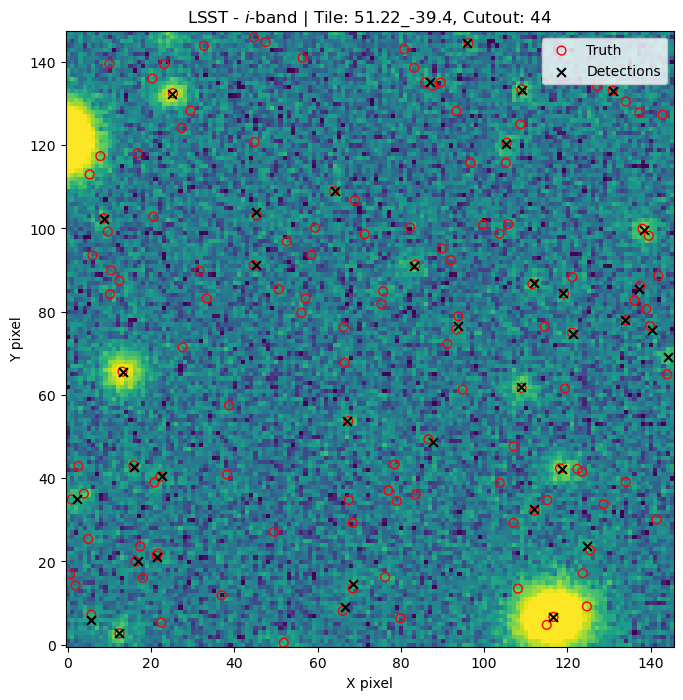


Plotting both LSST and Roman cutouts...


/tmp/ipykernel_1035187/2655576568.py:189: UserWarning: You passed a edgecolor/edgecolors ('r') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  axes[0].scatter(data['det_cat']['cutout_x'], data['det_cat']['cutout_y'], s=40, facecolors='none', edgecolors='r', c='k', marker='x', label='Detections')
/tmp/ipykernel_1035187/2655576568.py:204: UserWarning: You passed a edgecolor/edgecolors ('r') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  axes[1].scatter(data['roman_det']['cutout_x'], data['roman_det']['cutout_y'], s=40, c='k', facecolors='none', edgecolors='r', marker='x')


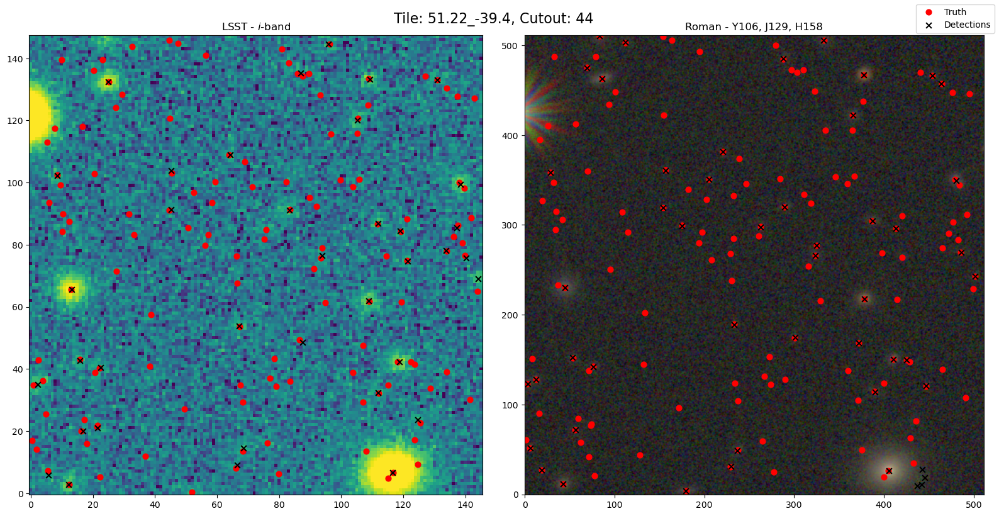


Verifying WCS for a specific cutout: Tile 51.22_-39.4, ID 44
Verifying WCS for Tile 51.22_-39.4, Cutout 44...

Comparing Truth Catalog Coords (first 5):
  Catalog XY  |  WCS-derived XY
  (56.05, 79.72) |  (56.05, 79.72)
  (105.41, 120.61) |  (105.41, 120.61)
  (106.99, 29.26) |  (106.99, 29.26)
  (105.78, 101.06) |  (105.78, 101.06)
  (141.42, 30.07) |  (141.42, 30.07)


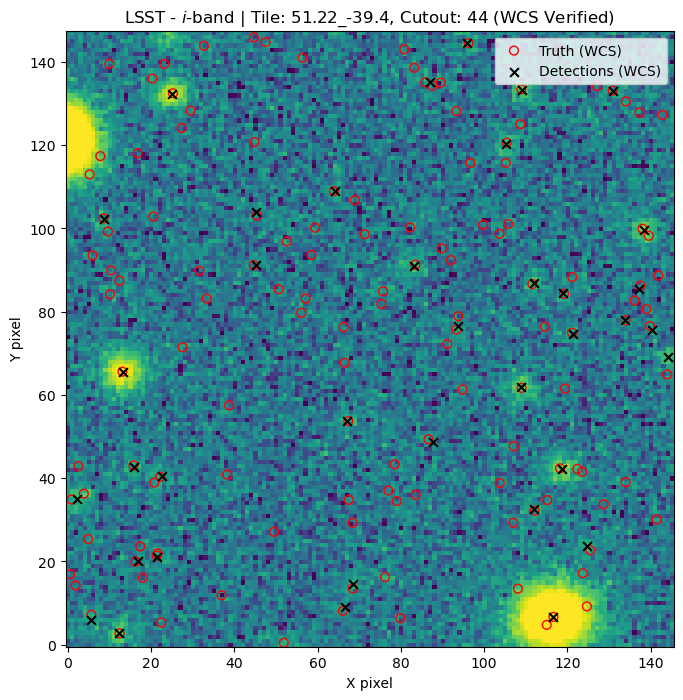

In [20]:
print("Fetching a random cutout...")
random_data = verifier.get_random_cutout()
if random_data:
    verifier.print_summary(random_data)
    
if random_data:
    print("\nPlotting the LSST cutout...")
    verifier.plot_cutout_lsst(random_data, band='i')

if random_data:
    print("\nPlotting both LSST and Roman cutouts...")
    verifier.plot_cutout_both(random_data, plot_catalogs=True)

# Verify the WCS for a specific cutout ---
# We use the tile and cutout ID from the random data we fetched
if random_data:
    tile_to_verify = random_data['tile']
    cutout_to_verify = random_data['cutout_id']
    print(f"\nVerifying WCS for a specific cutout: Tile {tile_to_verify}, ID {cutout_to_verify}")
    verifier.verify_wcs(tile=tile_to_verify, cutout_id=cutout_to_verify)